In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
import pandas as pd
import pathlib
from scipy import stats, optimize
from scipy.optimize import nnls

from tyssue.generation import generate_ring
from tyssue.draw.plt_draw import quick_edge_draw
from tyssue.solvers.sheet_vertex_solver import Solver
from tyssue.config.draw import sheet_spec
from tyssue.draw.plt_draw import sheet_view
from tyssue.io.hdf5 import save_datasets

from tyssue.dynamics.planar_gradients import area_grad
from tyssue_taylor.adjusters.adjust_annular import (prepare_tensions, adjust_tensions,
                                                    adjust_areas, adjust_scale, adjust_parameters)
from tyssue_taylor.models.annular import AnnularGeometry as geom
from tyssue_taylor.models.annular import model, lumen_area_grad
from tyssue_taylor.adjusters.cost_functions import _distance
from tyssue_taylor.segmentation.segment2D import generate_ring_from_image, normalize_scale
from tyssue_taylor.adjusters.force_inference import infer_forces, _coef_matrix, _right_side
from tyssue_taylor.models.display import (create_organo, print_tensions, rendering_results,
                                          rendering_convergence_results,
                                          plot_force_inference)

Error: IPOPT shared library failed to import


Using TensorFlow backend.


In [2]:
sym_org = generate_ring(20, 1, 2)


In [3]:
def create_organo(nb_cells, r_in, r_out, seed=None, rot=None, geom=geom):
    organo = generate_ring(nb_cells, r_in, r_out)
    Nf = organo.Nf
    geom.update_all(organo)
    alpha = 1 + 1/(20*(organo.settings['R_out']-organo.settings['R_in']))
    specs = {
        'face': {
            'is_alive': 1,
            'prefered_area': organo.face_df.area,
            'area_elasticity': 1., },
        'edge': {
            'ux': 0.,
            'uy': 0.,
            'uz': 0.,
            'line_tension': 0.1,
            'is_active': 1
            },
        'vert': {
            'adhesion_strength': 0.,
            'x_ecm': 0.,
            'y_ecm': 0.,
            'is_active': 1
            },
        'settings': {
            'lumen_elasticity': 0.1,
            'lumen_prefered_vol': organo.settings['lumen_volume'],
            'lumen_volume': organo.settings['lumen_volume']
            }
        }
    organo.update_specs(specs, reset=True)
    normalize_scale(organo, geom, refer='edges')
    geom.update_all(organo)
    if seed is not None:
        symetric_tensions = set_init_point(organo.settings['R_in'],
                                           organo.settings['R_out'],
                                           organo.Nf, alpha)
        sin_mul = 1+(np.sin(np.linspace(0, 2*np.pi, organo.Nf,
                                        endpoint=False)))**2
        organo.face_df.prefered_area *= np.random.normal(1.0, 0.05, organo.Nf)
        organo.edge_df.line_tension = prepare_tensions(organo,
                                                       symetric_tensions)
        organo.edge_df.loc[:Nf-1, 'line_tension'] *= sin_mul*np.random.normal(
            1.0, 0.05, organo.Nf)
        geom.update_all(organo)
    if rot is not None:
        organo.vert_df.loc[:, 'x'] = (organo.vert_df.x.copy() * np.cos(rot) -
                                      organo.vert_df.y.copy() * np.sin(rot))
        print('rotated x',
              organo.vert_df.x.copy() * np.cos(rot) -
              organo.vert_df.y.copy() * np.sin(rot))
        organo.vert_df.loc[:, 'y'] = (organo.vert_df.x.copy() * np.sin(rot) +
                                      organo.vert_df.y.copy() * np.cos(rot))
        print('rotated y',
              organo.vert_df.x.copy() * np.sin(rot) +
              organo.vert_df.y.copy() * np.cos(rot))
        geom.update_all(organo)
    organo.vert_df[['x_ecm', 'y_ecm']] = organo.vert_df[['x', 'y']]
    organo.vert_df.loc[organo.basal_verts, 'adhesion_strength'] = 0.01
    new_tensions = organo.edge_df.line_tension
    organo.edge_df.loc[:, 'line_tension'] = new_tensions
    return organo

Reseting datasets values with new specs


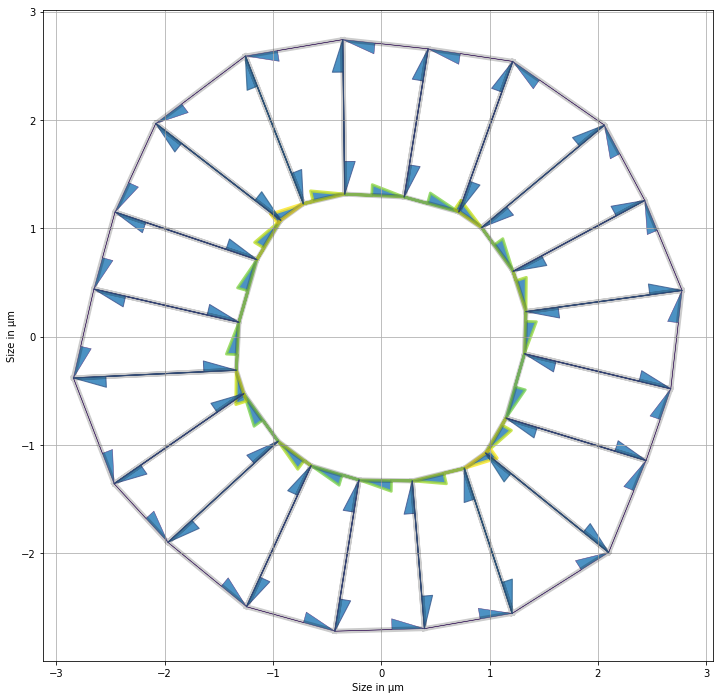

In [4]:
nf, r_in, r_out = (20, 1, 2)
seed = 1
organo3 = create_organo(nf, r_in, r_out)

organo3.edge_df.loc[organo3.apical_edges, 'line_tension'] = [
    0.101, 0.115, 0.126, 0.110, 0.105,
    0.102, 0.112, 0.102, 0.118, 0.105,
    0.104, 0.115, 0.127, 0.116, 0.106,
    0.103, 0.117, 0.105, 0.111, 0.107
]

organo3.edge_df.loc[organo3.basal_edges, 'line_tension'] = [
    0.01, 0.011, 0.012, 0.011, 0.01,
    0.01, 0.011, 0.01, 0.011, 0.01,
    0.01, 0.011, 0.012, 0.011, 0.01,
    0.01, 0.011, 0.01, 0.011, 0.01
]

organo3.edge_df.loc[organo3.lateral_edges, 'line_tension'] = np.array([
    0.03, 0.035, 0.04, 0.035, 0.03,
    0.03, 0.035, 0.03, 0.035, 0.03,
    0.03, 0.035, 0.04, 0.035, 0.03,
    0.03, 0.035, 0.03, 0.035, 0.03,
    0.03, 0.035, 0.04, 0.035, 0.03,
    0.03, 0.035, 0.03, 0.035, 0.03,
    0.03, 0.035, 0.04, 0.035, 0.03,
    0.03, 0.035, 0.03, 0.035, 0.03
])

organo3.face_df.loc[:, 'prefered_area'] = np.array([
    0.08, 0.07, 0.08, 0.09, 0.09,
    0.10, 0.09, 0.08, 0.09, 0.09,
    0.10, 0.11, 0.10, 0.11, 0.12,
    0.11, 0.10, 0.09, 0.08, 0.09
]) + organo3.face_df.area

geom.update_all(organo3)
Solver.find_energy_min(organo3, geom, model)
print_tensions(organo3, organo3)

In [5]:
real_data = np.concatenate((organo3.edge_df.line_tension[:3*organo3.Nf],
                            organo3.face_df.prefered_area - organo3.face_df.area,
                            [organo3.settings['lumen_prefered_vol']-
                             organo3.settings['lumen_volume']]))
print(organo3.edge_df.line_tension, '\n',
      organo3.face_df.prefered_area - organo3.face_df.area)

edge
0     0.101
1     0.115
2     0.126
3     0.110
4     0.105
5     0.102
6     0.112
7     0.102
8     0.118
9     0.105
10    0.104
11    0.115
12    0.127
13    0.116
14    0.106
15    0.103
16    0.117
17    0.105
18    0.111
19    0.107
20    0.010
21    0.011
22    0.012
23    0.011
24    0.010
25    0.010
26    0.011
27    0.010
28    0.011
29    0.010
      ...  
50    0.030
51    0.035
52    0.040
53    0.035
54    0.030
55    0.030
56    0.035
57    0.030
58    0.035
59    0.030
60    0.030
61    0.035
62    0.040
63    0.035
64    0.030
65    0.030
66    0.035
67    0.030
68    0.035
69    0.030
70    0.030
71    0.035
72    0.040
73    0.035
74    0.030
75    0.030
76    0.035
77    0.030
78    0.035
79    0.030
Name: line_tension, Length: 80, dtype: float64 
 face
0     0.037466
1     0.042980
2     0.047452
3     0.041083
4     0.039120
5     0.037130
6     0.042399
7     0.037119
8     0.043188
9     0.038093
10    0.038654
11    0.042510
12    0.047137
13    0.042130

In [6]:
energy_opt = {'options': {'gtol': 1e-5, 'ftol': 1e-5}}


bfgs_opt = {'method': 'bfgs','options': {'gtol':1e-1,'ftol': 1e-5}}
trf_opt = {'bounds': ([-1e-8]*(3*organo3.Nf),[1000]*(3*organo3.Nf)), 
           'method': 'trf','xtol':1e-5,'ftol': 1e-3, 'verbose': 2}
lm_opt = {'method': 'lm','xtol':1e-5,'ftol': 1e-3, 'verbose': 1}
psqp_opt = {'lb': 0, 'ub': 1e6, 'method': 'dist_PSQP', #'callback': printx,
            'output_path': './PSQP_eq_cst_per_cell.out'}
nm_opt = {'method':'Nelder-Mead', 'options': {'disp': True, 'maxiter': 1e9, 'maxfev': 1e15}}

reg_weight = 1e-3
theta = 0.02

In [7]:
def get_sim_mat(Nf, Ra, Rb, sum_lbda=1e-2):

    sin_t = np.sin(np.pi/Nf)
    sin_2t = np.sin(2*np.pi/Nf)

    A = 0.5 * (Rb**2 - Ra**2) * sin_2t
    dAdRa = - sin_2t * Ra
    dAdRb = sin_2t * Rb
    dladRa = dlbdRb = 2*sin_t

    # variables are
    # (A - A_0), \Lambda_a, \Lambda_h
    problem_mat = np.array(
        [
            [dAdRa, dladRa, -1],
            [dAdRb, 0,       1],
            [0,     1,       1]
        ])

    b = np.array([0, 0, sum_lbda])
    return problem_mat, b

In [8]:
params_in_sym_mesh = np.linalg.solve(*get_sim_mat(nf, r_in, r_out))

In [9]:
params_in_sym_mesh

array([-0.00622773,  0.00615105,  0.00384895])

Maintenant on connait les paramètres dans l'organoïde régulier. Il s'agit maintenant de calculer la déformation entre les cellules de l'organoïde régulier et les cellules de l'organoïde réel.

In [9]:
organo3.get_extra_indices()
non_lateral_edges = np.concatenate((organo3.apical_edges,
                                    organo3.basal_edges))
sym_height = (r_out-r_in)*np.cos(np.pi/organo3.Nf)
polar_coefs = np.ones(organo3.Nf)
for cell in range(organo3.Nf):
    parrallel_edges = (organo3.edge_df.loc[non_lateral_edges, ('srce', 'trgt')]
                       [organo3.edge_df.face == cell]).values
    apical_middle = organo3.vert_df.loc[parrallel_edges[0, :], ('x', 'y')].sum()/2
    basal_middle = organo3.vert_df.loc[parrallel_edges[1, :], ('x', 'y')].sum()/2
    cell_height = np.linalg.norm(apical_middle - basal_middle)
    polar_coefs[cell] = cell_height/sym_height
polar_coefs

/home/felix/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


array([1.38680545, 1.39720938, 1.39441585, 1.39709666, 1.39832084,
       1.42797119, 1.3959597 , 1.43345176, 1.44201388, 1.44398528,
       1.392824  , 1.41778809, 1.42702144, 1.43985784, 1.4182954 ,
       1.44300866, 1.44280479, 1.43956153, 1.41285569, 1.41541343])

Et maintenant on fixe la constante par cellule selon les paramètres dans l'organoïde symétrique et le coefficient de polarisation

[0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654, 0.021433658384297654]
[0.02972431 0.02994731 0.02988743 0.02994489 0.02997113 0.03060665
 0.02992052 0.03072412 0.03090763 0.03094989 0.02985331 0.03038839
 0.03058629 0.03086142 0.03039926 0.03092895 0.03092459 0.03085507
 0.03028267 0.03033749]
Apical tensions:  [0.0298147  0.03102859 0.03090145 0.02975578 0.03009275 0.02993051
 0.02989625 0.02965492 0.03153079 0.03038501 0.03010137 0.03092335
 0.03132409 0.03078488 0.03053737 0.03062762 0.03130779 0.03004165
 0.030368   0.03037362] 
Basal tensions:  [0.00289728 0.00150751 0.         0.00166469 0.00266555 0.00323206
 0.001

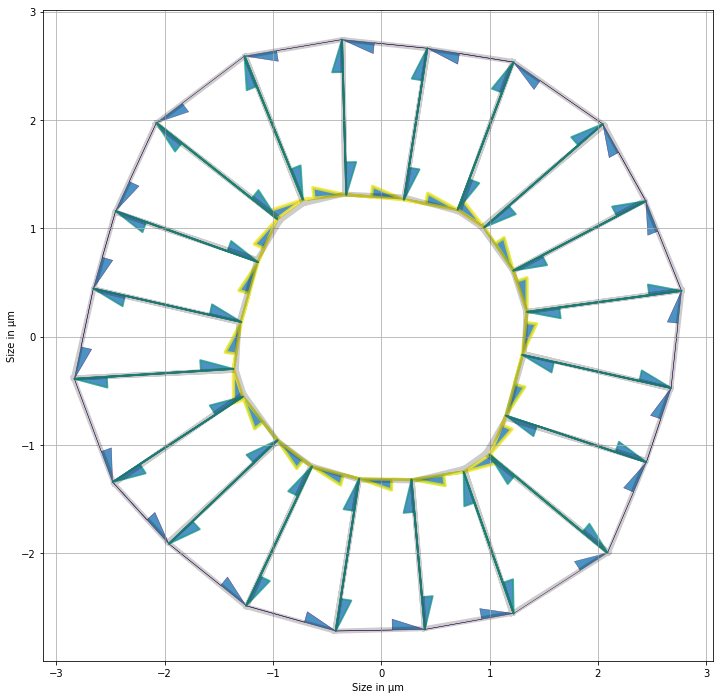

In [10]:
matrix = _coef_matrix(organo3, sup_param='areas')
constant = _right_side(organo3, matrix)
avg_cste = [4*((params_in_sym_mesh[1:].sum()+params_in_sym_mesh[-1])/3 /
               (organo3.face_df.area.mean() + params_in_sym_mesh[0])**1.5)]*organo3.Nf
print(avg_cste)
avg_cste = np.multiply(np.array(avg_cste), polar_coefs)
print(avg_cste)
for i in range(organo3.Nf):
    i_cell_line = np.zeros(4*organo3.Nf+1)
    index = np.squeeze(np.argwhere(organo3.edge_df.face.values == i)[:-1])
    i_cell_line[index] = 1
    matrix = np.vstack((matrix, i_cell_line))
constant = np.concatenate((constant, avg_cste))
mat_eq_cst, residuals = nnls(matrix, constant)
organo3_eq_cst = organo3.copy()
organo3_eq_cst.edge_df.loc[:, 'line_tension'] = prepare_tensions(organo3_eq_cst,
                                                                 mat_eq_cst[:3*organo3.Nf])
organo3_eq_cst.face_df.loc[:, 'prefered_area'] = organo3_eq_cst.face_df.area + mat_eq_cst[3*organo3.Nf:
                                                                                          4*organo3.Nf]
organo3_eq_cst.settings['lumen_prefered_vol'] = organo3_eq_cst.settings['lumen_volume'] + mat_eq_cst[-1]
Solver.find_energy_min(organo3_eq_cst, geom, model)
print_tensions(organo3_eq_cst, organo3)
print('Apical tensions: ', mat_eq_cst[organo3.apical_edges],
      '\nBasal tensions: ', mat_eq_cst[organo3.basal_edges],
      '\nLateral tensions: ', mat_eq_cst[organo3.lateral_edges[:organo3.Nf]],
      '\nArea elasticity: ', mat_eq_cst[organo3.Nf*3:-1],
      '\nLumen area elasticity: ', mat_eq_cst[-1],
      '\nDistance to solution: ', np.linalg.norm(real_data-mat_eq_cst),
      '\nNNLS residuals: ', residuals)

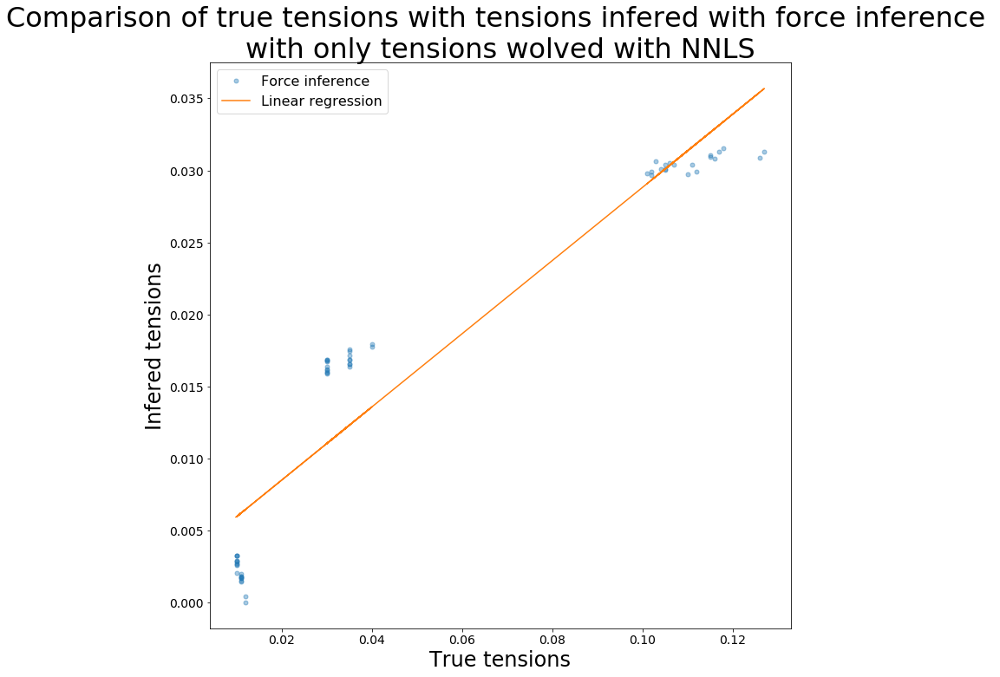

R value : 0.942491839225785 
Standard error : 0.0033556103685508532


In [11]:
rendering_results(organo3, organo3.edge_df.line_tension[:3*organo3.Nf],
                  mat_eq_cst[:3*organo3.Nf],
                  'Comparison of true tensions with tensions infered with force inference \n' +
                  'with only tensions wolved with NNLS',
                  'True tensions', 'Infered tensions', ('Force inference', 'Linear regression'))

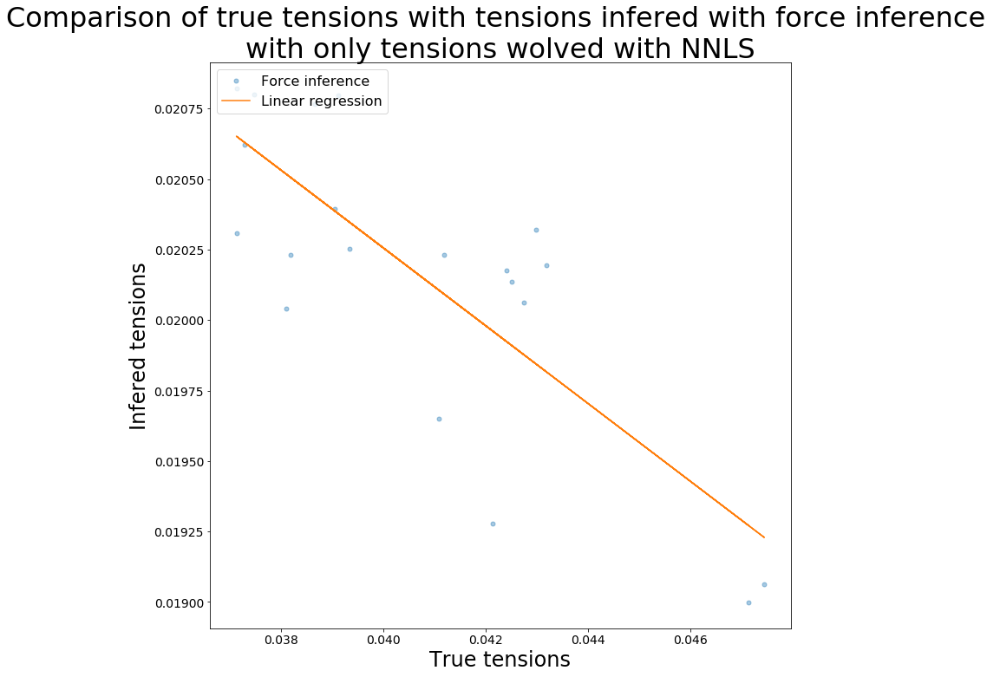

R value : -0.7901047681588707 
Standard error : 0.00016173231524875892


In [12]:
rendering_results(organo3, organo3.face_df.eval('prefered_area-area'),
                  mat_eq_cst[3*organo3.Nf:-1],
                  'Comparison of true tensions with tensions infered with force inference \n' +
                  'with only tensions wolved with NNLS',
                  'True tensions', 'Infered tensions', ('Force inference', 'Linear regression'))

In [13]:
iprint_file = "../../assets/dist_at_each_f_ev/10_03_eq_t_per_cell_areas_opt_with_sym_org_params.txt"
to_opt_organo = organo3.copy()
init_point_area_and_tensions_opt = np.concatenate((prepare_tensions(to_opt_organo, mat_eq_cst[:3*organo3.Nf]),
                                                   to_opt_organo.face_df.area + mat_eq_cst[3*organo3.Nf:-1],
                                                   [to_opt_organo.settings['lumen_volume'] + mat_eq_cst[-1]]))
res_2_cst_areas = adjust_parameters(to_opt_organo,
                                    init_point_area_and_tensions_opt,
                                    {'dic':{'apical' : False, 'basal': False}, 'weight':0},
                                    energy_min_opt=energy_opt,
                                    **lm_opt)

0.6720275310228812 [0.01923604 0.02094468 0.04370871 0.03631729 0.01140217 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906798 0.0227922
 0.03781635 0.04100452 0.01425567 0.02204674 0.02497219 0.02583452
 0.00871158 0.0142879  0.00798051 0.01664474 0.01103165 0.0141155
 0.00963819 0.00765399 0.00837893 0.01526393 0.02000007 0.01061584
 0.00791387 0.01072094 0.00837675 0.00840592 0.00783721 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478562 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.6720275323542046 [0.01923604 0.02094468 0.04370871 0.03631729 0.01140217 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906798 0.0227922
 0.03781635 0.04100452 0.01425567 0.02204674 0.02497219 0.02583452
 0.00871158 0.0142879  0.00798051 0.01664474 0.01103165 0.0141155
 0.00963819 0.00765399 0.00837893 0.01526393 0.02000007 0.01061584
 0.00791387 0.01072094 0.00837675 0.00840592 0.00783721 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478562 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.6720275306698472 [0.01923604 0.02094468 0.04370871 0.03631729 0.01140217 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906798 0.0227922
 0.03781635 0.04100452 0.01425567 0.02204674 0.02497219 0.02583452
 0.00871158 0.0142879  0.00798051 0.01664474 0.01103165 0.0141155
 0.00963819 0.00765399 0.00837893 0.01526393 0.02000007 0.01061584
 0.00791388 0.01072094 0.00837675 0.00840592 0.00783721 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478561 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.6720275355164129 [0.01923604 0.02094468 0.04370871 0.03631729 0.01140217 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906798 0.0227922
 0.03781635 0.04100452 0.01425567 0.02204674 0.02497219 0.02583452
 0.00871158 0.0142879  0.00798051 0.01664474 0.01103165 0.0141155
 0.00963819 0.00765399 0.00837893 0.01526393 0.02000007 0.01061584
 0.00791387 0.01072094 0.00837675 0.00840592 0.00783721 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478562 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.672027531095081 [0.01923604 0.02094468 0.04370871 0.03631729 0.01140217 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906798 0.0227922
 0.03781635 0.04100452 0.01425567 0.02204674 0.02497219 0.02583452
 0.00871158 0.0142879  0.00798051 0.01664474 0.01103165 0.0141155
 0.00963819 0.00765399 0.00837893 0.01526393 0.02000007 0.01061584
 0.00791387 0.01072094 0.00837675 0.00840592 0.00783721 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478562 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.6720275293928519 [0.01923604 0.02094468 0.04370871 0.03631729 0.01140217 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906798 0.0227922
 0.03781635 0.04100452 0.01425567 0.02204674 0.02497219 0.02583452
 0.00871158 0.0142879  0.00798051 0.01664474 0.01103165 0.0141155
 0.00963819 0.00765399 0.00837893 0.01526393 0.02000007 0.01061584
 0.00791387 0.01072094 0.00837675 0.00840592 0.00783721 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478562 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.6720275310557501 [0.01923604 0.02094468 0.04370871 0.03631729 0.01140217 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906798 0.0227922
 0.03781635 0.04100452 0.01425567 0.02204674 0.02497219 0.02583452
 0.00871158 0.0142879  0.00798051 0.01664474 0.01103165 0.0141155
 0.00963819 0.00765399 0.00837893 0.01526393 0.02000007 0.01061584
 0.00791387 0.01072094 0.00837675 0.00840592 0.00783721 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478562 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.6720275315262884 [0.01923604 0.02094468 0.04370871 0.03631729 0.01140217 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906798 0.0227922
 0.03781635 0.04100452 0.01425567 0.02204674 0.02497219 0.02583452
 0.00871158 0.0142879  0.00798051 0.01664474 0.01103165 0.0141155
 0.00963819 0.00765399 0.00837893 0.01526393 0.02000007 0.01061584
 0.00791387 0.01072094 0.00837675 0.00840592 0.00783721 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478562 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.6720275285671379 [0.01923604 0.02094468 0.04370871 0.03631729 0.01140217 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906798 0.0227922
 0.03781635 0.04100452 0.01425567 0.02204674 0.02497219 0.02583452
 0.00871158 0.0142879  0.00798051 0.01664474 0.01103165 0.0141155
 0.0096382  0.00765399 0.00837893 0.01526393 0.02000007 0.01061584
 0.00791387 0.01072094 0.00837675 0.00840592 0.00783721 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478562 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.6720275317012959 [0.01923604 0.02094468 0.04370871 0.03631729 0.01140217 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906798 0.0227922
 0.03781635 0.04100452 0.01425567 0.02204674 0.02497219 0.02583452
 0.00871158 0.0142879  0.00798051 0.01664474 0.01103165 0.0141155
 0.00963819 0.00765399 0.00837893 0.01526393 0.02000007 0.01061584
 0.00791388 0.01072094 0.00837675 0.00840592 0.00783721 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478562 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.6720275354128937 [0.01923604 0.02094468 0.04370871 0.03631729 0.01140217 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906798 0.0227922
 0.03781635 0.04100452 0.01425567 0.02204674 0.02497219 0.02583452
 0.00871158 0.0142879  0.00798051 0.01664474 0.01103165 0.0141155
 0.00963819 0.00765399 0.00837893 0.01526393 0.02000007 0.01061584
 0.00791387 0.01072094 0.00837675 0.00840592 0.00783721 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478561 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.6720275310228812 [0.01923604 0.02094468 0.04370871 0.03631729 0.01140217 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906798 0.0227922
 0.03781635 0.04100452 0.01425567 0.02204674 0.02497219 0.02583452
 0.00871158 0.0142879  0.00798051 0.01664474 0.01103165 0.0141155
 0.00963819 0.00765399 0.00837893 0.01526393 0.02000007 0.01061584
 0.00791387 0.01072094 0.00837675 0.00840592 0.00783721 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478562 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.6720275310228812 [0.01923604 0.02094468 0.04370871 0.03631729 0.01140217 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906798 0.0227922
 0.03781635 0.04100452 0.01425567 0.02204674 0.02497219 0.02583452
 0.00871158 0.0142879  0.00798051 0.01664474 0.01103165 0.0141155
 0.00963819 0.00765399 0.00837893 0.01526393 0.02000007 0.01061584
 0.00791387 0.01072094 0.00837675 0.00840592 0.00783721 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478562 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.6720275310228812 [0.01923604 0.02094468 0.04370871 0.03631729 0.01140217 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906798 0.0227922
 0.03781635 0.04100452 0.01425567 0.02204674 0.02497219 0.02583452
 0.00871158 0.0142879  0.00798051 0.01664474 0.01103165 0.0141155
 0.00963819 0.00765399 0.00837893 0.01526393 0.02000007 0.01061584
 0.00791387 0.01072094 0.00837675 0.00840592 0.00783721 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478562 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.6720276514064979 [0.01923604 0.02094469 0.04370871 0.0363173  0.01140218 0.00718591
 0.01231069 0.00979133 0.03026607 0.0327711  0.01906799 0.02279221
 0.03781635 0.04100453 0.01425567 0.02204675 0.02497219 0.02583452
 0.00871158 0.0142879  0.00798051 0.01664474 0.01103165 0.0141155
 0.0096382  0.00765399 0.00837894 0.01526393 0.02000008 0.01061584
 0.00791388 0.01072094 0.00837675 0.00840593 0.00783722 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478561 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6720276967372463 [0.01923604 0.02094469 0.04370872 0.0363173  0.01140218 0.00718591
 0.01231069 0.00979132 0.03026606 0.03277111 0.01906799 0.02279221
 0.03781636 0.04100454 0.01425567 0.02204675 0.02497219 0.02583452
 0.00871158 0.01428791 0.00798051 0.01664474 0.01103165 0.0141155
 0.0096382  0.00765399 0.00837893 0.01526393 0.02000008 0.01061584
 0.00791388 0.01072094 0.00837675 0.00840593 0.00783722 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478561 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6720276039083656 [0.01923604 0.02094468 0.04370872 0.0363173  0.01140218 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906799 0.02279221
 0.03781635 0.04100453 0.01425568 0.02204674 0.02497219 0.02583452
 0.00871158 0.01428791 0.00798051 0.01664474 0.01103165 0.0141155
 0.0096382  0.00765399 0.00837893 0.01526392 0.02000007 0.01061584
 0.00791388 0.01072093 0.00837675 0.00840593 0.00783721 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478561 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.672027597013364 [0.01923605 0.02094469 0.04370871 0.0363173  0.01140218 0.00718591
 0.01231069 0.00979133 0.03026606 0.0327711  0.01906799 0.02279221
 0.03781635 0.04100453 0.01425567 0.02204674 0.02497219 0.02583452
 0.00871158 0.0142879  0.0079805  0.01664474 0.01103165 0.0141155
 0.0096382  0.00765399 0.00837894 0.01526393 0.02000008 0.01061584
 0.00791388 0.01072094 0.00837675 0.00840592 0.00783722 0.00992943
 0.00890126 0.01744331 0.01166624 0.00478561 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.48206818179128136 [1.12360421e-02 9.99200199e-03 3.09503740e-02 2.34304058e-02
 8.67323029e-03 4.29285964e-03 1.10320736e-02 4.92818422e-03
 1.70379983e-02 2.50114547e-02 1.31896911e-02 1.33036279e-02
 2.82695477e-02 3.25754018e-02 7.60464367e-03 1.36467142e-02
 1.63464814e-02 1.64810003e-02 6.47987830e-03 1.41363254e-02
 3.40420130e-03 1.54357884e-02 1.82481224e-02 1.34783789e-02
 1.61830168e-02 3.12920114e-03 2.49612159e-03 9.16192685e-04
 1.25262375e-02 5.63947347e-03 2.34394426e-03 1.31976581e-02
 1.41042367e-02 1.27822667e-02 1.26050524e-02 7.38412195e-03
 5.96901818e-03 5.43208228e-03 5.80613063e-03 2.36854168e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.48206818471098034 [1.12360420e-02 9.99200433e-03 3.09503745e-02 2.34304061e-02
 8.67323076e-03 4.29285802e-03 1.10320733e-02 4.92818395e-03
 1.70379984e-02 2.50114548e-02 1.31896911e-02 1.33036279e-02
 2.82695478e-02 3.25754018e-02 7.60464367e-03 1.36467142e-02
 1.63464814e-02 1.64810003e-02 6.47987826e-03 1.41363253e-02
 3.40420136e-03 1.54357903e-02 1.82481210e-02 1.34783791e-02
 1.61830163e-02 3.12920171e-03 2.49612274e-03 9.16192055e-04
 1.25262373e-02 5.63947346e-03 2.34394424e-03 1.31976581e-02
 1.41042367e-02 1.27822667e-02 1.26050524e-02 7.38412195e-03
 5.96901819e-03 5.43208231e-03 5.80613071e-03 2.36854186e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4820681905995909 [1.12360420e-02 9.99200437e-03 3.09503746e-02 2.34304061e-02
 8.67323048e-03 4.29285961e-03 1.10320736e-02 4.92818434e-03
 1.70379981e-02 2.50114548e-02 1.31896916e-02 1.33036282e-02
 2.82695479e-02 3.25754019e-02 7.60464368e-03 1.36467143e-02
 1.63464814e-02 1.64810003e-02 6.47987826e-03 1.41363254e-02
 3.40420139e-03 1.54357904e-02 1.82481211e-02 1.34783794e-02
 1.61830167e-02 3.12920110e-03 2.49612168e-03 9.16192568e-04
 1.25262373e-02 5.63947494e-03 2.34394582e-03 1.31976582e-02
 1.41042366e-02 1.27822667e-02 1.26050524e-02 7.38412199e-03
 5.96901819e-03 5.43208232e-03 5.80613071e-03 2.36854184e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.48206818276434604 [1.12360420e-02 9.99200435e-03 3.09503745e-02 2.34304060e-02
 8.67323044e-03 4.29285962e-03 1.10320735e-02 4.92818422e-03
 1.70379984e-02 2.50114548e-02 1.31896910e-02 1.33036278e-02
 2.82695475e-02 3.25754012e-02 7.60464164e-03 1.36467141e-02
 1.63464815e-02 1.64810003e-02 6.47987827e-03 1.41363253e-02
 3.40420138e-03 1.54357903e-02 1.82481211e-02 1.34783793e-02
 1.61830166e-02 3.12920109e-03 2.49612161e-03 9.16192682e-04
 1.25262375e-02 5.63947345e-03 2.34394434e-03 1.31976583e-02
 1.41042364e-02 1.27822678e-02 1.26050505e-02 7.38412262e-03
 5.96901797e-03 5.43208230e-03 5.80613068e-03 2.36854183e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4820681871043337 [1.12360420e-02 9.99200442e-03 3.09503746e-02 2.34304061e-02
 8.67323047e-03 4.29285964e-03 1.10320735e-02 4.92818421e-03
 1.70379984e-02 2.50114548e-02 1.31896911e-02 1.33036280e-02
 2.82695478e-02 3.25754019e-02 7.60464375e-03 1.36467143e-02
 1.63464812e-02 1.64810003e-02 6.47987729e-03 1.41363252e-02
 3.40420155e-03 1.54357903e-02 1.82481211e-02 1.34783794e-02
 1.61830167e-02 3.12920110e-03 2.49612162e-03 9.16192679e-04
 1.25262376e-02 5.63947348e-03 2.34394428e-03 1.31976582e-02
 1.41042367e-02 1.27822667e-02 1.26050524e-02 7.38412199e-03
 5.96901795e-03 5.43208391e-03 5.80613092e-03 2.36854131e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.482068186387933 [1.12360421e-02 9.99200443e-03 3.09503745e-02 2.34304060e-02
 8.67323047e-03 4.29285965e-03 1.10320735e-02 4.92818418e-03
 1.70379983e-02 2.50114547e-02 1.31896912e-02 1.33036280e-02
 2.82695477e-02 3.25754018e-02 7.60464370e-03 1.36467143e-02
 1.63464814e-02 1.64810003e-02 6.47987821e-03 1.41363253e-02
 3.40420139e-03 1.54357904e-02 1.82481210e-02 1.34783793e-02
 1.61830167e-02 3.12920111e-03 2.49612162e-03 9.16192658e-04
 1.25262375e-02 5.63947345e-03 2.34394429e-03 1.31976582e-02
 1.41042367e-02 1.27822667e-02 1.26050524e-02 7.38412200e-03
 5.96901816e-03 5.43208229e-03 5.80613067e-03 2.36854180e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.4820681859332556 [1.12360421e-02 9.99200435e-03 3.09503745e-02 2.34304060e-02
 8.67323048e-03 4.29285988e-03 1.10320734e-02 4.92818418e-03
 1.70379983e-02 2.50114547e-02 1.31896912e-02 1.33036280e-02
 2.82695477e-02 3.25754018e-02 7.60464370e-03 1.36467143e-02
 1.63464814e-02 1.64810003e-02 6.47987821e-03 1.41363253e-02
 3.40420139e-03 1.54357903e-02 1.82481211e-02 1.34783793e-02
 1.61830166e-02 3.12920091e-03 2.49612137e-03 9.16192652e-04
 1.25262375e-02 5.63947346e-03 2.34394429e-03 1.31976582e-02
 1.41042367e-02 1.27822667e-02 1.26050524e-02 7.38412199e-03
 5.96901816e-03 5.43208230e-03 5.80613068e-03 2.36854181e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.48206818577817206 [1.12360421e-02 9.99200435e-03 3.09503745e-02 2.34304060e-02
 8.67323047e-03 4.29285965e-03 1.10320735e-02 4.92818418e-03
 1.70379983e-02 2.50114547e-02 1.31896912e-02 1.33036280e-02
 2.82695477e-02 3.25754018e-02 7.60464369e-03 1.36467143e-02
 1.63464814e-02 1.64810002e-02 6.47987821e-03 1.41363253e-02
 3.40420139e-03 1.54357903e-02 1.82481211e-02 1.34783793e-02
 1.61830167e-02 3.12920111e-03 2.49612162e-03 9.16192658e-04
 1.25262375e-02 5.63947326e-03 2.34394405e-03 1.31976582e-02
 1.41042367e-02 1.27822667e-02 1.26050524e-02 7.38412199e-03
 5.96901816e-03 5.43208230e-03 5.80613067e-03 2.36854181e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4820681865702443 [1.12360421e-02 9.99200435e-03 3.09503745e-02 2.34304060e-02
 8.67323048e-03 4.29285965e-03 1.10320735e-02 4.92818418e-03
 1.70379983e-02 2.50114547e-02 1.31896912e-02 1.33036280e-02
 2.82695478e-02 3.25754018e-02 7.60464381e-03 1.36467143e-02
 1.63464814e-02 1.64810003e-02 6.47987821e-03 1.41363253e-02
 3.40420139e-03 1.54357903e-02 1.82481211e-02 1.34783793e-02
 1.61830167e-02 3.12920112e-03 2.49612162e-03 9.16192658e-04
 1.25262375e-02 5.63947346e-03 2.34394429e-03 1.31976582e-02
 1.41042367e-02 1.27822666e-02 1.26050525e-02 7.38412201e-03
 5.96901816e-03 5.43208230e-03 5.80613067e-03 2.36854181e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4820681860074762 [1.12360420e-02 9.99200435e-03 3.09503745e-02 2.34304060e-02
 8.67323047e-03 4.29285965e-03 1.10320735e-02 4.92818418e-03
 1.70379983e-02 2.50114547e-02 1.31896912e-02 1.33036280e-02
 2.82695477e-02 3.25754018e-02 7.60464370e-03 1.36467143e-02
 1.63464814e-02 1.64810001e-02 6.47987820e-03 1.41363253e-02
 3.40420141e-03 1.54357903e-02 1.82481211e-02 1.34783793e-02
 1.61830167e-02 3.12920111e-03 2.49612162e-03 9.16192660e-04
 1.25262375e-02 5.63947346e-03 2.34394429e-03 1.31976582e-02
 1.41042367e-02 1.27822667e-02 1.26050524e-02 7.38412199e-03
 5.96901817e-03 5.43208203e-03 5.80613079e-03 2.36854179e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4820681940675977 [1.12360423e-02 9.99200537e-03 3.09503746e-02 2.34304061e-02
 8.67323075e-03 4.29285976e-03 1.10320734e-02 4.92818409e-03
 1.70379983e-02 2.50114548e-02 1.31896915e-02 1.33036283e-02
 2.82695479e-02 3.25754020e-02 7.60464381e-03 1.36467147e-02
 1.63464814e-02 1.64810002e-02 6.47987802e-03 1.41363251e-02
 3.40420167e-03 1.54357918e-02 1.82481227e-02 1.34783796e-02
 1.61830167e-02 3.12920117e-03 2.49612169e-03 9.16192597e-04
 1.25262376e-02 5.63947344e-03 2.34394435e-03 1.31976584e-02
 1.41042368e-02 1.27822667e-02 1.26050525e-02 7.38412214e-03
 5.96901815e-03 5.43208237e-03 5.80613082e-03 2.36854216e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4820681882121683 [1.12360422e-02 9.99200438e-03 3.09503744e-02 2.34304058e-02
 8.67322979e-03 4.29285839e-03 1.10320730e-02 4.92818419e-03
 1.70379982e-02 2.50114547e-02 1.31896913e-02 1.33036281e-02
 2.82695477e-02 3.25754017e-02 7.60464374e-03 1.36467145e-02
 1.63464813e-02 1.64810002e-02 6.47987811e-03 1.41363252e-02
 3.40420143e-03 1.54357903e-02 1.82481211e-02 1.34783798e-02
 1.61830176e-02 3.12920346e-03 2.49612176e-03 9.16193035e-04
 1.25262377e-02 5.63947344e-03 2.34394433e-03 1.31976582e-02
 1.41042367e-02 1.27822666e-02 1.26050524e-02 7.38412206e-03
 5.96901812e-03 5.43208227e-03 5.80613064e-03 2.36854176e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4820681853464415 [1.12360420e-02 9.99200428e-03 3.09503743e-02 2.34304058e-02
 8.67323043e-03 4.29285969e-03 1.10320734e-02 4.92818382e-03
 1.70379986e-02 2.50114572e-02 1.31896914e-02 1.33036279e-02
 2.82695475e-02 3.25754016e-02 7.60464367e-03 1.36467143e-02
 1.63464812e-02 1.64810001e-02 6.47987813e-03 1.41363252e-02
 3.40420138e-03 1.54357903e-02 1.82481209e-02 1.34783792e-02
 1.61830166e-02 3.12920110e-03 2.49612147e-03 9.16192901e-04
 1.25262379e-02 5.63947143e-03 2.34394476e-03 1.31976582e-02
 1.41042368e-02 1.27822666e-02 1.26050523e-02 7.38412197e-03
 5.96901811e-03 5.43208225e-03 5.80613062e-03 2.36854177e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.48206818185484746 [1.12360420e-02 9.99200424e-03 3.09503742e-02 2.34304058e-02
 8.67323038e-03 4.29285962e-03 1.10320734e-02 4.92818410e-03
 1.70379981e-02 2.50114544e-02 1.31896911e-02 1.33036281e-02
 2.82695478e-02 3.25754042e-02 7.60464445e-03 1.36467145e-02
 1.63464811e-02 1.64810001e-02 6.47987811e-03 1.41363251e-02
 3.40420136e-03 1.54357902e-02 1.82481209e-02 1.34783792e-02
 1.61830165e-02 3.12920109e-03 2.49612160e-03 9.16192640e-04
 1.25262374e-02 5.63947344e-03 2.34394413e-03 1.31976576e-02
 1.41042372e-02 1.27822640e-02 1.26050512e-02 7.38412146e-03
 5.96901827e-03 5.43208223e-03 5.80613062e-03 2.36854178e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4820681888567081 [1.12360423e-02 9.99200429e-03 3.09503744e-02 2.34304059e-02
 8.67323051e-03 4.29285970e-03 1.10320734e-02 4.92818411e-03
 1.70379982e-02 2.50114547e-02 1.31896913e-02 1.33036281e-02
 2.82695477e-02 3.25754017e-02 7.60464360e-03 1.36467145e-02
 1.63464818e-02 1.64810029e-02 6.47987807e-03 1.41363251e-02
 3.40420125e-03 1.54357904e-02 1.82481210e-02 1.34783793e-02
 1.61830167e-02 3.12920115e-03 2.49612165e-03 9.16192616e-04
 1.25262375e-02 5.63947342e-03 2.34394431e-03 1.31976582e-02
 1.41042367e-02 1.27822667e-02 1.26050525e-02 7.38412203e-03
 5.96901855e-03 5.43208069e-03 5.80613157e-03 2.36854213e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4820681863603778 [1.12360421e-02 9.99200435e-03 3.09503745e-02 2.34304060e-02
 8.67323048e-03 4.29285965e-03 1.10320735e-02 4.92818418e-03
 1.70379983e-02 2.50114547e-02 1.31896912e-02 1.33036280e-02
 2.82695477e-02 3.25754018e-02 7.60464370e-03 1.36467143e-02
 1.63464814e-02 1.64810003e-02 6.47987821e-03 1.41363253e-02
 3.40420139e-03 1.54357903e-02 1.82481211e-02 1.34783793e-02
 1.61830167e-02 3.12920112e-03 2.49612162e-03 9.16192657e-04
 1.25262375e-02 5.63947345e-03 2.34394429e-03 1.31976582e-02
 1.41042367e-02 1.27822667e-02 1.26050524e-02 7.38412200e-03
 5.96901816e-03 5.43208230e-03 5.80613067e-03 2.36854181e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4820681863603778 [1.12360421e-02 9.99200435e-03 3.09503745e-02 2.34304060e-02
 8.67323048e-03 4.29285965e-03 1.10320735e-02 4.92818418e-03
 1.70379983e-02 2.50114547e-02 1.31896912e-02 1.33036280e-02
 2.82695477e-02 3.25754018e-02 7.60464370e-03 1.36467143e-02
 1.63464814e-02 1.64810003e-02 6.47987821e-03 1.41363253e-02
 3.40420139e-03 1.54357903e-02 1.82481211e-02 1.34783793e-02
 1.61830167e-02 3.12920112e-03 2.49612162e-03 9.16192657e-04
 1.25262375e-02 5.63947345e-03 2.34394429e-03 1.31976582e-02
 1.41042367e-02 1.27822667e-02 1.26050524e-02 7.38412200e-03
 5.96901816e-03 5.43208230e-03 5.80613067e-03 2.36854181e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4820681863603778 [1.12360421e-02 9.99200435e-03 3.09503745e-02 2.34304060e-02
 8.67323048e-03 4.29285965e-03 1.10320735e-02 4.92818418e-03
 1.70379983e-02 2.50114547e-02 1.31896912e-02 1.33036280e-02
 2.82695477e-02 3.25754018e-02 7.60464370e-03 1.36467143e-02
 1.63464814e-02 1.64810003e-02 6.47987821e-03 1.41363253e-02
 3.40420139e-03 1.54357903e-02 1.82481211e-02 1.34783793e-02
 1.61830167e-02 3.12920112e-03 2.49612162e-03 9.16192657e-04
 1.25262375e-02 5.63947345e-03 2.34394429e-03 1.31976582e-02
 1.41042367e-02 1.27822667e-02 1.26050524e-02 7.38412200e-03
 5.96901816e-03 5.43208230e-03 5.80613067e-03 2.36854181e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4820681863603778 [1.12360421e-02 9.99200435e-03 3.09503745e-02 2.34304060e-02
 8.67323048e-03 4.29285965e-03 1.10320735e-02 4.92818418e-03
 1.70379983e-02 2.50114547e-02 1.31896912e-02 1.33036280e-02
 2.82695477e-02 3.25754018e-02 7.60464370e-03 1.36467143e-02
 1.63464814e-02 1.64810003e-02 6.47987821e-03 1.41363253e-02
 3.40420139e-03 1.54357903e-02 1.82481211e-02 1.34783793e-02
 1.61830167e-02 3.12920112e-03 2.49612162e-03 9.16192657e-04
 1.25262375e-02 5.63947345e-03 2.34394429e-03 1.31976582e-02
 1.41042367e-02 1.27822667e-02 1.26050524e-02 7.38412200e-03
 5.96901816e-03 5.43208230e-03 5.80613067e-03 2.36854181e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4820681863603778 [1.12360421e-02 9.99200435e-03 3.09503745e-02 2.34304060e-02
 8.67323048e-03 4.29285965e-03 1.10320735e-02 4.92818418e-03
 1.70379983e-02 2.50114547e-02 1.31896912e-02 1.33036280e-02
 2.82695477e-02 3.25754018e-02 7.60464370e-03 1.36467143e-02
 1.63464814e-02 1.64810003e-02 6.47987821e-03 1.41363253e-02
 3.40420139e-03 1.54357903e-02 1.82481211e-02 1.34783793e-02
 1.61830167e-02 3.12920112e-03 2.49612162e-03 9.16192657e-04
 1.25262375e-02 5.63947345e-03 2.34394429e-03 1.31976582e-02
 1.41042367e-02 1.27822667e-02 1.26050524e-02 7.38412200e-03
 5.96901816e-03 5.43208230e-03 5.80613067e-03 2.36854181e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4820682247689774 [1.12360427e-02 9.99200740e-03 3.09503739e-02 2.34304080e-02
 8.67323205e-03 4.29286001e-03 1.10320737e-02 4.92818412e-03
 1.70379995e-02 2.50114561e-02 1.31896929e-02 1.33036296e-02
 2.82695497e-02 3.25754040e-02 7.60464436e-03 1.36467162e-02
 1.63464821e-02 1.64810011e-02 6.47987820e-03 1.41363256e-02
 3.40420370e-03 1.54357886e-02 1.82481272e-02 1.34783804e-02
 1.61830174e-02 3.12920189e-03 2.49612226e-03 9.16192052e-04
 1.25262384e-02 5.63947334e-03 2.34394505e-03 1.31976600e-02
 1.41042374e-02 1.27822672e-02 1.26050537e-02 7.38412345e-03
 5.96901809e-03 5.43208260e-03 5.80613098e-03 2.36854142e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4820682528596766 [1.12360446e-02 9.99200569e-03 3.09503784e-02 2.34304087e-02
 8.67323211e-03 4.29286467e-03 1.10320711e-02 4.92818527e-03
 1.70380003e-02 2.50114574e-02 1.31896945e-02 1.33036317e-02
 2.82695512e-02 3.25754060e-02 7.60464484e-03 1.36467181e-02
 1.63464830e-02 1.64810016e-02 6.47987836e-03 1.41363263e-02
 3.40420359e-03 1.54357934e-02 1.82481227e-02 1.34783812e-02
 1.61830202e-02 3.12920183e-03 2.49612212e-03 9.16192653e-04
 1.25262388e-02 5.63947292e-03 2.34394617e-03 1.31976611e-02
 1.41042378e-02 1.27822671e-02 1.26050551e-02 7.38412442e-03
 5.96901726e-03 5.43208271e-03 5.80612991e-03 2.36853963e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4820682071134867 [1.12360428e-02 9.99200496e-03 3.09503754e-02 2.34304069e-02
 8.67323113e-03 4.29286048e-03 1.10320733e-02 4.92818421e-03
 1.70379994e-02 2.50114522e-02 1.31896945e-02 1.33036278e-02
 2.82695485e-02 3.25754027e-02 7.60464458e-03 1.36467150e-02
 1.63464814e-02 1.64810008e-02 6.47987845e-03 1.41363252e-02
 3.40420165e-03 1.54357911e-02 1.82481214e-02 1.34783793e-02
 1.61830172e-02 3.12920218e-03 2.49612207e-03 9.16192090e-04
 1.25262373e-02 5.63947755e-03 2.34394560e-03 1.31976603e-02
 1.41042373e-02 1.27822669e-02 1.26050525e-02 7.38412350e-03
 5.96901806e-03 5.43208198e-03 5.80613013e-03 2.36854107e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.48206817883286984 [1.12360416e-02 9.99200417e-03 3.09503745e-02 2.34304059e-02
 8.67323007e-03 4.29285870e-03 1.10320741e-02 4.92818428e-03
 1.70379982e-02 2.50114549e-02 1.31896908e-02 1.33036276e-02
 2.82695481e-02 3.25753993e-02 7.60464697e-03 1.36467144e-02
 1.63464813e-02 1.64810001e-02 6.47987838e-03 1.41363257e-02
 3.40420148e-03 1.54357903e-02 1.82481201e-02 1.34783787e-02
 1.61830166e-02 3.12920086e-03 2.49612124e-03 9.16192561e-04
 1.25262369e-02 5.63947311e-03 2.34394362e-03 1.31976577e-02
 1.41042360e-02 1.27822709e-02 1.26050491e-02 7.38411985e-03
 5.96901839e-03 5.43208233e-03 5.80613020e-03 2.36854133e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.48206819430559195 [1.12360421e-02 9.99200395e-03 3.09503747e-02 2.34304064e-02
 8.67323066e-03 4.29285988e-03 1.10320734e-02 4.92818440e-03
 1.70379987e-02 2.50114548e-02 1.31896911e-02 1.33036283e-02
 2.82695479e-02 3.25754020e-02 7.60464369e-03 1.36467144e-02
 1.63464819e-02 1.64809975e-02 6.47987670e-03 1.41363251e-02
 3.40420119e-03 1.54357911e-02 1.82481212e-02 1.34783793e-02
 1.61830168e-02 3.12920156e-03 2.49612198e-03 9.16192264e-04
 1.25262374e-02 5.63947319e-03 2.34394462e-03 1.31976583e-02
 1.41042369e-02 1.27822669e-02 1.26050526e-02 7.38412251e-03
 5.96901768e-03 5.43208633e-03 5.80613396e-03 2.36854249e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.5719567484885845 [1.05314615e-02 1.91360685e-02 2.96340266e-02 2.64889606e-02
 7.29578528e-04 2.40562971e-03 1.06210953e-02 1.04048664e-02
 1.80480148e-02 2.22861187e-02 1.30910867e-02 1.79371665e-02
 2.92179276e-02 3.37214192e-02 1.21084102e-02 1.54254920e-02
 1.45162815e-02 1.29912710e-02 8.59919380e-03 1.86749892e-02
 1.56959953e-02 2.63742386e-02 8.35595021e-03 1.77394629e-02
 1.08593134e-02 5.33796819e-03 3.15786431e-03 1.34364995e-02
 1.39632558e-02 1.02043957e-02 1.40513111e-02 1.36702949e-02
 1.81803924e-02 1.65019767e-02 1.74690593e-02 1.38457252e-02
 7.26327549e-03 9.12823627e-03 2.51060098e-03 7.64154626e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4334620300265954 [7.29652467e-03 8.76949116e-03 3.10329691e-02 2.35956634e-02
 3.76206569e-03 1.77179465e-03 9.86036104e-03 3.69079536e-03
 1.50649125e-02 2.21445117e-02 8.04264274e-03 1.44070942e-02
 2.84150635e-02 3.17380937e-02 7.45106605e-03 9.53341534e-03
 1.50075946e-02 1.30326591e-02 7.55741655e-03 1.57586839e-02
 6.18301852e-03 1.30759315e-02 1.13910873e-02 1.39680350e-02
 1.04943914e-02 3.48864262e-03 6.99616147e-04 4.68061761e-03
 1.00507600e-02 5.67024285e-03 5.95080716e-03 9.71880018e-03
 1.28201758e-02 1.11359773e-02 1.14186554e-02 7.27284596e-03
 3.10270239e-03 6.99043471e-03 4.55149977e-03 2.86454540e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.43346203151839097 [7.29652457e-03 8.76949135e-03 3.10329701e-02 2.35956645e-02
 3.76206615e-03 1.77179421e-03 9.86036034e-03 3.69079539e-03
 1.50649124e-02 2.21445117e-02 8.04264264e-03 1.44070941e-02
 2.84150634e-02 3.17380936e-02 7.45106600e-03 9.53341527e-03
 1.50075946e-02 1.30326590e-02 7.55741654e-03 1.57586838e-02
 6.18301828e-03 1.30759314e-02 1.13910878e-02 1.39680355e-02
 1.04943908e-02 3.48864255e-03 6.99615893e-04 4.68061928e-03
 1.00507594e-02 5.67024270e-03 5.95080718e-03 9.71880013e-03
 1.28201758e-02 1.11359773e-02 1.14186554e-02 7.27284591e-03
 3.10270238e-03 6.99043470e-03 4.55149979e-03 2.86454547e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.43346203248758475 [7.29652452e-03 8.76949128e-03 3.10329700e-02 2.35956644e-02
 3.76206600e-03 1.77179450e-03 9.86036098e-03 3.69079536e-03
 1.50649124e-02 2.21445115e-02 8.04264418e-03 1.44070952e-02
 2.84150633e-02 3.17380934e-02 7.45106591e-03 9.53341518e-03
 1.50075945e-02 1.30326590e-02 7.55741652e-03 1.57586838e-02
 6.18301823e-03 1.30759313e-02 1.13910878e-02 1.39680355e-02
 1.04943909e-02 3.48864236e-03 6.99616234e-04 4.68061763e-03
 1.00507598e-02 5.67024236e-03 5.95080685e-03 9.71880165e-03
 1.28201752e-02 1.11359772e-02 1.14186554e-02 7.27284587e-03
 3.10270238e-03 6.99043467e-03 4.55149978e-03 2.86454547e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4334620325777239 [7.29652452e-03 8.76949130e-03 3.10329700e-02 2.35956644e-02
 3.76206601e-03 1.77179450e-03 9.86036099e-03 3.69079535e-03
 1.50649124e-02 2.21445116e-02 8.04264263e-03 1.44070940e-02
 2.84150633e-02 3.17380935e-02 7.45106781e-03 9.53341629e-03
 1.50075946e-02 1.30326590e-02 7.55741654e-03 1.57586838e-02
 6.18301824e-03 1.30759313e-02 1.13910878e-02 1.39680355e-02
 1.04943910e-02 3.48864236e-03 6.99616231e-04 4.68061762e-03
 1.00507599e-02 5.67024282e-03 5.95080709e-03 9.71880015e-03
 1.28201757e-02 1.11359767e-02 1.14186570e-02 7.27284496e-03
 3.10270195e-03 6.99043456e-03 4.55149975e-03 2.86454547e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4334620297406751 [7.29652435e-03 8.76949140e-03 3.10329702e-02 2.35956645e-02
 3.76206605e-03 1.77179454e-03 9.86036101e-03 3.69079535e-03
 1.50649124e-02 2.21445116e-02 8.04264269e-03 1.44070941e-02
 2.84150634e-02 3.17380936e-02 7.45106602e-03 9.53341524e-03
 1.50075946e-02 1.30326590e-02 7.55741601e-03 1.57586828e-02
 6.18301860e-03 1.30759312e-02 1.13910878e-02 1.39680355e-02
 1.04943910e-02 3.48864240e-03 6.99616229e-04 4.68061763e-03
 1.00507599e-02 5.67024284e-03 5.95080713e-03 9.71880015e-03
 1.28201758e-02 1.11359773e-02 1.14186554e-02 7.27284595e-03
 3.10270224e-03 6.99043419e-03 4.55150091e-03 2.86454448e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4334620310730762 [7.29652461e-03 8.76949138e-03 3.10329701e-02 2.35956644e-02
 3.76206605e-03 1.77179455e-03 9.86036095e-03 3.69079530e-03
 1.50649124e-02 2.21445116e-02 8.04264272e-03 1.44070941e-02
 2.84150634e-02 3.17380935e-02 7.45106603e-03 9.53341532e-03
 1.50075945e-02 1.30326590e-02 7.55741648e-03 1.57586838e-02
 6.18301829e-03 1.30759314e-02 1.13910879e-02 1.39680355e-02
 1.04943910e-02 3.48864240e-03 6.99616212e-04 4.68061762e-03
 1.00507599e-02 5.67024282e-03 5.95080714e-03 9.71880014e-03
 1.28201758e-02 1.11359773e-02 1.14186554e-02 7.27284592e-03
 3.10270237e-03 6.99043468e-03 4.55149977e-03 2.86454546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4334620309120077 [7.29652461e-03 8.76949138e-03 3.10329701e-02 2.35956644e-02
 3.76206606e-03 1.77179454e-03 9.86036094e-03 3.69079527e-03
 1.50649124e-02 2.21445116e-02 8.04264272e-03 1.44070941e-02
 2.84150634e-02 3.17380935e-02 7.45106603e-03 9.53341531e-03
 1.50075945e-02 1.30326590e-02 7.55741648e-03 1.57586838e-02
 6.18301829e-03 1.30759314e-02 1.13910878e-02 1.39680355e-02
 1.04943910e-02 3.48864240e-03 6.99616243e-04 4.68061756e-03
 1.00507599e-02 5.67024281e-03 5.95080714e-03 9.71880014e-03
 1.28201758e-02 1.11359773e-02 1.14186554e-02 7.27284592e-03
 3.10270237e-03 6.99043468e-03 4.55149977e-03 2.86454546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4334620306913164 [7.29652461e-03 8.76949138e-03 3.10329701e-02 2.35956644e-02
 3.76206605e-03 1.77179455e-03 9.86036096e-03 3.69079530e-03
 1.50649124e-02 2.21445116e-02 8.04264266e-03 1.44070941e-02
 2.84150634e-02 3.17380936e-02 7.45106603e-03 9.53341531e-03
 1.50075945e-02 1.30326590e-02 7.55741649e-03 1.57586838e-02
 6.18301829e-03 1.30759314e-02 1.13910878e-02 1.39680355e-02
 1.04943910e-02 3.48864240e-03 6.99616213e-04 4.68061762e-03
 1.00507599e-02 5.67024279e-03 5.95080709e-03 9.71879993e-03
 1.28201757e-02 1.11359773e-02 1.14186554e-02 7.27284592e-03
 3.10270237e-03 6.99043468e-03 4.55149977e-03 2.86454546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.43346203078673545 [7.29652461e-03 8.76949138e-03 3.10329701e-02 2.35956644e-02
 3.76206605e-03 1.77179455e-03 9.86036095e-03 3.69079530e-03
 1.50649124e-02 2.21445116e-02 8.04264272e-03 1.44070941e-02
 2.84150634e-02 3.17380936e-02 7.45106594e-03 9.53341531e-03
 1.50075945e-02 1.30326590e-02 7.55741649e-03 1.57586838e-02
 6.18301829e-03 1.30759314e-02 1.13910878e-02 1.39680355e-02
 1.04943910e-02 3.48864240e-03 6.99616213e-04 4.68061762e-03
 1.00507599e-02 5.67024282e-03 5.95080714e-03 9.71880014e-03
 1.28201758e-02 1.11359772e-02 1.14186552e-02 7.27284594e-03
 3.10270235e-03 6.99043467e-03 4.55149977e-03 2.86454546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.433462031014452 [7.29652460e-03 8.76949138e-03 3.10329701e-02 2.35956644e-02
 3.76206605e-03 1.77179455e-03 9.86036095e-03 3.69079530e-03
 1.50649124e-02 2.21445116e-02 8.04264272e-03 1.44070941e-02
 2.84150634e-02 3.17380935e-02 7.45106603e-03 9.53341531e-03
 1.50075945e-02 1.30326590e-02 7.55741646e-03 1.57586838e-02
 6.18301829e-03 1.30759314e-02 1.13910878e-02 1.39680355e-02
 1.04943910e-02 3.48864240e-03 6.99616213e-04 4.68061762e-03
 1.00507599e-02 5.67024282e-03 5.95080714e-03 9.71880014e-03
 1.28201758e-02 1.11359773e-02 1.14186554e-02 7.27284592e-03
 3.10270236e-03 6.99043467e-03 4.55149974e-03 2.86454556e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.4334620290823285 [7.29652450e-03 8.76949192e-03 3.10329723e-02 2.35956646e-02
 3.76206629e-03 1.77179448e-03 9.86036083e-03 3.69079523e-03
 1.50649122e-02 2.21445114e-02 8.04264270e-03 1.44070941e-02
 2.84150631e-02 3.17380933e-02 7.45106600e-03 9.53341529e-03
 1.50075944e-02 1.30326588e-02 7.55741638e-03 1.57586835e-02
 6.18301786e-03 1.30759312e-02 1.13910859e-02 1.39680358e-02
 1.04943907e-02 3.48864226e-03 6.99616240e-04 4.68061759e-03
 1.00507598e-02 5.67024276e-03 5.95080711e-03 9.71880007e-03
 1.28201757e-02 1.11359772e-02 1.14186553e-02 7.27284589e-03
 3.10270233e-03 6.99043463e-03 4.55149978e-03 2.86454558e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.433462032201961 [7.29652467e-03 8.76949145e-03 3.10329700e-02 2.35956643e-02
 3.76206584e-03 1.77179540e-03 9.86036356e-03 3.69079487e-03
 1.50649122e-02 2.21445114e-02 8.04264283e-03 1.44070942e-02
 2.84150632e-02 3.17380934e-02 7.45106607e-03 9.53341539e-03
 1.50075944e-02 1.30326589e-02 7.55741639e-03 1.57586837e-02
 6.18301832e-03 1.30759313e-02 1.13910878e-02 1.39680356e-02
 1.04943913e-02 3.48864217e-03 6.99613970e-04 4.68061873e-03
 1.00507603e-02 5.67024290e-03 5.95080712e-03 9.71880013e-03
 1.28201757e-02 1.11359772e-02 1.14186553e-02 7.27284595e-03
 3.10270233e-03 6.99043463e-03 4.55149973e-03 2.86454543e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.43346203497375624 [7.29652476e-03 8.76949154e-03 3.10329701e-02 2.35956644e-02
 3.76206612e-03 1.77179464e-03 9.86036084e-03 3.69079516e-03
 1.50649123e-02 2.21445114e-02 8.04264091e-03 1.44070943e-02
 2.84150632e-02 3.17380936e-02 7.45106620e-03 9.53341553e-03
 1.50075945e-02 1.30326589e-02 7.55741638e-03 1.57586837e-02
 6.18301840e-03 1.30759314e-02 1.13910878e-02 1.39680355e-02
 1.04943910e-02 3.48864248e-03 6.99616176e-04 4.68061756e-03
 1.00507602e-02 5.67024393e-03 5.95080990e-03 9.71880097e-03
 1.28201762e-02 1.11359773e-02 1.14186554e-02 7.27284602e-03
 3.10270232e-03 6.99043465e-03 4.55149973e-03 2.86454543e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.43346202940958584 [7.29652472e-03 8.76949149e-03 3.10329701e-02 2.35956644e-02
 3.76206610e-03 1.77179460e-03 9.86036087e-03 3.69079520e-03
 1.50649123e-02 2.21445115e-02 8.04264284e-03 1.44070944e-02
 2.84150634e-02 3.17380934e-02 7.45106483e-03 9.53341555e-03
 1.50075943e-02 1.30326589e-02 7.55741637e-03 1.57586837e-02
 6.18301835e-03 1.30759314e-02 1.13910878e-02 1.39680355e-02
 1.04943910e-02 3.48864245e-03 6.99616170e-04 4.68061761e-03
 1.00507599e-02 5.67024280e-03 5.95080717e-03 9.71880006e-03
 1.28201758e-02 1.11359785e-02 1.14186546e-02 7.27284486e-03
 3.10270265e-03 6.99043477e-03 4.55149976e-03 2.86454543e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.43346203291490976 [7.29652501e-03 8.76949147e-03 3.10329700e-02 2.35956644e-02
 3.76206611e-03 1.77179460e-03 9.86036086e-03 3.69079519e-03
 1.50649123e-02 2.21445115e-02 8.04264285e-03 1.44070943e-02
 2.84150633e-02 3.17380935e-02 7.45106610e-03 9.53341555e-03
 1.50075944e-02 1.30326587e-02 7.55741902e-03 1.57586838e-02
 6.18301818e-03 1.30759315e-02 1.13910879e-02 1.39680355e-02
 1.04943910e-02 3.48864245e-03 6.99616165e-04 4.68061761e-03
 1.00507599e-02 5.67024278e-03 5.95080720e-03 9.71880015e-03
 1.28201758e-02 1.11359773e-02 1.14186554e-02 7.27284591e-03
 3.10270270e-03 6.99043578e-03 4.55149727e-03 2.86454542e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.433462030998386 [7.29652461e-03 8.76949139e-03 3.10329701e-02 2.35956644e-02
 3.76206605e-03 1.77179455e-03 9.86036095e-03 3.69079530e-03
 1.50649124e-02 2.21445116e-02 8.04264272e-03 1.44070941e-02
 2.84150634e-02 3.17380935e-02 7.45106603e-03 9.53341532e-03
 1.50075945e-02 1.30326590e-02 7.55741648e-03 1.57586838e-02
 6.18301829e-03 1.30759314e-02 1.13910878e-02 1.39680355e-02
 1.04943910e-02 3.48864240e-03 6.99616212e-04 4.68061762e-03
 1.00507599e-02 5.67024282e-03 5.95080714e-03 9.71880014e-03
 1.28201758e-02 1.11359773e-02 1.14186554e-02 7.27284592e-03
 3.10270237e-03 6.99043468e-03 4.55149977e-03 2.86454546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.433462030998386 [7.29652461e-03 8.76949139e-03 3.10329701e-02 2.35956644e-02
 3.76206605e-03 1.77179455e-03 9.86036095e-03 3.69079530e-03
 1.50649124e-02 2.21445116e-02 8.04264272e-03 1.44070941e-02
 2.84150634e-02 3.17380935e-02 7.45106603e-03 9.53341532e-03
 1.50075945e-02 1.30326590e-02 7.55741648e-03 1.57586838e-02
 6.18301829e-03 1.30759314e-02 1.13910878e-02 1.39680355e-02
 1.04943910e-02 3.48864240e-03 6.99616212e-04 4.68061762e-03
 1.00507599e-02 5.67024282e-03 5.95080714e-03 9.71880014e-03
 1.28201758e-02 1.11359773e-02 1.14186554e-02 7.27284592e-03
 3.10270237e-03 6.99043468e-03 4.55149977e-03 2.86454546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.433462030998386 [7.29652461e-03 8.76949139e-03 3.10329701e-02 2.35956644e-02
 3.76206605e-03 1.77179455e-03 9.86036095e-03 3.69079530e-03
 1.50649124e-02 2.21445116e-02 8.04264272e-03 1.44070941e-02
 2.84150634e-02 3.17380935e-02 7.45106603e-03 9.53341532e-03
 1.50075945e-02 1.30326590e-02 7.55741648e-03 1.57586838e-02
 6.18301829e-03 1.30759314e-02 1.13910878e-02 1.39680355e-02
 1.04943910e-02 3.48864240e-03 6.99616212e-04 4.68061762e-03
 1.00507599e-02 5.67024282e-03 5.95080714e-03 9.71880014e-03
 1.28201758e-02 1.11359773e-02 1.14186554e-02 7.27284592e-03
 3.10270237e-03 6.99043468e-03 4.55149977e-03 2.86454546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.433462030998386 [7.29652461e-03 8.76949139e-03 3.10329701e-02 2.35956644e-02
 3.76206605e-03 1.77179455e-03 9.86036095e-03 3.69079530e-03
 1.50649124e-02 2.21445116e-02 8.04264272e-03 1.44070941e-02
 2.84150634e-02 3.17380935e-02 7.45106603e-03 9.53341532e-03
 1.50075945e-02 1.30326590e-02 7.55741648e-03 1.57586838e-02
 6.18301829e-03 1.30759314e-02 1.13910878e-02 1.39680355e-02
 1.04943910e-02 3.48864240e-03 6.99616212e-04 4.68061762e-03
 1.00507599e-02 5.67024282e-03 5.95080714e-03 9.71880014e-03
 1.28201758e-02 1.11359773e-02 1.14186554e-02 7.27284592e-03
 3.10270237e-03 6.99043468e-03 4.55149977e-03 2.86454546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.433462030998386 [7.29652461e-03 8.76949139e-03 3.10329701e-02 2.35956644e-02
 3.76206605e-03 1.77179455e-03 9.86036095e-03 3.69079530e-03
 1.50649124e-02 2.21445116e-02 8.04264272e-03 1.44070941e-02
 2.84150634e-02 3.17380935e-02 7.45106603e-03 9.53341532e-03
 1.50075945e-02 1.30326590e-02 7.55741648e-03 1.57586838e-02
 6.18301829e-03 1.30759314e-02 1.13910878e-02 1.39680355e-02
 1.04943910e-02 3.48864240e-03 6.99616212e-04 4.68061762e-03
 1.00507599e-02 5.67024282e-03 5.95080714e-03 9.71880014e-03
 1.28201758e-02 1.11359773e-02 1.14186554e-02 7.27284592e-03
 3.10270237e-03 6.99043468e-03 4.55149977e-03 2.86454546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.43346201531329204 [7.29652348e-03 8.76949137e-03 3.10329682e-02 2.35956621e-02
 3.76206714e-03 1.77179389e-03 9.86036129e-03 3.69079547e-03
 1.50649119e-02 2.21445115e-02 8.04264159e-03 1.44070931e-02
 2.84150627e-02 3.17380929e-02 7.45106546e-03 9.53341387e-03
 1.50075947e-02 1.30326587e-02 7.55741653e-03 1.57586839e-02
 6.18301648e-03 1.30759303e-02 1.13910892e-02 1.39680368e-02
 1.04943887e-02 3.48864104e-03 6.99617150e-04 4.68061800e-03
 1.00507596e-02 5.67024297e-03 5.95080616e-03 9.71879966e-03
 1.28201754e-02 1.11359768e-02 1.14186551e-02 7.27284463e-03
 3.10270269e-03 6.99043481e-03 4.55150002e-03 2.86454609e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4334620198448728 [7.29652408e-03 8.76948999e-03 3.10329688e-02 2.35956638e-02
 3.76206405e-03 1.77179547e-03 9.86035854e-03 3.69079241e-03
 1.50649120e-02 2.21445107e-02 8.04264183e-03 1.44070923e-02
 2.84150623e-02 3.17380921e-02 7.45106515e-03 9.53341412e-03
 1.50075941e-02 1.30326589e-02 7.55741684e-03 1.57586831e-02
 6.18301726e-03 1.30759312e-02 1.13910877e-02 1.39680351e-02
 1.04943921e-02 3.48864155e-03 6.99619507e-04 4.68062128e-03
 1.00507619e-02 5.67024404e-03 5.95080563e-03 9.71880014e-03
 1.28201755e-02 1.11359774e-02 1.14186549e-02 7.27284489e-03
 3.10270343e-03 6.99043514e-03 4.55150031e-03 2.86454622e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4334620364414148 [7.29652393e-03 8.76949119e-03 3.10329705e-02 2.35956645e-02
 3.76206616e-03 1.77179396e-03 9.86036151e-03 3.69079559e-03
 1.50649127e-02 2.21445115e-02 8.04264220e-03 1.44070944e-02
 2.84150628e-02 3.17380940e-02 7.45106601e-03 9.53341460e-03
 1.50075951e-02 1.30326593e-02 7.55741679e-03 1.57586845e-02
 6.18301759e-03 1.30759317e-02 1.13910882e-02 1.39680360e-02
 1.04943908e-02 3.48864181e-03 6.99616426e-04 4.68061764e-03
 1.00507607e-02 5.67024449e-03 5.95080318e-03 9.71880280e-03
 1.28201780e-02 1.11359777e-02 1.14186554e-02 7.27284514e-03
 3.10270283e-03 6.99043515e-03 4.55150026e-03 2.86454549e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.43346202864509326 [7.29652408e-03 8.76949042e-03 3.10329695e-02 2.35956643e-02
 3.76206558e-03 1.77179481e-03 9.86036108e-03 3.69079593e-03
 1.50649125e-02 2.21445113e-02 8.04264191e-03 1.44070933e-02
 2.84150629e-02 3.17380923e-02 7.45106351e-03 9.53341604e-03
 1.50075939e-02 1.30326591e-02 7.55741679e-03 1.57586836e-02
 6.18301755e-03 1.30759315e-02 1.13910880e-02 1.39680356e-02
 1.04943908e-02 3.48864205e-03 6.99617136e-04 4.68061731e-03
 1.00507605e-02 5.67024346e-03 5.95080642e-03 9.71879943e-03
 1.28201761e-02 1.11359796e-02 1.14186594e-02 7.27284081e-03
 3.10270404e-03 6.99043571e-03 4.55150039e-03 2.86454582e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.43346203398238586 [7.29652567e-03 8.76949102e-03 3.10329696e-02 2.35956646e-02
 3.76206505e-03 1.77179409e-03 9.86036111e-03 3.69079563e-03
 1.50649125e-02 2.21445115e-02 8.04264233e-03 1.44070935e-02
 2.84150633e-02 3.17380934e-02 7.45106548e-03 9.53341513e-03
 1.50075945e-02 1.30326589e-02 7.55741424e-03 1.57586823e-02
 6.18301784e-03 1.30759317e-02 1.13910886e-02 1.39680352e-02
 1.04943917e-02 3.48864170e-03 6.99616559e-04 4.68061751e-03
 1.00507603e-02 5.67024322e-03 5.95080667e-03 9.71880024e-03
 1.28201757e-02 1.11359774e-02 1.14186556e-02 7.27284532e-03
 3.10270344e-03 6.99043630e-03 4.55150481e-03 2.86454622e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4148386153854442 [8.62304712e-03 6.47374079e-03 2.97177394e-02 2.23231568e-02
 2.64121071e-03 1.50527952e-03 9.37152770e-03 2.36235268e-03
 1.56365815e-02 2.11270420e-02 8.62667450e-03 1.09374661e-02
 2.67257995e-02 2.99444272e-02 5.86001283e-03 1.01683743e-02
 1.42408341e-02 1.27703887e-02 6.94922888e-03 1.43941804e-02
 2.79513568e-03 1.04516267e-02 1.31336685e-02 1.39958877e-02
 9.98191979e-03 3.06861345e-03 1.42861802e-03 3.98550254e-03
 1.04403652e-02 7.81597846e-03 2.82569260e-03 1.07400631e-02
 1.30347224e-02 1.32408058e-02 1.10637059e-02 5.66681495e-03
 5.74555941e-03 6.74171833e-03 5.02312054e-03 3.25811493e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4148386164957617 [8.62304636e-03 6.47373873e-03 2.97177395e-02 2.23231568e-02
 2.64121274e-03 1.50528069e-03 9.37152770e-03 2.36235271e-03
 1.56365815e-02 2.11270420e-02 8.62667451e-03 1.09374661e-02
 2.67257995e-02 2.99444272e-02 5.86001283e-03 1.01683743e-02
 1.42408342e-02 1.27703887e-02 6.94922885e-03 1.43941804e-02
 2.79513730e-03 1.04516252e-02 1.31336690e-02 1.39958872e-02
 9.98192133e-03 3.06861187e-03 1.42861763e-03 3.98550237e-03
 1.04403652e-02 7.81597847e-03 2.82569261e-03 1.07400631e-02
 1.30347224e-02 1.32408058e-02 1.10637059e-02 5.66681496e-03
 5.74555942e-03 6.74171841e-03 5.02312069e-03 3.25811546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.41483861459295124 [8.62304647e-03 6.47373883e-03 2.97177397e-02 2.23231569e-02
 2.64121078e-03 1.50527954e-03 9.37152780e-03 2.36235277e-03
 1.56365804e-02 2.11270410e-02 8.62667452e-03 1.09374662e-02
 2.67257997e-02 2.99444274e-02 5.86001288e-03 1.01683744e-02
 1.42408342e-02 1.27703888e-02 6.94922886e-03 1.43941804e-02
 2.79513732e-03 1.04516252e-02 1.31336691e-02 1.39958879e-02
 9.98191983e-03 3.06861348e-03 1.42861815e-03 3.98550239e-03
 1.04403648e-02 7.81597815e-03 2.82569327e-03 1.07400632e-02
 1.30347224e-02 1.32408059e-02 1.10637060e-02 5.66681502e-03
 5.74555945e-03 6.74171844e-03 5.02312072e-03 3.25811548e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.41483861972573255 [8.62304663e-03 6.47373891e-03 2.97177400e-02 2.23231571e-02
 2.64121080e-03 1.50527967e-03 9.37152778e-03 2.36235263e-03
 1.56365817e-02 2.11270423e-02 8.62667471e-03 1.09374661e-02
 2.67257988e-02 2.99444268e-02 5.86001256e-03 1.01683745e-02
 1.42408344e-02 1.27703888e-02 6.94922888e-03 1.43941805e-02
 2.79513738e-03 1.04516254e-02 1.31336693e-02 1.39958880e-02
 9.98191995e-03 3.06861354e-03 1.42861806e-03 3.98550257e-03
 1.04403654e-02 7.81597848e-03 2.82569285e-03 1.07400640e-02
 1.30347222e-02 1.32408061e-02 1.10637066e-02 5.66681532e-03
 5.74555939e-03 6.74171848e-03 5.02312074e-03 3.25811550e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.414838613406077 [8.62304641e-03 6.47373883e-03 2.97177397e-02 2.23231569e-02
 2.64121075e-03 1.50527957e-03 9.37152774e-03 2.36235267e-03
 1.56365815e-02 2.11270421e-02 8.62667460e-03 1.09374662e-02
 2.67257997e-02 2.99444274e-02 5.86001302e-03 1.01683744e-02
 1.42408330e-02 1.27703876e-02 6.94922883e-03 1.43941804e-02
 2.79513730e-03 1.04516252e-02 1.31336691e-02 1.39958879e-02
 9.98191984e-03 3.06861348e-03 1.42861805e-03 3.98550255e-03
 1.04403653e-02 7.81597851e-03 2.82569264e-03 1.07400632e-02
 1.30347224e-02 1.32408058e-02 1.10637058e-02 5.66681530e-03
 5.74555884e-03 6.74171829e-03 5.02312033e-03 3.25811546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.41483861546603945 [8.62304650e-03 6.47373861e-03 2.97177396e-02 2.23231568e-02
 2.64121075e-03 1.50527961e-03 9.37152768e-03 2.36235262e-03
 1.56365815e-02 2.11270420e-02 8.62667463e-03 1.09374662e-02
 2.67257996e-02 2.99444273e-02 5.86001286e-03 1.01683744e-02
 1.42408341e-02 1.27703887e-02 6.94922881e-03 1.43941804e-02
 2.79513754e-03 1.04516250e-02 1.31336690e-02 1.39958878e-02
 9.98191982e-03 3.06861348e-03 1.42861804e-03 3.98550253e-03
 1.04403653e-02 7.81597848e-03 2.82569265e-03 1.07400632e-02
 1.30347224e-02 1.32408059e-02 1.10637059e-02 5.66681501e-03
 5.74555941e-03 6.74171840e-03 5.02312068e-03 3.25811543e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.41483861550746104 [8.62304648e-03 6.47373880e-03 2.97177396e-02 2.23231569e-02
 2.64121061e-03 1.50527961e-03 9.37152769e-03 2.36235262e-03
 1.56365815e-02 2.11270420e-02 8.62667463e-03 1.09374662e-02
 2.67257996e-02 2.99444273e-02 5.86001286e-03 1.01683744e-02
 1.42408341e-02 1.27703887e-02 6.94922880e-03 1.43941803e-02
 2.79513732e-03 1.04516252e-02 1.31336691e-02 1.39958878e-02
 9.98191964e-03 3.06861363e-03 1.42861802e-03 3.98550252e-03
 1.04403652e-02 7.81597848e-03 2.82569265e-03 1.07400632e-02
 1.30347224e-02 1.32408059e-02 1.10637059e-02 5.66681501e-03
 5.74555941e-03 6.74171841e-03 5.02312069e-03 3.25811546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4148386156741519 [8.62304648e-03 6.47373881e-03 2.97177396e-02 2.23231568e-02
 2.64121075e-03 1.50527961e-03 9.37152768e-03 2.36235263e-03
 1.56365815e-02 2.11270420e-02 8.62667462e-03 1.09374662e-02
 2.67257996e-02 2.99444273e-02 5.86001286e-03 1.01683744e-02
 1.42408341e-02 1.27703887e-02 6.94922880e-03 1.43941803e-02
 2.79513731e-03 1.04516252e-02 1.31336691e-02 1.39958878e-02
 9.98191982e-03 3.06861348e-03 1.42861804e-03 3.98550253e-03
 1.04403653e-02 7.81597852e-03 2.82569265e-03 1.07400632e-02
 1.30347224e-02 1.32408059e-02 1.10637059e-02 5.66681501e-03
 5.74555941e-03 6.74171840e-03 5.02312069e-03 3.25811546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.414838615570991 [8.62304648e-03 6.47373880e-03 2.97177396e-02 2.23231568e-02
 2.64121075e-03 1.50527961e-03 9.37152767e-03 2.36235262e-03
 1.56365815e-02 2.11270420e-02 8.62667463e-03 1.09374662e-02
 2.67257996e-02 2.99444273e-02 5.86001286e-03 1.01683744e-02
 1.42408341e-02 1.27703887e-02 6.94922880e-03 1.43941803e-02
 2.79513731e-03 1.04516252e-02 1.31336691e-02 1.39958878e-02
 9.98191982e-03 3.06861348e-03 1.42861804e-03 3.98550253e-03
 1.04403652e-02 7.81597848e-03 2.82569265e-03 1.07400632e-02
 1.30347224e-02 1.32408059e-02 1.10637059e-02 5.66681501e-03
 5.74555941e-03 6.74171840e-03 5.02312069e-03 3.25811546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.41483861566591185 [8.62304648e-03 6.47373881e-03 2.97177396e-02 2.23231568e-02
 2.64121075e-03 1.50527961e-03 9.37152768e-03 2.36235262e-03
 1.56365815e-02 2.11270420e-02 8.62667463e-03 1.09374662e-02
 2.67257996e-02 2.99444273e-02 5.86001286e-03 1.01683744e-02
 1.42408341e-02 1.27703887e-02 6.94922881e-03 1.43941803e-02
 2.79513731e-03 1.04516252e-02 1.31336691e-02 1.39958878e-02
 9.98191982e-03 3.06861348e-03 1.42861804e-03 3.98550253e-03
 1.04403652e-02 7.81597848e-03 2.82569265e-03 1.07400632e-02
 1.30347224e-02 1.32408059e-02 1.10637059e-02 5.66681501e-03
 5.74555946e-03 6.74171843e-03 5.02312069e-03 3.25811546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4148386170150924 [8.62304417e-03 6.47373804e-03 2.97177395e-02 2.23231568e-02
 2.64121080e-03 1.50527976e-03 9.37152759e-03 2.36235250e-03
 1.56365814e-02 2.11270420e-02 8.62667481e-03 1.09374664e-02
 2.67257996e-02 2.99444273e-02 5.86001289e-03 1.01683746e-02
 1.42408341e-02 1.27703885e-02 6.94922855e-03 1.43941800e-02
 2.79513868e-03 1.04516260e-02 1.31336695e-02 1.39958879e-02
 9.98191982e-03 3.06861352e-03 1.42861804e-03 3.98550250e-03
 1.04403652e-02 7.81597846e-03 2.82569272e-03 1.07400633e-02
 1.30347224e-02 1.32408059e-02 1.10637060e-02 5.66681509e-03
 5.74555940e-03 6.74171854e-03 5.02312108e-03 3.25811674e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4148386178115948 [8.62304670e-03 6.47373896e-03 2.97177396e-02 2.23231566e-02
 2.64121087e-03 1.50527976e-03 9.37152743e-03 2.36235244e-03
 1.56365814e-02 2.11270420e-02 8.62667485e-03 1.09374664e-02
 2.67257996e-02 2.99444274e-02 5.86001290e-03 1.01683746e-02
 1.42408341e-02 1.27703886e-02 6.94922870e-03 1.43941803e-02
 2.79513733e-03 1.04516252e-02 1.31336694e-02 1.39958892e-02
 9.98192023e-03 3.06861226e-03 1.42861839e-03 3.98550267e-03
 1.04403653e-02 7.81597847e-03 2.82569273e-03 1.07400633e-02
 1.30347224e-02 1.32408059e-02 1.10637060e-02 5.66681511e-03
 5.74555938e-03 6.74171839e-03 5.02312066e-03 3.25811545e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.41483861546746936 [8.62304655e-03 6.47373880e-03 2.97177395e-02 2.23231567e-02
 2.64121070e-03 1.50527977e-03 9.37152746e-03 2.36235217e-03
 1.56365839e-02 2.11270424e-02 8.62667485e-03 1.09374662e-02
 2.67257994e-02 2.99444272e-02 5.86001286e-03 1.01683745e-02
 1.42408341e-02 1.27703886e-02 6.94922872e-03 1.43941803e-02
 2.79513733e-03 1.04516252e-02 1.31336690e-02 1.39958878e-02
 9.98191984e-03 3.06861351e-03 1.42861782e-03 3.98550275e-03
 1.04403633e-02 7.81597902e-03 2.82569232e-03 1.07400632e-02
 1.30347224e-02 1.32408058e-02 1.10637059e-02 5.66681503e-03
 5.74555938e-03 6.74171837e-03 5.02312065e-03 3.25811543e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.41483861243843956 [8.62304643e-03 6.47373874e-03 2.97177393e-02 2.23231566e-02
 2.64121072e-03 1.50527963e-03 9.37152757e-03 2.36235256e-03
 1.56365813e-02 2.11270417e-02 8.62667473e-03 1.09374667e-02
 2.67258020e-02 2.99444273e-02 5.86001305e-03 1.01683744e-02
 1.42408340e-02 1.27703885e-02 6.94922871e-03 1.43941802e-02
 2.79513729e-03 1.04516251e-02 1.31336689e-02 1.39958877e-02
 9.98191974e-03 3.06861345e-03 1.42861801e-03 3.98550249e-03
 1.04403652e-02 7.81597857e-03 2.82569235e-03 1.07400618e-02
 1.30347201e-02 1.32408066e-02 1.10637055e-02 5.66681483e-03
 5.74555941e-03 6.74171834e-03 5.02312064e-03 3.25811542e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4148386150871586 [8.62304654e-03 6.47373877e-03 2.97177394e-02 2.23231567e-02
 2.64121073e-03 1.50527967e-03 9.37152758e-03 2.36235255e-03
 1.56365814e-02 2.11270419e-02 8.62667466e-03 1.09374662e-02
 2.67257994e-02 2.99444271e-02 5.86001251e-03 1.01683746e-02
 1.42408366e-02 1.27703889e-02 6.94922863e-03 1.43941802e-02
 2.79513733e-03 1.04516252e-02 1.31336690e-02 1.39958877e-02
 9.98191978e-03 3.06861348e-03 1.42861802e-03 3.98550249e-03
 1.04403652e-02 7.81597842e-03 2.82569266e-03 1.07400632e-02
 1.30347224e-02 1.32408059e-02 1.10637061e-02 5.66681453e-03
 5.74555745e-03 6.74171908e-03 5.02312085e-03 3.25811544e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.41483861559536284 [8.62304648e-03 6.47373881e-03 2.97177396e-02 2.23231568e-02
 2.64121075e-03 1.50527961e-03 9.37152767e-03 2.36235262e-03
 1.56365815e-02 2.11270420e-02 8.62667463e-03 1.09374662e-02
 2.67257996e-02 2.99444273e-02 5.86001286e-03 1.01683744e-02
 1.42408341e-02 1.27703887e-02 6.94922880e-03 1.43941803e-02
 2.79513731e-03 1.04516252e-02 1.31336691e-02 1.39958878e-02
 9.98191982e-03 3.06861348e-03 1.42861804e-03 3.98550253e-03
 1.04403652e-02 7.81597848e-03 2.82569265e-03 1.07400632e-02
 1.30347224e-02 1.32408059e-02 1.10637059e-02 5.66681501e-03
 5.74555941e-03 6.74171840e-03 5.02312069e-03 3.25811546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.41483861559536284 [8.62304648e-03 6.47373881e-03 2.97177396e-02 2.23231568e-02
 2.64121075e-03 1.50527961e-03 9.37152767e-03 2.36235262e-03
 1.56365815e-02 2.11270420e-02 8.62667463e-03 1.09374662e-02
 2.67257996e-02 2.99444273e-02 5.86001286e-03 1.01683744e-02
 1.42408341e-02 1.27703887e-02 6.94922880e-03 1.43941803e-02
 2.79513731e-03 1.04516252e-02 1.31336691e-02 1.39958878e-02
 9.98191982e-03 3.06861348e-03 1.42861804e-03 3.98550253e-03
 1.04403652e-02 7.81597848e-03 2.82569265e-03 1.07400632e-02
 1.30347224e-02 1.32408059e-02 1.10637059e-02 5.66681501e-03
 5.74555941e-03 6.74171840e-03 5.02312069e-03 3.25811546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.41483861559536284 [8.62304648e-03 6.47373881e-03 2.97177396e-02 2.23231568e-02
 2.64121075e-03 1.50527961e-03 9.37152767e-03 2.36235262e-03
 1.56365815e-02 2.11270420e-02 8.62667463e-03 1.09374662e-02
 2.67257996e-02 2.99444273e-02 5.86001286e-03 1.01683744e-02
 1.42408341e-02 1.27703887e-02 6.94922880e-03 1.43941803e-02
 2.79513731e-03 1.04516252e-02 1.31336691e-02 1.39958878e-02
 9.98191982e-03 3.06861348e-03 1.42861804e-03 3.98550253e-03
 1.04403652e-02 7.81597848e-03 2.82569265e-03 1.07400632e-02
 1.30347224e-02 1.32408059e-02 1.10637059e-02 5.66681501e-03
 5.74555941e-03 6.74171840e-03 5.02312069e-03 3.25811546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.41483861559536284 [8.62304648e-03 6.47373881e-03 2.97177396e-02 2.23231568e-02
 2.64121075e-03 1.50527961e-03 9.37152767e-03 2.36235262e-03
 1.56365815e-02 2.11270420e-02 8.62667463e-03 1.09374662e-02
 2.67257996e-02 2.99444273e-02 5.86001286e-03 1.01683744e-02
 1.42408341e-02 1.27703887e-02 6.94922880e-03 1.43941803e-02
 2.79513731e-03 1.04516252e-02 1.31336691e-02 1.39958878e-02
 9.98191982e-03 3.06861348e-03 1.42861804e-03 3.98550253e-03
 1.04403652e-02 7.81597848e-03 2.82569265e-03 1.07400632e-02
 1.30347224e-02 1.32408059e-02 1.10637059e-02 5.66681501e-03
 5.74555941e-03 6.74171840e-03 5.02312069e-03 3.25811546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.41483861559536284 [8.62304648e-03 6.47373881e-03 2.97177396e-02 2.23231568e-02
 2.64121075e-03 1.50527961e-03 9.37152767e-03 2.36235262e-03
 1.56365815e-02 2.11270420e-02 8.62667463e-03 1.09374662e-02
 2.67257996e-02 2.99444273e-02 5.86001286e-03 1.01683744e-02
 1.42408341e-02 1.27703887e-02 6.94922880e-03 1.43941803e-02
 2.79513731e-03 1.04516252e-02 1.31336691e-02 1.39958878e-02
 9.98191982e-03 3.06861348e-03 1.42861804e-03 3.98550253e-03
 1.04403652e-02 7.81597848e-03 2.82569265e-03 1.07400632e-02
 1.30347224e-02 1.32408059e-02 1.10637059e-02 5.66681501e-03
 5.74555941e-03 6.74171840e-03 5.02312069e-03 3.25811546e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.41483858543746827 [8.62304653e-03 6.47373364e-03 2.97177368e-02 2.23231558e-02
 2.64120954e-03 1.50527869e-03 9.37152755e-03 2.36235349e-03
 1.56365808e-02 2.11270406e-02 8.62667266e-03 1.09374639e-02
 2.67257977e-02 2.99444251e-02 5.86001175e-03 1.01683723e-02
 1.42408336e-02 1.27703881e-02 6.94922921e-03 1.43941784e-02
 2.79513240e-03 1.04516274e-02 1.31336702e-02 1.39958873e-02
 9.98191952e-03 3.06861242e-03 1.42861868e-03 3.98550248e-03
 1.04403652e-02 7.81597861e-03 2.82569149e-03 1.07400620e-02
 1.30347220e-02 1.32408055e-02 1.10637051e-02 5.66681362e-03
 5.74555953e-03 6.74171913e-03 5.02312140e-03 3.25811822e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4148385836561801 [8.62304453e-03 6.47373868e-03 2.97177378e-02 2.23231551e-02
 2.64120607e-03 1.50527934e-03 9.37152780e-03 2.36235322e-03
 1.56365805e-02 2.11270412e-02 8.62667263e-03 1.09374639e-02
 2.67257980e-02 2.99444254e-02 5.86001231e-03 1.01683722e-02
 1.42408339e-02 1.27703884e-02 6.94922897e-03 1.43941803e-02
 2.79513627e-03 1.04516236e-02 1.31336689e-02 1.39958884e-02
 9.98192168e-03 3.06860750e-03 1.42861968e-03 3.98550337e-03
 1.04403656e-02 7.81597830e-03 2.82569136e-03 1.07400621e-02
 1.30347216e-02 1.32408051e-02 1.10637048e-02 5.66681345e-03
 5.74555966e-03 6.74171838e-03 5.02312117e-03 3.25811576e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4148386348149091 [8.62304720e-03 6.47373871e-03 2.97177409e-02 2.23231578e-02
 2.64121055e-03 1.50528026e-03 9.37152772e-03 2.36235225e-03
 1.56365807e-02 2.11270414e-02 8.62667553e-03 1.09374673e-02
 2.67258004e-02 2.99444287e-02 5.86001273e-03 1.01683754e-02
 1.42408347e-02 1.27703891e-02 6.94922889e-03 1.43941808e-02
 2.79513734e-03 1.04516261e-02 1.31336696e-02 1.39958884e-02
 9.98192062e-03 3.06861391e-03 1.42861789e-03 3.98550241e-03
 1.04403676e-02 7.81598131e-03 2.82569167e-03 1.07400634e-02
 1.30347238e-02 1.32408064e-02 1.10637068e-02 5.66681515e-03
 5.74555943e-03 6.74171867e-03 5.02312087e-03 3.25811543e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.41483861777676834 [8.62304633e-03 6.47373893e-03 2.97177395e-02 2.23231570e-02
 2.64121071e-03 1.50527964e-03 9.37152759e-03 2.36235275e-03
 1.56365816e-02 2.11270416e-02 8.62667479e-03 1.09374664e-02
 2.67257981e-02 2.99444252e-02 5.86001390e-03 1.01683745e-02
 1.42408338e-02 1.27703890e-02 6.94922888e-03 1.43941802e-02
 2.79513749e-03 1.04516250e-02 1.31336694e-02 1.39958880e-02
 9.98191981e-03 3.06861362e-03 1.42861814e-03 3.98550261e-03
 1.04403654e-02 7.81597936e-03 2.82569203e-03 1.07400614e-02
 1.30347250e-02 1.32408096e-02 1.10637041e-02 5.66681466e-03
 5.74556020e-03 6.74171827e-03 5.02312100e-03 3.25811547e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.41483862863516824 [8.62304681e-03 6.47373896e-03 2.97177404e-02 2.23231572e-02
 2.64121144e-03 1.50527945e-03 9.37152809e-03 2.36235262e-03
 1.56365818e-02 2.11270428e-02 8.62667481e-03 1.09374664e-02
 2.67258003e-02 2.99444280e-02 5.86001308e-03 1.01683744e-02
 1.42408335e-02 1.27703875e-02 6.94922910e-03 1.43941809e-02
 2.79513736e-03 1.04516255e-02 1.31336693e-02 1.39958883e-02
 9.98191942e-03 3.06861350e-03 1.42861778e-03 3.98550292e-03
 1.04403654e-02 7.81597861e-03 2.82569251e-03 1.07400634e-02
 1.30347226e-02 1.32408067e-02 1.10637061e-02 5.66681487e-03
 5.74556131e-03 6.74172165e-03 5.02312123e-03 3.25811574e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4148386770478144 [8.62303396e-03 6.47373752e-03 2.97177473e-02 2.23231642e-02
 2.64121146e-03 1.50526808e-03 9.37153841e-03 2.36236326e-03
 1.56365897e-02 2.11270507e-02 8.62666211e-03 1.09374553e-02
 2.67258070e-02 2.99444346e-02 5.86001216e-03 1.01683613e-02
 1.42408433e-02 1.27703977e-02 6.94923857e-03 1.43941902e-02
 2.79513289e-03 1.04516248e-02 1.31336727e-02 1.39958918e-02
 9.98191793e-03 3.06860951e-03 1.42861924e-03 3.98550664e-03
 1.04403689e-02 7.81598299e-03 2.82568613e-03 1.07400593e-02
 1.30347260e-02 1.32408092e-02 1.10637049e-02 5.66680847e-03
 5.74556414e-03 6.74172289e-03 5.02312542e-03 3.25811949e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4013710402816391 [7.26742590e-03 6.73773117e-03 2.93512868e-02 2.27273295e-02
 2.27714971e-03 2.37178012e-03 8.73619019e-03 4.28950034e-03
 1.45785844e-02 2.03145793e-02 7.96330097e-03 1.21710062e-02
 2.68406140e-02 2.97334179e-02 6.54684476e-03 8.42420502e-03
 1.36409489e-02 1.22584224e-02 7.89008304e-03 1.47129540e-02
 4.52300125e-03 1.17756650e-02 1.03087270e-02 1.28181015e-02
 8.91036720e-03 3.12093577e-03 1.64783701e-03 4.62543508e-03
 9.36754962e-03 5.49546104e-03 4.85238684e-03 8.10829329e-03
 1.24025493e-02 1.06536829e-02 1.07954569e-02 6.09483283e-03
 3.73313096e-03 6.37199163e-03 5.22454669e-03 1.70698343e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4013710440053407 [7.26742581e-03 6.73773133e-03 2.93512879e-02 2.27273306e-02
 2.27714999e-03 2.37177965e-03 8.73618949e-03 4.28950060e-03
 1.45785844e-02 2.03145793e-02 7.96330089e-03 1.21710062e-02
 2.68406140e-02 2.97334179e-02 6.54684475e-03 8.42420498e-03
 1.36409489e-02 1.22584223e-02 7.89008302e-03 1.47129539e-02
 4.52300102e-03 1.17756651e-02 1.03087276e-02 1.28181020e-02
 8.91036686e-03 3.12093584e-03 1.64783759e-03 4.62543668e-03
 9.36754910e-03 5.49546090e-03 4.85238689e-03 8.10829326e-03
 1.24025493e-02 1.06536828e-02 1.07954569e-02 6.09483279e-03
 3.73313096e-03 6.37199164e-03 5.22454672e-03 1.70698352e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4013710454396618 [7.26742577e-03 6.73773127e-03 2.93512878e-02 2.27273305e-02
 2.27714993e-03 2.37177996e-03 8.73619015e-03 4.28950033e-03
 1.45785843e-02 2.03145792e-02 7.96330269e-03 1.21710072e-02
 2.68406139e-02 2.97334177e-02 6.54684466e-03 8.42420494e-03
 1.36409489e-02 1.22584223e-02 7.89008301e-03 1.47129539e-02
 4.52300100e-03 1.17756651e-02 1.03087275e-02 1.28181020e-02
 8.91036702e-03 3.12093554e-03 1.64783707e-03 4.62543510e-03
 9.36754948e-03 5.49546061e-03 4.85238724e-03 8.10829480e-03
 1.24025488e-02 1.06536828e-02 1.07954569e-02 6.09483278e-03
 3.73313095e-03 6.37199162e-03 5.22454670e-03 1.70698352e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4013710450729611 [7.26742577e-03 6.73773130e-03 2.93512878e-02 2.27273305e-02
 2.27714994e-03 2.37177996e-03 8.73619016e-03 4.28950032e-03
 1.45785843e-02 2.03145792e-02 7.96330092e-03 1.21710061e-02
 2.68406139e-02 2.97334178e-02 6.54684636e-03 8.42420642e-03
 1.36409489e-02 1.22584223e-02 7.89008302e-03 1.47129539e-02
 4.52300101e-03 1.17756651e-02 1.03087275e-02 1.28181020e-02
 8.91036702e-03 3.12093554e-03 1.64783708e-03 4.62543510e-03
 9.36754959e-03 5.49546103e-03 4.85238681e-03 8.10829329e-03
 1.24025493e-02 1.06536823e-02 1.07954585e-02 6.09483215e-03
 3.73313059e-03 6.37199151e-03 5.22454669e-03 1.70698351e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4013710425227502 [7.26742557e-03 6.73773135e-03 2.93512879e-02 2.27273306e-02
 2.27714998e-03 2.37177999e-03 8.73619017e-03 4.28950033e-03
 1.45785844e-02 2.03145793e-02 7.96330096e-03 1.21710062e-02
 2.68406140e-02 2.97334179e-02 6.54684477e-03 8.42420496e-03
 1.36409489e-02 1.22584223e-02 7.89008269e-03 1.47129530e-02
 4.52300137e-03 1.17756650e-02 1.03087275e-02 1.28181021e-02
 8.91036704e-03 3.12093558e-03 1.64783708e-03 4.62543511e-03
 9.36754962e-03 5.49546105e-03 4.85238683e-03 8.10829328e-03
 1.24025493e-02 1.06536828e-02 1.07954569e-02 6.09483285e-03
 3.73313081e-03 6.37199115e-03 5.22454787e-03 1.70698335e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.40137104256150424 [7.26742584e-03 6.73773136e-03 2.93512878e-02 2.27273305e-02
 2.27715000e-03 2.37177996e-03 8.73619011e-03 4.28950028e-03
 1.45785843e-02 2.03145792e-02 7.96330098e-03 1.21710062e-02
 2.68406139e-02 2.97334178e-02 6.54684478e-03 8.42420503e-03
 1.36409488e-02 1.22584223e-02 7.89008297e-03 1.47129539e-02
 4.52300105e-03 1.17756651e-02 1.03087276e-02 1.28181021e-02
 8.91036703e-03 3.12093558e-03 1.64783705e-03 4.62543509e-03
 9.36754959e-03 5.49546102e-03 4.85238684e-03 8.10829327e-03
 1.24025493e-02 1.06536828e-02 1.07954569e-02 6.09483282e-03
 3.73313094e-03 6.37199161e-03 5.22454669e-03 1.70698349e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4013710422996668 [7.26742584e-03 6.73773136e-03 2.93512878e-02 2.27273305e-02
 2.27715000e-03 2.37177996e-03 8.73619010e-03 4.28950024e-03
 1.45785843e-02 2.03145792e-02 7.96330098e-03 1.21710062e-02
 2.68406139e-02 2.97334178e-02 6.54684478e-03 8.42420503e-03
 1.36409488e-02 1.22584223e-02 7.89008297e-03 1.47129539e-02
 4.52300105e-03 1.17756651e-02 1.03087275e-02 1.28181020e-02
 8.91036702e-03 3.12093558e-03 1.64783705e-03 4.62543503e-03
 9.36754958e-03 5.49546102e-03 4.85238684e-03 8.10829327e-03
 1.24025493e-02 1.06536828e-02 1.07954569e-02 6.09483282e-03
 3.73313094e-03 6.37199161e-03 5.22454669e-03 1.70698349e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4013710420080458 [7.26742584e-03 6.73773136e-03 2.93512878e-02 2.27273305e-02
 2.27715000e-03 2.37177996e-03 8.73619012e-03 4.28950028e-03
 1.45785843e-02 2.03145792e-02 7.96330088e-03 1.21710062e-02
 2.68406139e-02 2.97334178e-02 6.54684477e-03 8.42420503e-03
 1.36409488e-02 1.22584223e-02 7.89008297e-03 1.47129539e-02
 4.52300105e-03 1.17756651e-02 1.03087275e-02 1.28181020e-02
 8.91036703e-03 3.12093558e-03 1.64783706e-03 4.62543509e-03
 9.36754958e-03 5.49546100e-03 4.85238672e-03 8.10829306e-03
 1.24025493e-02 1.06536828e-02 1.07954569e-02 6.09483282e-03
 3.73313094e-03 6.37199161e-03 5.22454669e-03 1.70698349e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.401371042199669 [7.26742584e-03 6.73773136e-03 2.93512878e-02 2.27273305e-02
 2.27715000e-03 2.37177996e-03 8.73619012e-03 4.28950028e-03
 1.45785843e-02 2.03145792e-02 7.96330098e-03 1.21710062e-02
 2.68406139e-02 2.97334178e-02 6.54684471e-03 8.42420499e-03
 1.36409489e-02 1.22584223e-02 7.89008297e-03 1.47129539e-02
 4.52300105e-03 1.17756651e-02 1.03087275e-02 1.28181020e-02
 8.91036703e-03 3.12093558e-03 1.64783706e-03 4.62543509e-03
 9.36754959e-03 5.49546102e-03 4.85238684e-03 8.10829327e-03
 1.24025493e-02 1.06536828e-02 1.07954568e-02 6.09483281e-03
 3.73313093e-03 6.37199160e-03 5.22454669e-03 1.70698349e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.40137104235118587 [7.26742583e-03 6.73773136e-03 2.93512878e-02 2.27273305e-02
 2.27715000e-03 2.37177996e-03 8.73619011e-03 4.28950028e-03
 1.45785843e-02 2.03145792e-02 7.96330098e-03 1.21710062e-02
 2.68406139e-02 2.97334178e-02 6.54684478e-03 8.42420503e-03
 1.36409488e-02 1.22584223e-02 7.89008293e-03 1.47129539e-02
 4.52300104e-03 1.17756651e-02 1.03087275e-02 1.28181020e-02
 8.91036702e-03 3.12093558e-03 1.64783706e-03 4.62543509e-03
 9.36754959e-03 5.49546102e-03 4.85238684e-03 8.10829327e-03
 1.24025493e-02 1.06536828e-02 1.07954569e-02 6.09483282e-03
 3.73313093e-03 6.37199160e-03 5.22454665e-03 1.70698353e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4013710414115772 [7.26742570e-03 6.73773180e-03 2.93512900e-02 2.27273308e-02
 2.27715025e-03 2.37177984e-03 8.73619001e-03 4.28950021e-03
 1.45785842e-02 2.03145791e-02 7.96330096e-03 1.21710062e-02
 2.68406137e-02 2.97334176e-02 6.54684477e-03 8.42420503e-03
 1.36409487e-02 1.22584222e-02 7.89008286e-03 1.47129537e-02
 4.52300065e-03 1.17756652e-02 1.03087257e-02 1.28181023e-02
 8.91036685e-03 3.12093545e-03 1.64783706e-03 4.62543507e-03
 9.36754952e-03 5.49546097e-03 4.85238683e-03 8.10829322e-03
 1.24025492e-02 1.06536827e-02 1.07954568e-02 6.09483281e-03
 3.73313090e-03 6.37199157e-03 5.22454670e-03 1.70698361e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.40137104306821314 [7.26742588e-03 6.73773144e-03 2.93512877e-02 2.27273304e-02
 2.27715002e-03 2.37178067e-03 8.73619259e-03 4.28949980e-03
 1.45785841e-02 2.03145791e-02 7.96330107e-03 1.21710063e-02
 2.68406138e-02 2.97334177e-02 6.54684483e-03 8.42420510e-03
 1.36409488e-02 1.22584222e-02 7.89008288e-03 1.47129538e-02
 4.52300107e-03 1.17756651e-02 1.03087275e-02 1.28181021e-02
 8.91036739e-03 3.12093507e-03 1.64783452e-03 4.62543622e-03
 9.36754993e-03 5.49546111e-03 4.85238681e-03 8.10829326e-03
 1.24025492e-02 1.06536828e-02 1.07954569e-02 6.09483285e-03
 3.73313090e-03 6.37199157e-03 5.22454666e-03 1.70698346e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.40137104606142776 [7.26742597e-03 6.73773152e-03 2.93512878e-02 2.27273305e-02
 2.27715013e-03 2.37177997e-03 8.73619000e-03 4.28950017e-03
 1.45785842e-02 2.03145791e-02 7.96329963e-03 1.21710064e-02
 2.68406137e-02 2.97334178e-02 6.54684495e-03 8.42420521e-03
 1.36409488e-02 1.22584222e-02 7.89008287e-03 1.47129538e-02
 4.52300114e-03 1.17756651e-02 1.03087275e-02 1.28181020e-02
 8.91036704e-03 3.12093566e-03 1.64783704e-03 4.62543505e-03
 9.36754986e-03 5.49546199e-03 4.85238910e-03 8.10829414e-03
 1.24025497e-02 1.06536828e-02 1.07954569e-02 6.09483291e-03
 3.73313090e-03 6.37199158e-03 5.22454666e-03 1.70698344e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.401371039329197 [7.26742592e-03 6.73773146e-03 2.93512878e-02 2.27273305e-02
 2.27715009e-03 2.37177995e-03 8.73619003e-03 4.28950020e-03
 1.45785842e-02 2.03145791e-02 7.96330104e-03 1.21710064e-02
 2.68406139e-02 2.97334176e-02 6.54684327e-03 8.42420502e-03
 1.36409486e-02 1.22584222e-02 7.89008287e-03 1.47129538e-02
 4.52300109e-03 1.17756651e-02 1.03087275e-02 1.28181020e-02
 8.91036701e-03 3.12093562e-03 1.64783702e-03 4.62543508e-03
 9.36754956e-03 5.49546100e-03 4.85238686e-03 8.10829319e-03
 1.24025493e-02 1.06536840e-02 1.07954556e-02 6.09483190e-03
 3.73313117e-03 6.37199169e-03 5.22454669e-03 1.70698347e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.40137104485126857 [7.26742622e-03 6.73773148e-03 2.93512878e-02 2.27273305e-02
 2.27715011e-03 2.37177995e-03 8.73619002e-03 4.28950019e-03
 1.45785842e-02 2.03145792e-02 7.96330107e-03 1.21710063e-02
 2.68406139e-02 2.97334177e-02 6.54684487e-03 8.42420526e-03
 1.36409487e-02 1.22584221e-02 7.89008536e-03 1.47129539e-02
 4.52300092e-03 1.17756652e-02 1.03087276e-02 1.28181020e-02
 8.91036701e-03 3.12093563e-03 1.64783701e-03 4.62543508e-03
 9.36754956e-03 5.49546098e-03 4.85238689e-03 8.10829327e-03
 1.24025493e-02 1.06536828e-02 1.07954569e-02 6.09483278e-03
 3.73313129e-03 6.37199265e-03 5.22454436e-03 1.70698412e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4013710424518516 [7.26742584e-03 6.73773137e-03 2.93512878e-02 2.27273305e-02
 2.27715000e-03 2.37177996e-03 8.73619011e-03 4.28950028e-03
 1.45785843e-02 2.03145792e-02 7.96330098e-03 1.21710062e-02
 2.68406139e-02 2.97334178e-02 6.54684478e-03 8.42420503e-03
 1.36409488e-02 1.22584223e-02 7.89008297e-03 1.47129539e-02
 4.52300105e-03 1.17756651e-02 1.03087275e-02 1.28181020e-02
 8.91036703e-03 3.12093558e-03 1.64783706e-03 4.62543509e-03
 9.36754959e-03 5.49546102e-03 4.85238684e-03 8.10829327e-03
 1.24025493e-02 1.06536828e-02 1.07954569e-02 6.09483282e-03
 3.73313094e-03 6.37199161e-03 5.22454669e-03 1.70698349e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4013710424518516 [7.26742584e-03 6.73773137e-03 2.93512878e-02 2.27273305e-02
 2.27715000e-03 2.37177996e-03 8.73619011e-03 4.28950028e-03
 1.45785843e-02 2.03145792e-02 7.96330098e-03 1.21710062e-02
 2.68406139e-02 2.97334178e-02 6.54684478e-03 8.42420503e-03
 1.36409488e-02 1.22584223e-02 7.89008297e-03 1.47129539e-02
 4.52300105e-03 1.17756651e-02 1.03087275e-02 1.28181020e-02
 8.91036703e-03 3.12093558e-03 1.64783706e-03 4.62543509e-03
 9.36754959e-03 5.49546102e-03 4.85238684e-03 8.10829327e-03
 1.24025493e-02 1.06536828e-02 1.07954569e-02 6.09483282e-03
 3.73313094e-03 6.37199161e-03 5.22454669e-03 1.70698349e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4013710424518516 [7.26742584e-03 6.73773137e-03 2.93512878e-02 2.27273305e-02
 2.27715000e-03 2.37177996e-03 8.73619011e-03 4.28950028e-03
 1.45785843e-02 2.03145792e-02 7.96330098e-03 1.21710062e-02
 2.68406139e-02 2.97334178e-02 6.54684478e-03 8.42420503e-03
 1.36409488e-02 1.22584223e-02 7.89008297e-03 1.47129539e-02
 4.52300105e-03 1.17756651e-02 1.03087275e-02 1.28181020e-02
 8.91036703e-03 3.12093558e-03 1.64783706e-03 4.62543509e-03
 9.36754959e-03 5.49546102e-03 4.85238684e-03 8.10829327e-03
 1.24025493e-02 1.06536828e-02 1.07954569e-02 6.09483282e-03
 3.73313094e-03 6.37199161e-03 5.22454669e-03 1.70698349e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4013710424518516 [7.26742584e-03 6.73773137e-03 2.93512878e-02 2.27273305e-02
 2.27715000e-03 2.37177996e-03 8.73619011e-03 4.28950028e-03
 1.45785843e-02 2.03145792e-02 7.96330098e-03 1.21710062e-02
 2.68406139e-02 2.97334178e-02 6.54684478e-03 8.42420503e-03
 1.36409488e-02 1.22584223e-02 7.89008297e-03 1.47129539e-02
 4.52300105e-03 1.17756651e-02 1.03087275e-02 1.28181020e-02
 8.91036703e-03 3.12093558e-03 1.64783706e-03 4.62543509e-03
 9.36754959e-03 5.49546102e-03 4.85238684e-03 8.10829327e-03
 1.24025493e-02 1.06536828e-02 1.07954569e-02 6.09483282e-03
 3.73313094e-03 6.37199161e-03 5.22454669e-03 1.70698349e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4013710424518516 [7.26742584e-03 6.73773137e-03 2.93512878e-02 2.27273305e-02
 2.27715000e-03 2.37177996e-03 8.73619011e-03 4.28950028e-03
 1.45785843e-02 2.03145792e-02 7.96330098e-03 1.21710062e-02
 2.68406139e-02 2.97334178e-02 6.54684478e-03 8.42420503e-03
 1.36409488e-02 1.22584223e-02 7.89008297e-03 1.47129539e-02
 4.52300105e-03 1.17756651e-02 1.03087275e-02 1.28181020e-02
 8.91036703e-03 3.12093558e-03 1.64783706e-03 4.62543509e-03
 9.36754959e-03 5.49546102e-03 4.85238684e-03 8.10829327e-03
 1.24025493e-02 1.06536828e-02 1.07954569e-02 6.09483282e-03
 3.73313094e-03 6.37199161e-03 5.22454669e-03 1.70698349e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.4013710326721957 [7.26742470e-03 6.73773144e-03 2.93512865e-02 2.27273285e-02
 2.27715083e-03 2.37178016e-03 8.73619048e-03 4.28950028e-03
 1.45785838e-02 2.03145793e-02 7.96329993e-03 1.21710055e-02
 2.68406134e-02 2.97334174e-02 6.54684441e-03 8.42420362e-03
 1.36409492e-02 1.22584221e-02 7.89008299e-03 1.47129542e-02
 4.52299928e-03 1.17756647e-02 1.03087287e-02 1.28181035e-02
 8.91036506e-03 3.12093442e-03 1.64783812e-03 4.62543566e-03
 9.36754936e-03 5.49546130e-03 4.85238625e-03 8.10829282e-03
 1.24025491e-02 1.06536824e-02 1.07954568e-02 6.09483161e-03
 3.73313120e-03 6.37199185e-03 5.22454685e-03 1.70698434e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.40137105040667004 [7.26742621e-03 6.73773050e-03 2.93512879e-02 2.27273312e-02
 2.27714902e-03 2.37178072e-03 8.73618765e-03 4.28949663e-03
 1.45785847e-02 2.03145790e-02 7.96330184e-03 1.21710058e-02
 2.68406141e-02 2.97334179e-02 6.54684424e-03 8.42420544e-03
 1.36409487e-02 1.22584226e-02 7.89008332e-03 1.47129534e-02
 4.52300149e-03 1.17756655e-02 1.03087274e-02 1.28181021e-02
 8.91036859e-03 3.12093545e-03 1.64784093e-03 4.62543947e-03
 9.36755112e-03 5.49546164e-03 4.85238636e-03 8.10829373e-03
 1.24025492e-02 1.06536829e-02 1.07954571e-02 6.09483346e-03
 3.73313102e-03 6.37199162e-03 5.22454657e-03 1.70698345e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4013710501062943 [7.26742509e-03 6.73773152e-03 2.93512883e-02 2.27273304e-02
 2.27715019e-03 2.37177975e-03 8.73619079e-03 4.28950058e-03
 1.45785844e-02 2.03145793e-02 7.96329900e-03 1.21710067e-02
 2.68406135e-02 2.97334182e-02 6.54684533e-03 8.42420428e-03
 1.36409494e-02 1.22584226e-02 7.89008316e-03 1.47129547e-02
 4.52300037e-03 1.17756653e-02 1.03087278e-02 1.28181025e-02
 8.91036680e-03 3.12093502e-03 1.64783751e-03 4.62543508e-03
 9.36755028e-03 5.49546216e-03 4.85238496e-03 8.10829692e-03
 1.24025512e-02 1.06536834e-02 1.07954566e-02 6.09483220e-03
 3.73313136e-03 6.37199190e-03 5.22454711e-03 1.70698369e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.40137104384907724 [7.26742561e-03 6.73773057e-03 2.93512877e-02 2.27273308e-02
 2.27714951e-03 2.37178040e-03 8.73619019e-03 4.28950080e-03
 1.45785846e-02 2.03145791e-02 7.96330068e-03 1.21710060e-02
 2.68406137e-02 2.97334170e-02 6.54684288e-03 8.42420493e-03
 1.36409484e-02 1.22584224e-02 7.89008330e-03 1.47129538e-02
 4.52300086e-03 1.17756655e-02 1.03087275e-02 1.28181020e-02
 8.91036710e-03 3.12093558e-03 1.64783714e-03 4.62543474e-03
 9.36754991e-03 5.49546127e-03 4.85238683e-03 8.10829250e-03
 1.24025498e-02 1.06536847e-02 1.07954622e-02 6.09482860e-03
 3.73313165e-03 6.37199243e-03 5.22454672e-03 1.70698363e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.4013710553313781 [7.26742727e-03 6.73773136e-03 2.93512879e-02 2.27273314e-02
 2.27714937e-03 2.37177935e-03 8.73619017e-03 4.28950052e-03
 1.45785848e-02 2.03145794e-02 7.96330128e-03 1.21710061e-02
 2.68406145e-02 2.97334183e-02 6.54684454e-03 8.42420602e-03
 1.36409488e-02 1.22584225e-02 7.89008031e-03 1.47129524e-02
 4.52300131e-03 1.17756657e-02 1.03087284e-02 1.28181018e-02
 8.91036805e-03 3.12093550e-03 1.64783670e-03 4.62543485e-03
 9.36754984e-03 5.49546099e-03 4.85238708e-03 8.10829371e-03
 1.24025492e-02 1.06536829e-02 1.07954572e-02 6.09483299e-03
 3.73313153e-03 6.37199272e-03 5.22455179e-03 1.70698622e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.37891189816672777 [6.94469181e-03 4.80700342e-03 2.76716005e-02 2.11239298e-02
 1.70533445e-03 1.52547399e-03 8.65091963e-03 3.61441579e-03
 1.44775291e-02 1.95413641e-02 7.01194832e-03 1.03912628e-02
 2.52461484e-02 2.81652261e-02 4.84726655e-03 8.04981741e-03
 1.31395988e-02 1.18950478e-02 7.42225391e-03 1.39225212e-02
 2.75007711e-03 9.61114275e-03 1.16473203e-02 1.31263802e-02
 8.91624180e-03 2.04468035e-03 1.62679636e-03 4.07284602e-03
 9.38540308e-03 6.60217209e-03 3.54361886e-03 8.35486133e-03
 1.23540522e-02 1.17050269e-02 9.51786802e-03 5.02116585e-03
 4.44022997e-03 6.32766270e-03 4.99017190e-03 2.71935232e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.3789118989911847 [6.94469047e-03 4.80700150e-03 2.76716006e-02 2.11239299e-02
 1.70533638e-03 1.52547592e-03 8.65091965e-03 3.61441586e-03
 1.44775291e-02 1.95413641e-02 7.01194833e-03 1.03912628e-02
 2.52461485e-02 2.81652261e-02 4.84726655e-03 8.04981742e-03
 1.31395988e-02 1.18950478e-02 7.42225388e-03 1.39225211e-02
 2.75007834e-03 9.61114120e-03 1.16473208e-02 1.31263797e-02
 8.91624336e-03 2.04467899e-03 1.62679581e-03 4.07284586e-03
 9.38540303e-03 6.60217209e-03 3.54361887e-03 8.35486134e-03
 1.23540523e-02 1.17050269e-02 9.51786804e-03 5.02116585e-03
 4.44022998e-03 6.32766276e-03 4.99017204e-03 2.71935283e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.3789118971980723 [6.94469057e-03 4.80700162e-03 2.76716008e-02 2.11239300e-02
 1.70533452e-03 1.52547396e-03 8.65091970e-03 3.61441575e-03
 1.44775283e-02 1.95413633e-02 7.01194820e-03 1.03912629e-02
 2.52461487e-02 2.81652263e-02 4.84726661e-03 8.04981753e-03
 1.31395988e-02 1.18950478e-02 7.42225389e-03 1.39225212e-02
 2.75007838e-03 9.61114123e-03 1.16473209e-02 1.31263804e-02
 8.91624182e-03 2.04468039e-03 1.62679631e-03 4.07284601e-03
 9.38540307e-03 6.60217223e-03 3.54361959e-03 8.35486133e-03
 1.23540522e-02 1.17050270e-02 9.51786811e-03 5.02116593e-03
 4.44022999e-03 6.32766279e-03 4.99017206e-03 2.71935284e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.3789118975430597 [6.94469062e-03 4.80700164e-03 2.76716009e-02 2.11239300e-02
 1.70533451e-03 1.52547403e-03 8.65091967e-03 3.61441578e-03
 1.44775292e-02 1.95413643e-02 7.01194848e-03 1.03912628e-02
 2.52461475e-02 2.81652254e-02 4.84726631e-03 8.04981754e-03
 1.31395989e-02 1.18950479e-02 7.42225390e-03 1.39225212e-02
 2.75007840e-03 9.61114127e-03 1.16473210e-02 1.31263804e-02
 8.91624188e-03 2.04468040e-03 1.62679636e-03 4.07284605e-03
 9.38540316e-03 6.60217207e-03 3.54361900e-03 8.35486199e-03
 1.23540518e-02 1.17050267e-02 9.51786839e-03 5.02116613e-03
 4.44022992e-03 6.32766279e-03 4.99017206e-03 2.71935284e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.37891189626437344 [6.94469049e-03 4.80700160e-03 2.76716008e-02 2.11239299e-02
 1.70533449e-03 1.52547401e-03 8.65091965e-03 3.61441579e-03
 1.44775291e-02 1.95413642e-02 7.01194841e-03 1.03912629e-02
 2.52461486e-02 2.81652263e-02 4.84726669e-03 8.04981736e-03
 1.31395978e-02 1.18950469e-02 7.42225388e-03 1.39225212e-02
 2.75007838e-03 9.61114120e-03 1.16473209e-02 1.31263804e-02
 8.91624183e-03 2.04468037e-03 1.62679637e-03 4.07284603e-03
 9.38540314e-03 6.60217213e-03 3.54361890e-03 8.35486140e-03
 1.23540523e-02 1.17050269e-02 9.51786793e-03 5.02116634e-03
 4.44023012e-03 6.32766293e-03 4.99017169e-03 2.71935280e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.3789118965441705 [6.94469050e-03 4.80700145e-03 2.76716007e-02 2.11239299e-02
 1.70533449e-03 1.52547401e-03 8.65091960e-03 3.61441575e-03
 1.44775291e-02 1.95413641e-02 7.01194841e-03 1.03912629e-02
 2.52461485e-02 2.81652261e-02 4.84726659e-03 8.04981752e-03
 1.31395987e-02 1.18950478e-02 7.42225384e-03 1.39225211e-02
 2.75007851e-03 9.61114098e-03 1.16473208e-02 1.31263803e-02
 8.91624181e-03 2.04468037e-03 1.62679635e-03 4.07284602e-03
 9.38540309e-03 6.60217209e-03 3.54361890e-03 8.35486138e-03
 1.23540523e-02 1.17050269e-02 9.51786806e-03 5.02116590e-03
 4.44022996e-03 6.32766275e-03 4.99017202e-03 2.71935280e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.3789118965307444 [6.94469056e-03 4.80700159e-03 2.76716006e-02 2.11239299e-02
 1.70533436e-03 1.52547390e-03 8.65091961e-03 3.61441575e-03
 1.44775291e-02 1.95413641e-02 7.01194842e-03 1.03912629e-02
 2.52461485e-02 2.81652261e-02 4.84726659e-03 8.04981752e-03
 1.31395987e-02 1.18950478e-02 7.42225383e-03 1.39225211e-02
 2.75007836e-03 9.61114119e-03 1.16473209e-02 1.31263803e-02
 8.91624165e-03 2.04468049e-03 1.62679634e-03 4.07284601e-03
 9.38540309e-03 6.60217209e-03 3.54361890e-03 8.35486138e-03
 1.23540523e-02 1.17050269e-02 9.51786806e-03 5.02116590e-03
 4.44022996e-03 6.32766275e-03 4.99017203e-03 2.71935282e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.37891189675657116 [6.94469055e-03 4.80700160e-03 2.76716006e-02 2.11239298e-02
 1.70533449e-03 1.52547401e-03 8.65091959e-03 3.61441575e-03
 1.44775290e-02 1.95413641e-02 7.01194841e-03 1.03912629e-02
 2.52461485e-02 2.81652261e-02 4.84726659e-03 8.04981752e-03
 1.31395987e-02 1.18950478e-02 7.42225383e-03 1.39225211e-02
 2.75007836e-03 9.61114119e-03 1.16473209e-02 1.31263803e-02
 8.91624180e-03 2.04468037e-03 1.62679635e-03 4.07284602e-03
 9.38540313e-03 6.60217211e-03 3.54361890e-03 8.35486137e-03
 1.23540523e-02 1.17050269e-02 9.51786805e-03 5.02116590e-03
 4.44022996e-03 6.32766275e-03 4.99017203e-03 2.71935282e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.37891189678350723 [6.94469056e-03 4.80700160e-03 2.76716006e-02 2.11239298e-02
 1.70533449e-03 1.52547401e-03 8.65091959e-03 3.61441574e-03
 1.44775291e-02 1.95413641e-02 7.01194842e-03 1.03912629e-02
 2.52461485e-02 2.81652261e-02 4.84726659e-03 8.04981752e-03
 1.31395987e-02 1.18950478e-02 7.42225383e-03 1.39225211e-02
 2.75007836e-03 9.61114119e-03 1.16473209e-02 1.31263803e-02
 8.91624180e-03 2.04468037e-03 1.62679635e-03 4.07284602e-03
 9.38540309e-03 6.60217209e-03 3.54361890e-03 8.35486138e-03
 1.23540523e-02 1.17050269e-02 9.51786806e-03 5.02116590e-03
 4.44022996e-03 6.32766275e-03 4.99017203e-03 2.71935282e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.378911896765059 [6.94469055e-03 4.80700160e-03 2.76716006e-02 2.11239298e-02
 1.70533449e-03 1.52547401e-03 8.65091959e-03 3.61441574e-03
 1.44775291e-02 1.95413641e-02 7.01194842e-03 1.03912629e-02
 2.52461485e-02 2.81652261e-02 4.84726659e-03 8.04981752e-03
 1.31395987e-02 1.18950478e-02 7.42225383e-03 1.39225211e-02
 2.75007836e-03 9.61114119e-03 1.16473209e-02 1.31263803e-02
 8.91624180e-03 2.04468037e-03 1.62679635e-03 4.07284602e-03
 9.38540309e-03 6.60217209e-03 3.54361890e-03 8.35486137e-03
 1.23540523e-02 1.17050269e-02 9.51786805e-03 5.02116590e-03
 4.44022998e-03 6.32766277e-03 4.99017203e-03 2.71935282e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.3789118998610217 [6.94468877e-03 4.80700116e-03 2.76716005e-02 2.11239298e-02
 1.70533453e-03 1.52547405e-03 8.65091951e-03 3.61441563e-03
 1.44775290e-02 1.95413641e-02 7.01194858e-03 1.03912630e-02
 2.52461485e-02 2.81652262e-02 4.84726668e-03 8.04981772e-03
 1.31395987e-02 1.18950477e-02 7.42225360e-03 1.39225208e-02
 2.75008043e-03 9.61114229e-03 1.16473213e-02 1.31263804e-02
 8.91624181e-03 2.04468042e-03 1.62679631e-03 4.07284600e-03
 9.38540309e-03 6.60217206e-03 3.54361897e-03 8.35486143e-03
 1.23540523e-02 1.17050269e-02 9.51786808e-03 5.02116599e-03
 4.44022996e-03 6.32766286e-03 4.99017240e-03 2.71935403e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.3789118969072804 [6.94469071e-03 4.80700179e-03 2.76716006e-02 2.11239296e-02
 1.70533463e-03 1.52547333e-03 8.65091934e-03 3.61441556e-03
 1.44775290e-02 1.95413641e-02 7.01194858e-03 1.03912630e-02
 2.52461485e-02 2.81652261e-02 4.84726668e-03 8.04981770e-03
 1.31395987e-02 1.18950477e-02 7.42225373e-03 1.39225210e-02
 2.75007839e-03 9.61114115e-03 1.16473211e-02 1.31263816e-02
 8.91624164e-03 2.04467919e-03 1.62679675e-03 4.07284615e-03
 9.38540313e-03 6.60217207e-03 3.54361896e-03 8.35486142e-03
 1.23540523e-02 1.17050269e-02 9.51786807e-03 5.02116599e-03
 4.44022992e-03 6.32766272e-03 4.99017200e-03 2.71935280e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.37891189701455885 [6.94469061e-03 4.80700163e-03 2.76716006e-02 2.11239298e-02
 1.70533445e-03 1.52547413e-03 8.65091941e-03 3.61441560e-03
 1.44775313e-02 1.95413644e-02 7.01194870e-03 1.03912629e-02
 2.52461484e-02 2.81652260e-02 4.84726663e-03 8.04981759e-03
 1.31395987e-02 1.18950477e-02 7.42225375e-03 1.39225210e-02
 2.75007838e-03 9.61114116e-03 1.16473208e-02 1.31263803e-02
 8.91624182e-03 2.04468037e-03 1.62679645e-03 4.07284599e-03
 9.38540094e-03 6.60217285e-03 3.54361853e-03 8.35486143e-03
 1.23540523e-02 1.17050269e-02 9.51786803e-03 5.02116592e-03
 4.44022993e-03 6.32766272e-03 4.99017200e-03 2.71935280e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.3789118945741446 [6.94469053e-03 4.80700157e-03 2.76716004e-02 2.11239297e-02
 1.70533447e-03 1.52547400e-03 8.65091950e-03 3.61441568e-03
 1.44775289e-02 1.95413639e-02 7.01194839e-03 1.03912633e-02
 2.52461507e-02 2.81652262e-02 4.84726682e-03 8.04981753e-03
 1.31395986e-02 1.18950476e-02 7.42225374e-03 1.39225210e-02
 2.75007834e-03 9.61114111e-03 1.16473208e-02 1.31263802e-02
 8.91624174e-03 2.04468036e-03 1.62679633e-03 4.07284598e-03
 9.38540304e-03 6.60217218e-03 3.54361876e-03 8.35486028e-03
 1.23540503e-02 1.17050274e-02 9.51786779e-03 5.02116575e-03
 4.44022997e-03 6.32766271e-03 4.99017199e-03 2.71935279e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.37891189637375955 [6.94469063e-03 4.80700161e-03 2.76716005e-02 2.11239297e-02
 1.70533448e-03 1.52547402e-03 8.65091951e-03 3.61441567e-03
 1.44775290e-02 1.95413640e-02 7.01194845e-03 1.03912629e-02
 2.52461484e-02 2.81652259e-02 4.84726639e-03 8.04981799e-03
 1.31396010e-02 1.18950479e-02 7.42225366e-03 1.39225210e-02
 2.75007837e-03 9.61114116e-03 1.16473208e-02 1.31263803e-02
 8.91624177e-03 2.04468039e-03 1.62679632e-03 4.07284599e-03
 9.38540304e-03 6.60217205e-03 3.54361891e-03 8.35486134e-03
 1.23540522e-02 1.17050270e-02 9.51786836e-03 5.02116516e-03
 4.44022760e-03 6.32766355e-03 4.99017220e-03 2.71935282e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.37891189676819836 [6.94469056e-03 4.80700160e-03 2.76716006e-02 2.11239298e-02
 1.70533449e-03 1.52547401e-03 8.65091959e-03 3.61441574e-03
 1.44775291e-02 1.95413641e-02 7.01194842e-03 1.03912629e-02
 2.52461485e-02 2.81652261e-02 4.84726660e-03 8.04981752e-03
 1.31395987e-02 1.18950478e-02 7.42225383e-03 1.39225211e-02
 2.75007836e-03 9.61114119e-03 1.16473209e-02 1.31263803e-02
 8.91624180e-03 2.04468037e-03 1.62679635e-03 4.07284602e-03
 9.38540309e-03 6.60217209e-03 3.54361890e-03 8.35486137e-03
 1.23540523e-02 1.17050269e-02 9.51786806e-03 5.02116590e-03
 4.44022996e-03 6.32766275e-03 4.99017203e-03 2.71935282e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.37891189676819836 [6.94469056e-03 4.80700160e-03 2.76716006e-02 2.11239298e-02
 1.70533449e-03 1.52547401e-03 8.65091959e-03 3.61441574e-03
 1.44775291e-02 1.95413641e-02 7.01194842e-03 1.03912629e-02
 2.52461485e-02 2.81652261e-02 4.84726660e-03 8.04981752e-03
 1.31395987e-02 1.18950478e-02 7.42225383e-03 1.39225211e-02
 2.75007836e-03 9.61114119e-03 1.16473209e-02 1.31263803e-02
 8.91624180e-03 2.04468037e-03 1.62679635e-03 4.07284602e-03
 9.38540309e-03 6.60217209e-03 3.54361890e-03 8.35486137e-03
 1.23540523e-02 1.17050269e-02 9.51786806e-03 5.02116590e-03
 4.44022996e-03 6.32766275e-03 4.99017203e-03 2.71935282e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.37891189676819836 [6.94469056e-03 4.80700160e-03 2.76716006e-02 2.11239298e-02
 1.70533449e-03 1.52547401e-03 8.65091959e-03 3.61441574e-03
 1.44775291e-02 1.95413641e-02 7.01194842e-03 1.03912629e-02
 2.52461485e-02 2.81652261e-02 4.84726660e-03 8.04981752e-03
 1.31395987e-02 1.18950478e-02 7.42225383e-03 1.39225211e-02
 2.75007836e-03 9.61114119e-03 1.16473209e-02 1.31263803e-02
 8.91624180e-03 2.04468037e-03 1.62679635e-03 4.07284602e-03
 9.38540309e-03 6.60217209e-03 3.54361890e-03 8.35486137e-03
 1.23540523e-02 1.17050269e-02 9.51786806e-03 5.02116590e-03
 4.44022996e-03 6.32766275e-03 4.99017203e-03 2.71935282e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.37891189676819836 [6.94469056e-03 4.80700160e-03 2.76716006e-02 2.11239298e-02
 1.70533449e-03 1.52547401e-03 8.65091959e-03 3.61441574e-03
 1.44775291e-02 1.95413641e-02 7.01194842e-03 1.03912629e-02
 2.52461485e-02 2.81652261e-02 4.84726660e-03 8.04981752e-03
 1.31395987e-02 1.18950478e-02 7.42225383e-03 1.39225211e-02
 2.75007836e-03 9.61114119e-03 1.16473209e-02 1.31263803e-02
 8.91624180e-03 2.04468037e-03 1.62679635e-03 4.07284602e-03
 9.38540309e-03 6.60217209e-03 3.54361890e-03 8.35486137e-03
 1.23540523e-02 1.17050269e-02 9.51786806e-03 5.02116590e-03
 4.44022996e-03 6.32766275e-03 4.99017203e-03 2.71935282e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.37891189676819836 [6.94469056e-03 4.80700160e-03 2.76716006e-02 2.11239298e-02
 1.70533449e-03 1.52547401e-03 8.65091959e-03 3.61441574e-03
 1.44775291e-02 1.95413641e-02 7.01194842e-03 1.03912629e-02
 2.52461485e-02 2.81652261e-02 4.84726660e-03 8.04981752e-03
 1.31395987e-02 1.18950478e-02 7.42225383e-03 1.39225211e-02
 2.75007836e-03 9.61114119e-03 1.16473209e-02 1.31263803e-02
 8.91624180e-03 2.04468037e-03 1.62679635e-03 4.07284602e-03
 9.38540309e-03 6.60217209e-03 3.54361890e-03 8.35486137e-03
 1.23540523e-02 1.17050269e-02 9.51786806e-03 5.02116590e-03
 4.44022996e-03 6.32766275e-03 4.99017203e-03 2.71935282e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.3789118875231865 [6.94468989e-03 4.80699774e-03 2.76715993e-02 2.11239299e-02
 1.70533406e-03 1.52547388e-03 8.65091953e-03 3.61441628e-03
 1.44775291e-02 1.95413636e-02 7.01194766e-03 1.03912616e-02
 2.52461480e-02 2.81652254e-02 4.84726538e-03 8.04981673e-03
 1.31395986e-02 1.18950476e-02 7.42225413e-03 1.39225198e-02
 2.75007310e-03 9.61114593e-03 1.16473222e-02 1.31263803e-02
 8.91624177e-03 2.04468003e-03 1.62679673e-03 4.07284580e-03
 9.38540327e-03 6.60217223e-03 3.54361858e-03 8.35486133e-03
 1.23540521e-02 1.17050268e-02 9.51786842e-03 5.02116542e-03
 4.44023003e-03 6.32766347e-03 4.99017257e-03 2.71935487e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.37891187942630095 [6.94468945e-03 4.80700188e-03 2.76716000e-02 2.11239288e-02
 1.70533014e-03 1.52546990e-03 8.65091972e-03 3.61441599e-03
 1.44775286e-02 1.95413641e-02 7.01194721e-03 1.03912616e-02
 2.52461480e-02 2.81652254e-02 4.84726616e-03 8.04981628e-03
 1.31395989e-02 1.18950478e-02 7.42225396e-03 1.39225214e-02
 2.75007766e-03 9.61114038e-03 1.16473211e-02 1.31263815e-02
 8.91624507e-03 2.04467457e-03 1.62679818e-03 4.07284670e-03
 9.38540355e-03 6.60217204e-03 3.54361843e-03 8.35486127e-03
 1.23540517e-02 1.17050266e-02 9.51786777e-03 5.02116498e-03
 4.44023022e-03 6.32766274e-03 4.99017242e-03 2.71935297e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.37891191418051173 [6.94469103e-03 4.80700150e-03 2.76716018e-02 2.11239307e-02
 1.70533426e-03 1.52547478e-03 8.65091957e-03 3.61441591e-03
 1.44775277e-02 1.95413631e-02 7.01194972e-03 1.03912639e-02
 2.52461491e-02 2.81652273e-02 4.84726658e-03 8.04981817e-03
 1.31395992e-02 1.18950481e-02 7.42225395e-03 1.39225215e-02
 2.75007853e-03 9.61114191e-03 1.16473211e-02 1.31263807e-02
 8.91624247e-03 2.04468072e-03 1.62679665e-03 4.07284551e-03
 9.38540626e-03 6.60217587e-03 3.54361743e-03 8.35486137e-03
 1.23540537e-02 1.17050273e-02 9.51786879e-03 5.02116619e-03
 4.44022987e-03 6.32766290e-03 4.99017211e-03 2.71935272e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.37891189758715504 [6.94469042e-03 4.80700163e-03 2.76716006e-02 2.11239300e-02
 1.70533465e-03 1.52547418e-03 8.65091957e-03 3.61441584e-03
 1.44775293e-02 1.95413638e-02 7.01194864e-03 1.03912629e-02
 2.52461475e-02 2.81652246e-02 4.84726726e-03 8.04981768e-03
 1.31395984e-02 1.18950480e-02 7.42225392e-03 1.39225211e-02
 2.75007852e-03 9.61114101e-03 1.16473211e-02 1.31263805e-02
 8.91624163e-03 2.04468055e-03 1.62679640e-03 4.07284609e-03
 9.38540314e-03 6.60217272e-03 3.54361833e-03 8.35485978e-03
 1.23540537e-02 1.17050295e-02 9.51786676e-03 5.02116549e-03
 4.44023057e-03 6.32766262e-03 4.99017228e-03 2.71935275e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.3789119114954054 [6.94469109e-03 4.80700192e-03 2.76716014e-02 2.11239302e-02
 1.70533496e-03 1.52547398e-03 8.65091998e-03 3.61441572e-03
 1.44775293e-02 1.95413648e-02 7.01194842e-03 1.03912631e-02
 2.52461492e-02 2.81652266e-02 4.84726719e-03 8.04981794e-03
 1.31395977e-02 1.18950462e-02 7.42225406e-03 1.39225215e-02
 2.75007834e-03 9.61114136e-03 1.16473211e-02 1.31263807e-02
 8.91624162e-03 2.04468036e-03 1.62679635e-03 4.07284637e-03
 9.38540318e-03 6.60217214e-03 3.54361899e-03 8.35486164e-03
 1.23540524e-02 1.17050279e-02 9.51786819e-03 5.02116528e-03
 4.44023361e-03 6.32766650e-03 4.99017255e-03 2.71935329e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.37891196388532655 [6.94467922e-03 4.80699573e-03 2.76716074e-02 2.11239366e-02
 1.70533496e-03 1.52547097e-03 8.65093025e-03 3.61442623e-03
 1.44775371e-02 1.95413725e-02 7.01193714e-03 1.03912505e-02
 2.52461551e-02 2.81652325e-02 4.84726130e-03 8.04980399e-03
 1.31396079e-02 1.18950568e-02 7.42226363e-03 1.39225306e-02
 2.75007186e-03 9.61114324e-03 1.16473245e-02 1.31263840e-02
 8.91624129e-03 2.04467492e-03 1.62680208e-03 4.07284936e-03
 9.38540729e-03 6.60217734e-03 3.54361274e-03 8.35485909e-03
 1.23540555e-02 1.17050302e-02 9.51786914e-03 5.02115819e-03
 4.44023588e-03 6.32766763e-03 4.99017702e-03 2.71935791e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2753381832654919 [1.24732756e-03 1.81489338e-03 1.83619865e-02 1.42362695e-02
 3.15118170e-03 2.81194973e-03 8.00300555e-03 4.62960278e-03
 1.02496760e-02 1.34831919e-02 2.13575198e-03 3.42198189e-03
 1.65646155e-02 1.85149395e-02 2.86574028e-03 1.59231664e-03
 1.01045211e-02 8.85714887e-03 6.82539755e-03 1.07042248e-02
 2.49767071e-03 7.49906831e-03 8.59919477e-03 9.03899397e-03
 7.28989848e-03 2.73184529e-03 3.79305523e-03 4.94484056e-03
 7.87743669e-03 6.78595893e-03 1.74766320e-03 4.93599283e-03
 8.91619548e-03 8.69245497e-03 6.29655890e-03 1.61402987e-03
 5.78406801e-03 6.39505989e-03 5.67356651e-03 4.64700525e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.27533818531078047 [1.24732754e-03 1.81489342e-03 1.83619873e-02 1.42362703e-02
 3.15118157e-03 2.81194975e-03 8.00300505e-03 4.62960252e-03
 1.02496761e-02 1.34831920e-02 2.13575195e-03 3.42198194e-03
 1.65646156e-02 1.85149396e-02 2.86574029e-03 1.59231666e-03
 1.01045212e-02 8.85714890e-03 6.82539756e-03 1.07042248e-02
 2.49767080e-03 7.49906839e-03 8.59919477e-03 9.03899397e-03
 7.28989838e-03 2.73184517e-03 3.79305544e-03 4.94484107e-03
 7.87743650e-03 6.78595891e-03 1.74766320e-03 4.93599287e-03
 8.91619554e-03 8.69245503e-03 6.29655894e-03 1.61402987e-03
 5.78406805e-03 6.39505995e-03 5.67356656e-03 4.64700532e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.27533818942479704 [1.24732757e-03 1.81489341e-03 1.83619873e-02 1.42362703e-02
 3.15118154e-03 2.81194966e-03 8.00300557e-03 4.62960278e-03
 1.02496761e-02 1.34831920e-02 2.13575310e-03 3.42198285e-03
 1.65646156e-02 1.85149397e-02 2.86574027e-03 1.59231669e-03
 1.01045212e-02 8.85714892e-03 6.82539757e-03 1.07042248e-02
 2.49767080e-03 7.49906840e-03 8.59919481e-03 9.03899403e-03
 7.28989851e-03 2.73184538e-03 3.79305529e-03 4.94484060e-03
 7.87743673e-03 6.78595876e-03 1.74766370e-03 4.93599366e-03
 8.91619532e-03 8.69245501e-03 6.29655896e-03 1.61402988e-03
 5.78406806e-03 6.39505996e-03 5.67356657e-03 4.64700533e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2753381880978772 [1.24732756e-03 1.81489341e-03 1.83619873e-02 1.42362703e-02
 3.15118154e-03 2.81194966e-03 8.00300556e-03 4.62960277e-03
 1.02496761e-02 1.34831920e-02 2.13575201e-03 3.42198196e-03
 1.65646156e-02 1.85149397e-02 2.86574105e-03 1.59231783e-03
 1.01045212e-02 8.85714894e-03 6.82539757e-03 1.07042248e-02
 2.49767079e-03 7.49906840e-03 8.59919481e-03 9.03899402e-03
 7.28989850e-03 2.73184539e-03 3.79305530e-03 4.94484060e-03
 7.87743678e-03 6.78595899e-03 1.74766320e-03 4.93599289e-03
 8.91619553e-03 8.69245478e-03 6.29655970e-03 1.61402931e-03
 5.78406781e-03 6.39505989e-03 5.67356655e-03 4.64700532e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.27533818429492163 [1.24732737e-03 1.81489350e-03 1.83619872e-02 1.42362702e-02
 3.15118156e-03 2.81194968e-03 8.00300555e-03 4.62960278e-03
 1.02496761e-02 1.34831919e-02 2.13575200e-03 3.42198193e-03
 1.65646155e-02 1.85149396e-02 2.86574027e-03 1.59231660e-03
 1.01045212e-02 8.85714892e-03 6.82539728e-03 1.07042243e-02
 2.49767053e-03 7.49906827e-03 8.59919473e-03 9.03899398e-03
 7.28989846e-03 2.73184538e-03 3.79305529e-03 4.94484059e-03
 7.87743675e-03 6.78595897e-03 1.74766321e-03 4.93599285e-03
 8.91619553e-03 8.69245500e-03 6.29655894e-03 1.61402982e-03
 5.78406798e-03 6.39505969e-03 5.67356690e-03 4.64700532e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.27533818503746127 [1.24732755e-03 1.81489340e-03 1.83619872e-02 1.42362702e-02
 3.15118154e-03 2.81194966e-03 8.00300552e-03 4.62960275e-03
 1.02496760e-02 1.34831919e-02 2.13575199e-03 3.42198196e-03
 1.65646155e-02 1.85149395e-02 2.86574027e-03 1.59231667e-03
 1.01045211e-02 8.85714887e-03 6.82539753e-03 1.07042248e-02
 2.49767079e-03 7.49906836e-03 8.59919476e-03 9.03899398e-03
 7.28989846e-03 2.73184537e-03 3.79305528e-03 4.94484058e-03
 7.87743673e-03 6.78595896e-03 1.74766319e-03 4.93599285e-03
 8.91619552e-03 8.69245500e-03 6.29655892e-03 1.61402987e-03
 5.78406803e-03 6.39505992e-03 5.67356654e-03 4.64700530e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2753381849717943 [1.24732755e-03 1.81489340e-03 1.83619872e-02 1.42362702e-02
 3.15118153e-03 2.81194966e-03 8.00300552e-03 4.62960274e-03
 1.02496760e-02 1.34831919e-02 2.13575199e-03 3.42198195e-03
 1.65646155e-02 1.85149395e-02 2.86574027e-03 1.59231667e-03
 1.01045211e-02 8.85714887e-03 6.82539753e-03 1.07042248e-02
 2.49767079e-03 7.49906836e-03 8.59919475e-03 9.03899396e-03
 7.28989846e-03 2.73184537e-03 3.79305528e-03 4.94484057e-03
 7.87743673e-03 6.78595895e-03 1.74766320e-03 4.93599285e-03
 8.91619552e-03 8.69245500e-03 6.29655892e-03 1.61402987e-03
 5.78406803e-03 6.39505992e-03 5.67356654e-03 4.64700530e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.27533818473175986 [1.24732755e-03 1.81489341e-03 1.83619872e-02 1.42362702e-02
 3.15118153e-03 2.81194966e-03 8.00300552e-03 4.62960275e-03
 1.02496760e-02 1.34831919e-02 2.13575191e-03 3.42198192e-03
 1.65646155e-02 1.85149395e-02 2.86574027e-03 1.59231667e-03
 1.01045211e-02 8.85714887e-03 6.82539753e-03 1.07042248e-02
 2.49767079e-03 7.49906836e-03 8.59919475e-03 9.03899397e-03
 7.28989846e-03 2.73184537e-03 3.79305528e-03 4.94484058e-03
 7.87743673e-03 6.78595894e-03 1.74766316e-03 4.93599274e-03
 8.91619550e-03 8.69245499e-03 6.29655892e-03 1.61402987e-03
 5.78406803e-03 6.39505992e-03 5.67356654e-03 4.64700530e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2753381848905633 [1.24732755e-03 1.81489340e-03 1.83619872e-02 1.42362702e-02
 3.15118153e-03 2.81194966e-03 8.00300552e-03 4.62960275e-03
 1.02496760e-02 1.34831919e-02 2.13575199e-03 3.42198195e-03
 1.65646155e-02 1.85149395e-02 2.86574020e-03 1.59231661e-03
 1.01045211e-02 8.85714887e-03 6.82539753e-03 1.07042248e-02
 2.49767079e-03 7.49906836e-03 8.59919475e-03 9.03899397e-03
 7.28989846e-03 2.73184538e-03 3.79305528e-03 4.94484058e-03
 7.87743673e-03 6.78595896e-03 1.74766320e-03 4.93599285e-03
 8.91619552e-03 8.69245499e-03 6.29655884e-03 1.61402996e-03
 5.78406801e-03 6.39505992e-03 5.67356654e-03 4.64700530e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.27533818499660945 [1.24732754e-03 1.81489340e-03 1.83619872e-02 1.42362702e-02
 3.15118153e-03 2.81194966e-03 8.00300552e-03 4.62960275e-03
 1.02496760e-02 1.34831919e-02 2.13575199e-03 3.42198195e-03
 1.65646155e-02 1.85149395e-02 2.86574027e-03 1.59231667e-03
 1.01045211e-02 8.85714887e-03 6.82539751e-03 1.07042248e-02
 2.49767079e-03 7.49906836e-03 8.59919475e-03 9.03899397e-03
 7.28989846e-03 2.73184538e-03 3.79305528e-03 4.94484058e-03
 7.87743673e-03 6.78595896e-03 1.74766320e-03 4.93599285e-03
 8.91619552e-03 8.69245500e-03 6.29655892e-03 1.61402987e-03
 5.78406802e-03 6.39505992e-03 5.67356654e-03 4.64700531e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2753381861797103 [1.24732749e-03 1.81489343e-03 1.83619888e-02 1.42362703e-02
 3.15118137e-03 2.81194958e-03 8.00300549e-03 4.62960270e-03
 1.02496760e-02 1.34831919e-02 2.13575201e-03 3.42198205e-03
 1.65646155e-02 1.85149396e-02 2.86574026e-03 1.59231674e-03
 1.01045211e-02 8.85714886e-03 6.82539749e-03 1.07042247e-02
 2.49767089e-03 7.49906841e-03 8.59919350e-03 9.03899441e-03
 7.28989847e-03 2.73184541e-03 3.79305528e-03 4.94484059e-03
 7.87743675e-03 6.78595897e-03 1.74766317e-03 4.93599285e-03
 8.91619555e-03 8.69245503e-03 6.29655893e-03 1.61402987e-03
 5.78406804e-03 6.39505994e-03 5.67356656e-03 4.64700536e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2753381857398445 [1.24732758e-03 1.81489336e-03 1.83619872e-02 1.42362701e-02
 3.15118145e-03 2.81194938e-03 8.00300703e-03 4.62960253e-03
 1.02496759e-02 1.34831918e-02 2.13575201e-03 3.42198202e-03
 1.65646155e-02 1.85149395e-02 2.86574025e-03 1.59231671e-03
 1.01045211e-02 8.85714883e-03 6.82539748e-03 1.07042247e-02
 2.49767077e-03 7.49906836e-03 8.59919476e-03 9.03899402e-03
 7.28989867e-03 2.73184582e-03 3.79305390e-03 4.94484118e-03
 7.87743693e-03 6.78595899e-03 1.74766319e-03 4.93599285e-03
 8.91619552e-03 8.69245500e-03 6.29655891e-03 1.61402986e-03
 5.78406802e-03 6.39505992e-03 5.67356653e-03 4.64700529e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2753381835495329 [1.24732757e-03 1.81489336e-03 1.83619871e-02 1.42362701e-02
 3.15118148e-03 2.81194960e-03 8.00300545e-03 4.62960267e-03
 1.02496759e-02 1.34831917e-02 2.13575215e-03 3.42198192e-03
 1.65646153e-02 1.85149394e-02 2.86574024e-03 1.59231669e-03
 1.01045210e-02 8.85714880e-03 6.82539746e-03 1.07042247e-02
 2.49767076e-03 7.49906833e-03 8.59919471e-03 9.03899392e-03
 7.28989843e-03 2.73184535e-03 3.79305526e-03 4.94484058e-03
 7.87743681e-03 6.78595952e-03 1.74766188e-03 4.93599341e-03
 8.91619570e-03 8.69245499e-03 6.29655889e-03 1.61402985e-03
 5.78406799e-03 6.39505989e-03 5.67356651e-03 4.64700527e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.275338184041086 [1.24732756e-03 1.81489336e-03 1.83619871e-02 1.42362701e-02
 3.15118149e-03 2.81194961e-03 8.00300546e-03 4.62960270e-03
 1.02496760e-02 1.34831918e-02 2.13575197e-03 3.42198202e-03
 1.65646154e-02 1.85149394e-02 2.86574110e-03 1.59231645e-03
 1.01045210e-02 8.85714879e-03 6.82539747e-03 1.07042247e-02
 2.49767077e-03 7.49906833e-03 8.59919471e-03 9.03899393e-03
 7.28989843e-03 2.73184535e-03 3.79305525e-03 4.94484055e-03
 7.87743670e-03 6.78595893e-03 1.74766319e-03 4.93599281e-03
 8.91619555e-03 8.69245559e-03 6.29655806e-03 1.61402977e-03
 5.78406819e-03 6.39505994e-03 5.67356653e-03 4.64700528e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.27533818542357347 [1.24732773e-03 1.81489331e-03 1.83619871e-02 1.42362701e-02
 3.15118148e-03 2.81194960e-03 8.00300547e-03 4.62960269e-03
 1.02496760e-02 1.34831918e-02 2.13575199e-03 3.42198200e-03
 1.65646155e-02 1.85149395e-02 2.86574023e-03 1.59231676e-03
 1.01045210e-02 8.85714869e-03 6.82539898e-03 1.07042247e-02
 2.49767094e-03 7.49906841e-03 8.59919475e-03 9.03899394e-03
 7.28989845e-03 2.73184535e-03 3.79305525e-03 4.94484056e-03
 7.87743671e-03 6.78595893e-03 1.74766317e-03 4.93599283e-03
 8.91619550e-03 8.69245499e-03 6.29655892e-03 1.61402992e-03
 5.78406812e-03 6.39506047e-03 5.67356514e-03 4.64700568e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.27533818498296353 [1.24732755e-03 1.81489340e-03 1.83619872e-02 1.42362702e-02
 3.15118153e-03 2.81194966e-03 8.00300552e-03 4.62960275e-03
 1.02496760e-02 1.34831919e-02 2.13575199e-03 3.42198195e-03
 1.65646155e-02 1.85149395e-02 2.86574027e-03 1.59231667e-03
 1.01045211e-02 8.85714887e-03 6.82539753e-03 1.07042248e-02
 2.49767079e-03 7.49906836e-03 8.59919475e-03 9.03899396e-03
 7.28989846e-03 2.73184537e-03 3.79305528e-03 4.94484058e-03
 7.87743673e-03 6.78595896e-03 1.74766320e-03 4.93599284e-03
 8.91619552e-03 8.69245500e-03 6.29655892e-03 1.61402987e-03
 5.78406803e-03 6.39505992e-03 5.67356654e-03 4.64700530e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.27533818498296353 [1.24732755e-03 1.81489340e-03 1.83619872e-02 1.42362702e-02
 3.15118153e-03 2.81194966e-03 8.00300552e-03 4.62960275e-03
 1.02496760e-02 1.34831919e-02 2.13575199e-03 3.42198195e-03
 1.65646155e-02 1.85149395e-02 2.86574027e-03 1.59231667e-03
 1.01045211e-02 8.85714887e-03 6.82539753e-03 1.07042248e-02
 2.49767079e-03 7.49906836e-03 8.59919475e-03 9.03899396e-03
 7.28989846e-03 2.73184537e-03 3.79305528e-03 4.94484058e-03
 7.87743673e-03 6.78595896e-03 1.74766320e-03 4.93599284e-03
 8.91619552e-03 8.69245500e-03 6.29655892e-03 1.61402987e-03
 5.78406803e-03 6.39505992e-03 5.67356654e-03 4.64700530e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.27533818498296353 [1.24732755e-03 1.81489340e-03 1.83619872e-02 1.42362702e-02
 3.15118153e-03 2.81194966e-03 8.00300552e-03 4.62960275e-03
 1.02496760e-02 1.34831919e-02 2.13575199e-03 3.42198195e-03
 1.65646155e-02 1.85149395e-02 2.86574027e-03 1.59231667e-03
 1.01045211e-02 8.85714887e-03 6.82539753e-03 1.07042248e-02
 2.49767079e-03 7.49906836e-03 8.59919475e-03 9.03899396e-03
 7.28989846e-03 2.73184537e-03 3.79305528e-03 4.94484058e-03
 7.87743673e-03 6.78595896e-03 1.74766320e-03 4.93599284e-03
 8.91619552e-03 8.69245500e-03 6.29655892e-03 1.61402987e-03
 5.78406803e-03 6.39505992e-03 5.67356654e-03 4.64700530e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.27533818498296353 [1.24732755e-03 1.81489340e-03 1.83619872e-02 1.42362702e-02
 3.15118153e-03 2.81194966e-03 8.00300552e-03 4.62960275e-03
 1.02496760e-02 1.34831919e-02 2.13575199e-03 3.42198195e-03
 1.65646155e-02 1.85149395e-02 2.86574027e-03 1.59231667e-03
 1.01045211e-02 8.85714887e-03 6.82539753e-03 1.07042248e-02
 2.49767079e-03 7.49906836e-03 8.59919475e-03 9.03899396e-03
 7.28989846e-03 2.73184537e-03 3.79305528e-03 4.94484058e-03
 7.87743673e-03 6.78595896e-03 1.74766320e-03 4.93599284e-03
 8.91619552e-03 8.69245500e-03 6.29655892e-03 1.61402987e-03
 5.78406803e-03 6.39505992e-03 5.67356654e-03 4.64700530e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.27533818498296353 [1.24732755e-03 1.81489340e-03 1.83619872e-02 1.42362702e-02
 3.15118153e-03 2.81194966e-03 8.00300552e-03 4.62960275e-03
 1.02496760e-02 1.34831919e-02 2.13575199e-03 3.42198195e-03
 1.65646155e-02 1.85149395e-02 2.86574027e-03 1.59231667e-03
 1.01045211e-02 8.85714887e-03 6.82539753e-03 1.07042248e-02
 2.49767079e-03 7.49906836e-03 8.59919475e-03 9.03899396e-03
 7.28989846e-03 2.73184537e-03 3.79305528e-03 4.94484058e-03
 7.87743673e-03 6.78595896e-03 1.74766320e-03 4.93599284e-03
 8.91619552e-03 8.69245500e-03 6.29655892e-03 1.61402987e-03
 5.78406803e-03 6.39505992e-03 5.67356654e-03 4.64700530e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.27533818351346834 [1.24732696e-03 1.81489451e-03 1.83619842e-02 1.42362674e-02
 3.15118148e-03 2.81195025e-03 8.00300510e-03 4.62960370e-03
 1.02496753e-02 1.34831909e-02 2.13575134e-03 3.42197985e-03
 1.65646138e-02 1.85149376e-02 2.86573975e-03 1.59231456e-03
 1.01045210e-02 8.85714842e-03 6.82539790e-03 1.07042240e-02
 2.49767290e-03 7.49906812e-03 8.59919815e-03 9.03899794e-03
 7.28989580e-03 2.73184700e-03 3.79305718e-03 4.94484060e-03
 7.87743720e-03 6.78595912e-03 1.74766449e-03 4.93599297e-03
 8.91619522e-03 8.69245440e-03 6.29655958e-03 1.61402961e-03
 5.78406821e-03 6.39506076e-03 5.67356688e-03 4.64700671e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.275338166554991 [1.24732650e-03 1.81489404e-03 1.83619846e-02 1.42362682e-02
 3.15118183e-03 2.81195039e-03 8.00300369e-03 4.62960001e-03
 1.02496752e-02 1.34831898e-02 2.13575431e-03 3.42198083e-03
 1.65646132e-02 1.85149371e-02 2.86574021e-03 1.59231561e-03
 1.01045203e-02 8.85714833e-03 6.82539751e-03 1.07042239e-02
 2.49767084e-03 7.49906752e-03 8.59919346e-03 9.03899316e-03
 7.28989846e-03 2.73184617e-03 3.79305891e-03 4.94484632e-03
 7.87743632e-03 6.78595973e-03 1.74766286e-03 4.93599101e-03
 8.91619476e-03 8.69245366e-03 6.29655823e-03 1.61402981e-03
 5.78406744e-03 6.39505905e-03 5.67356586e-03 4.64700487e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.2753381705915856 [1.24732604e-03 1.81489383e-03 1.83619849e-02 1.42362687e-02
 3.15118248e-03 2.81195037e-03 8.00300532e-03 4.62960313e-03
 1.02496748e-02 1.34831902e-02 2.13574398e-03 3.42197786e-03
 1.65646134e-02 1.85149368e-02 2.86574156e-03 1.59231600e-03
 1.01045203e-02 8.85714838e-03 6.82539750e-03 1.07042241e-02
 2.49767100e-03 7.49906806e-03 8.59919367e-03 9.03899282e-03
 7.28989808e-03 2.73184599e-03 3.79305518e-03 4.94484019e-03
 7.87743732e-03 6.78595900e-03 1.74767011e-03 4.93600039e-03
 8.91619484e-03 8.69245517e-03 6.29655758e-03 1.61403032e-03
 5.78406797e-03 6.39505931e-03 5.67356627e-03 4.64700507e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.27533815375848225 [1.24732621e-03 1.81489374e-03 1.83619844e-02 1.42362685e-02
 3.15118281e-03 2.81195084e-03 8.00300537e-03 4.62960318e-03
 1.02496751e-02 1.34831900e-02 2.13575188e-03 3.42198082e-03
 1.65646126e-02 1.85149365e-02 2.86573254e-03 1.59231099e-03
 1.01045200e-02 8.85714774e-03 6.82539742e-03 1.07042237e-02
 2.49767143e-03 7.49906815e-03 8.59919334e-03 9.03899241e-03
 7.28989835e-03 2.73184576e-03 3.79305518e-03 4.94484065e-03
 7.87743537e-03 6.78595848e-03 1.74766339e-03 4.93599125e-03
 8.91619542e-03 8.69245429e-03 6.29656592e-03 1.61402703e-03
 5.78406830e-03 6.39506066e-03 5.67356632e-03 4.64700501e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2753381737715074 [1.24732601e-03 1.81489321e-03 1.83619848e-02 1.42362688e-02
 3.15118214e-03 2.81195041e-03 8.00300536e-03 4.62960308e-03
 1.02496754e-02 1.34831906e-02 2.13575121e-03 3.42198014e-03
 1.65646138e-02 1.85149373e-02 2.86574158e-03 1.59231832e-03
 1.01045198e-02 8.85714836e-03 6.82539450e-03 1.07042231e-02
 2.49767146e-03 7.49906875e-03 8.59919427e-03 9.03899280e-03
 7.28989800e-03 2.73184550e-03 3.79305503e-03 4.94484034e-03
 7.87743570e-03 6.78595822e-03 1.74766357e-03 4.93599276e-03
 8.91619432e-03 8.69245439e-03 6.29655720e-03 1.61403242e-03
 5.78406917e-03 6.39505986e-03 5.67357144e-03 4.64700786e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2704292088633448 [1.03258982e-03 1.96910555e-03 1.77239882e-02 1.38203178e-02
 3.39052332e-03 2.94398237e-03 7.85800687e-03 4.74688920e-03
 1.00439982e-02 1.30501420e-02 1.94135582e-03 2.91533015e-03
 1.59771508e-02 1.78657631e-02 2.78508680e-03 1.32894219e-03
 9.84881154e-03 8.70876598e-03 6.83469637e-03 1.03975306e-02
 2.27640435e-03 7.31193475e-03 8.83054846e-03 9.04200103e-03
 7.11557453e-03 2.65802176e-03 3.89436018e-03 4.77127583e-03
 7.81200560e-03 6.96668228e-03 1.63611702e-03 4.79846998e-03
 9.04600957e-03 8.88413948e-03 6.12700483e-03 1.46603797e-03
 5.88135409e-03 6.34961119e-03 5.53706904e-03 4.83962831e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.27042920814633586 [1.03258984e-03 1.96910560e-03 1.77239881e-02 1.38203177e-02
 3.39052337e-03 2.94398243e-03 7.85800692e-03 4.74688924e-03
 1.00439982e-02 1.30501420e-02 1.94135582e-03 2.91533009e-03
 1.59771507e-02 1.78657631e-02 2.78508681e-03 1.32894215e-03
 9.84881155e-03 8.70876598e-03 6.83469640e-03 1.03975306e-02
 2.27640435e-03 7.31193473e-03 8.83054824e-03 9.04200145e-03
 7.11557392e-03 2.65802154e-03 3.89436012e-03 4.77127581e-03
 7.81200559e-03 6.96668228e-03 1.63611704e-03 4.79846998e-03
 9.04600956e-03 8.88413947e-03 6.12700484e-03 1.46603797e-03
 5.88135409e-03 6.34961120e-03 5.53706905e-03 4.83962832e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.27042920793993735 [1.03258981e-03 1.96910557e-03 1.77239882e-02 1.38203178e-02
 3.39052335e-03 2.94398243e-03 7.85800687e-03 4.74688880e-03
 1.00439980e-02 1.30501420e-02 1.94135579e-03 2.91533013e-03
 1.59771507e-02 1.78657631e-02 2.78508681e-03 1.32894217e-03
 9.84881154e-03 8.70876598e-03 6.83469639e-03 1.03975306e-02
 2.27640435e-03 7.31193475e-03 8.83054844e-03 9.04200101e-03
 7.11557450e-03 2.65802170e-03 3.89435998e-03 4.77127578e-03
 7.81200601e-03 6.96668209e-03 1.63611698e-03 4.79846993e-03
 9.04600956e-03 8.88413946e-03 6.12700482e-03 1.46603797e-03
 5.88135408e-03 6.34961118e-03 5.53706904e-03 4.83962831e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.270429207984116 [1.03258980e-03 1.96910558e-03 1.77239882e-02 1.38203178e-02
 3.39052335e-03 2.94398241e-03 7.85800689e-03 4.74688923e-03
 1.00439982e-02 1.30501421e-02 1.94135600e-03 2.91532971e-03
 1.59771506e-02 1.78657631e-02 2.78508679e-03 1.32894220e-03
 9.84881155e-03 8.70876599e-03 6.83469639e-03 1.03975306e-02
 2.27640436e-03 7.31193475e-03 8.83054845e-03 9.04200102e-03
 7.11557453e-03 2.65802177e-03 3.89436018e-03 4.77127583e-03
 7.81200558e-03 6.96668218e-03 1.63611675e-03 4.79846933e-03
 9.04601016e-03 8.88413928e-03 6.12700482e-03 1.46603800e-03
 5.88135409e-03 6.34961119e-03 5.53706905e-03 4.83962832e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.2704292086964413 [1.03258981e-03 1.96910557e-03 1.77239882e-02 1.38203178e-02
 3.39052335e-03 2.94398240e-03 7.85800688e-03 4.74688922e-03
 1.00439982e-02 1.30501420e-02 1.94135582e-03 2.91533012e-03
 1.59771508e-02 1.78657632e-02 2.78508697e-03 1.32894123e-03
 9.84881131e-03 8.70876597e-03 6.83469642e-03 1.03975306e-02
 2.27640435e-03 7.31193475e-03 8.83054845e-03 9.04200102e-03
 7.11557454e-03 2.65802177e-03 3.89436019e-03 4.77127584e-03
 7.81200559e-03 6.96668228e-03 1.63611702e-03 4.79846998e-03
 9.04600956e-03 8.88413939e-03 6.12700458e-03 1.46603882e-03
 5.88135453e-03 6.34961098e-03 5.53706898e-03 4.83962830e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.27042920821407235 [1.03258878e-03 1.96910570e-03 1.77239883e-02 1.38203178e-02
 3.39052335e-03 2.94398240e-03 7.85800689e-03 4.74688922e-03
 1.00439982e-02 1.30501420e-02 1.94135582e-03 2.91533011e-03
 1.59771508e-02 1.78657631e-02 2.78508682e-03 1.32894218e-03
 9.84881156e-03 8.70876603e-03 6.83469645e-03 1.03975304e-02
 2.27640472e-03 7.31193449e-03 8.83054836e-03 9.04200101e-03
 7.11557453e-03 2.65802177e-03 3.89436019e-03 4.77127584e-03
 7.81200560e-03 6.96668228e-03 1.63611703e-03 4.79846999e-03
 9.04600957e-03 8.88413948e-03 6.12700482e-03 1.46603799e-03
 5.88135408e-03 6.34961110e-03 5.53706878e-03 4.83962874e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2704292088515942 [1.03258982e-03 1.96910555e-03 1.77239882e-02 1.38203178e-02
 3.39052328e-03 2.94398238e-03 7.85800687e-03 4.74688920e-03
 1.00439982e-02 1.30501420e-02 1.94135582e-03 2.91533014e-03
 1.59771508e-02 1.78657631e-02 2.78508680e-03 1.32894219e-03
 9.84881154e-03 8.70876598e-03 6.83469638e-03 1.03975306e-02
 2.27640435e-03 7.31193475e-03 8.83054845e-03 9.04200100e-03
 7.11557462e-03 2.65802175e-03 3.89436018e-03 4.77127583e-03
 7.81200560e-03 6.96668228e-03 1.63611702e-03 4.79846998e-03
 9.04600957e-03 8.88413948e-03 6.12700483e-03 1.46603797e-03
 5.88135409e-03 6.34961119e-03 5.53706904e-03 4.83962831e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2704292087555899 [1.03258982e-03 1.96910555e-03 1.77239882e-02 1.38203178e-02
 3.39052333e-03 2.94398238e-03 7.85800688e-03 4.74688918e-03
 1.00439982e-02 1.30501420e-02 1.94135582e-03 2.91533015e-03
 1.59771508e-02 1.78657631e-02 2.78508680e-03 1.32894219e-03
 9.84881154e-03 8.70876598e-03 6.83469638e-03 1.03975306e-02
 2.27640435e-03 7.31193475e-03 8.83054845e-03 9.04200102e-03
 7.11557453e-03 2.65802175e-03 3.89436016e-03 4.77127592e-03
 7.81200552e-03 6.96668227e-03 1.63611701e-03 4.79846998e-03
 9.04600957e-03 8.88413947e-03 6.12700483e-03 1.46603797e-03
 5.88135409e-03 6.34961119e-03 5.53706904e-03 4.83962831e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2704292089023386 [1.03258982e-03 1.96910555e-03 1.77239882e-02 1.38203178e-02
 3.39052332e-03 2.94398237e-03 7.85800687e-03 4.74688920e-03
 1.00439982e-02 1.30501420e-02 1.94135583e-03 2.91533019e-03
 1.59771507e-02 1.78657631e-02 2.78508680e-03 1.32894219e-03
 9.84881154e-03 8.70876598e-03 6.83469638e-03 1.03975306e-02
 2.27640435e-03 7.31193475e-03 8.83054846e-03 9.04200103e-03
 7.11557453e-03 2.65802176e-03 3.89436018e-03 4.77127583e-03
 7.81200560e-03 6.96668227e-03 1.63611701e-03 4.79847006e-03
 9.04600952e-03 8.88413948e-03 6.12700483e-03 1.46603797e-03
 5.88135409e-03 6.34961119e-03 5.53706904e-03 4.83962831e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2704292086756665 [1.03258982e-03 1.96910555e-03 1.77239882e-02 1.38203178e-02
 3.39052333e-03 2.94398238e-03 7.85800687e-03 4.74688920e-03
 1.00439982e-02 1.30501420e-02 1.94135582e-03 2.91533014e-03
 1.59771508e-02 1.78657631e-02 2.78508682e-03 1.32894231e-03
 9.84881150e-03 8.70876598e-03 6.83469638e-03 1.03975306e-02
 2.27640435e-03 7.31193475e-03 8.83054845e-03 9.04200102e-03
 7.11557453e-03 2.65802176e-03 3.89436018e-03 4.77127583e-03
 7.81200559e-03 6.96668227e-03 1.63611702e-03 4.79846998e-03
 9.04600957e-03 8.88413946e-03 6.12700481e-03 1.46603784e-03
 5.88135401e-03 6.34961119e-03 5.53706904e-03 4.83962831e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2704292088367048 [1.03258989e-03 1.96910556e-03 1.77239882e-02 1.38203178e-02
 3.39052332e-03 2.94398238e-03 7.85800687e-03 4.74688920e-03
 1.00439982e-02 1.30501420e-02 1.94135582e-03 2.91533014e-03
 1.59771508e-02 1.78657631e-02 2.78508680e-03 1.32894219e-03
 9.84881154e-03 8.70876598e-03 6.83469638e-03 1.03975305e-02
 2.27640434e-03 7.31193474e-03 8.83054845e-03 9.04200103e-03
 7.11557453e-03 2.65802176e-03 3.89436018e-03 4.77127583e-03
 7.81200559e-03 6.96668228e-03 1.63611702e-03 4.79846998e-03
 9.04600957e-03 8.88413948e-03 6.12700483e-03 1.46603797e-03
 5.88135409e-03 6.34961119e-03 5.53706904e-03 4.83962828e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.27042920912977303 [1.03258981e-03 1.96910548e-03 1.77239883e-02 1.38203193e-02
 3.39052297e-03 2.94398226e-03 7.85800681e-03 4.74688914e-03
 1.00439982e-02 1.30501420e-02 1.94135582e-03 2.91533022e-03
 1.59771508e-02 1.78657631e-02 2.78508677e-03 1.32894222e-03
 9.84881151e-03 8.70876595e-03 6.83469633e-03 1.03975305e-02
 2.27640436e-03 7.31193474e-03 8.83054890e-03 9.04199980e-03
 7.11557446e-03 2.65802191e-03 3.89436022e-03 4.77127585e-03
 7.81200561e-03 6.96668228e-03 1.63611700e-03 4.79846998e-03
 9.04600958e-03 8.88413949e-03 6.12700483e-03 1.46603797e-03
 5.88135408e-03 6.34961119e-03 5.53706905e-03 4.83962832e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2704292088763299 [1.03258983e-03 1.96910550e-03 1.77239882e-02 1.38203178e-02
 3.39052326e-03 2.94398222e-03 7.85800675e-03 4.74689062e-03
 1.00439980e-02 1.30501419e-02 1.94135584e-03 2.91533019e-03
 1.59771507e-02 1.78657631e-02 2.78508676e-03 1.32894221e-03
 9.84881148e-03 8.70876592e-03 6.83469632e-03 1.03975305e-02
 2.27640432e-03 7.31193473e-03 8.83054843e-03 9.04200102e-03
 7.11557458e-03 2.65802188e-03 3.89436063e-03 4.77127448e-03
 7.81200615e-03 6.96668238e-03 1.63611702e-03 4.79846998e-03
 9.04600955e-03 8.88413945e-03 6.12700481e-03 1.46603796e-03
 5.88135406e-03 6.34961117e-03 5.53706902e-03 4.83962829e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2704292063756873 [1.03258982e-03 1.96910551e-03 1.77239881e-02 1.38203177e-02
 3.39052327e-03 2.94398233e-03 7.85800680e-03 4.74688914e-03
 1.00439981e-02 1.30501419e-02 1.94135534e-03 2.91532908e-03
 1.59771505e-02 1.78657630e-02 2.78508678e-03 1.32894219e-03
 9.84881147e-03 8.70876591e-03 6.83469631e-03 1.03975305e-02
 2.27640432e-03 7.31193471e-03 8.83054841e-03 9.04200098e-03
 7.11557449e-03 2.65802174e-03 3.89436016e-03 4.77127581e-03
 7.81200559e-03 6.96668244e-03 1.63611760e-03 4.79846948e-03
 9.04601016e-03 8.88413953e-03 6.12700479e-03 1.46603796e-03
 5.88135405e-03 6.34961115e-03 5.53706901e-03 4.83962828e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.27042920695378386 [1.03258984e-03 1.96910550e-03 1.77239881e-02 1.38203178e-02
 3.39052327e-03 2.94398232e-03 7.85800680e-03 4.74688914e-03
 1.00439982e-02 1.30501420e-02 1.94135580e-03 2.91533020e-03
 1.59771507e-02 1.78657630e-02 2.78508631e-03 1.32894166e-03
 9.84881130e-03 8.70876586e-03 6.83469629e-03 1.03975305e-02
 2.27640433e-03 7.31193471e-03 8.83054841e-03 9.04200098e-03
 7.11557450e-03 2.65802173e-03 3.89436015e-03 4.77127580e-03
 7.81200556e-03 6.96668224e-03 1.63611700e-03 4.79846996e-03
 9.04600955e-03 8.88413965e-03 6.12700542e-03 1.46603735e-03
 5.88135465e-03 6.34961130e-03 5.53706905e-03 4.83962829e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2704292103504954 [1.03259023e-03 1.96910536e-03 1.77239882e-02 1.38203178e-02
 3.39052327e-03 2.94398232e-03 7.85800683e-03 4.74688915e-03
 1.00439982e-02 1.30501420e-02 1.94135582e-03 2.91533022e-03
 1.59771508e-02 1.78657631e-02 2.78508676e-03 1.32894224e-03
 9.84881150e-03 8.70876589e-03 6.83469620e-03 1.03975320e-02
 2.27640485e-03 7.31193496e-03 8.83054852e-03 9.04200105e-03
 7.11557455e-03 2.65802174e-03 3.89436017e-03 4.77127582e-03
 7.81200560e-03 6.96668228e-03 1.63611699e-03 4.79846998e-03
 9.04600958e-03 8.88413949e-03 6.12700483e-03 1.46603799e-03
 5.88135412e-03 6.34961137e-03 5.53706957e-03 4.83962703e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2704292088633448 [1.03258982e-03 1.96910555e-03 1.77239882e-02 1.38203178e-02
 3.39052332e-03 2.94398237e-03 7.85800687e-03 4.74688920e-03
 1.00439982e-02 1.30501420e-02 1.94135582e-03 2.91533015e-03
 1.59771508e-02 1.78657631e-02 2.78508680e-03 1.32894219e-03
 9.84881154e-03 8.70876598e-03 6.83469637e-03 1.03975306e-02
 2.27640435e-03 7.31193475e-03 8.83054846e-03 9.04200103e-03
 7.11557453e-03 2.65802176e-03 3.89436018e-03 4.77127583e-03
 7.81200560e-03 6.96668228e-03 1.63611702e-03 4.79846998e-03
 9.04600957e-03 8.88413948e-03 6.12700483e-03 1.46603797e-03
 5.88135409e-03 6.34961119e-03 5.53706904e-03 4.83962831e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2704292088633448 [1.03258982e-03 1.96910555e-03 1.77239882e-02 1.38203178e-02
 3.39052332e-03 2.94398237e-03 7.85800687e-03 4.74688920e-03
 1.00439982e-02 1.30501420e-02 1.94135582e-03 2.91533015e-03
 1.59771508e-02 1.78657631e-02 2.78508680e-03 1.32894219e-03
 9.84881154e-03 8.70876598e-03 6.83469637e-03 1.03975306e-02
 2.27640435e-03 7.31193475e-03 8.83054846e-03 9.04200103e-03
 7.11557453e-03 2.65802176e-03 3.89436018e-03 4.77127583e-03
 7.81200560e-03 6.96668228e-03 1.63611702e-03 4.79846998e-03
 9.04600957e-03 8.88413948e-03 6.12700483e-03 1.46603797e-03
 5.88135409e-03 6.34961119e-03 5.53706904e-03 4.83962831e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2704292088633448 [1.03258982e-03 1.96910555e-03 1.77239882e-02 1.38203178e-02
 3.39052332e-03 2.94398237e-03 7.85800687e-03 4.74688920e-03
 1.00439982e-02 1.30501420e-02 1.94135582e-03 2.91533015e-03
 1.59771508e-02 1.78657631e-02 2.78508680e-03 1.32894219e-03
 9.84881154e-03 8.70876598e-03 6.83469637e-03 1.03975306e-02
 2.27640435e-03 7.31193475e-03 8.83054846e-03 9.04200103e-03
 7.11557453e-03 2.65802176e-03 3.89436018e-03 4.77127583e-03
 7.81200560e-03 6.96668228e-03 1.63611702e-03 4.79846998e-03
 9.04600957e-03 8.88413948e-03 6.12700483e-03 1.46603797e-03
 5.88135409e-03 6.34961119e-03 5.53706904e-03 4.83962831e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2704292088633448 [1.03258982e-03 1.96910555e-03 1.77239882e-02 1.38203178e-02
 3.39052332e-03 2.94398237e-03 7.85800687e-03 4.74688920e-03
 1.00439982e-02 1.30501420e-02 1.94135582e-03 2.91533015e-03
 1.59771508e-02 1.78657631e-02 2.78508680e-03 1.32894219e-03
 9.84881154e-03 8.70876598e-03 6.83469637e-03 1.03975306e-02
 2.27640435e-03 7.31193475e-03 8.83054846e-03 9.04200103e-03
 7.11557453e-03 2.65802176e-03 3.89436018e-03 4.77127583e-03
 7.81200560e-03 6.96668228e-03 1.63611702e-03 4.79846998e-03
 9.04600957e-03 8.88413948e-03 6.12700483e-03 1.46603797e-03
 5.88135409e-03 6.34961119e-03 5.53706904e-03 4.83962831e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2704292088633448 [1.03258982e-03 1.96910555e-03 1.77239882e-02 1.38203178e-02
 3.39052332e-03 2.94398237e-03 7.85800687e-03 4.74688920e-03
 1.00439982e-02 1.30501420e-02 1.94135582e-03 2.91533015e-03
 1.59771508e-02 1.78657631e-02 2.78508680e-03 1.32894219e-03
 9.84881154e-03 8.70876598e-03 6.83469637e-03 1.03975306e-02
 2.27640435e-03 7.31193475e-03 8.83054846e-03 9.04200103e-03
 7.11557453e-03 2.65802176e-03 3.89436018e-03 4.77127583e-03
 7.81200560e-03 6.96668228e-03 1.63611702e-03 4.79846998e-03
 9.04600957e-03 8.88413948e-03 6.12700483e-03 1.46603797e-03
 5.88135409e-03 6.34961119e-03 5.53706904e-03 4.83962831e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2704292331719362 [1.03258833e-03 1.96910431e-03 1.77239915e-02 1.38203174e-02
 3.39051941e-03 2.94398161e-03 7.85800725e-03 4.74688901e-03
 1.00439999e-02 1.30501440e-02 1.94135630e-03 2.91533174e-03
 1.59771535e-02 1.78657662e-02 2.78508750e-03 1.32894373e-03
 9.84881263e-03 8.70876716e-03 6.83469682e-03 1.03975321e-02
 2.27640336e-03 7.31193678e-03 8.83054979e-03 9.04200701e-03
 7.11557488e-03 2.65802202e-03 3.89436038e-03 4.77127646e-03
 7.81200555e-03 6.96668274e-03 1.63611590e-03 4.79847023e-03
 9.04601040e-03 8.88414061e-03 6.12700459e-03 1.46603835e-03
 5.88135424e-03 6.34961113e-03 5.53706915e-03 4.83962750e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.27042926614451884 [1.03259059e-03 1.96910610e-03 1.77239912e-02 1.38203201e-02
 3.39052350e-03 2.94398226e-03 7.85800784e-03 4.74688777e-03
 1.00439973e-02 1.30501444e-02 1.94135482e-03 2.91532956e-03
 1.59771539e-02 1.78657663e-02 2.78508725e-03 1.32894231e-03
 9.84881335e-03 8.70876739e-03 6.83469741e-03 1.03975324e-02
 2.27640484e-03 7.31193540e-03 8.83055079e-03 9.04200313e-03
 7.11557610e-03 2.65802325e-03 3.89436198e-03 4.77127915e-03
 7.81201357e-03 6.96668410e-03 1.63611884e-03 4.79847315e-03
 9.04601066e-03 8.88414152e-03 6.12700609e-03 1.46603814e-03
 5.88135524e-03 6.34961280e-03 5.53707038e-03 4.83962946e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2704292499701703 [1.03259068e-03 1.96910582e-03 1.77239909e-02 1.38203198e-02
 3.39052334e-03 2.94398239e-03 7.85800768e-03 4.74688974e-03
 1.00439996e-02 1.30501435e-02 1.94135684e-03 2.91533779e-03
 1.59771497e-02 1.78657658e-02 2.78508669e-03 1.32894098e-03
 9.84881309e-03 8.70876701e-03 6.83469721e-03 1.03975319e-02
 2.27640442e-03 7.31193526e-03 8.83054980e-03 9.04200241e-03
 7.11557503e-03 2.65802180e-03 3.89436080e-03 4.77127633e-03
 7.81200654e-03 6.96668443e-03 1.63611699e-03 4.79846624e-03
 9.04601831e-03 8.88414139e-03 6.12700631e-03 1.46603665e-03
 5.88135423e-03 6.34961233e-03 5.53706960e-03 4.83962885e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2704292733615924 [1.03258950e-03 1.96910558e-03 1.77239915e-02 1.38203201e-02
 3.39052300e-03 2.94398233e-03 7.85800795e-03 4.74688978e-03
 1.00439999e-02 1.30501444e-02 1.94135657e-03 2.91533069e-03
 1.59771540e-02 1.78657663e-02 2.78508684e-03 1.32894976e-03
 9.84881034e-03 8.70876732e-03 6.83469681e-03 1.03975326e-02
 2.27640405e-03 7.31193586e-03 8.83055043e-03 9.04200319e-03
 7.11557462e-03 2.65802185e-03 3.89436090e-03 4.77127627e-03
 7.81200744e-03 6.96668369e-03 1.63611711e-03 4.79847119e-03
 9.04601091e-03 8.88414223e-03 6.12700646e-03 1.46604542e-03
 5.88136120e-03 6.34961295e-03 5.53707129e-03 4.83962904e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2704292609635593 [1.03259815e-03 1.96910582e-03 1.77239903e-02 1.38203200e-02
 3.39052372e-03 2.94398242e-03 7.85800779e-03 4.74688960e-03
 1.00439995e-02 1.30501439e-02 1.94135623e-03 2.91533104e-03
 1.59771531e-02 1.78657657e-02 2.78508661e-03 1.32894101e-03
 9.84881297e-03 8.70876659e-03 6.83469709e-03 1.03975282e-02
 2.27640998e-03 7.31193524e-03 8.83055131e-03 9.04200240e-03
 7.11557593e-03 2.65802216e-03 3.89436064e-03 4.77127641e-03
 7.81200679e-03 6.96668321e-03 1.63611696e-03 4.79847045e-03
 9.04601093e-03 8.88414086e-03 6.12700617e-03 1.46603663e-03
 5.88135449e-03 6.34961340e-03 5.53707028e-03 4.83963524e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.263119467436688 [8.56991964e-04 2.31881404e-03 1.66604753e-02 1.31332426e-02
 3.78747558e-03 3.16244139e-03 7.62049012e-03 4.93683139e-03
 9.70512060e-03 1.23316609e-02 1.72560623e-03 2.07649365e-03
 1.50022917e-02 1.67815747e-02 2.75816725e-03 1.02223602e-03
 9.43101568e-03 8.46095877e-03 6.84284526e-03 9.89210554e-03
 1.89707464e-03 7.01832649e-03 9.23305872e-03 9.05192949e-03
 6.83339099e-03 2.53186206e-03 4.05736365e-03 4.49417851e-03
 7.70686279e-03 7.27612320e-03 1.46627574e-03 4.62793580e-03
 9.26955390e-03 9.22718464e-03 5.86154584e-03 1.24912187e-03
 6.04246605e-03 6.28199993e-03 5.32447363e-03 5.15975626e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.26311946827914423 [8.56991792e-04 2.31881457e-03 1.66604756e-02 1.31332427e-02
 3.78747552e-03 3.16244129e-03 7.62048989e-03 4.93683142e-03
 9.70512064e-03 1.23316609e-02 1.72560624e-03 2.07649367e-03
 1.50022918e-02 1.67815747e-02 2.75816725e-03 1.02223602e-03
 9.43101568e-03 8.46095877e-03 6.84284524e-03 9.89210550e-03
 1.89707483e-03 7.01832701e-03 9.23305831e-03 9.05192963e-03
 6.83339075e-03 2.53186222e-03 4.05736393e-03 4.49417825e-03
 7.70686270e-03 7.27612319e-03 1.46627572e-03 4.62793579e-03
 9.26955391e-03 9.22718465e-03 5.86154584e-03 1.24912188e-03
 6.04246606e-03 6.28199994e-03 5.32447365e-03 5.15975635e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2631194669184451 [8.56991772e-04 2.31881456e-03 1.66604756e-02 1.31332427e-02
 3.78747553e-03 3.16244138e-03 7.62049012e-03 4.93683141e-03
 9.70512058e-03 1.23316607e-02 1.72560511e-03 2.07649373e-03
 1.50022918e-02 1.67815747e-02 2.75816725e-03 1.02223603e-03
 9.43101567e-03 8.46095877e-03 6.84284524e-03 9.89210549e-03
 1.89707483e-03 7.01832703e-03 9.23305832e-03 9.05192970e-03
 6.83339100e-03 2.53186207e-03 4.05736362e-03 4.49417846e-03
 7.70686260e-03 7.27612359e-03 1.46627545e-03 4.62793559e-03
 9.26955381e-03 9.22718463e-03 5.86154583e-03 1.24912188e-03
 6.04246605e-03 6.28199993e-03 5.32447365e-03 5.15975634e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.26311946710734846 [8.56991774e-04 2.31881457e-03 1.66604756e-02 1.31332426e-02
 3.78747554e-03 3.16244139e-03 7.62049011e-03 4.93683138e-03
 9.70512060e-03 1.23316609e-02 1.72560626e-03 2.07649359e-03
 1.50022917e-02 1.67815743e-02 2.75816632e-03 1.02223620e-03
 9.43101570e-03 8.46095877e-03 6.84284524e-03 9.89210549e-03
 1.89707483e-03 7.01832702e-03 9.23305831e-03 9.05192969e-03
 6.83339100e-03 2.53186208e-03 4.05736364e-03 4.49417852e-03
 7.70686277e-03 7.27612319e-03 1.46627570e-03 4.62793583e-03
 9.26955373e-03 9.22718513e-03 5.86154531e-03 1.24912198e-03
 6.04246595e-03 6.28199990e-03 5.32447364e-03 5.15975633e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2631194676541388 [8.56991747e-04 2.31881458e-03 1.66604756e-02 1.31332427e-02
 3.78747553e-03 3.16244138e-03 7.62049011e-03 4.93683137e-03
 9.70512060e-03 1.23316609e-02 1.72560622e-03 2.07649366e-03
 1.50022917e-02 1.67815747e-02 2.75816729e-03 1.02223599e-03
 9.43101565e-03 8.46095851e-03 6.84284483e-03 9.89210548e-03
 1.89707476e-03 7.01832698e-03 9.23305831e-03 9.05192970e-03
 6.83339100e-03 2.53186208e-03 4.05736364e-03 4.49417852e-03
 7.70686278e-03 7.27612319e-03 1.46627573e-03 4.62793580e-03
 9.26955389e-03 9.22718464e-03 5.86154578e-03 1.24912182e-03
 6.04246587e-03 6.28200025e-03 5.32447375e-03 5.15975616e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2631194686119936 [8.56991780e-04 2.31881453e-03 1.66604756e-02 1.31332427e-02
 3.78747550e-03 3.16244135e-03 7.62049010e-03 4.93683136e-03
 9.70512060e-03 1.23316609e-02 1.72560621e-03 2.07649371e-03
 1.50022918e-02 1.67815747e-02 2.75816723e-03 1.02223602e-03
 9.43101567e-03 8.46095876e-03 6.84284523e-03 9.89210549e-03
 1.89707481e-03 7.01832709e-03 9.23305830e-03 9.05192972e-03
 6.83339101e-03 2.53186207e-03 4.05736364e-03 4.49417852e-03
 7.70686279e-03 7.27612321e-03 1.46627572e-03 4.62793580e-03
 9.26955391e-03 9.22718465e-03 5.86154584e-03 1.24912188e-03
 6.04246605e-03 6.28199994e-03 5.32447365e-03 5.15975634e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.26311946847363 [8.56991773e-04 2.31881453e-03 1.66604756e-02 1.31332427e-02
 3.78747551e-03 3.16244130e-03 7.62049006e-03 4.93683136e-03
 9.70512060e-03 1.23316609e-02 1.72560622e-03 2.07649370e-03
 1.50022918e-02 1.67815747e-02 2.75816723e-03 1.02223602e-03
 9.43101567e-03 8.46095876e-03 6.84284523e-03 9.89210549e-03
 1.89707482e-03 7.01832703e-03 9.23305833e-03 9.05192971e-03
 6.83339099e-03 2.53186210e-03 4.05736362e-03 4.49417851e-03
 7.70686279e-03 7.27612320e-03 1.46627572e-03 4.62793580e-03
 9.26955391e-03 9.22718465e-03 5.86154584e-03 1.24912188e-03
 6.04246605e-03 6.28199994e-03 5.32447365e-03 5.15975634e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0000

0.26311946863282043 [8.56991771e-04 2.31881453e-03 1.66604756e-02 1.31332427e-02
 3.78747551e-03 3.16244135e-03 7.62049010e-03 4.93683136e-03
 9.70512060e-03 1.23316609e-02 1.72560629e-03 2.07649370e-03
 1.50022918e-02 1.67815747e-02 2.75816723e-03 1.02223603e-03
 9.43101567e-03 8.46095876e-03 6.84284523e-03 9.89210549e-03
 1.89707482e-03 7.01832703e-03 9.23305833e-03 9.05192972e-03
 6.83339101e-03 2.53186207e-03 4.05736364e-03 4.49417851e-03
 7.70686279e-03 7.27612314e-03 1.46627583e-03 4.62793579e-03
 9.26955390e-03 9.22718465e-03 5.86154583e-03 1.24912188e-03
 6.04246605e-03 6.28199993e-03 5.32447365e-03 5.15975634e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.26311946863608227 [8.56991771e-04 2.31881453e-03 1.66604756e-02 1.31332427e-02
 3.78747550e-03 3.16244135e-03 7.62049010e-03 4.93683135e-03
 9.70512060e-03 1.23316609e-02 1.72560621e-03 2.07649370e-03
 1.50022918e-02 1.67815747e-02 2.75816725e-03 1.02223603e-03
 9.43101567e-03 8.46095876e-03 6.84284523e-03 9.89210549e-03
 1.89707482e-03 7.01832703e-03 9.23305833e-03 9.05192972e-03
 6.83339101e-03 2.53186207e-03 4.05736364e-03 4.49417852e-03
 7.70686279e-03 7.27612321e-03 1.46627572e-03 4.62793580e-03
 9.26955391e-03 9.22718463e-03 5.86154589e-03 1.24912188e-03
 6.04246605e-03 6.28199994e-03 5.32447365e-03 5.15975634e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.26311946852672363 [8.56991768e-04 2.31881454e-03 1.66604756e-02 1.31332427e-02
 3.78747551e-03 3.16244135e-03 7.62049010e-03 4.93683136e-03
 9.70512060e-03 1.23316609e-02 1.72560621e-03 2.07649370e-03
 1.50022918e-02 1.67815747e-02 2.75816724e-03 1.02223603e-03
 9.43101567e-03 8.46095873e-03 6.84284521e-03 9.89210550e-03
 1.89707481e-03 7.01832702e-03 9.23305833e-03 9.05192972e-03
 6.83339101e-03 2.53186207e-03 4.05736364e-03 4.49417852e-03
 7.70686279e-03 7.27612320e-03 1.46627572e-03 4.62793580e-03
 9.26955391e-03 9.22718465e-03 5.86154583e-03 1.24912188e-03
 6.04246605e-03 6.28199988e-03 5.32447370e-03 5.15975633e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.26311946854478124 [8.56991290e-04 2.31881589e-03 1.66604754e-02 1.31332426e-02
 3.78747542e-03 3.16244129e-03 7.62049004e-03 4.93683130e-03
 9.70512054e-03 1.23316609e-02 1.72560619e-03 2.07649374e-03
 1.50022917e-02 1.67815746e-02 2.75816719e-03 1.02223602e-03
 9.43101561e-03 8.46095870e-03 6.84284514e-03 9.89210534e-03
 1.89707521e-03 7.01832635e-03 9.23305888e-03 9.05192980e-03
 6.83339097e-03 2.53186206e-03 4.05736362e-03 4.49417849e-03
 7.70686276e-03 7.27612318e-03 1.46627570e-03 4.62793579e-03
 9.26955388e-03 9.22718462e-03 5.86154581e-03 1.24912187e-03
 6.04246603e-03 6.28199993e-03 5.32447368e-03 5.15975650e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2631194687121812 [8.56991745e-04 2.31881447e-03 1.66604756e-02 1.31332425e-02
 3.78747543e-03 3.16244271e-03 7.62048988e-03 4.93683123e-03
 9.70512053e-03 1.23316609e-02 1.72560619e-03 2.07649375e-03
 1.50022917e-02 1.67815747e-02 2.75816719e-03 1.02223602e-03
 9.43101562e-03 8.46095871e-03 6.84284517e-03 9.89210544e-03
 1.89707480e-03 7.01832701e-03 9.23305835e-03 9.05192988e-03
 6.83339156e-03 2.53186073e-03 4.05736413e-03 4.49417868e-03
 7.70686283e-03 7.27612320e-03 1.46627570e-03 4.62793579e-03
 9.26955389e-03 9.22718463e-03 5.86154582e-03 1.24912188e-03
 6.04246603e-03 6.28199992e-03 5.32447363e-03 5.15975632e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.263119469519576 [8.56991755e-04 2.31881448e-03 1.66604756e-02 1.31332427e-02
 3.78747546e-03 3.16244129e-03 7.62049006e-03 4.93683125e-03
 9.70512062e-03 1.23316623e-02 1.72560641e-03 2.07649373e-03
 1.50022918e-02 1.67815747e-02 2.75816720e-03 1.02223603e-03
 9.43101565e-03 8.46095874e-03 6.84284519e-03 9.89210548e-03
 1.89707480e-03 7.01832704e-03 9.23305835e-03 9.05192973e-03
 6.83339103e-03 2.53186207e-03 4.05736367e-03 4.49417859e-03
 7.70686314e-03 7.27612204e-03 1.46627584e-03 4.62793597e-03
 9.26955398e-03 9.22718468e-03 5.86154583e-03 1.24912189e-03
 6.04246605e-03 6.28199994e-03 5.32447365e-03 5.15975634e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.2631194691418706 [8.56991752e-04 2.31881447e-03 1.66604756e-02 1.31332427e-02
 3.78747546e-03 3.16244129e-03 7.62049008e-03 4.93683131e-03
 9.70512059e-03 1.23316609e-02 1.72560615e-03 2.07649391e-03
 1.50022919e-02 1.67815762e-02 2.75816732e-03 1.02223589e-03
 9.43101563e-03 8.46095874e-03 6.84284519e-03 9.89210548e-03
 1.89707480e-03 7.01832705e-03 9.23305836e-03 9.05192974e-03
 6.83339104e-03 2.53186206e-03 4.05736363e-03 4.49417851e-03
 7.70686281e-03 7.27612323e-03 1.46627574e-03 4.62793573e-03
 9.26955422e-03 9.22718351e-03 5.86154582e-03 1.24912180e-03
 6.04246611e-03 6.28199996e-03 5.32447365e-03 5.15975634e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.26311946920861573 [8.56991782e-04 2.31881447e-03 1.66604756e-02 1.31332426e-02
 3.78747546e-03 3.16244130e-03 7.62049006e-03 4.93683131e-03
 9.70512057e-03 1.23316609e-02 1.72560619e-03 2.07649375e-03
 1.50022917e-02 1.67815747e-02 2.75816715e-03 1.02223615e-03
 9.43101565e-03 8.46096010e-03 6.84284507e-03 9.89210542e-03
 1.89707485e-03 7.01832704e-03 9.23305834e-03 9.05192971e-03
 6.83339101e-03 2.53186205e-03 4.05736362e-03 4.49417850e-03
 7.70686279e-03 7.27612320e-03 1.46627570e-03 4.62793580e-03
 9.26955391e-03 9.22718467e-03 5.86154588e-03 1.24912204e-03
 6.04246640e-03 6.28199871e-03 5.32447402e-03 5.15975644e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.26311946859924046 [8.56991771e-04 2.31881453e-03 1.66604756e-02 1.31332427e-02
 3.78747550e-03 3.16244135e-03 7.62049010e-03 4.93683135e-03
 9.70512060e-03 1.23316609e-02 1.72560621e-03 2.07649371e-03
 1.50022918e-02 1.67815747e-02 2.75816723e-03 1.02223603e-03
 9.43101567e-03 8.46095876e-03 6.84284522e-03 9.89210549e-03
 1.89707482e-03 7.01832703e-03 9.23305833e-03 9.05192972e-03
 6.83339101e-03 2.53186207e-03 4.05736364e-03 4.49417852e-03
 7.70686279e-03 7.27612321e-03 1.46627572e-03 4.62793580e-03
 9.26955391e-03 9.22718466e-03 5.86154584e-03 1.24912188e-03
 6.04246605e-03 6.28199994e-03 5.32447365e-03 5.15975634e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.26311946859924046 [8.56991771e-04 2.31881453e-03 1.66604756e-02 1.31332427e-02
 3.78747550e-03 3.16244135e-03 7.62049010e-03 4.93683135e-03
 9.70512060e-03 1.23316609e-02 1.72560621e-03 2.07649371e-03
 1.50022918e-02 1.67815747e-02 2.75816723e-03 1.02223603e-03
 9.43101567e-03 8.46095876e-03 6.84284522e-03 9.89210549e-03
 1.89707482e-03 7.01832703e-03 9.23305833e-03 9.05192972e-03
 6.83339101e-03 2.53186207e-03 4.05736364e-03 4.49417852e-03
 7.70686279e-03 7.27612321e-03 1.46627572e-03 4.62793580e-03
 9.26955391e-03 9.22718466e-03 5.86154584e-03 1.24912188e-03
 6.04246605e-03 6.28199994e-03 5.32447365e-03 5.15975634e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.26311946859924046 [8.56991771e-04 2.31881453e-03 1.66604756e-02 1.31332427e-02
 3.78747550e-03 3.16244135e-03 7.62049010e-03 4.93683135e-03
 9.70512060e-03 1.23316609e-02 1.72560621e-03 2.07649371e-03
 1.50022918e-02 1.67815747e-02 2.75816723e-03 1.02223603e-03
 9.43101567e-03 8.46095876e-03 6.84284522e-03 9.89210549e-03
 1.89707482e-03 7.01832703e-03 9.23305833e-03 9.05192972e-03
 6.83339101e-03 2.53186207e-03 4.05736364e-03 4.49417852e-03
 7.70686279e-03 7.27612321e-03 1.46627572e-03 4.62793580e-03
 9.26955391e-03 9.22718466e-03 5.86154584e-03 1.24912188e-03
 6.04246605e-03 6.28199994e-03 5.32447365e-03 5.15975634e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.26311946859924046 [8.56991771e-04 2.31881453e-03 1.66604756e-02 1.31332427e-02
 3.78747550e-03 3.16244135e-03 7.62049010e-03 4.93683135e-03
 9.70512060e-03 1.23316609e-02 1.72560621e-03 2.07649371e-03
 1.50022918e-02 1.67815747e-02 2.75816723e-03 1.02223603e-03
 9.43101567e-03 8.46095876e-03 6.84284522e-03 9.89210549e-03
 1.89707482e-03 7.01832703e-03 9.23305833e-03 9.05192972e-03
 6.83339101e-03 2.53186207e-03 4.05736364e-03 4.49417852e-03
 7.70686279e-03 7.27612321e-03 1.46627572e-03 4.62793580e-03
 9.26955391e-03 9.22718466e-03 5.86154584e-03 1.24912188e-03
 6.04246605e-03 6.28199994e-03 5.32447365e-03 5.15975634e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.26311946859924046 [8.56991771e-04 2.31881453e-03 1.66604756e-02 1.31332427e-02
 3.78747550e-03 3.16244135e-03 7.62049010e-03 4.93683135e-03
 9.70512060e-03 1.23316609e-02 1.72560621e-03 2.07649371e-03
 1.50022918e-02 1.67815747e-02 2.75816723e-03 1.02223603e-03
 9.43101567e-03 8.46095876e-03 6.84284522e-03 9.89210549e-03
 1.89707482e-03 7.01832703e-03 9.23305833e-03 9.05192972e-03
 6.83339101e-03 2.53186207e-03 4.05736364e-03 4.49417852e-03
 7.70686279e-03 7.27612321e-03 1.46627572e-03 4.62793580e-03
 9.26955391e-03 9.22718466e-03 5.86154584e-03 1.24912188e-03
 6.04246605e-03 6.28199994e-03 5.32447365e-03 5.15975634e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.263119493772597 [8.56992128e-04 2.31881273e-03 1.66604748e-02 1.31332447e-02
 3.78747560e-03 3.16244142e-03 7.62049100e-03 4.93683134e-03
 9.70512173e-03 1.23316624e-02 1.72560625e-03 2.07649464e-03
 1.50022937e-02 1.67815769e-02 2.75816748e-03 1.02223658e-03
 9.43101644e-03 8.46095973e-03 6.84284558e-03 9.89210588e-03
 1.89707500e-03 7.01832545e-03 9.23306506e-03 9.05193076e-03
 6.83339347e-03 2.53186217e-03 4.05736295e-03 4.49417889e-03
 7.70686323e-03 7.27612360e-03 1.46627509e-03 4.62793617e-03
 9.26955471e-03 9.22718564e-03 5.86154588e-03 1.24912226e-03
 6.04246649e-03 6.28199982e-03 5.32447407e-03 5.15975759e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.26311950657000316 [8.56991008e-04 2.31881420e-03 1.66604787e-02 1.31332445e-02
 3.78747542e-03 3.16243729e-03 7.62048767e-03 4.93683147e-03
 9.70512150e-03 1.23316629e-02 1.72560506e-03 2.07649456e-03
 1.50022943e-02 1.67815775e-02 2.75816742e-03 1.02223636e-03
 9.43101691e-03 8.46095991e-03 6.84284591e-03 9.89210688e-03
 1.89707468e-03 7.01832901e-03 9.23305966e-03 9.05193213e-03
 6.83339272e-03 2.53186599e-03 4.05736906e-03 4.49417942e-03
 7.70686494e-03 7.27612394e-03 1.46627596e-03 4.62793698e-03
 9.26955528e-03 9.22718616e-03 5.86154639e-03 1.24912212e-03
 6.04246668e-03 6.28200061e-03 5.32447415e-03 5.15975667e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2631195185372931 [8.56992538e-04 2.31881489e-03 1.66604780e-02 1.31332443e-02
 3.78747546e-03 3.16244201e-03 7.62049123e-03 4.93683149e-03
 9.70512193e-03 1.23316602e-02 1.72561084e-03 2.07649454e-03
 1.50022936e-02 1.67815773e-02 2.75816723e-03 1.02223609e-03
 9.43101709e-03 8.46095997e-03 6.84284618e-03 9.89210693e-03
 1.89707511e-03 7.01832741e-03 9.23306004e-03 9.05193159e-03
 6.83339147e-03 2.53186217e-03 4.05736465e-03 4.49418046e-03
 7.70686472e-03 7.27613038e-03 1.46627589e-03 4.62793650e-03
 9.26955654e-03 9.22718599e-03 5.86154721e-03 1.24912207e-03
 6.04246706e-03 6.28200115e-03 5.32447454e-03 5.15975726e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.26311950947869583 [8.56992543e-04 2.31881465e-03 1.66604782e-02 1.31332445e-02
 3.78747534e-03 3.16244130e-03 7.62049095e-03 4.93683181e-03
 9.70512184e-03 1.23316630e-02 1.72560511e-03 2.07649493e-03
 1.50022941e-02 1.67815749e-02 2.75816946e-03 1.02223621e-03
 9.43101656e-03 8.46095980e-03 6.84284612e-03 9.89210676e-03
 1.89707486e-03 7.01832740e-03 9.23305995e-03 9.05193139e-03
 6.83339116e-03 2.53186207e-03 4.05736415e-03 4.49417875e-03
 7.70686438e-03 7.27612389e-03 1.46627654e-03 4.62793656e-03
 9.26955606e-03 9.22719291e-03 5.86154440e-03 1.24912205e-03
 6.04246784e-03 6.28200105e-03 5.32447421e-03 5.15975729e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.26311951534641 [8.56991763e-04 2.31881428e-03 1.66604787e-02 1.31332447e-02
 3.78747541e-03 3.16244148e-03 7.62049115e-03 4.93683196e-03
 9.70512212e-03 1.23316631e-02 1.72560694e-03 2.07649480e-03
 1.50022943e-02 1.67815778e-02 2.75816586e-03 1.02223484e-03
 9.43101719e-03 8.46095764e-03 6.84284415e-03 9.89210684e-03
 1.89707598e-03 7.01832924e-03 9.23305986e-03 9.05193187e-03
 6.83339119e-03 2.53186220e-03 4.05736437e-03 4.49417901e-03
 7.70686441e-03 7.27612453e-03 1.46627546e-03 4.62793604e-03
 9.26955588e-03 9.22718571e-03 5.86154889e-03 1.24912124e-03
 6.04246734e-03 6.28200670e-03 5.32447810e-03 5.15975790e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0000

0.25419547986918145 [1.24575241e-03 3.06824098e-03 1.49290277e-02 1.20294416e-02
 4.42699753e-03 3.51009536e-03 7.24649373e-03 5.22115682e-03
 9.15760037e-03 1.11629426e-02 1.76977143e-03 7.56401947e-04
 1.34290859e-02 1.50036877e-02 3.00144875e-03 1.21470721e-03
 8.76936102e-03 8.04454042e-03 6.82214483e-03 9.08015298e-03
 1.23489091e-03 6.56791662e-03 9.93831099e-03 9.08111028e-03
 6.38304059e-03 2.31332139e-03 4.29788099e-03 4.08588578e-03
 7.54648917e-03 7.80690347e-03 1.24755375e-03 4.51201075e-03
 9.64712898e-03 9.86682187e-03 5.46508113e-03 1.07853900e-03
 6.31355593e-03 6.20270419e-03 5.03371055e-03 5.68100840e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25419547941746073 [1.24575247e-03 3.06824105e-03 1.49290276e-02 1.20294414e-02
 4.42699763e-03 3.51009540e-03 7.24649378e-03 5.22115686e-03
 9.15760039e-03 1.11629426e-02 1.76977147e-03 7.56401926e-04
 1.34290859e-02 1.50036877e-02 3.00144877e-03 1.21470725e-03
 8.76936104e-03 8.04454043e-03 6.82214485e-03 9.08015300e-03
 1.23489091e-03 6.56791662e-03 9.93831078e-03 9.08111067e-03
 6.38303997e-03 2.31332119e-03 4.29788093e-03 4.08588575e-03
 7.54648917e-03 7.80690347e-03 1.24755377e-03 4.51201074e-03
 9.64712898e-03 9.86682186e-03 5.46508114e-03 1.07853899e-03
 6.31355594e-03 6.20270420e-03 5.03371056e-03 5.68100840e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2541954792129082 [1.24575243e-03 3.06824101e-03 1.49290277e-02 1.20294416e-02
 4.42699755e-03 3.51009542e-03 7.24649374e-03 5.22115651e-03
 9.15760015e-03 1.11629426e-02 1.76977147e-03 7.56401963e-04
 1.34290859e-02 1.50036877e-02 3.00144877e-03 1.21470724e-03
 8.76936103e-03 8.04454043e-03 6.82214484e-03 9.08015299e-03
 1.23489091e-03 6.56791661e-03 9.93831098e-03 9.08111027e-03
 6.38304056e-03 2.31332134e-03 4.29788080e-03 4.08588567e-03
 7.54648954e-03 7.80690328e-03 1.24755375e-03 4.51201071e-03
 9.64712897e-03 9.86682185e-03 5.46508113e-03 1.07853900e-03
 6.31355593e-03 6.20270418e-03 5.03371055e-03 5.68100839e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.25419547843886164 [1.24575244e-03 3.06824101e-03 1.49290277e-02 1.20294416e-02
 4.42699755e-03 3.51009539e-03 7.24649374e-03 5.22115685e-03
 9.15760039e-03 1.11629426e-02 1.76977160e-03 7.56401079e-04
 1.34290856e-02 1.50036876e-02 3.00144879e-03 1.21470728e-03
 8.76936104e-03 8.04454044e-03 6.82214485e-03 9.08015299e-03
 1.23489092e-03 6.56791661e-03 9.93831098e-03 9.08111027e-03
 6.38304059e-03 2.31332140e-03 4.29788099e-03 4.08588578e-03
 7.54648915e-03 7.80690338e-03 1.24755351e-03 4.51200998e-03
 9.64712949e-03 9.86682166e-03 5.46508115e-03 1.07853903e-03
 6.31355593e-03 6.20270418e-03 5.03371055e-03 5.68100840e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2541954797342632 [1.24575244e-03 3.06824101e-03 1.49290277e-02 1.20294416e-02
 4.42699755e-03 3.51009538e-03 7.24649374e-03 5.22115684e-03
 9.15760039e-03 1.11629426e-02 1.76977146e-03 7.56401934e-04
 1.34290859e-02 1.50036877e-02 3.00144885e-03 1.21470646e-03
 8.76936074e-03 8.04454042e-03 6.82214488e-03 9.08015300e-03
 1.23489092e-03 6.56791661e-03 9.93831099e-03 9.08111028e-03
 6.38304060e-03 2.31332140e-03 4.29788100e-03 4.08588579e-03
 7.54648917e-03 7.80690347e-03 1.24755376e-03 4.51201074e-03
 9.64712897e-03 9.86682179e-03 5.46508092e-03 1.07853970e-03
 6.31355630e-03 6.20270399e-03 5.03371049e-03 5.68100839e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.254195479589053 [1.24575179e-03 3.06824106e-03 1.49290277e-02 1.20294416e-02
 4.42699755e-03 3.51009538e-03 7.24649375e-03 5.22115684e-03
 9.15760039e-03 1.11629426e-02 1.76977146e-03 7.56401932e-04
 1.34290859e-02 1.50036877e-02 3.00144877e-03 1.21470725e-03
 8.76936105e-03 8.04454047e-03 6.82214490e-03 9.08015279e-03
 1.23489119e-03 6.56791638e-03 9.93831091e-03 9.08111027e-03
 6.38304059e-03 2.31332140e-03 4.29788100e-03 4.08588578e-03
 7.54648918e-03 7.80690348e-03 1.24755376e-03 4.51201075e-03
 9.64712899e-03 9.86682187e-03 5.46508113e-03 1.07853901e-03
 6.31355592e-03 6.20270411e-03 5.03371030e-03 5.68100876e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.25419547988749785 [1.24575241e-03 3.06824099e-03 1.49290277e-02 1.20294416e-02
 4.42699748e-03 3.51009536e-03 7.24649373e-03 5.22115682e-03
 9.15760037e-03 1.11629426e-02 1.76977144e-03 7.56401947e-04
 1.34290859e-02 1.50036877e-02 3.00144875e-03 1.21470722e-03
 8.76936103e-03 8.04454042e-03 6.82214483e-03 9.08015298e-03
 1.23489091e-03 6.56791662e-03 9.93831099e-03 9.08111026e-03
 6.38304068e-03 2.31332138e-03 4.29788099e-03 4.08588578e-03
 7.54648917e-03 7.80690347e-03 1.24755375e-03 4.51201075e-03
 9.64712898e-03 9.86682187e-03 5.46508114e-03 1.07853900e-03
 6.31355593e-03 6.20270419e-03 5.03371055e-03 5.68100840e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25419547983244256 [1.24575241e-03 3.06824099e-03 1.49290277e-02 1.20294416e-02
 4.42699753e-03 3.51009537e-03 7.24649374e-03 5.22115679e-03
 9.15760035e-03 1.11629426e-02 1.76977144e-03 7.56401950e-04
 1.34290859e-02 1.50036877e-02 3.00144875e-03 1.21470722e-03
 8.76936102e-03 8.04454042e-03 6.82214483e-03 9.08015298e-03
 1.23489091e-03 6.56791662e-03 9.93831099e-03 9.08111028e-03
 6.38304059e-03 2.31332139e-03 4.29788098e-03 4.08588587e-03
 7.54648911e-03 7.80690346e-03 1.24755375e-03 4.51201074e-03
 9.64712898e-03 9.86682187e-03 5.46508113e-03 1.07853900e-03
 6.31355593e-03 6.20270419e-03 5.03371055e-03 5.68100840e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25419547994519204 [1.24575241e-03 3.06824099e-03 1.49290277e-02 1.20294416e-02
 4.42699753e-03 3.51009536e-03 7.24649373e-03 5.22115682e-03
 9.15760037e-03 1.11629426e-02 1.76977144e-03 7.56402001e-04
 1.34290859e-02 1.50036877e-02 3.00144875e-03 1.21470722e-03
 8.76936102e-03 8.04454042e-03 6.82214483e-03 9.08015298e-03
 1.23489091e-03 6.56791662e-03 9.93831099e-03 9.08111028e-03
 6.38304059e-03 2.31332139e-03 4.29788099e-03 4.08588578e-03
 7.54648917e-03 7.80690347e-03 1.24755374e-03 4.51201082e-03
 9.64712894e-03 9.86682187e-03 5.46508113e-03 1.07853900e-03
 6.31355593e-03 6.20270419e-03 5.03371055e-03 5.68100840e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25419547960832567 [1.24575241e-03 3.06824099e-03 1.49290277e-02 1.20294416e-02
 4.42699753e-03 3.51009536e-03 7.24649373e-03 5.22115682e-03
 9.15760037e-03 1.11629426e-02 1.76977144e-03 7.56401945e-04
 1.34290859e-02 1.50036877e-02 3.00144876e-03 1.21470726e-03
 8.76936100e-03 8.04454043e-03 6.82214483e-03 9.08015298e-03
 1.23489091e-03 6.56791661e-03 9.93831099e-03 9.08111028e-03
 6.38304059e-03 2.31332139e-03 4.29788099e-03 4.08588578e-03
 7.54648917e-03 7.80690347e-03 1.24755375e-03 4.51201075e-03
 9.64712898e-03 9.86682186e-03 5.46508111e-03 1.07853884e-03
 6.31355587e-03 6.20270418e-03 5.03371055e-03 5.68100840e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.254195479811945 [1.24575242e-03 3.06824099e-03 1.49290277e-02 1.20294416e-02
 4.42699753e-03 3.51009536e-03 7.24649373e-03 5.22115682e-03
 9.15760037e-03 1.11629426e-02 1.76977144e-03 7.56401946e-04
 1.34290859e-02 1.50036877e-02 3.00144875e-03 1.21470722e-03
 8.76936102e-03 8.04454042e-03 6.82214483e-03 9.08015296e-03
 1.23489092e-03 6.56791661e-03 9.93831099e-03 9.08111028e-03
 6.38304059e-03 2.31332139e-03 4.29788099e-03 4.08588578e-03
 7.54648917e-03 7.80690347e-03 1.24755375e-03 4.51201075e-03
 9.64712898e-03 9.86682187e-03 5.46508113e-03 1.07853900e-03
 6.31355593e-03 6.20270419e-03 5.03371055e-03 5.68100837e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.25419547949636845 [1.24575233e-03 3.06824087e-03 1.49290277e-02 1.20294429e-02
 4.42699719e-03 3.51009527e-03 7.24649367e-03 5.22115677e-03
 9.15760034e-03 1.11629426e-02 1.76977139e-03 7.56401975e-04
 1.34290859e-02 1.50036877e-02 3.00144870e-03 1.21470717e-03
 8.76936099e-03 8.04454039e-03 6.82214479e-03 9.08015295e-03
 1.23489093e-03 6.56791658e-03 9.93831141e-03 9.08110912e-03
 6.38304046e-03 2.31332152e-03 4.29788102e-03 4.08588578e-03
 7.54648917e-03 7.80690347e-03 1.24755374e-03 4.51201075e-03
 9.64712898e-03 9.86682187e-03 5.46508113e-03 1.07853901e-03
 6.31355593e-03 6.20270418e-03 5.03371055e-03 5.68100840e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25419547982650853 [1.24575236e-03 3.06824093e-03 1.49290276e-02 1.20294415e-02
 4.42699747e-03 3.51009521e-03 7.24649362e-03 5.22115817e-03
 9.15760021e-03 1.11629425e-02 1.76977138e-03 7.56401966e-04
 1.34290859e-02 1.50036876e-02 3.00144869e-03 1.21470716e-03
 8.76936098e-03 8.04454038e-03 6.82214478e-03 9.08015294e-03
 1.23489089e-03 6.56791660e-03 9.93831098e-03 9.08111028e-03
 6.38304064e-03 2.31332150e-03 4.29788142e-03 4.08588454e-03
 7.54648969e-03 7.80690358e-03 1.24755373e-03 4.51201076e-03
 9.64712897e-03 9.86682185e-03 5.46508112e-03 1.07853901e-03
 6.31355591e-03 6.20270417e-03 5.03371053e-03 5.68100838e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2541954789658912 [1.24575236e-03 3.06824093e-03 1.49290276e-02 1.20294415e-02
 4.42699747e-03 3.51009530e-03 7.24649367e-03 5.22115676e-03
 9.15760030e-03 1.11629425e-02 1.76977101e-03 7.56401534e-04
 1.34290858e-02 1.50036876e-02 3.00144868e-03 1.21470715e-03
 8.76936097e-03 8.04454037e-03 6.82214478e-03 9.08015293e-03
 1.23489089e-03 6.56791660e-03 9.93831097e-03 9.08111026e-03
 6.38304058e-03 2.31332137e-03 4.29788097e-03 4.08588577e-03
 7.54648919e-03 7.80690363e-03 1.24755430e-03 4.51201076e-03
 9.64712956e-03 9.86682195e-03 5.46508111e-03 1.07853899e-03
 6.31355591e-03 6.20270417e-03 5.03371053e-03 5.68100838e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2541954809262988 [1.24575235e-03 3.06824092e-03 1.49290276e-02 1.20294415e-02
 4.42699747e-03 3.51009530e-03 7.24649367e-03 5.22115676e-03
 9.15760032e-03 1.11629425e-02 1.76977137e-03 7.56401989e-04
 1.34290859e-02 1.50036876e-02 3.00144843e-03 1.21470832e-03
 8.76936084e-03 8.04454031e-03 6.82214475e-03 9.08015292e-03
 1.23489089e-03 6.56791660e-03 9.93831097e-03 9.08111026e-03
 6.38304058e-03 2.31332137e-03 4.29788097e-03 4.08588576e-03
 7.54648915e-03 7.80690345e-03 1.24755374e-03 4.51201073e-03
 9.64712899e-03 9.86682204e-03 5.46508167e-03 1.07853932e-03
 6.31355645e-03 6.20270431e-03 5.03371057e-03 5.68100839e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2541954804074312 [1.24575236e-03 3.06824088e-03 1.49290276e-02 1.20294416e-02
 4.42699748e-03 3.51009531e-03 7.24649369e-03 5.22115678e-03
 9.15760035e-03 1.11629426e-02 1.76977139e-03 7.56401976e-04
 1.34290859e-02 1.50036877e-02 3.00144870e-03 1.21470717e-03
 8.76936098e-03 8.04454034e-03 6.82214467e-03 9.08015432e-03
 1.23489134e-03 6.56791679e-03 9.93831104e-03 9.08111029e-03
 6.38304060e-03 2.31332138e-03 4.29788098e-03 4.08588576e-03
 7.54648917e-03 7.80690347e-03 1.24755374e-03 4.51201075e-03
 9.64712898e-03 9.86682187e-03 5.46508113e-03 1.07853902e-03
 6.31355596e-03 6.20270434e-03 5.03371104e-03 5.68100718e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.25419547986918145 [1.24575241e-03 3.06824098e-03 1.49290277e-02 1.20294416e-02
 4.42699753e-03 3.51009536e-03 7.24649373e-03 5.22115682e-03
 9.15760037e-03 1.11629426e-02 1.76977143e-03 7.56401947e-04
 1.34290859e-02 1.50036877e-02 3.00144875e-03 1.21470721e-03
 8.76936102e-03 8.04454042e-03 6.82214483e-03 9.08015298e-03
 1.23489091e-03 6.56791662e-03 9.93831099e-03 9.08111028e-03
 6.38304059e-03 2.31332139e-03 4.29788099e-03 4.08588578e-03
 7.54648917e-03 7.80690347e-03 1.24755375e-03 4.51201075e-03
 9.64712898e-03 9.86682187e-03 5.46508113e-03 1.07853900e-03
 6.31355593e-03 6.20270419e-03 5.03371055e-03 5.68100840e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25419547986918145 [1.24575241e-03 3.06824098e-03 1.49290277e-02 1.20294416e-02
 4.42699753e-03 3.51009536e-03 7.24649373e-03 5.22115682e-03
 9.15760037e-03 1.11629426e-02 1.76977143e-03 7.56401947e-04
 1.34290859e-02 1.50036877e-02 3.00144875e-03 1.21470721e-03
 8.76936102e-03 8.04454042e-03 6.82214483e-03 9.08015298e-03
 1.23489091e-03 6.56791662e-03 9.93831099e-03 9.08111028e-03
 6.38304059e-03 2.31332139e-03 4.29788099e-03 4.08588578e-03
 7.54648917e-03 7.80690347e-03 1.24755375e-03 4.51201075e-03
 9.64712898e-03 9.86682187e-03 5.46508113e-03 1.07853900e-03
 6.31355593e-03 6.20270419e-03 5.03371055e-03 5.68100840e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25419547986918145 [1.24575241e-03 3.06824098e-03 1.49290277e-02 1.20294416e-02
 4.42699753e-03 3.51009536e-03 7.24649373e-03 5.22115682e-03
 9.15760037e-03 1.11629426e-02 1.76977143e-03 7.56401947e-04
 1.34290859e-02 1.50036877e-02 3.00144875e-03 1.21470721e-03
 8.76936102e-03 8.04454042e-03 6.82214483e-03 9.08015298e-03
 1.23489091e-03 6.56791662e-03 9.93831099e-03 9.08111028e-03
 6.38304059e-03 2.31332139e-03 4.29788099e-03 4.08588578e-03
 7.54648917e-03 7.80690347e-03 1.24755375e-03 4.51201075e-03
 9.64712898e-03 9.86682187e-03 5.46508113e-03 1.07853900e-03
 6.31355593e-03 6.20270419e-03 5.03371055e-03 5.68100840e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25419547986918145 [1.24575241e-03 3.06824098e-03 1.49290277e-02 1.20294416e-02
 4.42699753e-03 3.51009536e-03 7.24649373e-03 5.22115682e-03
 9.15760037e-03 1.11629426e-02 1.76977143e-03 7.56401947e-04
 1.34290859e-02 1.50036877e-02 3.00144875e-03 1.21470721e-03
 8.76936102e-03 8.04454042e-03 6.82214483e-03 9.08015298e-03
 1.23489091e-03 6.56791662e-03 9.93831099e-03 9.08111028e-03
 6.38304059e-03 2.31332139e-03 4.29788099e-03 4.08588578e-03
 7.54648917e-03 7.80690347e-03 1.24755375e-03 4.51201075e-03
 9.64712898e-03 9.86682187e-03 5.46508113e-03 1.07853900e-03
 6.31355593e-03 6.20270419e-03 5.03371055e-03 5.68100840e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25419547986918145 [1.24575241e-03 3.06824098e-03 1.49290277e-02 1.20294416e-02
 4.42699753e-03 3.51009536e-03 7.24649373e-03 5.22115682e-03
 9.15760037e-03 1.11629426e-02 1.76977143e-03 7.56401947e-04
 1.34290859e-02 1.50036877e-02 3.00144875e-03 1.21470721e-03
 8.76936102e-03 8.04454042e-03 6.82214483e-03 9.08015298e-03
 1.23489091e-03 6.56791662e-03 9.93831099e-03 9.08111028e-03
 6.38304059e-03 2.31332139e-03 4.29788099e-03 4.08588578e-03
 7.54648917e-03 7.80690347e-03 1.24755375e-03 4.51201075e-03
 9.64712898e-03 9.86682187e-03 5.46508113e-03 1.07853900e-03
 6.31355593e-03 6.20270419e-03 5.03371055e-03 5.68100840e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25419548688966803 [1.24575125e-03 3.06824075e-03 1.49290289e-02 1.20294400e-02
 4.42699383e-03 3.51009501e-03 7.24649371e-03 5.22115688e-03
 9.15760114e-03 1.11629433e-02 1.76977115e-03 7.56402202e-04
 1.34290870e-02 1.50036889e-02 3.00144881e-03 1.21470715e-03
 8.76936144e-03 8.04454101e-03 6.82214507e-03 9.08015366e-03
 1.23489019e-03 6.56791794e-03 9.93831204e-03 9.08111555e-03
 6.38303989e-03 2.31332186e-03 4.29788130e-03 4.08588626e-03
 7.54648870e-03 7.80690367e-03 1.24755316e-03 4.51201115e-03
 9.64712919e-03 9.86682236e-03 5.46508075e-03 1.07853998e-03
 6.31355588e-03 6.20270379e-03 5.03371039e-03 5.68100777e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2541955192910189 [1.24575284e-03 3.06824121e-03 1.49290294e-02 1.20294430e-02
 4.42699807e-03 3.51009531e-03 7.24649427e-03 5.22115489e-03
 9.15759927e-03 1.11629438e-02 1.76977089e-03 7.56400253e-04
 1.34290877e-02 1.50036894e-02 3.00144917e-03 1.21470744e-03
 8.76936217e-03 8.04454138e-03 6.82214564e-03 9.08015414e-03
 1.23489121e-03 6.56791692e-03 9.93831275e-03 9.08111167e-03
 6.38304194e-03 2.31332277e-03 4.29788267e-03 4.08588828e-03
 7.54649621e-03 7.80690525e-03 1.24755514e-03 4.51201317e-03
 9.64712982e-03 9.86682350e-03 5.46508185e-03 1.07853902e-03
 6.31355685e-03 6.20270532e-03 5.03371145e-03 5.68100935e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2541955095445251 [1.24575263e-03 3.06824121e-03 1.49290293e-02 1.20294429e-02
 4.42699779e-03 3.51009554e-03 7.24649433e-03 5.22115742e-03
 9.15760121e-03 1.11629433e-02 1.76977151e-03 7.56409483e-04
 1.34290848e-02 1.50036893e-02 3.00144857e-03 1.21470638e-03
 8.76936205e-03 8.04454116e-03 6.82214552e-03 9.08015389e-03
 1.23489088e-03 6.56791692e-03 9.93831212e-03 9.08111130e-03
 6.38304091e-03 2.31332146e-03 4.29788159e-03 4.08588621e-03
 7.54648993e-03 7.80690548e-03 1.24755379e-03 4.51200537e-03
 9.64713684e-03 9.86682367e-03 5.46508202e-03 1.07853780e-03
 6.31355617e-03 6.20270508e-03 5.03371092e-03 5.68100892e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2541955216925716 [1.24575235e-03 3.06824102e-03 1.49290297e-02 1.20294431e-02
 4.42699756e-03 3.51009547e-03 7.24649451e-03 5.22115736e-03
 9.15760157e-03 1.11629441e-02 1.76977153e-03 7.56401639e-04
 1.34290878e-02 1.50036894e-02 3.00144861e-03 1.21470791e-03
 8.76935982e-03 8.04454124e-03 6.82214516e-03 9.08015429e-03
 1.23489068e-03 6.56791738e-03 9.93831260e-03 9.08111186e-03
 6.38304059e-03 2.31332153e-03 4.29788163e-03 4.08588598e-03
 7.54649050e-03 7.80690466e-03 1.24755374e-03 4.51201184e-03
 9.64713020e-03 9.86682440e-03 5.46508251e-03 1.07854366e-03
 6.31356249e-03 6.20270584e-03 5.03371239e-03 5.68100925e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2541955114913595 [1.24575226e-03 3.06824075e-03 1.49290287e-02 1.20294429e-02
 4.42699816e-03 3.51009555e-03 7.24649437e-03 5.22115722e-03
 9.15760123e-03 1.11629437e-02 1.76977156e-03 7.56402226e-04
 1.34290872e-02 1.50036891e-02 3.00144871e-03 1.21470669e-03
 8.76936175e-03 8.04454070e-03 6.82214525e-03 9.08015048e-03
 1.23489571e-03 6.56791705e-03 9.93831338e-03 9.08111119e-03
 6.38304179e-03 2.31332175e-03 4.29788133e-03 4.08588610e-03
 7.54648994e-03 7.80690421e-03 1.24755369e-03 4.51201107e-03
 9.64712997e-03 9.86682293e-03 5.46508205e-03 1.07853807e-03
 6.31355641e-03 6.20270602e-03 5.03371171e-03 5.68101473e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.25292719826494914 [1.34811738e-03 3.21576849e-03 1.46447648e-02 1.18565755e-02
 4.53858807e-03 3.57630391e-03 7.18248633e-03 5.27076547e-03
 9.08463209e-03 1.09810811e-02 1.81704614e-03 5.55905560e-04
 1.31848368e-02 1.47227759e-02 3.06754380e-03 1.29476135e-03
 8.67577280e-03 7.98622018e-03 6.82679280e-03 8.94620801e-03
 1.13575075e-03 6.47723040e-03 1.00611686e-02 9.08541212e-03
 6.29625769e-03 2.26369768e-03 4.34066217e-03 4.01866150e-03
 7.51286869e-03 7.88684653e-03 1.20305971e-03 4.47644301e-03
 9.70279634e-03 9.96647574e-03 5.37694272e-03 1.08205404e-03
 6.33335708e-03 6.18524131e-03 4.98086080e-03 5.76181433e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2529271975653225 [1.34811739e-03 3.21576891e-03 1.46447647e-02 1.18565755e-02
 4.53858742e-03 3.57630339e-03 7.18248638e-03 5.27076550e-03
 9.08463209e-03 1.09810811e-02 1.81704614e-03 5.55905555e-04
 1.31848368e-02 1.47227759e-02 3.06754380e-03 1.29476135e-03
 8.67577279e-03 7.98622017e-03 6.82679277e-03 8.94620798e-03
 1.13575059e-03 6.47722971e-03 1.00611687e-02 9.08541192e-03
 6.29625841e-03 2.26369795e-03 4.34066195e-03 4.01866142e-03
 7.51286866e-03 7.88684652e-03 1.20305971e-03 4.47644300e-03
 9.70279633e-03 9.96647573e-03 5.37694271e-03 1.08205404e-03
 6.33335708e-03 6.18524132e-03 4.98086087e-03 5.76181453e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2529271971743647 [1.34811741e-03 3.21576891e-03 1.46447647e-02 1.18565755e-02
 4.53858805e-03 3.57630395e-03 7.18248636e-03 5.27076553e-03
 9.08463169e-03 1.09810807e-02 1.81704616e-03 5.55905593e-04
 1.31848368e-02 1.47227759e-02 3.06754382e-03 1.29476137e-03
 8.67577279e-03 7.98622016e-03 6.82679277e-03 8.94620797e-03
 1.13575061e-03 6.47722967e-03 1.00611687e-02 9.08541215e-03
 6.29625763e-03 2.26369767e-03 4.34066210e-03 4.01866137e-03
 7.51286872e-03 7.88684660e-03 1.20305975e-03 4.47644294e-03
 9.70279628e-03 9.96647570e-03 5.37694272e-03 1.08205402e-03
 6.33335708e-03 6.18524133e-03 4.98086087e-03 5.76181454e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.25292719669458613 [1.34811742e-03 3.21576891e-03 1.46447647e-02 1.18565754e-02
 4.53858805e-03 3.57630393e-03 7.18248632e-03 5.27076548e-03
 9.08463206e-03 1.09810811e-02 1.81704624e-03 5.55905366e-04
 1.31848363e-02 1.47227755e-02 3.06754383e-03 1.29476145e-03
 8.67577279e-03 7.98622015e-03 6.82679276e-03 8.94620796e-03
 1.13575061e-03 6.47722965e-03 1.00611687e-02 9.08541213e-03
 6.29625762e-03 2.26369769e-03 4.34066217e-03 4.01866149e-03
 7.51286866e-03 7.88684646e-03 1.20305963e-03 4.47644315e-03
 9.70279621e-03 9.96647569e-03 5.37694274e-03 1.08205409e-03
 6.33335703e-03 6.18524131e-03 4.98086086e-03 5.76181453e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25292719705387423 [1.34811741e-03 3.21576891e-03 1.46447647e-02 1.18565755e-02
 4.53858805e-03 3.57630392e-03 7.18248633e-03 5.27076547e-03
 9.08463208e-03 1.09810811e-02 1.81704616e-03 5.55905546e-04
 1.31848368e-02 1.47227759e-02 3.06754386e-03 1.29476135e-03
 8.67577243e-03 7.98621975e-03 6.82679281e-03 8.94620800e-03
 1.13575058e-03 6.47722967e-03 1.00611687e-02 9.08541216e-03
 6.29625764e-03 2.26369769e-03 4.34066218e-03 4.01866150e-03
 7.51286868e-03 7.88684652e-03 1.20305971e-03 4.47644300e-03
 9.70279632e-03 9.96647568e-03 5.37694264e-03 1.08205391e-03
 6.33335714e-03 6.18524146e-03 4.98086067e-03 5.76181447e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2529271972810553 [1.34811734e-03 3.21576888e-03 1.46447647e-02 1.18565755e-02
 4.53858803e-03 3.57630390e-03 7.18248631e-03 5.27076545e-03
 9.08463206e-03 1.09810811e-02 1.81704613e-03 5.55905554e-04
 1.31848368e-02 1.47227759e-02 3.06754379e-03 1.29476134e-03
 8.67577277e-03 7.98622014e-03 6.82679275e-03 8.94620796e-03
 1.13575060e-03 6.47722957e-03 1.00611687e-02 9.08541214e-03
 6.29625764e-03 2.26369768e-03 4.34066216e-03 4.01866149e-03
 7.51286867e-03 7.88684650e-03 1.20305971e-03 4.47644299e-03
 9.70279631e-03 9.96647570e-03 5.37694271e-03 1.08205403e-03
 6.33335707e-03 6.18524131e-03 4.98086085e-03 5.76181452e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2529271973501203 [1.34811738e-03 3.21576888e-03 1.46447647e-02 1.18565755e-02
 4.53858804e-03 3.57630390e-03 7.18248631e-03 5.27076545e-03
 9.08463206e-03 1.09810811e-02 1.81704613e-03 5.55905555e-04
 1.31848368e-02 1.47227759e-02 3.06754379e-03 1.29476134e-03
 8.67577277e-03 7.98622014e-03 6.82679274e-03 8.94620795e-03
 1.13575060e-03 6.47722967e-03 1.00611687e-02 9.08541213e-03
 6.29625757e-03 2.26369766e-03 4.34066216e-03 4.01866149e-03
 7.51286867e-03 7.88684650e-03 1.20305971e-03 4.47644299e-03
 9.70279631e-03 9.96647570e-03 5.37694271e-03 1.08205403e-03
 6.33335707e-03 6.18524131e-03 4.98086086e-03 5.76181453e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2529271974497808 [1.34811738e-03 3.21576888e-03 1.46447647e-02 1.18565754e-02
 4.53858803e-03 3.57630390e-03 7.18248631e-03 5.27076545e-03
 9.08463205e-03 1.09810811e-02 1.81704613e-03 5.55905555e-04
 1.31848368e-02 1.47227759e-02 3.06754379e-03 1.29476134e-03
 8.67577277e-03 7.98622014e-03 6.82679274e-03 8.94620795e-03
 1.13575060e-03 6.47722967e-03 1.00611687e-02 9.08541214e-03
 6.29625764e-03 2.26369768e-03 4.34066216e-03 4.01866149e-03
 7.51286868e-03 7.88684651e-03 1.20305971e-03 4.47644299e-03
 9.70279631e-03 9.96647571e-03 5.37694271e-03 1.08205403e-03
 6.33335707e-03 6.18524131e-03 4.98086086e-03 5.76181453e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.25292719745019543 [1.34811738e-03 3.21576888e-03 1.46447647e-02 1.18565754e-02
 4.53858803e-03 3.57630390e-03 7.18248631e-03 5.27076545e-03
 9.08463206e-03 1.09810811e-02 1.81704613e-03 5.55905555e-04
 1.31848368e-02 1.47227759e-02 3.06754379e-03 1.29476134e-03
 8.67577277e-03 7.98622014e-03 6.82679274e-03 8.94620795e-03
 1.13575060e-03 6.47722967e-03 1.00611687e-02 9.08541214e-03
 6.29625764e-03 2.26369768e-03 4.34066216e-03 4.01866149e-03
 7.51286867e-03 7.88684651e-03 1.20305971e-03 4.47644299e-03
 9.70279632e-03 9.96647571e-03 5.37694271e-03 1.08205403e-03
 6.33335707e-03 6.18524131e-03 4.98086086e-03 5.76181453e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2529271974381577 [1.34811738e-03 3.21576888e-03 1.46447647e-02 1.18565754e-02
 4.53858803e-03 3.57630390e-03 7.18248631e-03 5.27076545e-03
 9.08463206e-03 1.09810811e-02 1.81704613e-03 5.55905555e-04
 1.31848368e-02 1.47227759e-02 3.06754379e-03 1.29476134e-03
 8.67577276e-03 7.98622013e-03 6.82679274e-03 8.94620795e-03
 1.13575060e-03 6.47722967e-03 1.00611687e-02 9.08541214e-03
 6.29625764e-03 2.26369768e-03 4.34066216e-03 4.01866149e-03
 7.51286867e-03 7.88684651e-03 1.20305971e-03 4.47644299e-03
 9.70279631e-03 9.96647571e-03 5.37694271e-03 1.08205403e-03
 6.33335708e-03 6.18524132e-03 4.98086086e-03 5.76181453e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2529271972805246 [1.34811863e-03 3.21576870e-03 1.46447646e-02 1.18565754e-02
 4.53858797e-03 3.57630384e-03 7.18248626e-03 5.27076539e-03
 9.08463201e-03 1.09810810e-02 1.81704608e-03 5.55905569e-04
 1.31848367e-02 1.47227758e-02 3.06754373e-03 1.29476129e-03
 8.67577271e-03 7.98622007e-03 6.82679262e-03 8.94620776e-03
 1.13574931e-03 6.47723019e-03 1.00611689e-02 9.08541216e-03
 6.29625763e-03 2.26369766e-03 4.34066214e-03 4.01866148e-03
 7.51286865e-03 7.88684649e-03 1.20305970e-03 4.47644299e-03
 9.70279629e-03 9.96647569e-03 5.37694269e-03 1.08205404e-03
 6.33335706e-03 6.18524134e-03 4.98086100e-03 5.76181503e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2529271979733337 [1.34811731e-03 3.21576880e-03 1.46447646e-02 1.18565753e-02
 4.53858922e-03 3.57630377e-03 7.18248617e-03 5.27076537e-03
 9.08463200e-03 1.09810810e-02 1.81704608e-03 5.55905570e-04
 1.31848367e-02 1.47227758e-02 3.06754373e-03 1.29476129e-03
 8.67577272e-03 7.98622009e-03 6.82679269e-03 8.94620790e-03
 1.13575059e-03 6.47722965e-03 1.00611688e-02 9.08541268e-03
 6.29625714e-03 2.26369814e-03 4.34066230e-03 4.01866153e-03
 7.51286867e-03 7.88684649e-03 1.20305970e-03 4.47644299e-03
 9.70279630e-03 9.96647569e-03 5.37694269e-03 1.08205404e-03
 6.33335705e-03 6.18524130e-03 4.98086084e-03 5.76181451e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.25292719734816604 [1.34811733e-03 3.21576883e-03 1.46447647e-02 1.18565754e-02
 4.53858799e-03 3.57630383e-03 7.18248622e-03 5.27076525e-03
 9.08463330e-03 1.09810811e-02 1.81704607e-03 5.55905536e-04
 1.31848367e-02 1.47227759e-02 3.06754374e-03 1.29476130e-03
 8.67577273e-03 7.98622011e-03 6.82679270e-03 8.94620792e-03
 1.13575058e-03 6.47722966e-03 1.00611687e-02 9.08541214e-03
 6.29625766e-03 2.26369770e-03 4.34066228e-03 4.01866172e-03
 7.51286756e-03 7.88684687e-03 1.20305966e-03 4.47644303e-03
 9.70279632e-03 9.96647570e-03 5.37694270e-03 1.08205404e-03
 6.33335706e-03 6.18524130e-03 4.98086085e-03 5.76181452e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2529271974369375 [1.34811733e-03 3.21576883e-03 1.46447647e-02 1.18565754e-02
 4.53858799e-03 3.57630385e-03 7.18248627e-03 5.27076540e-03
 9.08463203e-03 1.09810810e-02 1.81704596e-03 5.55905942e-04
 1.31848381e-02 1.47227759e-02 3.06754371e-03 1.29476126e-03
 8.67577274e-03 7.98622011e-03 6.82679271e-03 8.94620792e-03
 1.13575058e-03 6.47722967e-03 1.00611687e-02 9.08541214e-03
 6.29625765e-03 2.26369766e-03 4.34066215e-03 4.01866148e-03
 7.51286868e-03 7.88684655e-03 1.20305987e-03 4.47644266e-03
 9.70279523e-03 9.96647607e-03 5.37694266e-03 1.08205400e-03
 6.33335708e-03 6.18524131e-03 4.98086085e-03 5.76181452e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2529271976360497 [1.34811733e-03 3.21576883e-03 1.46447647e-02 1.18565754e-02
 4.53858799e-03 3.57630385e-03 7.18248627e-03 5.27076541e-03
 9.08463203e-03 1.09810811e-02 1.81704608e-03 5.55905578e-04
 1.31848367e-02 1.47227759e-02 3.06754365e-03 1.29476129e-03
 8.67577406e-03 7.98622011e-03 6.82679265e-03 8.94620790e-03
 1.13575059e-03 6.47722967e-03 1.00611687e-02 9.08541213e-03
 6.29625764e-03 2.26369766e-03 4.34066215e-03 4.01866148e-03
 7.51286866e-03 7.88684650e-03 1.20305969e-03 4.47644299e-03
 9.70279632e-03 9.96647576e-03 5.37694287e-03 1.08205426e-03
 6.33335590e-03 6.18524171e-03 4.98086096e-03 5.76181455e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.25292719743054864 [1.34811738e-03 3.21576888e-03 1.46447647e-02 1.18565754e-02
 4.53858803e-03 3.57630390e-03 7.18248631e-03 5.27076545e-03
 9.08463206e-03 1.09810811e-02 1.81704613e-03 5.55905555e-04
 1.31848368e-02 1.47227759e-02 3.06754379e-03 1.29476134e-03
 8.67577277e-03 7.98622014e-03 6.82679274e-03 8.94620795e-03
 1.13575060e-03 6.47722967e-03 1.00611687e-02 9.08541214e-03
 6.29625764e-03 2.26369768e-03 4.34066216e-03 4.01866149e-03
 7.51286867e-03 7.88684651e-03 1.20305971e-03 4.47644299e-03
 9.70279631e-03 9.96647571e-03 5.37694271e-03 1.08205403e-03
 6.33335707e-03 6.18524131e-03 4.98086086e-03 5.76181453e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25292719743054864 [1.34811738e-03 3.21576888e-03 1.46447647e-02 1.18565754e-02
 4.53858803e-03 3.57630390e-03 7.18248631e-03 5.27076545e-03
 9.08463206e-03 1.09810811e-02 1.81704613e-03 5.55905555e-04
 1.31848368e-02 1.47227759e-02 3.06754379e-03 1.29476134e-03
 8.67577277e-03 7.98622014e-03 6.82679274e-03 8.94620795e-03
 1.13575060e-03 6.47722967e-03 1.00611687e-02 9.08541214e-03
 6.29625764e-03 2.26369768e-03 4.34066216e-03 4.01866149e-03
 7.51286867e-03 7.88684651e-03 1.20305971e-03 4.47644299e-03
 9.70279631e-03 9.96647571e-03 5.37694271e-03 1.08205403e-03
 6.33335707e-03 6.18524131e-03 4.98086086e-03 5.76181453e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25292719743054864 [1.34811738e-03 3.21576888e-03 1.46447647e-02 1.18565754e-02
 4.53858803e-03 3.57630390e-03 7.18248631e-03 5.27076545e-03
 9.08463206e-03 1.09810811e-02 1.81704613e-03 5.55905555e-04
 1.31848368e-02 1.47227759e-02 3.06754379e-03 1.29476134e-03
 8.67577277e-03 7.98622014e-03 6.82679274e-03 8.94620795e-03
 1.13575060e-03 6.47722967e-03 1.00611687e-02 9.08541214e-03
 6.29625764e-03 2.26369768e-03 4.34066216e-03 4.01866149e-03
 7.51286867e-03 7.88684651e-03 1.20305971e-03 4.47644299e-03
 9.70279631e-03 9.96647571e-03 5.37694271e-03 1.08205403e-03
 6.33335707e-03 6.18524131e-03 4.98086086e-03 5.76181453e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25292719743054864 [1.34811738e-03 3.21576888e-03 1.46447647e-02 1.18565754e-02
 4.53858803e-03 3.57630390e-03 7.18248631e-03 5.27076545e-03
 9.08463206e-03 1.09810811e-02 1.81704613e-03 5.55905555e-04
 1.31848368e-02 1.47227759e-02 3.06754379e-03 1.29476134e-03
 8.67577277e-03 7.98622014e-03 6.82679274e-03 8.94620795e-03
 1.13575060e-03 6.47722967e-03 1.00611687e-02 9.08541214e-03
 6.29625764e-03 2.26369768e-03 4.34066216e-03 4.01866149e-03
 7.51286867e-03 7.88684651e-03 1.20305971e-03 4.47644299e-03
 9.70279631e-03 9.96647571e-03 5.37694271e-03 1.08205403e-03
 6.33335707e-03 6.18524131e-03 4.98086086e-03 5.76181453e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25292719743054864 [1.34811738e-03 3.21576888e-03 1.46447647e-02 1.18565754e-02
 4.53858803e-03 3.57630390e-03 7.18248631e-03 5.27076545e-03
 9.08463206e-03 1.09810811e-02 1.81704613e-03 5.55905555e-04
 1.31848368e-02 1.47227759e-02 3.06754379e-03 1.29476134e-03
 8.67577277e-03 7.98622014e-03 6.82679274e-03 8.94620795e-03
 1.13575060e-03 6.47722967e-03 1.00611687e-02 9.08541214e-03
 6.29625764e-03 2.26369768e-03 4.34066216e-03 4.01866149e-03
 7.51286867e-03 7.88684651e-03 1.20305971e-03 4.47644299e-03
 9.70279631e-03 9.96647571e-03 5.37694271e-03 1.08205403e-03
 6.33335707e-03 6.18524131e-03 4.98086086e-03 5.76181453e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25292721040937666 [1.34811400e-03 3.21576810e-03 1.46447639e-02 1.18565749e-02
 4.53858770e-03 3.57630448e-03 7.18248652e-03 5.27076609e-03
 9.08463218e-03 1.09810811e-02 1.81704708e-03 5.55905178e-04
 1.31848365e-02 1.47227755e-02 3.06754455e-03 1.29476230e-03
 8.67577311e-03 7.98622024e-03 6.82679265e-03 8.94620788e-03
 1.13575507e-03 6.47723653e-03 1.00611694e-02 9.08541332e-03
 6.29625561e-03 2.26369792e-03 4.34066289e-03 4.01866173e-03
 7.51286874e-03 7.88684647e-03 1.20306014e-03 4.47644276e-03
 9.70279610e-03 9.96647536e-03 5.37694288e-03 1.08205380e-03
 6.33335721e-03 6.18524197e-03 4.98086235e-03 5.76181554e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25292722046316346 [1.34811904e-03 3.21576917e-03 1.46447639e-02 1.18565747e-02
 4.53858789e-03 3.57630368e-03 7.18248645e-03 5.27076562e-03
 9.08463213e-03 1.09810812e-02 1.81704727e-03 5.55905231e-04
 1.31848366e-02 1.47227756e-02 3.06754461e-03 1.29476229e-03
 8.67577319e-03 7.98622040e-03 6.82679326e-03 8.94620813e-03
 1.13575152e-03 6.47722782e-03 1.00611699e-02 9.08541379e-03
 6.29626249e-03 2.26370298e-03 4.34066401e-03 4.01866301e-03
 7.51286980e-03 7.88684681e-03 1.20306011e-03 4.47644269e-03
 9.70279641e-03 9.96647556e-03 5.37694321e-03 1.08205307e-03
 6.33335738e-03 6.18524194e-03 4.98086149e-03 5.76181545e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25292719388985346 [1.34811761e-03 3.21576932e-03 1.46447642e-02 1.18565751e-02
 4.53858821e-03 3.57630365e-03 7.18248583e-03 5.27076538e-03
 9.08462971e-03 1.09810788e-02 1.81704637e-03 5.55905894e-04
 1.31848361e-02 1.47227755e-02 3.06754395e-03 1.29476155e-03
 8.67577264e-03 7.98622011e-03 6.82679281e-03 8.94620786e-03
 1.13575047e-03 6.47722978e-03 1.00611680e-02 9.08541169e-03
 6.29625702e-03 2.26369779e-03 4.34066289e-03 4.01866190e-03
 7.51287136e-03 7.88684990e-03 1.20305959e-03 4.47644243e-03
 9.70279666e-03 9.96647506e-03 5.37694243e-03 1.08205369e-03
 6.33335660e-03 6.18524077e-03 4.98086051e-03 5.76181405e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25292720224627846 [1.34811787e-03 3.21576932e-03 1.46447644e-02 1.18565753e-02
 4.53858831e-03 3.57630447e-03 7.18248657e-03 5.27076566e-03
 9.08463219e-03 1.09810809e-02 1.81704598e-03 5.55904681e-04
 1.31848350e-02 1.47227737e-02 3.06754412e-03 1.29476138e-03
 8.67577275e-03 7.98622033e-03 6.82679284e-03 8.94620813e-03
 1.13575080e-03 6.47722971e-03 1.00611685e-02 9.08541204e-03
 6.29625740e-03 2.26369781e-03 4.34066232e-03 4.01866190e-03
 7.51286856e-03 7.88684689e-03 1.20306066e-03 4.47644319e-03
 9.70279826e-03 9.96647848e-03 5.37694308e-03 1.08205362e-03
 6.33335767e-03 6.18524118e-03 4.98086123e-03 5.76181451e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25292719874375175 [1.34811829e-03 3.21576935e-03 1.46447638e-02 1.18565750e-02
 4.53858851e-03 3.57630455e-03 7.18248644e-03 5.27076577e-03
 9.08463185e-03 1.09810807e-02 1.81704648e-03 5.55905105e-04
 1.31848362e-02 1.47227749e-02 3.06754384e-03 1.29476203e-03
 8.67577036e-03 7.98621798e-03 6.82679267e-03 8.94620732e-03
 1.13575133e-03 6.47722871e-03 1.00611683e-02 9.08541148e-03
 6.29625756e-03 2.26369779e-03 4.34066206e-03 4.01866172e-03
 7.51286805e-03 7.88684595e-03 1.20306043e-03 4.47644283e-03
 9.70279566e-03 9.96647593e-03 5.37694241e-03 1.08205428e-03
 6.33336044e-03 6.18524511e-03 4.98086152e-03 5.76181542e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25292739255137464 [1.34813209e-03 3.21578247e-03 1.46447652e-02 1.18565791e-02
 4.53860061e-03 3.57631679e-03 7.18249537e-03 5.27077688e-03
 9.08463824e-03 1.09810851e-02 1.81706033e-03 5.55900858e-04
 1.31848389e-02 1.47227766e-02 3.06755691e-03 1.29477631e-03
 8.67577965e-03 7.98622739e-03 6.82680240e-03 8.94621470e-03
 1.13575841e-03 6.47723005e-03 1.00611678e-02 9.08541161e-03
 6.29625797e-03 2.26370463e-03 4.34066686e-03 4.01866519e-03
 7.51286984e-03 7.88684819e-03 1.20306382e-03 4.47644089e-03
 9.70279562e-03 9.96647462e-03 5.37694300e-03 1.08205116e-03
 6.33336036e-03 6.18524366e-03 4.98086410e-03 5.76181827e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25087922234381066 [1.53019673e-03 3.47071092e-03 1.41759571e-02 1.15719461e-02
 4.72210339e-03 3.68309974e-03 7.08051384e-03 5.34769666e-03
 8.96405070e-03 1.06806021e-02 1.92077631e-03 3.41633199e-04
 1.27832464e-02 1.42571556e-02 3.19160162e-03 1.44627662e-03
 8.52354346e-03 7.88762748e-03 6.82906150e-03 8.72935250e-03
 9.74496534e-04 6.31313103e-03 1.02507218e-02 9.08246272e-03
 6.13867527e-03 2.17921536e-03 4.39832543e-03 3.91263824e-03
 7.45026103e-03 8.00502182e-03 1.12921182e-03 4.40942788e-03
 9.77915154e-03 1.01222004e-02 5.21388862e-03 1.09906533e-03
 6.35160166e-03 6.15279927e-03 4.89896654e-03 5.87798196e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25087922305913735 [1.53019667e-03 3.47071084e-03 1.41759576e-02 1.15719467e-02
 4.72210327e-03 3.68309979e-03 7.08051338e-03 5.34769631e-03
 8.96405074e-03 1.06806022e-02 1.92077631e-03 3.41633190e-04
 1.27832464e-02 1.42571556e-02 3.19160162e-03 1.44627661e-03
 8.52354348e-03 7.88762750e-03 6.82906151e-03 8.72935251e-03
 9.74496611e-04 6.31313100e-03 1.02507217e-02 9.08246267e-03
 6.13867513e-03 2.17921524e-03 4.39832564e-03 3.91263875e-03
 7.45026083e-03 8.00502178e-03 1.12921185e-03 4.40942790e-03
 9.77915157e-03 1.01222004e-02 5.21388864e-03 1.09906533e-03
 6.35160168e-03 6.15279930e-03 4.89896657e-03 5.87798202e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2508792253852013 [1.53019666e-03 3.47071083e-03 1.41759576e-02 1.15719467e-02
 4.72210325e-03 3.68309971e-03 7.08051384e-03 5.34769667e-03
 8.96405075e-03 1.06806022e-02 1.92077626e-03 3.41633822e-04
 1.27832464e-02 1.42571557e-02 3.19160162e-03 1.44627660e-03
 8.52354349e-03 7.88762750e-03 6.82906151e-03 8.72935252e-03
 9.74496604e-04 6.31313100e-03 1.02507217e-02 9.08246271e-03
 6.13867522e-03 2.17921543e-03 4.39832547e-03 3.91263825e-03
 7.45026103e-03 8.00502166e-03 1.12921253e-03 4.40942859e-03
 9.77915136e-03 1.01222004e-02 5.21388866e-03 1.09906534e-03
 6.35160168e-03 6.15279931e-03 4.89896657e-03 5.87798202e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.25087922306749455 [1.53019666e-03 3.47071083e-03 1.41759576e-02 1.15719467e-02
 4.72210325e-03 3.68309971e-03 7.08051384e-03 5.34769666e-03
 8.96405072e-03 1.06806022e-02 1.92077630e-03 3.41633176e-04
 1.27832464e-02 1.42571556e-02 3.19160140e-03 1.44627666e-03
 8.52354351e-03 7.88762752e-03 6.82906152e-03 8.72935252e-03
 9.74496600e-04 6.31313100e-03 1.02507217e-02 9.08246271e-03
 6.13867521e-03 2.17921544e-03 4.39832547e-03 3.91263825e-03
 7.45026107e-03 8.00502185e-03 1.12921182e-03 4.40942793e-03
 9.77915154e-03 1.01222002e-02 5.21388938e-03 1.09906459e-03
 6.35160147e-03 6.15279925e-03 4.89896655e-03 5.87798202e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2508792226650212 [1.53019669e-03 3.47071086e-03 1.41759576e-02 1.15719467e-02
 4.72210326e-03 3.68309971e-03 7.08051383e-03 5.34769666e-03
 8.96405071e-03 1.06806022e-02 1.92077631e-03 3.41633199e-04
 1.27832464e-02 1.42571556e-02 3.19160162e-03 1.44627661e-03
 8.52354350e-03 7.88762752e-03 6.82906122e-03 8.72935206e-03
 9.74496389e-04 6.31313091e-03 1.02507217e-02 9.08246269e-03
 6.13867521e-03 2.17921544e-03 4.39832547e-03 3.91263825e-03
 7.45026106e-03 8.00502184e-03 1.12921182e-03 4.40942789e-03
 9.77915157e-03 1.01222004e-02 5.21388864e-03 1.09906530e-03
 6.35160162e-03 6.15279908e-03 4.89896691e-03 5.87798210e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.25087922289273956 [1.53019665e-03 3.47071081e-03 1.41759576e-02 1.15719466e-02
 4.72210323e-03 3.68309969e-03 7.08051381e-03 5.34769663e-03
 8.96405069e-03 1.06806021e-02 1.92077628e-03 3.41633183e-04
 1.27832464e-02 1.42571556e-02 3.19160159e-03 1.44627659e-03
 8.52354345e-03 7.88762747e-03 6.82906148e-03 8.72935248e-03
 9.74496600e-04 6.31313098e-03 1.02507217e-02 9.08246269e-03
 6.13867520e-03 2.17921543e-03 4.39832546e-03 3.91263824e-03
 7.45026105e-03 8.00502183e-03 1.12921182e-03 4.40942789e-03
 9.77915156e-03 1.01222004e-02 5.21388863e-03 1.09906534e-03
 6.35160167e-03 6.15279929e-03 4.89896655e-03 5.87798200e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2508792228490249 [1.53019665e-03 3.47071081e-03 1.41759576e-02 1.15719466e-02
 4.72210323e-03 3.68309969e-03 7.08051381e-03 5.34769663e-03
 8.96405069e-03 1.06806021e-02 1.92077628e-03 3.41633183e-04
 1.27832464e-02 1.42571556e-02 3.19160160e-03 1.44627659e-03
 8.52354345e-03 7.88762747e-03 6.82906148e-03 8.72935248e-03
 9.74496602e-04 6.31313098e-03 1.02507217e-02 9.08246268e-03
 6.13867520e-03 2.17921543e-03 4.39832546e-03 3.91263823e-03
 7.45026105e-03 8.00502183e-03 1.12921182e-03 4.40942789e-03
 9.77915156e-03 1.01222004e-02 5.21388863e-03 1.09906534e-03
 6.35160167e-03 6.15279929e-03 4.89896655e-03 5.87798200e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.25087922254287154 [1.53019665e-03 3.47071081e-03 1.41759576e-02 1.15719466e-02
 4.72210323e-03 3.68309969e-03 7.08051381e-03 5.34769664e-03
 8.96405069e-03 1.06806021e-02 1.92077624e-03 3.41633109e-04
 1.27832464e-02 1.42571556e-02 3.19160160e-03 1.44627659e-03
 8.52354345e-03 7.88762747e-03 6.82906148e-03 8.72935248e-03
 9.74496602e-04 6.31313098e-03 1.02507217e-02 9.08246268e-03
 6.13867520e-03 2.17921543e-03 4.39832546e-03 3.91263824e-03
 7.45026105e-03 8.00502182e-03 1.12921172e-03 4.40942777e-03
 9.77915154e-03 1.01222004e-02 5.21388863e-03 1.09906533e-03
 6.35160167e-03 6.15279929e-03 4.89896655e-03 5.87798200e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2508792228147913 [1.53019665e-03 3.47071081e-03 1.41759576e-02 1.15719466e-02
 4.72210323e-03 3.68309969e-03 7.08051381e-03 5.34769664e-03
 8.96405069e-03 1.06806021e-02 1.92077628e-03 3.41633183e-04
 1.27832464e-02 1.42571556e-02 3.19160158e-03 1.44627655e-03
 8.52354346e-03 7.88762747e-03 6.82906148e-03 8.72935248e-03
 9.74496602e-04 6.31313098e-03 1.02507217e-02 9.08246268e-03
 6.13867520e-03 2.17921543e-03 4.39832546e-03 3.91263824e-03
 7.45026105e-03 8.00502183e-03 1.12921182e-03 4.40942789e-03
 9.77915155e-03 1.01222004e-02 5.21388854e-03 1.09906542e-03
 6.35160165e-03 6.15279928e-03 4.89896655e-03 5.87798200e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.25087922286332365 [1.53019665e-03 3.47071081e-03 1.41759576e-02 1.15719466e-02
 4.72210323e-03 3.68309969e-03 7.08051381e-03 5.34769663e-03
 8.96405069e-03 1.06806021e-02 1.92077628e-03 3.41633183e-04
 1.27832464e-02 1.42571556e-02 3.19160160e-03 1.44627659e-03
 8.52354346e-03 7.88762747e-03 6.82906147e-03 8.72935248e-03
 9.74496600e-04 6.31313098e-03 1.02507217e-02 9.08246268e-03
 6.13867520e-03 2.17921543e-03 4.39832546e-03 3.91263824e-03
 7.45026105e-03 8.00502183e-03 1.12921182e-03 4.40942789e-03
 9.77915156e-03 1.01222004e-02 5.21388863e-03 1.09906533e-03
 6.35160166e-03 6.15279928e-03 4.89896655e-03 5.87798201e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2508792224427391 [1.53019651e-03 3.47071059e-03 1.41759589e-02 1.15719467e-02
 4.72210310e-03 3.68309964e-03 7.08051378e-03 5.34769660e-03
 8.96405067e-03 1.06806021e-02 1.92077624e-03 3.41633160e-04
 1.27832464e-02 1.42571556e-02 3.19160156e-03 1.44627655e-03
 8.52354343e-03 7.88762744e-03 6.82906144e-03 8.72935243e-03
 9.74496702e-04 6.31313087e-03 1.02507205e-02 9.08246305e-03
 6.13867516e-03 2.17921545e-03 4.39832546e-03 3.91263824e-03
 7.45026104e-03 8.00502182e-03 1.12921180e-03 4.40942789e-03
 9.77915155e-03 1.01222004e-02 5.21388862e-03 1.09906535e-03
 6.35160166e-03 6.15279928e-03 4.89896656e-03 5.87798204e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.25087922303896726 [1.53019659e-03 3.47071076e-03 1.41759576e-02 1.15719466e-02
 4.72210318e-03 3.68309942e-03 7.08051517e-03 5.34769648e-03
 8.96405060e-03 1.06806021e-02 1.92077622e-03 3.41633148e-04
 1.27832464e-02 1.42571556e-02 3.19160155e-03 1.44627654e-03
 8.52354342e-03 7.88762743e-03 6.82906144e-03 8.72935244e-03
 9.74496584e-04 6.31313097e-03 1.02507217e-02 9.08246272e-03
 6.13867537e-03 2.17921582e-03 4.39832421e-03 3.91263879e-03
 7.45026121e-03 8.00502186e-03 1.12921180e-03 4.40942790e-03
 9.77915155e-03 1.01222004e-02 5.21388862e-03 1.09906535e-03
 6.35160165e-03 6.15279928e-03 4.89896654e-03 5.87798199e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25087922281182196 [1.53019658e-03 3.47071075e-03 1.41759576e-02 1.15719466e-02
 4.72210318e-03 3.68309963e-03 7.08051375e-03 5.34769655e-03
 8.96405059e-03 1.06806020e-02 1.92077754e-03 3.41632711e-04
 1.27832463e-02 1.42571555e-02 3.19160153e-03 1.44627652e-03
 8.52354340e-03 7.88762742e-03 6.82906142e-03 8.72935243e-03
 9.74496580e-04 6.31313097e-03 1.02507217e-02 9.08246266e-03
 6.13867519e-03 2.17921541e-03 4.39832545e-03 3.91263825e-03
 7.45026115e-03 8.00502233e-03 1.12921121e-03 4.40942824e-03
 9.77915173e-03 1.01222004e-02 5.21388861e-03 1.09906534e-03
 6.35160165e-03 6.15279927e-03 4.89896653e-03 5.87798198e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2508792225384762 [1.53019659e-03 3.47071076e-03 1.41759576e-02 1.15719466e-02
 4.72210318e-03 3.68309964e-03 7.08051377e-03 5.34769658e-03
 8.96405065e-03 1.06806021e-02 1.92077621e-03 3.41633167e-04
 1.27832463e-02 1.42571555e-02 3.19160288e-03 1.44627623e-03
 8.52354335e-03 7.88762741e-03 6.82906142e-03 8.72935244e-03
 9.74496584e-04 6.31313097e-03 1.02507217e-02 9.08246267e-03
 6.13867520e-03 2.17921541e-03 4.39832544e-03 3.91263823e-03
 7.45026104e-03 8.00502182e-03 1.12921182e-03 4.40942786e-03
 9.77915163e-03 1.01222009e-02 5.21388816e-03 1.09906486e-03
 6.35160182e-03 6.15279932e-03 4.89896655e-03 5.87798199e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2508792227935607 [1.53019654e-03 3.47071074e-03 1.41759576e-02 1.15719466e-02
 4.72210318e-03 3.68309964e-03 7.08051376e-03 5.34769658e-03
 8.96405065e-03 1.06806021e-02 1.92077622e-03 3.41633151e-04
 1.27832463e-02 1.42571555e-02 3.19160153e-03 1.44627652e-03
 8.52354335e-03 7.88762732e-03 6.82906281e-03 8.72935240e-03
 9.74496721e-04 6.31313103e-03 1.02507217e-02 9.08246267e-03
 6.13867520e-03 2.17921541e-03 4.39832544e-03 3.91263823e-03
 7.45026104e-03 8.00502182e-03 1.12921181e-03 4.40942789e-03
 9.77915154e-03 1.01222004e-02 5.21388864e-03 1.09906537e-03
 6.35160177e-03 6.15279976e-03 4.89896529e-03 5.87798239e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2508792228713302 [1.53019665e-03 3.47071081e-03 1.41759576e-02 1.15719466e-02
 4.72210323e-03 3.68309969e-03 7.08051381e-03 5.34769663e-03
 8.96405069e-03 1.06806021e-02 1.92077628e-03 3.41633183e-04
 1.27832464e-02 1.42571556e-02 3.19160159e-03 1.44627659e-03
 8.52354345e-03 7.88762747e-03 6.82906148e-03 8.72935248e-03
 9.74496601e-04 6.31313098e-03 1.02507217e-02 9.08246268e-03
 6.13867520e-03 2.17921543e-03 4.39832546e-03 3.91263824e-03
 7.45026105e-03 8.00502183e-03 1.12921182e-03 4.40942789e-03
 9.77915156e-03 1.01222004e-02 5.21388863e-03 1.09906534e-03
 6.35160167e-03 6.15279929e-03 4.89896655e-03 5.87798200e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2508792228713302 [1.53019665e-03 3.47071081e-03 1.41759576e-02 1.15719466e-02
 4.72210323e-03 3.68309969e-03 7.08051381e-03 5.34769663e-03
 8.96405069e-03 1.06806021e-02 1.92077628e-03 3.41633183e-04
 1.27832464e-02 1.42571556e-02 3.19160159e-03 1.44627659e-03
 8.52354345e-03 7.88762747e-03 6.82906148e-03 8.72935248e-03
 9.74496601e-04 6.31313098e-03 1.02507217e-02 9.08246268e-03
 6.13867520e-03 2.17921543e-03 4.39832546e-03 3.91263824e-03
 7.45026105e-03 8.00502183e-03 1.12921182e-03 4.40942789e-03
 9.77915156e-03 1.01222004e-02 5.21388863e-03 1.09906534e-03
 6.35160167e-03 6.15279929e-03 4.89896655e-03 5.87798200e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2508792228713302 [1.53019665e-03 3.47071081e-03 1.41759576e-02 1.15719466e-02
 4.72210323e-03 3.68309969e-03 7.08051381e-03 5.34769663e-03
 8.96405069e-03 1.06806021e-02 1.92077628e-03 3.41633183e-04
 1.27832464e-02 1.42571556e-02 3.19160159e-03 1.44627659e-03
 8.52354345e-03 7.88762747e-03 6.82906148e-03 8.72935248e-03
 9.74496601e-04 6.31313098e-03 1.02507217e-02 9.08246268e-03
 6.13867520e-03 2.17921543e-03 4.39832546e-03 3.91263824e-03
 7.45026105e-03 8.00502183e-03 1.12921182e-03 4.40942789e-03
 9.77915156e-03 1.01222004e-02 5.21388863e-03 1.09906534e-03
 6.35160167e-03 6.15279929e-03 4.89896655e-03 5.87798200e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2508792228713302 [1.53019665e-03 3.47071081e-03 1.41759576e-02 1.15719466e-02
 4.72210323e-03 3.68309969e-03 7.08051381e-03 5.34769663e-03
 8.96405069e-03 1.06806021e-02 1.92077628e-03 3.41633183e-04
 1.27832464e-02 1.42571556e-02 3.19160159e-03 1.44627659e-03
 8.52354345e-03 7.88762747e-03 6.82906148e-03 8.72935248e-03
 9.74496601e-04 6.31313098e-03 1.02507217e-02 9.08246268e-03
 6.13867520e-03 2.17921543e-03 4.39832546e-03 3.91263824e-03
 7.45026105e-03 8.00502183e-03 1.12921182e-03 4.40942789e-03
 9.77915156e-03 1.01222004e-02 5.21388863e-03 1.09906534e-03
 6.35160167e-03 6.15279929e-03 4.89896655e-03 5.87798200e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2508792228713302 [1.53019665e-03 3.47071081e-03 1.41759576e-02 1.15719466e-02
 4.72210323e-03 3.68309969e-03 7.08051381e-03 5.34769663e-03
 8.96405069e-03 1.06806021e-02 1.92077628e-03 3.41633183e-04
 1.27832464e-02 1.42571556e-02 3.19160159e-03 1.44627659e-03
 8.52354345e-03 7.88762747e-03 6.82906148e-03 8.72935248e-03
 9.74496601e-04 6.31313098e-03 1.02507217e-02 9.08246268e-03
 6.13867520e-03 2.17921543e-03 4.39832546e-03 3.91263824e-03
 7.45026105e-03 8.00502183e-03 1.12921182e-03 4.40942789e-03
 9.77915156e-03 1.01222004e-02 5.21388863e-03 1.09906534e-03
 6.35160167e-03 6.15279929e-03 4.89896655e-03 5.87798200e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.25087924778910276 [1.53019703e-03 3.47071101e-03 1.41759566e-02 1.15719453e-02
 4.72210258e-03 3.68309973e-03 7.08051402e-03 5.34769728e-03
 8.96405101e-03 1.06806027e-02 1.92077715e-03 3.41633739e-04
 1.27832468e-02 1.42571561e-02 3.19160225e-03 1.44627728e-03
 8.52354414e-03 7.88762782e-03 6.82906210e-03 8.72935286e-03
 9.74498369e-04 6.31313092e-03 1.02507263e-02 9.08246757e-03
 6.13867350e-03 2.17921686e-03 4.39832696e-03 3.91263847e-03
 7.45026228e-03 8.00502252e-03 1.12921235e-03 4.40942776e-03
 9.77915226e-03 1.01222009e-02 5.21388941e-03 1.09906441e-03
 6.35160225e-03 6.15280053e-03 4.89896726e-03 5.87798327e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2508792324862985 [1.53019735e-03 3.47071116e-03 1.41759572e-02 1.15719463e-02
 4.72210313e-03 3.68309999e-03 7.08051248e-03 5.34769473e-03
 8.96405060e-03 1.06806017e-02 1.92077725e-03 3.41634569e-04
 1.27832461e-02 1.42571553e-02 3.19160216e-03 1.44627727e-03
 8.52354361e-03 7.88762764e-03 6.82906180e-03 8.72935263e-03
 9.74496779e-04 6.31313054e-03 1.02507213e-02 9.08246291e-03
 6.13867537e-03 2.17921640e-03 4.39832968e-03 3.91264448e-03
 7.45026181e-03 8.00502284e-03 1.12921037e-03 4.40942665e-03
 9.77915159e-03 1.01221999e-02 5.21388857e-03 1.09906506e-03
 6.35160149e-03 6.15279912e-03 4.89896647e-03 5.87798187e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.25087922683422653 [1.53019737e-03 3.47071143e-03 1.41759570e-02 1.15719463e-02
 4.72210373e-03 3.68310011e-03 7.08051399e-03 5.34769677e-03
 8.96405026e-03 1.06806016e-02 1.92077277e-03 3.41626639e-04
 1.27832456e-02 1.42571547e-02 3.19160213e-03 1.44627762e-03
 8.52354337e-03 7.88762753e-03 6.82906171e-03 8.72935254e-03
 9.74496940e-04 6.31313096e-03 1.02507211e-02 9.08246224e-03
 6.13867506e-03 2.17921591e-03 4.39832542e-03 3.91263799e-03
 7.45026197e-03 8.00502245e-03 1.12921898e-03 4.40943313e-03
 9.77915190e-03 1.01222009e-02 5.21388759e-03 1.09906547e-03
 6.35160177e-03 6.15279911e-03 4.89896660e-03 5.87798187e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.25087921657749906 [1.53019739e-03 3.47071159e-03 1.41759567e-02 1.15719462e-02
 4.72210394e-03 3.68310053e-03 7.08051406e-03 5.34769711e-03
 8.96405050e-03 1.06806016e-02 1.92077734e-03 3.41634616e-04
 1.27832454e-02 1.42571544e-02 3.19159935e-03 1.44627276e-03
 8.52354306e-03 7.88762702e-03 6.82906155e-03 8.72935238e-03
 9.74497304e-04 6.31313106e-03 1.02507208e-02 9.08246193e-03
 6.13867524e-03 2.17921572e-03 4.39832542e-03 3.91263857e-03
 7.45026044e-03 8.00502160e-03 1.12921172e-03 4.40942628e-03
 9.77915183e-03 1.01222005e-02 5.21389522e-03 1.09905831e-03
 6.35160235e-03 6.15280020e-03 4.89896658e-03 5.87798172e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2508792339799072 [1.53019689e-03 3.47071083e-03 1.41759571e-02 1.15719465e-02
 4.72210337e-03 3.68310023e-03 7.08051408e-03 5.34769703e-03
 8.96405078e-03 1.06806021e-02 1.92077682e-03 3.41633332e-04
 1.27832462e-02 1.42571553e-02 3.19160225e-03 1.44627768e-03
 8.52354319e-03 7.88762742e-03 6.82905906e-03 8.72935120e-03
 9.74497655e-04 6.31313161e-03 1.02507217e-02 9.08246248e-03
 6.13867482e-03 2.17921552e-03 4.39832546e-03 3.91263835e-03
 7.45026079e-03 8.00502157e-03 1.12921217e-03 4.40942795e-03
 9.77915115e-03 1.01222004e-02 5.21388763e-03 1.09906684e-03
 6.35160279e-03 6.15280005e-03 4.89897192e-03 5.87798552e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.24798438041249282 [1.79614149e-03 3.84169609e-03 1.35372144e-02 1.11833274e-02
 4.96646145e-03 3.81921267e-03 6.94590468e-03 5.43854692e-03
 8.79903098e-03 1.02742547e-02 2.12499792e-03 6.61603761e-04
 1.22288372e-02 1.36134733e-02 3.38186867e-03 1.67954896e-03
 8.32016814e-03 7.74537240e-03 6.81903823e-03 8.44136135e-03
 7.63256564e-04 6.02496861e-03 1.04372328e-02 9.02869194e-03
 5.86218656e-03 2.05246504e-03 4.43195666e-03 3.77562743e-03
 7.33163977e-03 8.09925567e-03 9.98984982e-04 4.24753695e-03
 9.82441597e-03 1.02733823e-02 4.91716053e-03 1.13345030e-03
 6.31322547e-03 6.08482507e-03 4.79290998e-03 5.96997532e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438000752307 [1.79614172e-03 3.84169664e-03 1.35372144e-02 1.11833274e-02
 4.96646078e-03 3.81921215e-03 6.94590473e-03 5.43854694e-03
 8.79903098e-03 1.02742547e-02 2.12499793e-03 6.61603767e-04
 1.22288372e-02 1.36134733e-02 3.38186867e-03 1.67954896e-03
 8.32016813e-03 7.74537239e-03 6.81903820e-03 8.44136132e-03
 7.63256394e-04 6.02496794e-03 1.04372330e-02 9.02869175e-03
 5.86218727e-03 2.05246529e-03 4.43195646e-03 3.77562735e-03
 7.33163974e-03 8.09925566e-03 9.98984988e-04 4.24753695e-03
 9.82441596e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482509e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.247984380181791 [1.79614174e-03 3.84169662e-03 1.35372144e-02 1.11833273e-02
 4.96646143e-03 3.81921270e-03 6.94590471e-03 5.43854699e-03
 8.79903061e-03 1.02742544e-02 2.12499800e-03 6.61603806e-04
 1.22288372e-02 1.36134733e-02 3.38186869e-03 1.67954898e-03
 8.32016813e-03 7.74537239e-03 6.81903821e-03 8.44136132e-03
 7.63256414e-04 6.02496791e-03 1.04372330e-02 9.02869198e-03
 5.86218652e-03 2.05246503e-03 4.43195661e-03 3.77562731e-03
 7.33163983e-03 8.09925580e-03 9.98985059e-04 4.24753689e-03
 9.82441592e-03 1.02733823e-02 4.91716053e-03 1.13345029e-03
 6.31322548e-03 6.08482510e-03 4.79291006e-03 5.96997552e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.24798438019961488 [1.79614174e-03 3.84169662e-03 1.35372144e-02 1.11833273e-02
 4.96646143e-03 3.81921268e-03 6.94590468e-03 5.43854692e-03
 8.79903097e-03 1.02742547e-02 2.12499799e-03 6.61603885e-04
 1.22288368e-02 1.36134729e-02 3.38186874e-03 1.67954904e-03
 8.32016814e-03 7.74537239e-03 6.81903821e-03 8.44136132e-03
 7.63256415e-04 6.02496790e-03 1.04372330e-02 9.02869197e-03
 5.86218651e-03 2.05246505e-03 4.43195667e-03 3.77562743e-03
 7.33163976e-03 8.09925563e-03 9.98984907e-04 4.24753713e-03
 9.82441590e-03 1.02733823e-02 4.91716058e-03 1.13345037e-03
 6.31322544e-03 6.08482508e-03 4.79291005e-03 5.96997552e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2479843800001783 [1.79614174e-03 3.84169662e-03 1.35372144e-02 1.11833273e-02
 4.96646143e-03 3.81921268e-03 6.94590468e-03 5.43854692e-03
 8.79903097e-03 1.02742547e-02 2.12499794e-03 6.61603780e-04
 1.22288372e-02 1.36134733e-02 3.38186872e-03 1.67954901e-03
 8.32016782e-03 7.74537199e-03 6.81903825e-03 8.44136135e-03
 7.63256386e-04 6.02496791e-03 1.04372330e-02 9.02869198e-03
 5.86218652e-03 2.05246505e-03 4.43195668e-03 3.77562743e-03
 7.33163978e-03 8.09925567e-03 9.98984983e-04 4.24753694e-03
 9.82441596e-03 1.02733823e-02 4.91716045e-03 1.13345024e-03
 6.31322558e-03 6.08482524e-03 4.79290986e-03 5.96997545e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.24798438001281528 [1.79614168e-03 3.84169661e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603754e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903819e-03 8.44136131e-03
 7.63256400e-04 6.02496780e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997550e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438005875836 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646143e-03 3.81921266e-03 6.94590467e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603753e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869196e-03
 5.86218645e-03 2.05246502e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984984e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2479843801453314 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903094e-03 1.02742547e-02 2.12499791e-03 6.61603752e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163978e-03 8.09925566e-03 9.98984984e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.24798438015305377 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603752e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441596e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2479843801376682 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482509e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2479843800841096 [1.79614295e-03 3.84169648e-03 1.35372143e-02 1.11833273e-02
 4.96646135e-03 3.81921260e-03 6.94590461e-03 5.43854684e-03
 8.79903091e-03 1.02742547e-02 2.12499785e-03 6.61603692e-04
 1.22288372e-02 1.36134732e-02 3.38186860e-03 1.67954888e-03
 8.32016806e-03 7.74537231e-03 6.81903807e-03 8.44136113e-03
 7.63255146e-04 6.02496841e-03 1.04372332e-02 9.02869199e-03
 5.86218651e-03 2.05246502e-03 4.43195665e-03 3.77562741e-03
 7.33163975e-03 8.09925564e-03 9.98984973e-04 4.24753694e-03
 9.82441594e-03 1.02733823e-02 4.91716051e-03 1.13345031e-03
 6.31322547e-03 6.08482512e-03 4.79291018e-03 5.96997599e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.24798438064990025 [1.79614164e-03 3.84169651e-03 1.35372143e-02 1.11833271e-02
 4.96646254e-03 3.81921254e-03 6.94590453e-03 5.43854682e-03
 8.79903090e-03 1.02742547e-02 2.12499785e-03 6.61603691e-04
 1.22288372e-02 1.36134732e-02 3.38186860e-03 1.67954888e-03
 8.32016807e-03 7.74537233e-03 6.81903813e-03 8.44136126e-03
 7.63256391e-04 6.02496789e-03 1.04372331e-02 9.02869249e-03
 5.86218606e-03 2.05246548e-03 4.43195680e-03 3.77562746e-03
 7.33163977e-03 8.09925565e-03 9.98984973e-04 4.24753694e-03
 9.82441594e-03 1.02733823e-02 4.91716051e-03 1.13345031e-03
 6.31322545e-03 6.08482507e-03 4.79291003e-03 5.96997550e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798437986317098 [1.79614166e-03 3.84169656e-03 1.35372144e-02 1.11833273e-02
 4.96646137e-03 3.81921259e-03 6.94590458e-03 5.43854669e-03
 8.79903216e-03 1.02742547e-02 2.12499780e-03 6.61603694e-04
 1.22288372e-02 1.36134732e-02 3.38186861e-03 1.67954890e-03
 8.32016808e-03 7.74537234e-03 6.81903814e-03 8.44136127e-03
 7.63256383e-04 6.02496790e-03 1.04372330e-02 9.02869196e-03
 5.86218653e-03 2.05246506e-03 4.43195677e-03 3.77562763e-03
 7.33163866e-03 8.09925603e-03 9.98984918e-04 4.24753697e-03
 9.82441596e-03 1.02733823e-02 4.91716051e-03 1.13345031e-03
 6.31322546e-03 6.08482507e-03 4.79291003e-03 5.96997550e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798437919729904 [1.79614166e-03 3.84169656e-03 1.35372144e-02 1.11833273e-02
 4.96646138e-03 3.81921262e-03 6.94590463e-03 5.43854686e-03
 8.79903092e-03 1.02742547e-02 2.12499778e-03 6.61603478e-04
 1.22288385e-02 1.36134732e-02 3.38186855e-03 1.67954887e-03
 8.32016808e-03 7.74537234e-03 6.81903815e-03 8.44136127e-03
 7.63256382e-04 6.02496790e-03 1.04372330e-02 9.02869196e-03
 5.86218652e-03 2.05246502e-03 4.43195665e-03 3.77562741e-03
 7.33163976e-03 8.09925569e-03 9.98985133e-04 4.24753655e-03
 9.82441486e-03 1.02733827e-02 4.91716046e-03 1.13345026e-03
 6.31322547e-03 6.08482507e-03 4.79291003e-03 5.96997549e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798437999038433 [1.79614165e-03 3.84169656e-03 1.35372144e-02 1.11833273e-02
 4.96646137e-03 3.81921261e-03 6.94590462e-03 5.43854686e-03
 8.79903092e-03 1.02742547e-02 2.12499786e-03 6.61603702e-04
 1.22288372e-02 1.36134732e-02 3.38186856e-03 1.67954880e-03
 8.32016936e-03 7.74537234e-03 6.81903809e-03 8.44136126e-03
 7.63256395e-04 6.02496791e-03 1.04372330e-02 9.02869196e-03
 5.86218652e-03 2.05246502e-03 4.43195665e-03 3.77562741e-03
 7.33163975e-03 8.09925565e-03 9.98984972e-04 4.24753693e-03
 9.82441595e-03 1.02733824e-02 4.91716068e-03 1.13345043e-03
 6.31322431e-03 6.08482547e-03 4.79291013e-03 5.96997553e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438013692667 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438013692667 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438013692667 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438013692667 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438013692667 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.247984403471973 [1.79613966e-03 3.84169667e-03 1.35372142e-02 1.11833272e-02
 4.96646094e-03 3.81921314e-03 6.94590503e-03 5.43854755e-03
 8.79903135e-03 1.02742551e-02 2.12499882e-03 6.61604619e-04
 1.22288375e-02 1.36134735e-02 3.38186941e-03 1.67954976e-03
 8.32016874e-03 7.74537268e-03 6.81903821e-03 8.44136146e-03
 7.63260935e-04 6.02497472e-03 1.04372342e-02 9.02869350e-03
 5.86218476e-03 2.05246531e-03 4.43195745e-03 3.77562773e-03
 7.33164015e-03 8.09925592e-03 9.98985277e-04 4.24753676e-03
 9.82441615e-03 1.02733824e-02 4.91716083e-03 1.13345002e-03
 6.31322577e-03 6.08482592e-03 4.79291166e-03 5.96997676e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.24798441365891913 [1.79614281e-03 3.84169640e-03 1.35372146e-02 1.11833273e-02
 4.96646151e-03 3.81921239e-03 6.94590499e-03 5.43854707e-03
 8.79903147e-03 1.02742554e-02 2.12499875e-03 6.61604588e-04
 1.22288378e-02 1.36134738e-02 3.38186947e-03 1.67954986e-03
 8.32016888e-03 7.74537294e-03 6.81903887e-03 8.44136188e-03
 7.63257168e-04 6.02496637e-03 1.04372348e-02 9.02869416e-03
 5.86219168e-03 2.05247024e-03 4.43195863e-03 3.77562901e-03
 7.33164126e-03 8.09925634e-03 9.98985077e-04 4.24753671e-03
 9.82441666e-03 1.02733828e-02 4.91716116e-03 1.13344949e-03
 6.31322608e-03 6.08482602e-03 4.79291086e-03 5.96997663e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438370623932 [1.79614195e-03 3.84169698e-03 1.35372145e-02 1.11833274e-02
 4.96646144e-03 3.81921237e-03 6.94590437e-03 5.43854686e-03
 8.79902881e-03 1.02742527e-02 2.12499792e-03 6.61603364e-04
 1.22288373e-02 1.36134735e-02 3.38186876e-03 1.67954914e-03
 8.32016826e-03 7.74537258e-03 6.81903841e-03 8.44136150e-03
 7.63256227e-04 6.02496813e-03 1.04372327e-02 9.02869200e-03
 5.86218593e-03 2.05246513e-03 4.43195754e-03 3.77562796e-03
 7.33164296e-03 8.09925963e-03 9.98984728e-04 4.24753651e-03
 9.82441662e-03 1.02733821e-02 4.91716042e-03 1.13345012e-03
 6.31322524e-03 6.08482482e-03 4.79290988e-03 5.96997527e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2479843908223944 [1.79614216e-03 3.84169694e-03 1.35372146e-02 1.11833275e-02
 4.96646162e-03 3.81921314e-03 6.94590503e-03 5.43854713e-03
 8.79903130e-03 1.02742549e-02 2.12499774e-03 6.61604200e-04
 1.22288354e-02 1.36134713e-02 3.38186902e-03 1.67954880e-03
 8.32016836e-03 7.74537272e-03 6.81903838e-03 8.44136166e-03
 7.63256522e-04 6.02496805e-03 1.04372331e-02 9.02869216e-03
 5.86218641e-03 2.05246512e-03 4.43195688e-03 3.77562783e-03
 7.33163989e-03 8.09925618e-03 9.98985758e-04 4.24753706e-03
 9.82441858e-03 1.02733857e-02 4.91716094e-03 1.13344973e-03
 6.31322610e-03 6.08482512e-03 4.79291048e-03 5.96997563e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2479843892659432 [1.79614211e-03 3.84169680e-03 1.35372142e-02 1.11833273e-02
 4.96646177e-03 3.81921320e-03 6.94590496e-03 5.43854729e-03
 8.79903105e-03 1.02742547e-02 2.12499842e-03 6.61604171e-04
 1.22288373e-02 1.36134731e-02 3.38186848e-03 1.67954931e-03
 8.32016579e-03 7.74537050e-03 6.81903821e-03 8.44136101e-03
 7.63256988e-04 6.02496713e-03 1.04372330e-02 9.02869178e-03
 5.86218653e-03 2.05246510e-03 4.43195670e-03 3.77562771e-03
 7.33163952e-03 8.09925545e-03 9.98985617e-04 4.24753685e-03
 9.82441573e-03 1.02733829e-02 4.91716044e-03 1.13345040e-03
 6.31322935e-03 6.08482921e-03 4.79291090e-03 5.96997656e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.24798457609645091 [1.79615699e-03 3.84170943e-03 1.35372142e-02 1.11833304e-02
 4.96647335e-03 3.81922540e-03 6.94591346e-03 5.43855802e-03
 8.79903657e-03 1.02742582e-02 2.12501346e-03 6.61620157e-04
 1.22288389e-02 1.36134733e-02 3.38188192e-03 1.67956532e-03
 8.32017455e-03 7.74537916e-03 6.81904746e-03 8.44136778e-03
 7.63264683e-04 6.02496779e-03 1.04372303e-02 9.02869026e-03
 5.86218658e-03 2.05247212e-03 4.43196079e-03 3.77563093e-03
 7.33164012e-03 8.09925612e-03 9.98988399e-04 4.24753323e-03
 9.82441388e-03 1.02733796e-02 4.91716032e-03 1.13344536e-03
 6.31322804e-03 6.08482674e-03 4.79291289e-03 5.96997838e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798845244466258 [1.79316019e-03 3.83455431e-03 1.35377346e-02 1.11839062e-02
 4.96704630e-03 3.81948141e-03 6.94623255e-03 5.43880726e-03
 8.79937635e-03 1.02746118e-02 2.12517226e-03 6.61738477e-04
 1.22292505e-02 1.36139132e-02 3.38207265e-03 1.67973864e-03
 8.32049366e-03 7.74579598e-03 6.81972436e-03 8.44207023e-03
 7.65658328e-04 6.03500815e-03 1.04345684e-02 9.02818695e-03
 5.86271588e-03 2.05247634e-03 4.43196688e-03 3.77570393e-03
 7.33178992e-03 8.09944502e-03 9.98972227e-04 4.24764346e-03
 9.82465918e-03 1.02736567e-02 4.91722620e-03 1.13350072e-03
 6.31331461e-03 6.08464330e-03 4.79204552e-03 5.96721815e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798000358229574 [1.79708161e-03 3.84325589e-03 1.35311412e-02 1.11771794e-02
 4.96852434e-03 3.81982555e-03 6.94628252e-03 5.43884268e-03
 8.79915943e-03 1.02742695e-02 2.12535905e-03 6.62014704e-04
 1.22288164e-02 1.36133973e-02 3.38217882e-03 1.67993247e-03
 8.32026720e-03 7.74553061e-03 6.81927960e-03 8.44164581e-03
 7.62416403e-04 6.02566596e-03 1.04384598e-02 9.02939662e-03
 5.86317189e-03 2.05156737e-03 4.43156912e-03 3.77558746e-03
 7.33140611e-03 8.09911655e-03 9.99042605e-04 4.24749028e-03
 9.82420521e-03 1.02731769e-02 4.91707861e-03 1.13339900e-03
 6.31315437e-03 6.08463540e-03 4.79277679e-03 5.96953122e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798267499852703 [1.79637432e-03 3.84225137e-03 1.35377061e-02 1.11841493e-02
 4.95776153e-03 3.81222136e-03 6.94681172e-03 5.43918821e-03
 8.79942451e-03 1.02745540e-02 2.12525768e-03 6.61821409e-04
 1.22291581e-02 1.36137978e-02 3.38211192e-03 1.67978680e-03
 8.32043296e-03 7.74565944e-03 6.81933087e-03 8.44166722e-03
 7.63191344e-04 6.02541872e-03 1.04365609e-02 9.02556951e-03
 5.87248787e-03 2.05600678e-03 4.42910778e-03 3.77461568e-03
 7.33133093e-03 8.09927623e-03 9.99046983e-04 4.24762362e-03
 9.82452315e-03 1.02735246e-02 4.91716831e-03 1.13355442e-03
 6.31330707e-03 6.08484197e-03 4.79292767e-03 5.96995306e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798631187667597 [1.79647581e-03 3.84208866e-03 1.35375637e-02 1.11838088e-02
 4.96690387e-03 3.82062839e-03 6.94017366e-03 5.43389623e-03
 8.79967560e-03 1.02748569e-02 2.12548792e-03 6.61988565e-04
 1.22291900e-02 1.36138069e-02 3.38220029e-03 1.67989623e-03
 8.32049432e-03 7.74569066e-03 6.81938403e-03 8.44169055e-03
 7.63384569e-04 6.02514876e-03 1.04373575e-02 9.02850967e-03
 5.86128283e-03 2.04994007e-03 4.43446787e-03 3.78245608e-03
 7.32871204e-03 8.09854833e-03 9.99411258e-04 4.24768707e-03
 9.82451345e-03 1.02735778e-02 4.91726339e-03 1.13340180e-03
 6.31339660e-03 6.08498225e-03 4.79305688e-03 5.97014081e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798501262081446 [1.79651240e-03 3.84198390e-03 1.35373888e-02 1.11835590e-02
 4.96676256e-03 3.81978824e-03 6.94651386e-03 5.43968522e-03
 8.79474068e-03 1.02699220e-02 2.12610923e-03 6.62288853e-04
 1.22291459e-02 1.36136749e-02 3.38223821e-03 1.67993299e-03
 8.32043132e-03 7.74561564e-03 6.81933082e-03 8.44161889e-03
 7.63447350e-04 6.02496917e-03 1.04373611e-02 9.02878269e-03
 5.86217173e-03 2.05238704e-03 4.43122965e-03 3.77415432e-03
 7.33248458e-03 8.10099124e-03 9.99942463e-04 4.24696324e-03
 9.82407147e-03 1.02734238e-02 4.91729045e-03 1.13334444e-03
 6.31337966e-03 6.08499089e-03 4.79306751e-03 5.97014479e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24799781165066961 [1.79636790e-03 3.84198280e-03 1.35377628e-02 1.11838245e-02
 4.96678047e-03 3.81952785e-03 6.94629983e-03 5.43903910e-03
 8.79974051e-03 1.02748026e-02 2.12195371e-03 6.54721346e-04
 1.22294272e-02 1.36142489e-02 3.38228111e-03 1.67980026e-03
 8.32059463e-03 7.74576180e-03 6.81941378e-03 8.44176191e-03
 7.63297096e-04 6.02514671e-03 1.04376030e-02 9.02900496e-03
 5.86238964e-03 2.05250614e-03 4.43206070e-03 3.77570162e-03
 7.33119154e-03 8.09679764e-03 1.00882000e-03 4.25669624e-03
 9.82157344e-03 1.02730617e-02 4.91750814e-03 1.13351478e-03
 6.31339412e-03 6.08503421e-03 4.79306028e-03 5.97018495e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798521132517598 [1.79655711e-03 3.84201322e-03 1.35372151e-02 1.11834126e-02
 4.96671701e-03 3.81953414e-03 6.94613288e-03 5.43888362e-03
 8.79921033e-03 1.02744628e-02 2.12600300e-03 6.63260467e-04
 1.22237983e-02 1.36089044e-02 3.38288655e-03 1.68066960e-03
 8.32046509e-03 7.74557343e-03 6.81932394e-03 8.44153811e-03
 7.63448755e-04 6.02489841e-03 1.04371811e-02 9.02868639e-03
 5.86206999e-03 2.05261587e-03 4.43206561e-03 3.77567257e-03
 7.33159671e-03 8.09890848e-03 9.98043686e-04 4.24989413e-03
 9.82376297e-03 1.02737542e-02 4.91787255e-03 1.13429828e-03
 6.31290108e-03 6.08482299e-03 4.79293646e-03 5.97004776e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2479821841404312 [1.79642842e-03 3.84197662e-03 1.35376838e-02 1.11837634e-02
 4.96674839e-03 3.81947288e-03 6.94624305e-03 5.43886617e-03
 8.79942561e-03 1.02746825e-02 2.12528983e-03 6.62050633e-04
 1.22295132e-02 1.36139390e-02 3.37736198e-03 1.67870853e-03
 8.32077655e-03 7.74601388e-03 6.81951704e-03 8.44175885e-03
 7.63248310e-04 6.02507515e-03 1.04375389e-02 9.02896242e-03
 5.86229479e-03 2.05254966e-03 4.43209605e-03 3.77569525e-03
 7.33187319e-03 8.09943104e-03 9.98991943e-04 4.24799705e-03
 9.82409132e-03 1.02704677e-02 4.92703702e-03 1.12365822e-03
 6.31061208e-03 6.08420186e-03 4.79286427e-03 5.97010591e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.2479827179372652 [1.79661861e-03 3.84204702e-03 1.35374905e-02 1.11835951e-02
 4.96672609e-03 3.81950379e-03 6.94619316e-03 5.43885663e-03
 8.79931364e-03 1.02745201e-02 2.12534400e-03 6.61971132e-04
 1.22291157e-02 1.36138276e-02 3.38261489e-03 1.68033099e-03
 8.31648975e-03 7.74049461e-03 6.81989666e-03 8.44195696e-03
 7.63086042e-04 6.02504846e-03 1.04373216e-02 9.02885999e-03
 5.86218250e-03 2.05260442e-03 4.43211051e-03 3.77571260e-03
 7.33180684e-03 8.09941422e-03 9.98987269e-04 4.24758075e-03
 9.82450719e-03 1.02730755e-02 4.91630698e-03 1.13267469e-03
 6.31467830e-03 6.08681502e-03 4.79061233e-03 5.96925407e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.24798223082965778 [1.79700465e-03 3.84224478e-03 1.35375985e-02 1.11836276e-02
 4.96681359e-03 3.81951814e-03 6.94619981e-03 5.43886171e-03
 8.79931314e-03 1.02745192e-02 2.12533998e-03 6.61919508e-04
 1.22291069e-02 1.36137571e-02 3.38221880e-03 1.67994063e-03
 8.32078606e-03 7.74597089e-03 6.81540154e-03 8.43601818e-03
 7.60481230e-04 6.02395679e-03 1.04370336e-02 9.02877118e-03
 5.86228745e-03 2.05260441e-03 4.43210399e-03 3.77573584e-03
 7.33178879e-03 8.09940723e-03 9.99031613e-04 4.24752563e-03
 9.82457184e-03 1.02734452e-02 4.91732666e-03 1.13304420e-03
 6.31255191e-03 6.08210206e-03 4.79765311e-03 5.97147573e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24797074757280652 [1.79345579e-03 3.84291726e-03 1.35380618e-02 1.11835663e-02
 4.96692355e-03 3.81947626e-03 6.94607422e-03 5.43873428e-03
 8.79911590e-03 1.02742804e-02 2.12526423e-03 6.61894096e-04
 1.22288366e-02 1.36134377e-02 3.38209374e-03 1.67983914e-03
 8.32025815e-03 7.74554554e-03 6.81947979e-03 8.44229638e-03
 7.63465986e-04 6.01299278e-03 1.04352947e-02 9.02795556e-03
 5.86242466e-03 2.05248204e-03 4.43188333e-03 3.77562733e-03
 7.33155398e-03 8.09917547e-03 9.99022871e-04 4.24749160e-03
 9.82429240e-03 1.02732539e-02 4.91711952e-03 1.13334746e-03
 6.31314771e-03 6.08456621e-03 4.79224285e-03 5.96868442e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798800075247834 [1.79614531e-03 3.84213530e-03 1.35358875e-02 1.11819973e-02
 4.96757310e-03 3.81932215e-03 6.94599890e-03 5.43853022e-03
 8.79909557e-03 1.02743073e-02 2.12487502e-03 6.61481719e-04
 1.22289315e-02 1.36135826e-02 3.38179217e-03 1.67943676e-03
 8.32017051e-03 7.74541788e-03 6.81903393e-03 8.44141728e-03
 7.62931543e-04 6.02530380e-03 1.04382860e-02 9.03241509e-03
 5.86290721e-03 2.05199503e-03 4.43170756e-03 3.77560144e-03
 7.33154247e-03 8.09925669e-03 9.98915729e-04 4.24761990e-03
 9.82444518e-03 1.02734524e-02 4.91710112e-03 1.13362854e-03
 6.31321617e-03 6.08471692e-03 4.79284969e-03 5.96984036e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24797154883346154 [1.79633301e-03 3.84208543e-03 1.35373001e-02 1.11842941e-02
 4.96930239e-03 3.81936985e-03 6.94680749e-03 5.43891047e-03
 8.79911855e-03 1.02742372e-02 2.12521102e-03 6.61828624e-04
 1.22287965e-02 1.36133965e-02 3.38203044e-03 1.67975476e-03
 8.32019652e-03 7.74542958e-03 6.81913793e-03 8.44142288e-03
 7.63223524e-04 6.02520109e-03 1.04364612e-02 9.02688787e-03
 5.84981645e-03 2.05047398e-03 4.43094104e-03 3.77501283e-03
 7.33128136e-03 8.09909513e-03 9.99046169e-04 4.24751239e-03
 9.82424010e-03 1.02732162e-02 4.91707395e-03 1.13345745e-03
 6.31314020e-03 6.08469526e-03 4.79282090e-03 5.96981674e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.247977090277531 [1.79627523e-03 3.84184295e-03 1.35371918e-02 1.11833994e-02
 4.96664590e-03 3.82011373e-03 6.94471155e-03 5.43707743e-03
 8.79988730e-03 1.02744986e-02 2.12522977e-03 6.61801942e-04
 1.22288441e-02 1.36134445e-02 3.38198080e-03 1.67969244e-03
 8.32020813e-03 7.74541464e-03 6.81910930e-03 8.44140139e-03
 7.63306694e-04 6.02498685e-03 1.04371523e-02 9.02848183e-03
 5.86180671e-03 2.05202231e-03 4.43147371e-03 3.77108921e-03
 7.33020952e-03 8.09861378e-03 9.99305356e-04 4.24762221e-03
 9.82428538e-03 1.02733254e-02 4.91714639e-03 1.13340733e-03
 6.31321719e-03 6.08481376e-03 4.79291239e-03 5.96996957e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.2479873772869087 [1.79619020e-03 3.84172753e-03 1.35372710e-02 1.11834007e-02
 4.96654392e-03 3.81939567e-03 6.94613543e-03 5.43937431e-03
 8.79649290e-03 1.02720138e-02 2.12550200e-03 6.61768805e-04
 1.22289198e-02 1.36135236e-02 3.38193512e-03 1.67960725e-03
 8.32022397e-03 7.74541966e-03 6.81908965e-03 8.44141170e-03
 7.63291376e-04 6.02495888e-03 1.04372954e-02 9.02870040e-03
 5.86225836e-03 2.05238752e-03 4.43156766e-03 3.77537441e-03
 7.33592505e-03 8.10015188e-03 9.99285389e-04 4.24753169e-03
 9.82430893e-03 1.02734308e-02 4.91718586e-03 1.13347544e-03
 6.31327697e-03 6.08487804e-03 4.79294787e-03 5.97002652e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.24795554494154246 [1.79648562e-03 3.84194787e-03 1.35371339e-02 1.11833374e-02
 4.96665457e-03 3.81951457e-03 6.94608704e-03 5.43891508e-03
 8.79941313e-03 1.02750905e-02 2.12267995e-03 6.62590925e-04
 1.22295568e-02 1.36136182e-02 3.38226486e-03 1.67990940e-03
 8.32029498e-03 7.74547881e-03 6.81921771e-03 8.44146089e-03
 7.63375669e-04 6.02485840e-03 1.04370900e-02 9.02859507e-03
 5.86204226e-03 2.05249607e-03 4.43194549e-03 3.77560983e-03
 7.33096521e-03 8.09749953e-03 9.86690073e-04 4.23279589e-03
 9.82261669e-03 1.02726984e-02 4.91733346e-03 1.13329606e-03
 6.31314447e-03 6.08480114e-03 4.79290490e-03 5.96996241e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24799341321346527 [1.79603811e-03 3.84167244e-03 1.35374706e-02 1.11835215e-02
 4.96649231e-03 3.81916059e-03 6.94595639e-03 5.43857289e-03
 8.79915088e-03 1.02744527e-02 2.12509905e-03 6.62116914e-04
 1.22266914e-02 1.36112325e-02 3.38240557e-03 1.67967180e-03
 8.32029864e-03 7.74546582e-03 6.81910914e-03 8.44145528e-03
 7.63209462e-04 6.02507666e-03 1.04374590e-02 9.02885667e-03
 5.86235092e-03 2.05246321e-03 4.43198995e-03 3.77562469e-03
 7.33175369e-03 8.09928552e-03 9.98655002e-04 4.24804728e-03
 9.82988874e-03 1.02771607e-02 4.91747736e-03 1.13382387e-03
 6.31319410e-03 6.08491226e-03 4.79292351e-03 5.97006401e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24797837092317662 [1.79643180e-03 3.84189247e-03 1.35372653e-02 1.11834214e-02
 4.96661190e-03 3.81940775e-03 6.94606318e-03 5.43874494e-03
 8.79916786e-03 1.02743724e-02 2.12526975e-03 6.62029687e-04
 1.22290974e-02 1.36141261e-02 3.38075336e-03 1.67535751e-03
 8.32118963e-03 7.74578973e-03 6.81932078e-03 8.44152321e-03
 7.63294091e-04 6.02489772e-03 1.04372277e-02 9.02871415e-03
 5.86207930e-03 2.05253475e-03 4.43201814e-03 3.77563103e-03
 7.33167952e-03 8.09922653e-03 9.99052357e-04 4.24778467e-03
 9.82401031e-03 1.02720848e-02 4.90351586e-03 1.14504057e-03
 6.31160321e-03 6.08418500e-03 4.79280378e-03 5.96997971e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798476203424166 [1.79623321e-03 3.84177553e-03 1.35372918e-02 1.11833886e-02
 4.96650523e-03 3.81923862e-03 6.94594855e-03 5.43858970e-03
 8.79909049e-03 1.02743108e-02 2.12504324e-03 6.61665427e-04
 1.22288913e-02 1.36135679e-02 3.38209372e-03 1.68014610e-03
 8.31749552e-03 7.74339081e-03 6.81967490e-03 8.44155552e-03
 7.63135922e-04 6.02505160e-03 1.04372251e-02 9.02872199e-03
 5.86218569e-03 2.05247964e-03 4.43196803e-03 3.77560214e-03
 7.33168048e-03 8.09929007e-03 9.98913966e-04 4.24755080e-03
 9.82443221e-03 1.02732180e-02 4.91692480e-03 1.13308185e-03
 6.31564060e-03 6.08635613e-03 4.79258408e-03 5.96965039e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798151226816625 [1.79677850e-03 3.84190337e-03 1.35373005e-02 1.11833948e-02
 4.96659672e-03 3.81930480e-03 6.94598389e-03 5.43863918e-03
 8.79910188e-03 1.02743098e-02 2.12511407e-03 6.61710771e-04
 1.22288886e-02 1.36135334e-02 3.38199449e-03 1.67969352e-03
 8.32051750e-03 7.74633585e-03 6.81662229e-03 8.44009846e-03
 7.63014236e-04 6.02468595e-03 1.04371192e-02 9.02867442e-03
 5.86222123e-03 2.05249970e-03 4.43197643e-03 3.77563052e-03
 7.33165724e-03 8.09927030e-03 9.98970721e-04 4.24749984e-03
 9.82442856e-03 1.02733144e-02 4.91724938e-03 1.13315340e-03
 6.31264717e-03 6.08350240e-03 4.79242960e-03 5.97057352e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798318933699662 [1.82809706e-03 3.83871200e-03 1.35349182e-02 1.11820222e-02
 4.96491406e-03 3.81780900e-03 6.94466988e-03 5.43717814e-03
 8.79792441e-03 1.02732758e-02 2.12341865e-03 6.60070881e-04
 1.22278855e-02 1.36125832e-02 3.38043850e-03 1.67793479e-03
 8.31886196e-03 7.74379478e-03 6.81608361e-03 8.43705062e-03
 7.31004363e-04 6.03781325e-03 1.04411672e-02 9.02925692e-03
 5.86200688e-03 2.05208442e-03 4.43151658e-03 3.77527153e-03
 7.33128988e-03 8.09891520e-03 9.98717479e-04 4.24758162e-03
 9.82411497e-03 1.02731131e-02 4.91692340e-03 1.13385783e-03
 6.31317536e-03 6.08565224e-03 4.79654224e-03 5.98236993e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24796894925786073 [1.79311520e-03 3.83562785e-03 1.35708306e-02 1.11837905e-02
 4.96312855e-03 3.81803980e-03 6.94493678e-03 5.43762856e-03
 8.79833162e-03 1.02736125e-02 2.12396368e-03 6.60599394e-04
 1.22282216e-02 1.36128908e-02 3.38093795e-03 1.67852687e-03
 8.31941769e-03 7.74462002e-03 6.81802944e-03 8.44004865e-03
 7.65850440e-04 6.02171321e-03 1.04073540e-02 9.03796646e-03
 5.86089744e-03 2.05303038e-03 4.43183076e-03 3.77539638e-03
 7.33128323e-03 8.09891590e-03 9.98706119e-04 4.24754527e-03
 9.82411636e-03 1.02731183e-02 4.91687165e-03 1.13380721e-03
 6.31287213e-03 6.08454432e-03 4.79290646e-03 5.97075362e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24799761820987903 [1.79441724e-03 3.83958306e-03 1.35356886e-02 1.11790327e-02
 4.99513814e-03 3.81623119e-03 6.94268785e-03 5.43670187e-03
 8.79777881e-03 1.02732364e-02 2.12342701e-03 6.60074363e-04
 1.22278794e-02 1.36125777e-02 3.38044117e-03 1.67796519e-03
 8.31902843e-03 7.74425192e-03 6.81773336e-03 8.44017253e-03
 7.63059734e-04 6.02443975e-03 1.04400742e-02 9.04187915e-03
 5.85063002e-03 2.06380881e-03 4.43533141e-03 3.77667266e-03
 7.33171677e-03 8.09901293e-03 9.98722967e-04 4.24756785e-03
 9.82412742e-03 1.02731191e-02 4.91693581e-03 1.13373137e-03
 6.31284913e-03 6.08448067e-03 4.79254970e-03 5.96969012e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798776517896573 [1.79486580e-03 3.84045079e-03 1.35364615e-02 1.11820197e-02
 4.96527487e-03 3.81241156e-03 6.97955402e-03 5.43509519e-03
 8.79685738e-03 1.02730627e-02 2.12349138e-03 6.60310602e-04
 1.22280781e-02 1.36127696e-02 3.38068240e-03 1.67823690e-03
 8.31924209e-03 7.74446324e-03 6.81797205e-03 8.44042928e-03
 7.62826465e-04 6.02470869e-03 1.04373311e-02 9.02968115e-03
 5.86639956e-03 2.06225100e-03 4.40093566e-03 3.78917574e-03
 7.33551290e-03 8.10002404e-03 9.98615145e-04 4.24769545e-03
 9.82418680e-03 1.02731784e-02 4.91693288e-03 1.13375369e-03
 6.31290618e-03 6.08452144e-03 4.79258285e-03 5.96964516e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2479772159701021 [1.79489690e-03 3.84059231e-03 1.35365499e-02 1.11824904e-02
 4.96543621e-03 3.81734378e-03 6.94374894e-03 5.43302640e-03
 8.83140281e-03 1.02743672e-02 2.12208386e-03 6.60068042e-04
 1.22279624e-02 1.36127340e-02 3.38071699e-03 1.67828074e-03
 8.31925653e-03 7.74448661e-03 6.81800114e-03 8.44044515e-03
 7.62837724e-04 6.02482797e-03 1.04369923e-02 9.02850171e-03
 5.86256007e-03 2.05302315e-03 4.43495137e-03 3.78129367e-03
 7.30214348e-03 8.10930349e-03 9.97249596e-04 4.24834310e-03
 9.82459691e-03 1.02732304e-02 4.91690768e-03 1.13377521e-03
 6.31290724e-03 6.08450303e-03 4.79257102e-03 5.96963479e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.24799443605664717 [1.79452800e-03 3.84022936e-03 1.35362987e-02 1.11822471e-02
 4.96511709e-03 3.81764904e-03 6.94445802e-03 5.43648256e-03
 8.79648161e-03 1.02713959e-02 2.15684552e-03 6.58152405e-04
 1.22265699e-02 1.36121392e-02 3.38017266e-03 1.67780254e-03
 8.31895517e-03 7.74418736e-03 6.81766165e-03 8.44014619e-03
 7.62713130e-04 6.02474554e-03 1.04368894e-02 9.02828641e-03
 5.86208362e-03 2.05203287e-03 4.43181942e-03 3.77577478e-03
 7.33412951e-03 8.11146122e-03 9.86366980e-04 4.25519869e-03
 9.82870651e-03 1.02739390e-02 4.91677990e-03 1.13363193e-03
 6.31278529e-03 6.08440404e-03 4.79247515e-03 5.96952097e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24796066332981417 [1.79504067e-03 3.84075402e-03 1.35366203e-02 1.11826424e-02
 4.96564259e-03 3.81822457e-03 6.94503401e-03 5.43751437e-03
 8.79810882e-03 1.02731623e-02 2.12179253e-03 6.54671745e-04
 1.22622465e-02 1.36132161e-02 3.37921282e-03 1.67767784e-03
 8.31922294e-03 7.74455731e-03 6.81812781e-03 8.44054558e-03
 7.62816444e-04 6.02484719e-03 1.04369417e-02 9.02832137e-03
 5.86222699e-03 2.05206520e-03 4.43152201e-03 3.77528911e-03
 7.33160118e-03 8.10013774e-03 1.00280390e-03 4.23766036e-03
 9.79673781e-03 1.02823737e-02 4.91560152e-03 1.13263192e-03
 6.31323720e-03 6.08454130e-03 4.79252875e-03 5.96959103e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24797659625138493 [1.79468102e-03 3.84038044e-03 1.35364998e-02 1.11824356e-02
 4.96526226e-03 3.81789413e-03 6.94476594e-03 5.43727176e-03
 8.79803340e-03 1.02733590e-02 2.12330193e-03 6.59410878e-04
 1.22270240e-02 1.36118718e-02 3.41404409e-03 1.67125277e-03
 8.31770952e-03 7.74391284e-03 6.81766323e-03 8.44029831e-03
 7.62802769e-04 6.02482289e-03 1.04370512e-02 9.02844539e-03
 5.86213903e-03 2.05204726e-03 4.43158422e-03 3.77531224e-03
 7.33137454e-03 8.09910663e-03 9.99057551e-04 4.24667760e-03
 9.82648697e-03 1.02869537e-02 4.90632204e-03 1.12081692e-03
 6.31708013e-03 6.08562471e-03 4.79290485e-03 5.96974122e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2479808017128545 [1.79475452e-03 3.84064517e-03 1.35365801e-02 1.11825805e-02
 4.96553633e-03 3.81812625e-03 6.94495337e-03 5.43748739e-03
 8.79819686e-03 1.02735064e-02 2.12376487e-03 6.60300564e-04
 1.22279921e-02 1.36124567e-02 3.37928322e-03 1.67565403e-03
 8.35288330e-03 7.74466426e-03 6.81660082e-03 8.44012935e-03
 7.63137399e-04 6.02500588e-03 1.04369582e-02 9.02833890e-03
 5.86220394e-03 2.05204771e-03 4.43152262e-03 3.77526714e-03
 7.33130407e-03 8.09893146e-03 9.98692082e-04 4.24738940e-03
 9.82440455e-03 1.02745074e-02 4.92119006e-03 1.13689800e-03
 6.28292697e-03 6.09495348e-03 4.79530585e-03 5.97054888e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.24798155272754693 [1.79301651e-03 3.84010719e-03 1.35362409e-02 1.11823266e-02
 4.96525639e-03 3.81787379e-03 6.94471340e-03 5.43723106e-03
 8.79796214e-03 1.02733002e-02 2.12348722e-03 6.60139503e-04
 1.22279054e-02 1.36125653e-02 3.38033321e-03 1.67761494e-03
 8.31760253e-03 7.74149488e-03 6.85225617e-03 8.43908232e-03
 7.66223162e-04 6.02606820e-03 1.04373321e-02 9.02838392e-03
 5.86213178e-03 2.05201007e-03 4.43150801e-03 3.77526117e-03
 7.33127468e-03 8.09889910e-03 9.98707982e-04 4.24756096e-03
 9.82409675e-03 1.02732459e-02 4.91727110e-03 1.13416807e-03
 6.31599271e-03 6.09657763e-03 4.76133527e-03 5.97982287e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438013692667 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438013692667 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438013692667 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438013692667 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438013692667 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438013692667 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438013692667 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438013692667 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438013692667 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798438013692667 [1.79614171e-03 3.84169660e-03 1.35372144e-02 1.11833273e-02
 4.96646141e-03 3.81921266e-03 6.94590466e-03 5.43854690e-03
 8.79903095e-03 1.02742547e-02 2.12499791e-03 6.61603751e-04
 1.22288372e-02 1.36134733e-02 3.38186866e-03 1.67954895e-03
 8.32016811e-03 7.74537237e-03 6.81903818e-03 8.44136130e-03
 7.63256399e-04 6.02496791e-03 1.04372330e-02 9.02869197e-03
 5.86218652e-03 2.05246504e-03 4.43195666e-03 3.77562742e-03
 7.33163976e-03 8.09925566e-03 9.98984983e-04 4.24753694e-03
 9.82441595e-03 1.02733823e-02 4.91716052e-03 1.13345030e-03
 6.31322547e-03 6.08482508e-03 4.79291004e-03 5.96997551e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.2479946762852928 [1.79524364e-03 3.84172902e-03 1.35371421e-02 1.11832900e-02
 4.96625636e-03 3.81942557e-03 6.94607001e-03 5.43883275e-03
 8.79920496e-03 1.02744221e-02 2.12539780e-03 6.61985866e-04
 1.22289619e-02 1.36135800e-02 3.38220218e-03 1.67990754e-03
 8.32044318e-03 7.74550896e-03 6.81905114e-03 8.44143052e-03
 7.65257969e-04 6.02796974e-03 1.04377430e-02 9.02936460e-03
 5.86141258e-03 2.05258663e-03 4.43230461e-03 3.77576467e-03
 7.33181218e-03 8.09936989e-03 9.99114586e-04 4.24745637e-03
 9.82450652e-03 1.02734246e-02 4.91729638e-03 1.13332945e-03
 6.31336099e-03 6.08519322e-03 4.79362313e-03 5.97052775e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.24799774846912734 [1.79623923e-03 3.84172469e-03 1.35369352e-02 1.11828437e-02
 4.96615249e-03 3.81920511e-03 6.94605361e-03 5.43881879e-03
 8.79927703e-03 1.02746306e-02 2.12533404e-03 6.61840590e-04
 1.22292012e-02 1.36138782e-02 3.38215450e-03 1.67983380e-03
 8.32055200e-03 7.74560336e-03 6.81934523e-03 8.44162636e-03
 7.63994460e-04 6.02499684e-03 1.04395006e-02 9.03101539e-03
 5.86156355e-03 2.05310268e-03 4.43262568e-03 3.77574435e-03
 7.33229218e-03 8.09967645e-03 9.99150806e-04 4.24749929e-03
 9.82488822e-03 1.02737761e-02 4.91752825e-03 1.13310236e-03
 6.31356738e-03 6.08544954e-03 4.79327105e-03 5.97058200e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24799901836075433 [1.79662405e-03 3.84161216e-03 1.35373064e-02 1.11833311e-02
 4.96650398e-03 3.81909817e-03 6.94604835e-03 5.43862428e-03
 8.79925575e-03 1.02745615e-02 2.12536593e-03 6.61968641e-04
 1.22290795e-02 1.36137240e-02 3.38222443e-03 1.67994701e-03
 8.32050470e-03 7.74562144e-03 6.81933675e-03 8.44161292e-03
 7.63591879e-04 6.02429945e-03 1.04380116e-02 9.02964602e-03
 5.86443608e-03 2.05473351e-03 4.43281420e-03 3.77632089e-03
 7.33229457e-03 8.09955493e-03 9.99026132e-04 4.24743692e-03
 9.82472657e-03 1.02736122e-02 4.91743888e-03 1.13309654e-03
 6.31349422e-03 6.08523183e-03 4.79326606e-03 5.97046317e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24799047359471607 [1.79641276e-03 3.84179716e-03 1.35372617e-02 1.11833321e-02
 4.96639832e-03 3.81931720e-03 6.94536220e-03 5.43780289e-03
 8.79907610e-03 1.02742095e-02 2.12520968e-03 6.61762119e-04
 1.22288885e-02 1.36135480e-02 3.38210307e-03 1.67981338e-03
 8.32032237e-03 7.74551925e-03 6.81922147e-03 8.44151281e-03
 7.63314013e-04 6.02481426e-03 1.04372048e-02 9.02892336e-03
 5.86230080e-03 2.05289550e-03 4.43389304e-03 3.77839301e-03
 7.33209254e-03 8.09978637e-03 9.98322592e-04 4.24706058e-03
 9.82456616e-03 1.02733284e-02 4.91719118e-03 1.13336422e-03
 6.31322185e-03 6.08483851e-03 4.79293251e-03 5.96998772e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798596103709034 [1.79624856e-03 3.84186585e-03 1.35372726e-02 1.11833616e-02
 4.96647417e-03 3.81908713e-03 6.94577802e-03 5.43852833e-03
 8.79809401e-03 1.02733727e-02 2.12500108e-03 6.61433538e-04
 1.22288580e-02 1.36135691e-02 3.38191494e-03 1.67963434e-03
 8.32023550e-03 7.74546425e-03 6.81913786e-03 8.44144756e-03
 7.63180944e-04 6.02506417e-03 1.04371168e-02 9.02870612e-03
 5.86192891e-03 2.05250688e-03 4.43233992e-03 3.77586181e-03
 7.33304209e-03 8.10100033e-03 9.98873376e-04 4.24734756e-03
 9.82471143e-03 1.02732927e-02 4.91711798e-03 1.13337229e-03
 6.31312654e-03 6.08471180e-03 4.79283852e-03 5.96986999e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24799069434685458 [1.79643551e-03 3.84193323e-03 1.35371217e-02 1.11833065e-02
 4.96664919e-03 3.81936973e-03 6.94601638e-03 5.43859253e-03
 8.79891696e-03 1.02740992e-02 2.12399326e-03 6.61627296e-04
 1.22286398e-02 1.36132564e-02 3.38200270e-03 1.67993173e-03
 8.32019471e-03 7.74545182e-03 6.81917050e-03 8.44145015e-03
 7.63381265e-04 6.02499178e-03 1.04370819e-02 9.02860033e-03
 5.86215426e-03 2.05265884e-03 4.43196312e-03 3.77552906e-03
 7.33210381e-03 8.09960098e-03 1.00198573e-03 4.24960709e-03
 9.82468201e-03 1.02737059e-02 4.91675044e-03 1.13352330e-03
 6.31331587e-03 6.08480452e-03 4.79296049e-03 5.96996271e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798905467427465 [1.79634046e-03 3.84184623e-03 1.35373139e-02 1.11834213e-02
 4.96655482e-03 3.81942319e-03 6.94606410e-03 5.43864952e-03
 8.79918530e-03 1.02743324e-02 2.12492558e-03 6.61799317e-04
 1.22280455e-02 1.36126138e-02 3.38202531e-03 1.67948671e-03
 8.32027453e-03 7.74552480e-03 6.81912506e-03 8.44151853e-03
 7.63310262e-04 6.02503041e-03 1.04372593e-02 9.02877454e-03
 5.86213839e-03 2.05250274e-03 4.43205158e-03 3.77580442e-03
 7.33169567e-03 8.09948304e-03 9.99323314e-04 4.24758749e-03
 9.82556553e-03 1.02748645e-02 4.91734533e-03 1.13320214e-03
 6.31350366e-03 6.08484266e-03 4.79309949e-03 5.97002817e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798355499317404 [1.79641746e-03 3.84199177e-03 1.35370159e-02 1.11832413e-02
 4.96672586e-03 3.81953920e-03 6.94604366e-03 5.43875640e-03
 8.79901904e-03 1.02741375e-02 2.12538456e-03 6.61767325e-04
 1.22285797e-02 1.36131517e-02 3.38133546e-03 1.67818562e-03
 8.32007019e-03 7.74523810e-03 6.81908708e-03 8.44139370e-03
 7.63525465e-04 6.02503340e-03 1.04369653e-02 9.02848238e-03
 5.86222896e-03 2.05257092e-03 4.43196685e-03 3.77577435e-03
 7.33146857e-03 8.09922479e-03 9.98918346e-04 4.24689449e-03
 9.82463006e-03 1.02735552e-02 4.91994498e-03 1.13044810e-03
 6.31356768e-03 6.08525802e-03 4.79295213e-03 5.96989188e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24798835561550597 [1.79631847e-03 3.84178323e-03 1.35371237e-02 1.11833339e-02
 4.96661740e-03 3.81945031e-03 6.94603392e-03 5.43871551e-03
 8.79907231e-03 1.02742689e-02 2.12522034e-03 6.61785425e-04
 1.22288703e-02 1.36134007e-02 3.38179306e-03 1.67970708e-03
 8.31916314e-03 7.74456046e-03 6.81905266e-03 8.44123656e-03
 7.63511749e-04 6.02463317e-03 1.04372391e-02 9.02860999e-03
 5.86219131e-03 2.05249201e-03 4.43197256e-03 3.77575396e-03
 7.33153573e-03 8.09916586e-03 9.99259854e-04 4.24749843e-03
 9.82432107e-03 1.02736343e-02 4.91712489e-03 1.13349303e-03
 6.31491110e-03 6.08661586e-03 4.79328180e-03 5.97043083e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24799132853147665 [1.79622658e-03 3.84169433e-03 1.35371846e-02 1.11833965e-02
 4.96649236e-03 3.81943498e-03 6.94606605e-03 5.43873807e-03
 8.79914374e-03 1.02743477e-02 2.12523752e-03 6.61871035e-04
 1.22289106e-02 1.36134921e-02 3.38207096e-03 1.67987886e-03
 8.32013203e-03 7.74540265e-03 6.81804672e-03 8.44081465e-03
 7.63714589e-04 6.02528045e-03 1.04373737e-02 9.02872539e-03
 5.86203494e-03 2.05249799e-03 4.43199685e-03 3.77569857e-03
 7.33162139e-03 8.09923184e-03 9.99119944e-04 4.24759172e-03
 9.82436028e-03 1.02734928e-02 4.91677798e-03 1.13405718e-03
 6.31376789e-03 6.08524322e-03 4.79532503e-03 5.97166310e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

0.24806413863946353 [1.80235095e-03 3.84690864e-03 1.35371318e-02 1.11845865e-02
 4.97131336e-03 3.82438907e-03 6.94948268e-03 5.44306729e-03
 8.80131758e-03 1.02756777e-02 2.13131586e-03 6.68267686e-04
 1.22295188e-02 1.36134839e-02 3.38725550e-03 1.68619729e-03
 8.32278850e-03 7.74813574e-03 6.82280951e-03 8.44399924e-03
 7.66620113e-04 6.02492536e-03 1.04361474e-02 9.02800296e-03
 5.86221243e-03 2.05534121e-03 4.43363708e-03 3.77705326e-03
 7.33178799e-03 8.09944982e-03 1.00037657e-03 4.24603415e-03
 9.82358275e-03 1.02722756e-02 4.91708097e-03 1.13145100e-03
 6.31427329e-03 6.08550236e-03 4.79407026e-03 5.97114477e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0

Distance from th organo to exp organo : 0.47152252268552847
Distance from th tensions to exp tensions : 0.36696573658367443


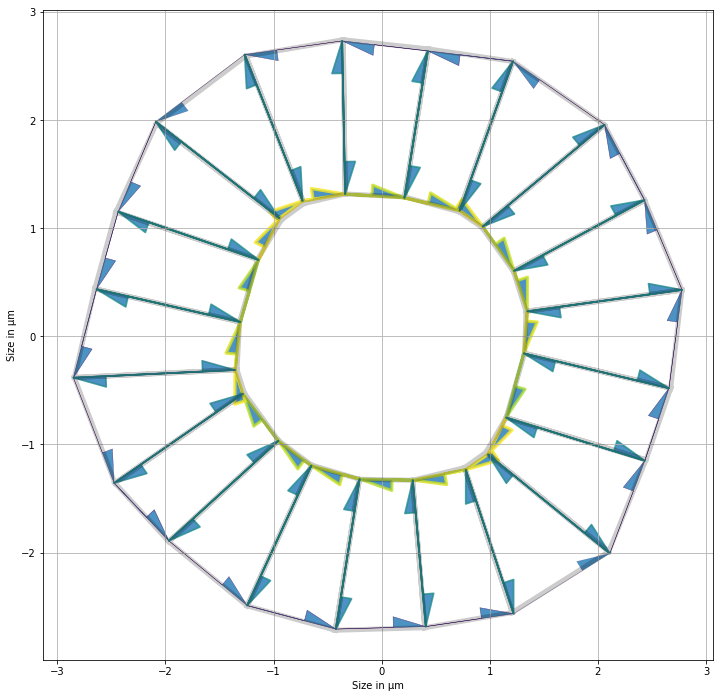

In [14]:
opt_mat_2_cst_organo = to_opt_organo.copy()
opt_mat_2_cst_organo.edge_df.line_tension = prepare_tensions(opt_mat_2_cst_organo, res_2_cst_areas.x[:organo3.Nf*3])
opt_mat_2_cst_organo.face_df.prefered_area = opt_mat_2_cst_organo.face_df.area + res_2_cst_areas.x[3*organo3.Nf:4*organo3.Nf]
opt_mat_2_cst_organo.settings['prefered_lumen_vol'] = opt_mat_2_cst_organo.settings['lumen_volume'] + res_2_cst_areas.x[-1]
Solver.find_energy_min(opt_mat_2_cst_organo, geom, model)
print_tensions(opt_mat_2_cst_organo, organo3)
print('Distance from th organo to exp organo : ' +
      str(np.sum(np.linalg.norm(_distance(organo3, opt_mat_2_cst_organo), axis=1))))
print('Distance from th tensions to exp tensions : ' +
      str(np.sum(np.linalg.norm(organo3.edge_df.line_tension[:3*organo3.Nf] -
                                opt_mat_2_cst_organo.edge_df.line_tension[:3*organo3.Nf]))))

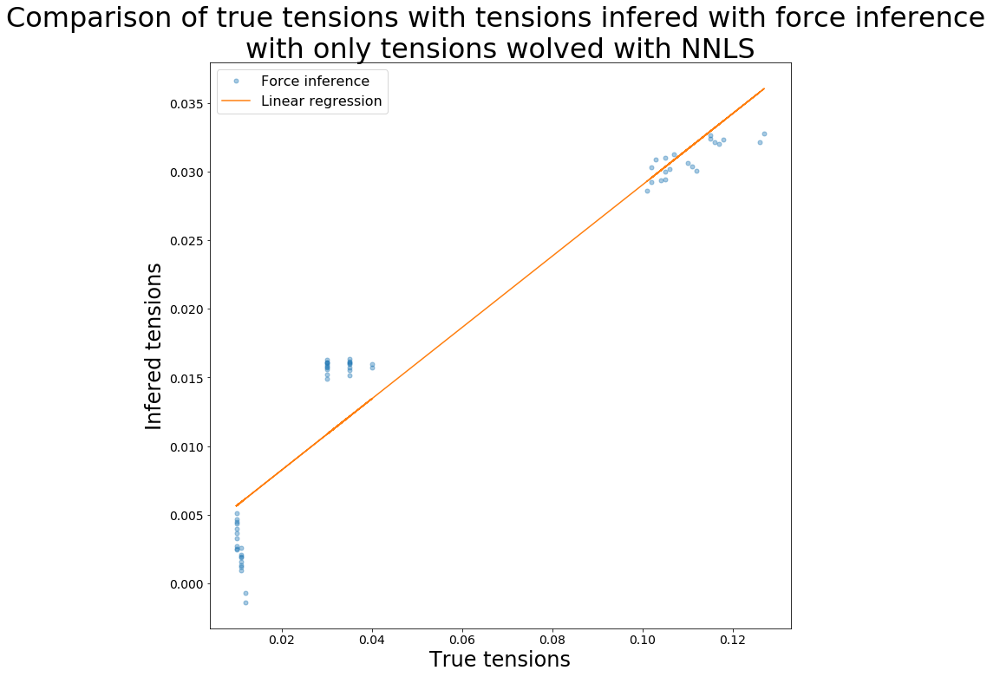

R value : 0.9561682302494516 
Standard error : 0.0029649529543035852


In [15]:
rendering_results(organo3, organo3.edge_df.line_tension[:3*organo3.Nf],
                  res_2_cst_areas.x[:3*organo3.Nf],
                  'Comparison of true tensions with tensions infered with force inference \n' +
                  'with only tensions wolved with NNLS',
                  'True tensions', 'Infered tensions', ('Force inference', 'Linear regression'))

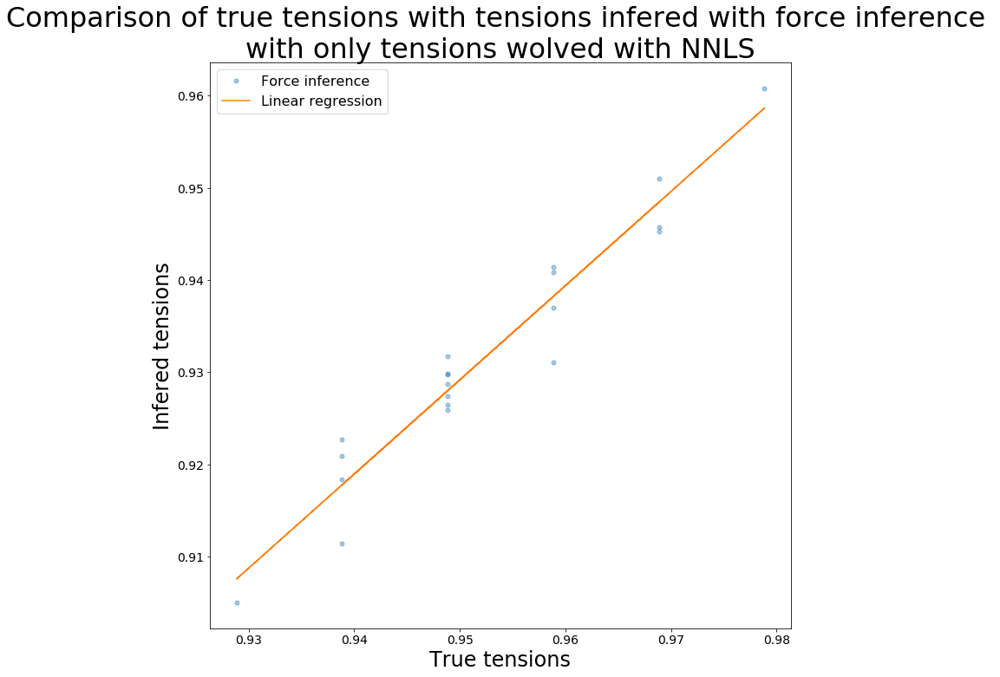

R value : 0.9689443940490942 
Standard error : 0.0016095766456029853


In [16]:
rendering_results(organo3, organo3.face_df.eval('prefered_area'),
                  res_2_cst_areas.x[4*organo3.Nf:-1],
                  'Comparison of true tensions with tensions infered with force inference \n' +
                  'with only tensions wolved with NNLS',
                  'True tensions', 'Infered tensions', ('Force inference', 'Linear regression'))

# half polarized

In [197]:
def create_organo(nb_cells, r_in, r_out, seed=None, rot=None, geom=geom):
    organo = generate_ring(nb_cells, r_in, r_out)
    Nf = organo.Nf
    geom.update_all(organo)
    alpha = 1 + 1/(20*(organo.settings['R_out']-organo.settings['R_in']))
    specs = {
        'face': {
            'is_alive': 1,
            'prefered_area': organo.face_df.area,
            'area_elasticity': 1., },
        'edge': {
            'ux': 0.,
            'uy': 0.,
            'uz': 0.,
            'line_tension': 0.1,
            'is_active': 1
            },
        'vert': {
            'adhesion_strength': 0.01,
            'x_ecm': 0.,
            'y_ecm': 0.,
            'is_active': 1
            },
        'settings': {
            'lumen_elasticity': 0.1,
            'lumen_prefered_vol': organo.settings['lumen_volume'],
            'lumen_volume': organo.settings['lumen_volume']
            }
        }
    organo.update_specs(specs, reset=True)
    normalize_scale(organo, geom, refer='edges')
    geom.update_all(organo)
    if seed is not None:
        symetric_tensions = set_init_point(organo.settings['R_in'],
                                           organo.settings['R_out'],
                                           organo.Nf, alpha)
        sin_mul = 1+(np.sin(np.linspace(0, 2*np.pi, organo.Nf,
                                        endpoint=False)))**2
        organo.face_df.prefered_area *= np.random.normal(1.0, 0.05, organo.Nf)
        organo.edge_df.line_tension = prepare_tensions(organo,
                                                       symetric_tensions)
        organo.edge_df.loc[:Nf-1, 'line_tension'] *= sin_mul*np.random.normal(
            1.0, 0.05, organo.Nf)
        geom.update_all(organo)
    if rot is not None:
        organo.vert_df.loc[:, 'x'] = (organo.vert_df.x.copy() * np.cos(rot) -
                                      organo.vert_df.y.copy() * np.sin(rot))
        print('rotated x',
              organo.vert_df.x.copy() * np.cos(rot) -
              organo.vert_df.y.copy() * np.sin(rot))
        organo.vert_df.loc[:, 'y'] = (organo.vert_df.x.copy() * np.sin(rot) +
                                      organo.vert_df.y.copy() * np.cos(rot))
        print('rotated y',
              organo.vert_df.x.copy() * np.sin(rot) +
              organo.vert_df.y.copy() * np.cos(rot))
        geom.update_all(organo)
    organo.vert_df[['x_ecm', 'y_ecm']] = organo.vert_df[['x', 'y']]
    organo.vert_df.loc[organo.basal_verts, 'adhesion_strength'] = 0.01
    new_tensions = organo.edge_df.line_tension
    organo.edge_df.loc[:, 'line_tension'] = new_tensions
    return organo

Reseting datasets values with new specs


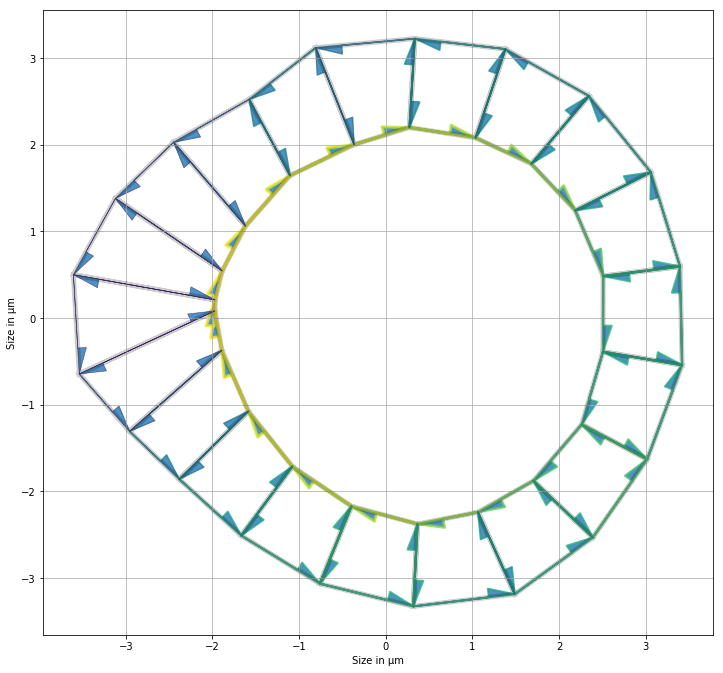

In [198]:
nf, r_in, r_out = (20, 1, 1.5)
seed = 1
organo3 = create_organo(nf, r_in, r_out)

organo3.edge_df.loc[organo3.apical_edges, 'line_tension'] = 3*np.array([
    0.050, 0.055, 0.060, 0.065, 0.070,
    0.072, 0.074, 0.076, 0.078, 0.078,
    0.079, 0.078, 0.076, 0.074, 0.072,
    0.070, 0.068, 0.065, 0.057, 0.052
])

organo3.edge_df.loc[organo3.basal_edges, 'line_tension'] = 3*np.array([
    0.050, 0.055, 0.050, 0.045, 0.050,
    0.050, 0.045, 0.035, 0.020, 0.010,
    0.011, 0.015, 0.020, 0.035, 0.030,
    0.040, 0.040, 0.042, 0.045, 0.050
])

organo3.edge_df.loc[organo3.lateral_edges, 'line_tension'] = 3*np.array([
    0.050, 0.055, 0.050, 0.044, 0.051,
    0.051, 0.046, 0.034, 0.019, 0.009,
    0.010, 0.014, 0.021, 0.036, 0.029,
    0.041, 0.039, 0.043, 0.046, 0.051,
    0.055, 0.050, 0.044, 0.051,
    0.051, 0.046, 0.034, 0.019, 0.009,
    0.010, 0.014, 0.021, 0.036, 0.029,
    0.041, 0.039, 0.043, 0.046, 0.051, 0.050
])

organo3.face_df.loc[:, 'prefered_area'] = np.array([
    0.08, 0.07, 0.08, 0.09, 0.09,
    0.10, 0.09, 0.08, 0.09, 0.09,
    0.10, 0.11, 0.10, 0.11, 0.12,
    0.11, 0.10, 0.09, 0.08, 0.09
]) + organo3.face_df.area

geom.update_all(organo3)
Solver.find_energy_min(organo3, geom, model)
print_tensions(organo3, organo3)

In [199]:
real_data = np.concatenate((organo3.edge_df.line_tension[:3*organo3.Nf],
                            organo3.face_df.prefered_area - organo3.face_df.area,
                            [organo3.settings['lumen_prefered_vol']-
                             organo3.settings['lumen_volume']]))
print(organo3.edge_df.line_tension, '\n',
      organo3.face_df.prefered_area - organo3.face_df.area)

edge
0     0.150
1     0.165
2     0.180
3     0.195
4     0.210
5     0.216
6     0.222
7     0.228
8     0.234
9     0.234
10    0.237
11    0.234
12    0.228
13    0.222
14    0.216
15    0.210
16    0.204
17    0.195
18    0.171
19    0.156
20    0.150
21    0.165
22    0.150
23    0.135
24    0.150
25    0.150
26    0.135
27    0.105
28    0.060
29    0.030
      ...  
50    0.030
51    0.042
52    0.063
53    0.108
54    0.087
55    0.123
56    0.117
57    0.129
58    0.138
59    0.153
60    0.165
61    0.150
62    0.132
63    0.153
64    0.153
65    0.138
66    0.102
67    0.057
68    0.027
69    0.030
70    0.042
71    0.063
72    0.108
73    0.087
74    0.123
75    0.117
76    0.129
77    0.138
78    0.153
79    0.150
Name: line_tension, Length: 80, dtype: float64 
 face
0     0.159524
1     0.171626
2     0.153793
3     0.151092
4     0.166324
5     0.158801
6     0.133252
7     0.091433
8     0.053653
9     0.038093
10    0.042930
11    0.057900
12    0.083871
13    0.112560

On détermine les paramètres dans l'organoïde régulier correspondant

In [200]:
params_in_sym_mesh = np.linalg.solve(*get_sim_mat(nf, r_in, r_out))

On obtient les coefficients exprimant le rapport entre la hauteur de chaque cellule dans l'organoïde régulier et dans l'organoïde à inférer

In [201]:
vertex.values

array([[ 2.50779197,  0.48404682],
       [ 3.41881907, -0.54294407]])

In [202]:
vertex

,x,y
vert,,
19,2.507792,0.484047
20,3.418819,-0.542944


In [203]:
np.linalg.norm(vertex.values[0] - vertex.values[1])

1.3728367260087178

In [204]:
vertex.loc[:-1, ('x', 'y')]

,x,y
vert,,


In [205]:
organo3.get_extra_indices()
non_lateral_edges = np.concatenate((organo3.apical_edges,
                                    organo3.basal_edges))
sym_height = (r_out-r_in)*np.cos(np.pi/organo3.Nf)
polar_coefs = np.ones(organo3.Nf)
for cell in range(organo3.Nf):
    parrallel_edges = (organo3.edge_df.loc[non_lateral_edges, ('srce', 'trgt')]
                       [organo3.edge_df.face == cell]).values
    apical_middle = organo3.vert_df.loc[parrallel_edges[0, :], ('x', 'y')].sum()/2
    basal_middle = organo3.vert_df.loc[parrallel_edges[1, :], ('x', 'y')].sum()/2
    cell_height = np.linalg.norm(apical_middle - basal_middle)
    polar_coefs[cell] = cell_height/sym_height
print(polar_coefs)
for cell in range(organo3.Nf):
    parrallel_edges = (organo3.edge_df.loc[non_lateral_edges, ('srce', 'trgt')]
                       [organo3.edge_df.face == cell]).values
    vertex1 = organo3.vert_df.loc[parrallel_edges[:, 0], ('x', 'y')]
    diag1 = np.linalg.norm(vertex1.values[0] - vertex1.values[1])
    vertex2 = organo3.vert_df.loc[parrallel_edges[:, 1], ('x', 'y')]
    diag2 = np.linalg.norm(vertex2.values[0] - vertex2.values[1])
reg_organo = generate_ring(nf, r_in, r_out)
geom.update_all(reg_organo)
bar_dist = []
for cell in range(organo3.Nf):
    barycentre = organo3.face_df.loc[[cell], ('x', 'y')].values
    reg_barycentre = reg_organo.face_df.loc[[cell], ('x', 'y')].values
    bar_dist.append(np.linalg.norm(barycentre - reg_barycentre))
bar_dist

[1.7804046  1.80896929 1.97237282 1.95819428 1.91354156 1.9663041
 2.13011039 2.5651894  3.14946586 3.26946007 3.11867021 2.77275355
 2.28573431 2.22316687 2.20358018 2.11542926 2.09600265 1.99059355
 1.86836    1.82366071]


/home/felix/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/home/felix/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


[1.7216600340417874,
 1.7306500943195475,
 1.7336795572550434,
 1.663649421745278,
 1.5048265020010214,
 1.3303524393899557,
 1.2377353556396575,
 1.2784660343473646,
 1.4257141977658674,
 1.5361599827533086,
 1.4966548579777585,
 1.3747253854087895,
 1.260414174696237,
 1.2868154371417244,
 1.4082654969272923,
 1.523974455595524,
 1.6411021534806272,
 1.711043143801391,
 1.7274975298509323,
 1.7225955011647263]

En utilisant les paramètres obtenus dans les cellules précédentes, on pose le problème d'inférence de forces

[0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355]
[0.03763327 0.03782979 0.03789601 0.03636524 0.03289357 0.02907979
 0.0270553  0.02794562 0.03116428 0.03357848 0.03271495 0.03004973
 0.02755103 0.02812813 0.03078287 0.03331212 0.03587238 0.0374012
 0.03776087 0.03765372]
Apical tensions:  [0.03991701 0.03745882 0.0434105  0.0464561  0.04216326 0.04394214
 0.04577034 0.0517093  0.0614252  0.07148243 0.06926424 0.06311208
 0.05711981 0.04756204 0.05637052 0.04495234 0.05020782 0.04572052
 0.04309229 0.03843227] 
Basal tensions:  [0.03644333 0.03501242 0.03486097 0.03227265 0.02951871 0.02935885
 0.0272

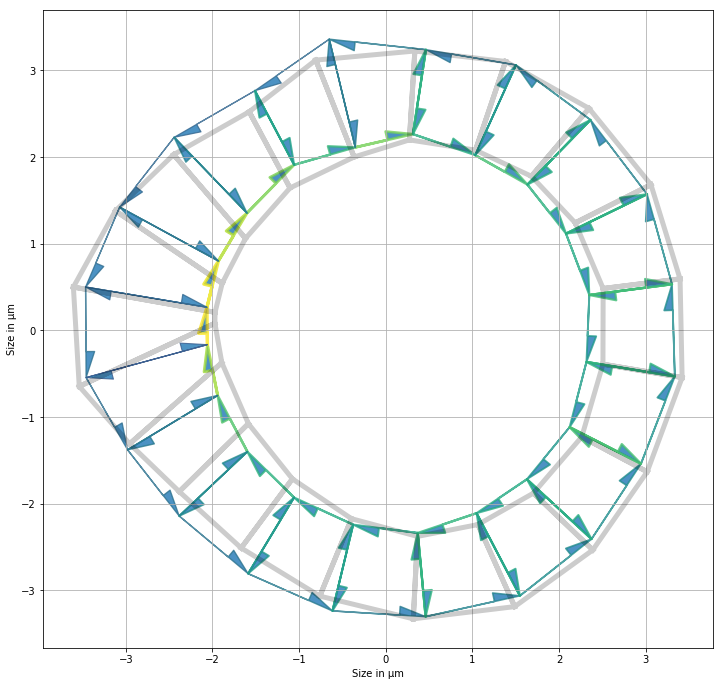

In [206]:
matrix = _coef_matrix(organo3, sup_param='areas')
constant = _right_side(organo3, matrix)
avg_cste = [4*((params_in_sym_mesh[1:].sum()+params_in_sym_mesh[-1])/3 /
               (organo3.face_df.area.mean() + params_in_sym_mesh[0])**1.5)]*organo3.Nf
print(avg_cste)
avg_cste = np.multiply(np.array(avg_cste), bar_dist)
print(avg_cste)
for i in range(organo3.Nf):
    i_cell_line = np.zeros(4*organo3.Nf+1)
    index = np.squeeze(np.argwhere(organo3.edge_df.face.values == i)[:-1])
    i_cell_line[index] = 1
    matrix = np.vstack((matrix, i_cell_line))
constant = np.concatenate((constant, avg_cste))
mat_eq_cst, residuals = nnls(matrix, constant)
organo3_eq_cst = organo3.copy()
organo3_eq_cst.edge_df.loc[:, 'line_tension'] = prepare_tensions(organo3_eq_cst,
                                                                 mat_eq_cst[:3*organo3.Nf])
organo3_eq_cst.face_df.loc[:, 'prefered_area'] = organo3_eq_cst.face_df.area + mat_eq_cst[3*organo3.Nf:
                                                                                          4*organo3.Nf]
organo3_eq_cst.settings['lumen_prefered_vol'] = organo3_eq_cst.settings['lumen_volume'] + mat_eq_cst[-1]
Solver.find_energy_min(organo3_eq_cst, geom, model)
print_tensions(organo3_eq_cst, organo3)
print('Apical tensions: ', mat_eq_cst[organo3.apical_edges],
      '\nBasal tensions: ', mat_eq_cst[organo3.basal_edges],
      '\nLateral tensions: ', mat_eq_cst[organo3.lateral_edges[:organo3.Nf]],
      '\nArea elasticity: ', mat_eq_cst[organo3.Nf*3:-1],
      '\nLumen area elasticity: ', mat_eq_cst[-1],
      '\nDistance to solution: ', np.linalg.norm(real_data-mat_eq_cst),
      '\nDistance from th org to exp org: ', np.sum(np.linalg.norm(_distance(organo3_eq_cst, organo3), axis=1)),
      '\nNNLS residuals: ', residuals)

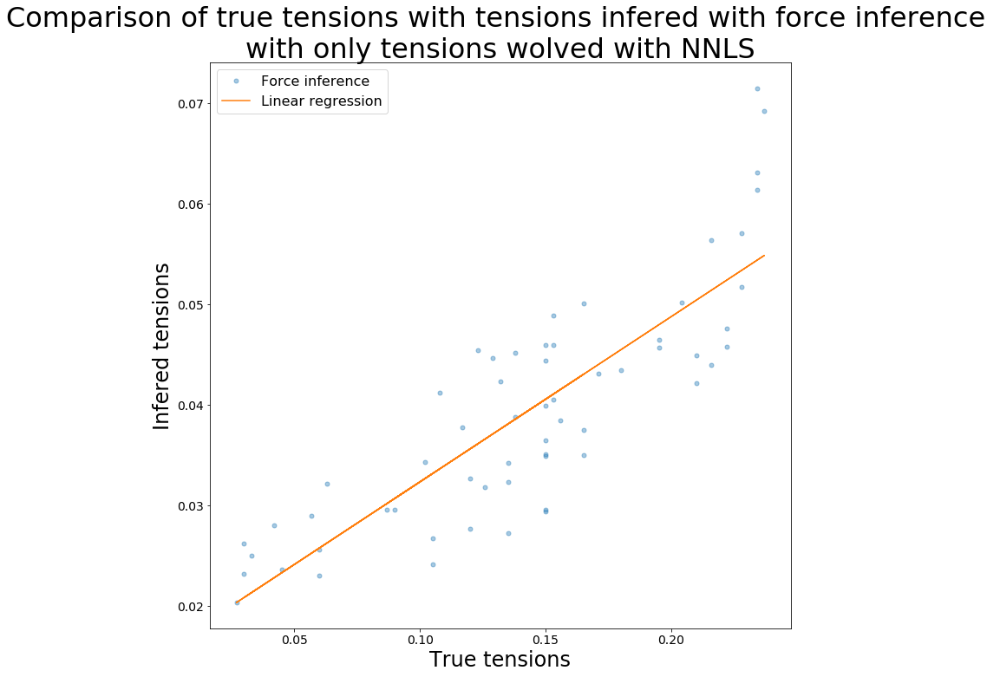

R value : 0.8417426647600293 
Standard error : 0.005370125288668007


In [207]:
rendering_results(organo3, organo3.edge_df.line_tension[:3*organo3.Nf],
                  mat_eq_cst[:3*organo3.Nf],
                  'Comparison of true tensions with tensions infered with force inference \n' +
                  'with only tensions wolved with NNLS',
                  'True tensions', 'Infered tensions', ('Force inference', 'Linear regression'))

#### On trouve la constante qui minimise la distance du résultat de l'inférence de force à l'organoïde étudié

In [195]:
from scipy.optimize import minimize, minimize_scalar
def _cst_opt_obj(cste, th_organo, polar_coefs, th_lum_vol):
    #print('cste:', cste)
    #print('th organo pos:', th_organo.vert_df.x.head())
    #print('polar_coefs:', polar_coefs[:4])
    tmp_eptm = th_organo.copy()
    matrix = _coef_matrix(th_organo, sup_param='areas')
    constant = _right_side(th_organo, matrix)
    avg_cste = np.full(th_organo.Nf, 4*cste)
    avg_cste = np.multiply(np.array(avg_cste), polar_coefs)
    for i in range(th_organo.Nf):
        i_cell_line = np.zeros(4*th_organo.Nf+1)
        index = np.squeeze(np.argwhere(th_organo.edge_df.face.values == i)[:-1])
        i_cell_line[index] = 1
        matrix = np.vstack((matrix, i_cell_line))
    constant = np.concatenate((constant, avg_cste))
    tmp_mat, residuals = nnls(matrix, constant)
    tmp_eptm.edge_df.loc[:, 'line_tension'] = prepare_tensions(tmp_eptm,
                                                               tmp_mat[:3*th_organo.Nf])
    tmp_eptm.face_df.loc[:, 'prefered_area'] = th_organo.face_df.area + tmp_mat[3*th_organo.Nf:
                                                                                4*th_organo.Nf]
    tmp_eptm.settings['lumen_prefered_vol'] = th_lum_vol + tmp_mat[-1]
    Solver.find_energy_min(tmp_eptm, geom, model)
    print('dist: ', np.sum(np.linalg.norm(_distance(th_organo, tmp_eptm), axis=1)))
    return np.sum(np.linalg.norm(_distance(th_organo, tmp_eptm), axis=1))


def adjust_cste(organo, init_cste, polar_coefs, th_lum_vol,
                lb=0.0, ub=10.0,
                start_ss=1.0, end_ss=1e-3,
                geom=geom, model=model,
                verbose=0, **min_opt):
    if min_opt.get('method', None) not in ('Golden', 'Nelder-Mead'):
        raise ValueError('Unknown method :', min_opt.get('method', None))
    tmp_th_organo = organo.copy()
    cste_res = minimize(_cst_opt_obj,
                        init_cste,
                        args=(tmp_th_organo, polar_coefs, th_lum_vol),
                        **min_opt)
    return cste_res

In [214]:
res_2_cst_areas.x

array([ 4.31599127e-02,  3.82968236e-02,  5.12403137e-02,  4.79802390e-02,
        4.39558486e-02,  4.62442305e-02,  6.93341137e-02,  6.87809129e-02,
        4.22319840e-02,  1.27577747e-01,  5.80884969e-02,  5.00180365e-02,
        5.37698144e-02,  6.71150052e-02,  5.84833576e-02,  5.09633597e-02,
        5.90083551e-02,  5.21302249e-02,  4.30259447e-02,  5.19933403e-02,
        2.18962745e-02,  2.19962061e-02,  2.51168378e-02,  2.28770363e-02,
        3.71952687e-02,  5.34678206e-02,  6.41556378e-02,  5.63533680e-02,
        9.76768874e-03, -2.17774799e-02,  7.03068033e-04, -6.74263709e-03,
        3.95935462e-03,  4.72274969e-02,  3.58125941e-02,  3.43749419e-02,
        3.36030991e-02,  2.67923013e-02,  2.09183279e-02,  3.53257458e-02,
        5.99599376e-02,  5.45912294e-02,  4.91303523e-02,  4.47694144e-02,
        4.52783597e-02,  4.66662995e-02,  5.28689405e-02,  4.33188575e-02,
        1.60685190e-02,  2.38860167e-03, -7.27773508e-03,  7.64827140e-03,
        1.24522906e-02,  

In [208]:
iprint_file = "../../assets/dist_at_each_f_ev/13_03_eq_t_per_cell_areas_opt.txt"
to_opt_organo = organo3.copy()
init_point_area_and_tensions_opt = np.concatenate((prepare_tensions(to_opt_organo, mat_eq_cst[:3*organo3.Nf]),
                                                   to_opt_organo.face_df.area + mat_eq_cst[3*organo3.Nf:-1],
                                                   [to_opt_organo.settings['lumen_volume'] + mat_eq_cst[-1]]))
res_2_cst_areas = adjust_parameters(to_opt_organo,
                                    init_point_area_and_tensions_opt,
                                    {'dic':{'apical' : False, 'basal': False}, 'weight':0},
                                    energy_min_opt=energy_opt,
                                    **lm_opt)

6.7342821177827155 [0.18849214 0.17464213 0.17509303 0.13503764 0.04021264 0.07081859
 0.21219243 0.31221284 0.37565954 0.25965149 0.1332834  0.26336977
 0.28845032 0.26412133 0.111564   0.08323348 0.05945299 0.10635552
 0.16322732 0.17193427 0.08117864 0.11452502 0.12122887 0.13766816
 0.15169154 0.23012459 0.30288802 0.27383135 0.08370187 0.1152759
 0.12704199 0.06563907 0.20171782 0.23879708 0.28381074 0.12602996
 0.13355682 0.12814273 0.11797134 0.11045574 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

6.734282115626129 [0.18849214 0.17464213 0.17509303 0.13503763 0.04021265 0.07081859
 0.21219243 0.31221284 0.37565954 0.25965149 0.1332834  0.26336977
 0.28845032 0.26412133 0.111564   0.08323348 0.05945299 0.10635552
 0.16322732 0.17193427 0.08117864 0.11452502 0.12122887 0.13766816
 0.15169154 0.23012459 0.30288802 0.27383135 0.08370187 0.1152759
 0.12704199 0.06563907 0.20171782 0.23879708 0.28381074 0.12602996
 0.13355682 0.12814273 0.11797134 0.11045574 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

6.7342820870436135 [0.18849214 0.17464213 0.17509303 0.13503764 0.04021264 0.07081859
 0.21219243 0.31221284 0.37565954 0.25965148 0.1332834  0.26336977
 0.28845032 0.26412133 0.111564   0.08323348 0.05945299 0.10635552
 0.16322732 0.17193427 0.08117864 0.11452502 0.12122887 0.13766816
 0.15169154 0.23012459 0.30288802 0.27383134 0.08370187 0.11527589
 0.12704199 0.06563906 0.20171782 0.23879708 0.28381074 0.12602996
 0.13355682 0.12814273 0.11797134 0.11045574 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

6.734282122622666 [0.18849214 0.17464213 0.17509303 0.13503764 0.04021264 0.07081859
 0.21219243 0.31221284 0.37565954 0.25965149 0.1332834  0.26336977
 0.28845032 0.26412133 0.111564   0.08323348 0.05945298 0.10635552
 0.16322732 0.17193427 0.08117864 0.11452502 0.12122887 0.13766816
 0.15169154 0.23012459 0.30288802 0.27383135 0.08370187 0.1152759
 0.12704199 0.06563907 0.20171782 0.23879708 0.28381074 0.12602996
 0.13355682 0.12814274 0.11797135 0.11045574 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

6.7342821203999605 [0.18849214 0.17464213 0.17509304 0.13503764 0.04021264 0.07081859
 0.21219243 0.31221284 0.37565954 0.25965149 0.1332834  0.26336977
 0.28845032 0.26412133 0.111564   0.08323348 0.05945299 0.10635552
 0.16322732 0.17193427 0.08117864 0.11452502 0.12122887 0.13766816
 0.15169154 0.23012459 0.30288802 0.27383135 0.08370187 0.1152759
 0.12704199 0.06563907 0.20171782 0.23879708 0.28381074 0.12602996
 0.13355682 0.12814273 0.11797134 0.11045573 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

6.734282135317593 [0.18849214 0.17464213 0.17509304 0.13503764 0.04021265 0.07081859
 0.21219243 0.31221284 0.37565953 0.25965149 0.13328341 0.26336978
 0.28845032 0.26412133 0.111564   0.08323348 0.05945299 0.10635552
 0.16322732 0.17193427 0.08117864 0.11452502 0.12122886 0.13766816
 0.15169154 0.2301246  0.30288802 0.27383135 0.08370188 0.11527589
 0.12704198 0.06563907 0.20171782 0.23879708 0.28381074 0.12602997
 0.13355682 0.12814274 0.11797134 0.11045573 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

6.734282113606135 [0.18849214 0.17464213 0.17509303 0.13503764 0.04021264 0.07081859
 0.21219243 0.31221284 0.37565954 0.25965149 0.1332834  0.26336977
 0.28845033 0.26412132 0.111564   0.08323348 0.05945299 0.10635552
 0.16322732 0.17193427 0.08117864 0.11452502 0.12122887 0.13766816
 0.15169154 0.23012459 0.30288802 0.27383135 0.08370187 0.1152759
 0.12704199 0.06563906 0.20171782 0.23879708 0.28381074 0.12602996
 0.13355682 0.12814273 0.11797134 0.11045574 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

6.73428212132656 [0.18849214 0.17464213 0.17509303 0.13503764 0.04021264 0.07081859
 0.21219243 0.31221284 0.37565954 0.25965149 0.1332834  0.26336977
 0.28845032 0.26412133 0.111564   0.08323348 0.05945299 0.10635552
 0.16322732 0.17193427 0.08117864 0.11452502 0.12122887 0.13766816
 0.15169154 0.23012459 0.30288802 0.27383135 0.08370187 0.1152759
 0.12704199 0.06563907 0.20171782 0.23879708 0.28381074 0.12602996
 0.13355682 0.12814273 0.11797134 0.11045574 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

6.734282119751547 [0.18849214 0.17464213 0.17509303 0.13503764 0.04021265 0.07081859
 0.21219243 0.31221284 0.37565954 0.25965149 0.1332834  0.26336977
 0.28845032 0.26412133 0.111564   0.08323348 0.05945299 0.10635552
 0.16322732 0.17193427 0.08117864 0.11452502 0.12122887 0.13766816
 0.15169154 0.23012459 0.30288802 0.27383135 0.08370187 0.1152759
 0.12704199 0.06563907 0.20171782 0.23879708 0.28381074 0.12602996
 0.13355682 0.12814273 0.11797134 0.11045574 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

6.734282119205635 [0.18849214 0.17464213 0.17509303 0.13503764 0.04021264 0.07081859
 0.21219243 0.31221284 0.37565954 0.25965149 0.1332834  0.26336978
 0.28845033 0.26412133 0.111564   0.08323348 0.05945299 0.10635552
 0.16322732 0.17193427 0.08117864 0.11452502 0.12122887 0.13766816
 0.15169154 0.23012459 0.30288802 0.27383135 0.08370187 0.11527589
 0.12704199 0.06563906 0.20171782 0.23879708 0.28381074 0.12602996
 0.13355682 0.12814273 0.11797134 0.11045574 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

6.734282123383972 [0.18849214 0.17464213 0.17509303 0.13503764 0.04021264 0.07081859
 0.21219243 0.31221284 0.37565954 0.25965149 0.1332834  0.26336977
 0.28845032 0.26412133 0.111564   0.08323348 0.05945299 0.10635552
 0.16322732 0.17193427 0.08117864 0.11452502 0.12122887 0.13766816
 0.15169154 0.23012459 0.30288802 0.27383135 0.08370187 0.1152759
 0.12704199 0.06563907 0.20171782 0.23879708 0.28381074 0.12602996
 0.13355682 0.12814274 0.11797134 0.11045574 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

6.7342821177827155 [0.18849214 0.17464213 0.17509303 0.13503764 0.04021264 0.07081859
 0.21219243 0.31221284 0.37565954 0.25965149 0.1332834  0.26336977
 0.28845032 0.26412133 0.111564   0.08323348 0.05945299 0.10635552
 0.16322732 0.17193427 0.08117864 0.11452502 0.12122887 0.13766816
 0.15169154 0.23012459 0.30288802 0.27383135 0.08370187 0.1152759
 0.12704199 0.06563907 0.20171782 0.23879708 0.28381074 0.12602996
 0.13355682 0.12814273 0.11797134 0.11045574 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

6.7342821177827155 [0.18849214 0.17464213 0.17509303 0.13503764 0.04021264 0.07081859
 0.21219243 0.31221284 0.37565954 0.25965149 0.1332834  0.26336977
 0.28845032 0.26412133 0.111564   0.08323348 0.05945299 0.10635552
 0.16322732 0.17193427 0.08117864 0.11452502 0.12122887 0.13766816
 0.15169154 0.23012459 0.30288802 0.27383135 0.08370187 0.1152759
 0.12704199 0.06563907 0.20171782 0.23879708 0.28381074 0.12602996
 0.13355682 0.12814273 0.11797134 0.11045574 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

6.7342821177827155 [0.18849214 0.17464213 0.17509303 0.13503764 0.04021264 0.07081859
 0.21219243 0.31221284 0.37565954 0.25965149 0.1332834  0.26336977
 0.28845032 0.26412133 0.111564   0.08323348 0.05945299 0.10635552
 0.16322732 0.17193427 0.08117864 0.11452502 0.12122887 0.13766816
 0.15169154 0.23012459 0.30288802 0.27383135 0.08370187 0.1152759
 0.12704199 0.06563907 0.20171782 0.23879708 0.28381074 0.12602996
 0.13355682 0.12814273 0.11797134 0.11045574 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

6.734281936315929 [0.18849213 0.17464213 0.17509303 0.13503763 0.04021264 0.07081859
 0.21219242 0.31221284 0.37565953 0.25965148 0.1332834  0.26336977
 0.28845032 0.26412132 0.11156401 0.08323347 0.05945298 0.10635552
 0.16322731 0.17193426 0.08117864 0.11452501 0.12122886 0.13766816
 0.15169153 0.23012459 0.30288801 0.27383134 0.08370187 0.11527589
 0.12704199 0.06563906 0.20171781 0.23879708 0.28381074 0.12602996
 0.13355682 0.12814273 0.11797134 0.11045573 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

6.734279942809203 [0.18849195 0.174642   0.1750928  0.13503748 0.04021248 0.07081879
 0.21219262 0.31221301 0.37565993 0.25965121 0.13328275 0.26336958
 0.28845074 0.26412117 0.1115646  0.08323326 0.05945264 0.10635562
 0.16322716 0.17193405 0.08117858 0.11452502 0.12122894 0.13766822
 0.15169129 0.23012426 0.30288793 0.2738311  0.08370163 0.11527599
 0.12704244 0.06563878 0.20171759 0.23879714 0.28381088 0.12602972
 0.13355677 0.1281427  0.11797134 0.1104558  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

6.734282048921187 [0.18849214 0.17464213 0.17509304 0.13503764 0.04021266 0.07081858
 0.21219241 0.31221283 0.3756595  0.25965148 0.13328346 0.26336976
 0.28845028 0.26412132 0.11156397 0.08323348 0.059453   0.1063555
 0.16322732 0.17193427 0.08117865 0.11452502 0.12122887 0.13766816
 0.15169155 0.23012461 0.302888   0.27383136 0.0837019  0.11527588
 0.12704195 0.06563908 0.20171783 0.23879707 0.28381071 0.12602998
 0.13355682 0.12814274 0.11797135 0.11045573 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

6.734281739621304 [0.18849213 0.17464212 0.17509302 0.13503763 0.04021264 0.07081859
 0.21219242 0.31221283 0.37565953 0.25965147 0.13328339 0.26336976
 0.28845032 0.26412131 0.11156401 0.08323347 0.05945298 0.10635551
 0.1632273  0.17193426 0.08117863 0.11452501 0.12122886 0.13766816
 0.15169153 0.23012458 0.302888   0.27383133 0.08370187 0.11527589
 0.12704198 0.06563906 0.20171781 0.23879707 0.28381073 0.12602996
 0.13355681 0.12814273 0.11797134 0.11045573 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

3.517206548390209 [2.06699694e-02 1.77447597e-02 4.68607502e-02 7.43398011e-02
 6.18036148e-02 6.71464432e-02 1.44184247e-01 2.19643893e-02
 1.06043633e-01 1.46066484e-01 1.45809637e-01 1.50773734e-01
 4.10568469e-02 1.56784011e-01 1.03886532e-01 3.07229116e-02
 4.48743515e-02 2.59227761e-02 7.37829376e-02 2.55180933e-02
 1.14095893e-02 1.70132024e-02 4.51415736e-02 4.26532544e-02
 3.36305954e-02 3.15140395e-02 4.10588917e-02 1.69559743e-01
 3.32762850e-02 8.64157803e-02 1.53630289e-01 1.67628494e-01
 5.15582192e-01 3.48318722e-01 5.65059019e-02 1.06651981e-01
 2.30378512e-02 5.68084180e-02 1.66285641e-02 4.18416445e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.5171659111933353 [2.06704137e-02 1.77450129e-02 4.68604362e-02 7.43390075e-02
 6.18033324e-02 6.71455617e-02 1.44184116e-01 2.19637582e-02
 1.06042990e-01 1.46066135e-01 1.45809648e-01 1.50771879e-01
 4.10560674e-02 1.56784633e-01 1.03884522e-01 3.07217672e-02
 4.48744485e-02 2.59223274e-02 7.37827995e-02 2.55180286e-02
 1.14097685e-02 1.70125383e-02 4.51405024e-02 4.26525094e-02
 3.36305749e-02 3.15144498e-02 4.10572818e-02 1.69559217e-01
 3.32762424e-02 8.64124326e-02 1.53626831e-01 1.67625931e-01
 5.15571925e-01 3.48310748e-01 5.65075967e-02 1.06651680e-01
 2.30365561e-02 5.68088022e-02 1.66285268e-02 4.18412993e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.517159868027912 [2.06705314e-02 1.77450664e-02 4.68603498e-02 7.43388140e-02
 6.18033223e-02 6.71453560e-02 1.44184358e-01 2.19636878e-02
 1.06043170e-01 1.46066136e-01 1.45809799e-01 1.50771495e-01
 4.10560293e-02 1.56785092e-01 1.03884099e-01 3.07214985e-02
 4.48745407e-02 2.59221925e-02 7.37828042e-02 2.55180132e-02
 1.14097393e-02 1.70124632e-02 4.51403457e-02 4.26524873e-02
 3.36306896e-02 3.15145819e-02 4.10570144e-02 1.69559360e-01
 3.32763007e-02 8.64117809e-02 1.53625718e-01 1.67625545e-01
 5.15569738e-01 3.48308961e-01 5.65082505e-02 1.06651911e-01
 2.30362089e-02 5.68089894e-02 1.66284973e-02 4.18413174e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.517194814960132 [2.06700950e-02 1.77448323e-02 4.68606632e-02 7.43395743e-02
 6.18035318e-02 6.71461928e-02 1.44184195e-01 2.19642038e-02
 1.06043433e-01 1.46066381e-01 1.45809633e-01 1.50773204e-01
 4.10566172e-02 1.56784169e-01 1.03885962e-01 3.07225829e-02
 4.48743777e-02 2.59226502e-02 7.37828965e-02 2.55180749e-02
 1.14096444e-02 1.70130108e-02 4.51412627e-02 4.26530348e-02
 3.36305838e-02 3.15141533e-02 4.10584280e-02 1.69559579e-01
 3.32762695e-02 8.64148203e-02 1.53629319e-01 1.67627754e-01
 5.15579258e-01 3.48316453e-01 5.65063720e-02 1.06651884e-01
 2.30374833e-02 5.68085246e-02 1.66285552e-02 4.18415409e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.5172004100917356 [2.06700359e-02 1.77447989e-02 4.68607044e-02 7.43396789e-02
 6.18035724e-02 6.71463098e-02 1.44184229e-01 2.19642933e-02
 1.06043538e-01 1.46066432e-01 1.45809640e-01 1.50773452e-01
 4.10567296e-02 1.56784108e-01 1.03886227e-01 3.07227376e-02
 4.48743671e-02 2.59227091e-02 7.37829186e-02 2.55180812e-02
 1.14096180e-02 1.70131038e-02 4.51414106e-02 4.26531428e-02
 3.36305933e-02 3.15141010e-02 4.10586483e-02 1.69559665e-01
 3.32762793e-02 8.64152724e-02 1.53629761e-01 1.67628107e-01
 5.15580633e-01 3.48317511e-01 5.65061620e-02 1.06651938e-01
 2.30376549e-02 5.68084783e-02 1.66285594e-02 4.18415940e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.5172120967389717 [2.06699086e-02 1.77447250e-02 4.68607967e-02 7.43399055e-02
 6.18036529e-02 6.71465645e-02 1.44184264e-01 2.19644761e-02
 1.06043720e-01 1.46066532e-01 1.45809635e-01 1.50773987e-01
 4.10569532e-02 1.56783924e-01 1.03886807e-01 3.07230681e-02
 4.48743380e-02 2.59228376e-02 7.37829562e-02 2.55181024e-02
 1.14095652e-02 1.70132959e-02 4.51417159e-02 4.26533568e-02
 3.36305980e-02 3.15139820e-02 4.10591117e-02 1.69559814e-01
 3.32762904e-02 8.64162381e-02 1.53630763e-01 1.67628844e-01
 5.15583596e-01 3.48319813e-01 5.65056691e-02 1.06652022e-01
 2.30380285e-02 5.68083651e-02 1.66285692e-02 4.18416911e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.5172214592068727 [2.06698084e-02 1.77446678e-02 4.68608667e-02 7.43400857e-02
 6.18037190e-02 6.71467643e-02 1.44184306e-01 2.19646224e-02
 1.06043881e-01 1.46066614e-01 1.45809641e-01 1.50774409e-01
 4.10571369e-02 1.56783800e-01 1.03887264e-01 3.07233269e-02
 4.48743195e-02 2.59229375e-02 7.37829892e-02 2.55181168e-02
 1.14095215e-02 1.70134503e-02 4.51419644e-02 4.26535314e-02
 3.36306071e-02 3.15138904e-02 4.10594824e-02 1.69559945e-01
 3.32763042e-02 8.64170024e-02 1.53631530e-01 1.67629434e-01
 5.15585928e-01 3.48321620e-01 5.65052989e-02 1.06652105e-01
 2.30383191e-02 5.68082832e-02 1.66285767e-02 4.18417740e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.5172136907864124 [2.06698864e-02 1.77447141e-02 4.68608117e-02 7.43399451e-02
 6.18036611e-02 6.71466055e-02 1.44184246e-01 2.19644983e-02
 1.06043721e-01 1.46066541e-01 1.45809622e-01 1.50774070e-01
 4.10569767e-02 1.56783868e-01 1.03886897e-01 3.07231216e-02
 4.48743273e-02 2.59228612e-02 7.37829593e-02 2.55181052e-02
 1.14095636e-02 1.70133195e-02 4.51417596e-02 4.26533770e-02
 3.36305876e-02 3.15139597e-02 4.10591774e-02 1.69559815e-01
 3.32762862e-02 8.64163833e-02 1.53630951e-01 1.67628946e-01
 5.15584056e-01 3.48320178e-01 5.65055671e-02 1.06652009e-01
 2.30380929e-02 5.68083387e-02 1.66285729e-02 4.18416983e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.5172032130335746 [2.06700047e-02 1.77447804e-02 4.68607272e-02 7.43397354e-02
 6.18035909e-02 6.71463727e-02 1.44184232e-01 2.19643366e-02
 1.06043576e-01 1.46066455e-01 1.45809636e-01 1.50773584e-01
 4.10567821e-02 1.56784056e-01 1.03886368e-01 3.07228193e-02
 4.48743578e-02 2.59227399e-02 7.37829254e-02 2.55180880e-02
 1.14096054e-02 1.70131497e-02 4.51414843e-02 4.26531920e-02
 3.36305916e-02 3.15140707e-02 4.10587606e-02 1.69559696e-01
 3.32762803e-02 8.64155085e-02 1.53630015e-01 1.67628284e-01
 5.15581361e-01 3.48318077e-01 5.65060356e-02 1.06651950e-01
 2.30377470e-02 5.68084472e-02 1.66285616e-02 4.18416146e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.5172166597210968 [2.06698588e-02 1.77446972e-02 4.68608311e-02 7.43399955e-02
 6.18036848e-02 6.71466626e-02 1.44184282e-01 2.19645478e-02
 1.06043795e-01 1.46066572e-01 1.45809636e-01 1.50774195e-01
 4.10570417e-02 1.56783858e-01 1.03887031e-01 3.07231958e-02
 4.48743276e-02 2.59228870e-02 7.37829707e-02 2.55181097e-02
 1.14095453e-02 1.70133710e-02 4.51418382e-02 4.26534404e-02
 3.36306005e-02 3.15139368e-02 4.10592925e-02 1.69559876e-01
 3.32762959e-02 8.64166125e-02 1.53631145e-01 1.67629132e-01
 5.15584741e-01 3.48320702e-01 5.65054833e-02 1.06652059e-01
 2.30381725e-02 5.68083229e-02 1.66285717e-02 4.18417289e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.517230022274509 [2.06697138e-02 1.77446170e-02 4.68609346e-02 7.43402504e-02
 6.18037788e-02 6.71469493e-02 1.44184335e-01 2.19647579e-02
 1.06044016e-01 1.46066689e-01 1.45809639e-01 1.50774800e-01
 4.10573013e-02 1.56783667e-01 1.03887687e-01 3.07235677e-02
 4.48742990e-02 2.59230320e-02 7.37830176e-02 2.55181297e-02
 1.14094855e-02 1.70135941e-02 4.51421867e-02 4.26536875e-02
 3.36306090e-02 3.15138037e-02 4.10598209e-02 1.69560059e-01
 3.32763119e-02 8.64177079e-02 1.53632259e-01 1.67629974e-01
 5.15588092e-01 3.48323301e-01 5.65049408e-02 1.06652168e-01
 2.30385921e-02 5.68082023e-02 1.66285850e-02 4.18418455e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.517177267151382 [2.06702836e-02 1.77449409e-02 4.68605293e-02 7.43392376e-02
 6.18034094e-02 6.71458144e-02 1.44184122e-01 2.19639234e-02
 1.06043140e-01 1.46066227e-01 1.45809627e-01 1.50772412e-01
 4.10562764e-02 1.56784417e-01 1.03885099e-01 3.07220981e-02
 4.48744124e-02 2.59224608e-02 7.37828348e-02 2.55180471e-02
 1.14097252e-02 1.70127215e-02 4.51408016e-02 4.26527093e-02
 3.36305704e-02 3.15143254e-02 4.10577326e-02 1.69559338e-01
 3.32762480e-02 8.64133848e-02 1.53627867e-01 1.67626649e-01
 5.15574872e-01 3.48313048e-01 5.65070758e-02 1.06651731e-01
 2.30369360e-02 5.68086801e-02 1.66285397e-02 4.18413874e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.5172015178031355 [2.06700248e-02 1.77447915e-02 4.68607130e-02 7.43397003e-02
 6.18035799e-02 6.71463337e-02 1.44184233e-01 2.19643108e-02
 1.06043556e-01 1.46066441e-01 1.45809640e-01 1.50773503e-01
 4.10567514e-02 1.56784091e-01 1.03886282e-01 3.07227689e-02
 4.48743643e-02 2.59227199e-02 7.37829206e-02 2.55180852e-02
 1.14096114e-02 1.70131223e-02 4.51414396e-02 4.26531631e-02
 3.36305938e-02 3.15140899e-02 4.10586924e-02 1.69559680e-01
 3.32762804e-02 8.64153631e-02 1.53629855e-01 1.67628178e-01
 5.15580915e-01 3.48317729e-01 5.65061156e-02 1.06651947e-01
 2.30376893e-02 5.68084670e-02 1.66285592e-02 4.18416021e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.5172285183979684 [2.06697314e-02 1.77446241e-02 4.68609214e-02 7.43402230e-02
 6.18037678e-02 6.71469164e-02 1.44184331e-01 2.19647347e-02
 1.06043994e-01 1.46066675e-01 1.45809639e-01 1.50774731e-01
 4.10572734e-02 1.56783695e-01 1.03887611e-01 3.07235275e-02
 4.48743023e-02 2.59230153e-02 7.37830130e-02 2.55181279e-02
 1.14094903e-02 1.70135660e-02 4.51421502e-02 4.26536612e-02
 3.36306107e-02 3.15138202e-02 4.10597611e-02 1.69560040e-01
 3.32763106e-02 8.64175834e-02 1.53632129e-01 1.67629880e-01
 5.15587709e-01 3.48322999e-01 5.65050012e-02 1.06652160e-01
 2.30385455e-02 5.68082158e-02 1.66285826e-02 4.18418341e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.5171925041895853 [2.06701218e-02 1.77448472e-02 4.68606435e-02 7.43395264e-02
 6.18035161e-02 6.71461398e-02 1.44184196e-01 2.19641689e-02
 1.06043407e-01 1.46066363e-01 1.45809638e-01 1.50773096e-01
 4.10565764e-02 1.56784219e-01 1.03885840e-01 3.07225176e-02
 4.48743841e-02 2.59226191e-02 7.37828918e-02 2.55180743e-02
 1.14096503e-02 1.70129736e-02 4.51412019e-02 4.26529953e-02
 3.36305863e-02 3.15141790e-02 4.10583360e-02 1.69559555e-01
 3.32762688e-02 8.64146266e-02 1.53629105e-01 1.67627609e-01
 5.15578657e-01 3.48315979e-01 5.65064791e-02 1.06651872e-01
 2.30374045e-02 5.68085476e-02 1.66285497e-02 4.18415279e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.517210458748872 [2.06699264e-02 1.77447357e-02 4.68607830e-02 7.43398752e-02
 6.18036415e-02 6.71465285e-02 1.44184259e-01 2.19644504e-02
 1.06043695e-01 1.46066518e-01 1.45809636e-01 1.50773912e-01
 4.10569220e-02 1.56783950e-01 1.03886725e-01 3.07230216e-02
 4.48743421e-02 2.59228193e-02 7.37829506e-02 2.55180995e-02
 1.14095727e-02 1.70132687e-02 4.51416748e-02 4.26533259e-02
 3.36305967e-02 3.15139989e-02 4.10590469e-02 1.69559794e-01
 3.32762889e-02 8.64161026e-02 1.53630622e-01 1.67628741e-01
 5.15583180e-01 3.48319489e-01 5.65057386e-02 1.06652010e-01
 2.30379758e-02 5.68083811e-02 1.66285677e-02 4.18416773e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.517210458748872 [2.06699264e-02 1.77447357e-02 4.68607830e-02 7.43398752e-02
 6.18036415e-02 6.71465285e-02 1.44184259e-01 2.19644504e-02
 1.06043695e-01 1.46066518e-01 1.45809636e-01 1.50773912e-01
 4.10569220e-02 1.56783950e-01 1.03886725e-01 3.07230216e-02
 4.48743421e-02 2.59228193e-02 7.37829506e-02 2.55180995e-02
 1.14095727e-02 1.70132687e-02 4.51416748e-02 4.26533259e-02
 3.36305967e-02 3.15139989e-02 4.10590469e-02 1.69559794e-01
 3.32762889e-02 8.64161026e-02 1.53630622e-01 1.67628741e-01
 5.15583180e-01 3.48319489e-01 5.65057386e-02 1.06652010e-01
 2.30379758e-02 5.68083811e-02 1.66285677e-02 4.18416773e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.517210458748872 [2.06699264e-02 1.77447357e-02 4.68607830e-02 7.43398752e-02
 6.18036415e-02 6.71465285e-02 1.44184259e-01 2.19644504e-02
 1.06043695e-01 1.46066518e-01 1.45809636e-01 1.50773912e-01
 4.10569220e-02 1.56783950e-01 1.03886725e-01 3.07230216e-02
 4.48743421e-02 2.59228193e-02 7.37829506e-02 2.55180995e-02
 1.14095727e-02 1.70132687e-02 4.51416748e-02 4.26533259e-02
 3.36305967e-02 3.15139989e-02 4.10590469e-02 1.69559794e-01
 3.32762889e-02 8.64161026e-02 1.53630622e-01 1.67628741e-01
 5.15583180e-01 3.48319489e-01 5.65057386e-02 1.06652010e-01
 2.30379758e-02 5.68083811e-02 1.66285677e-02 4.18416773e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.517210458748872 [2.06699264e-02 1.77447357e-02 4.68607830e-02 7.43398752e-02
 6.18036415e-02 6.71465285e-02 1.44184259e-01 2.19644504e-02
 1.06043695e-01 1.46066518e-01 1.45809636e-01 1.50773912e-01
 4.10569220e-02 1.56783950e-01 1.03886725e-01 3.07230216e-02
 4.48743421e-02 2.59228193e-02 7.37829506e-02 2.55180995e-02
 1.14095727e-02 1.70132687e-02 4.51416748e-02 4.26533259e-02
 3.36305967e-02 3.15139989e-02 4.10590469e-02 1.69559794e-01
 3.32762889e-02 8.64161026e-02 1.53630622e-01 1.67628741e-01
 5.15583180e-01 3.48319489e-01 5.65057386e-02 1.06652010e-01
 2.30379758e-02 5.68083811e-02 1.66285677e-02 4.18416773e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.517210458748872 [2.06699264e-02 1.77447357e-02 4.68607830e-02 7.43398752e-02
 6.18036415e-02 6.71465285e-02 1.44184259e-01 2.19644504e-02
 1.06043695e-01 1.46066518e-01 1.45809636e-01 1.50773912e-01
 4.10569220e-02 1.56783950e-01 1.03886725e-01 3.07230216e-02
 4.48743421e-02 2.59228193e-02 7.37829506e-02 2.55180995e-02
 1.14095727e-02 1.70132687e-02 4.51416748e-02 4.26533259e-02
 3.36305967e-02 3.15139989e-02 4.10590469e-02 1.69559794e-01
 3.32762889e-02 8.64161026e-02 1.53630622e-01 1.67628741e-01
 5.15583180e-01 3.48319489e-01 5.65057386e-02 1.06652010e-01
 2.30379758e-02 5.68083811e-02 1.66285677e-02 4.18416773e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.5171306005461482 [2.06707818e-02 1.77452264e-02 4.68601785e-02 7.43383388e-02
 6.18030791e-02 6.71448207e-02 1.44183913e-01 2.19631909e-02
 1.06042348e-01 1.46065813e-01 1.45809605e-01 1.50770310e-01
 4.10553654e-02 1.56785059e-01 1.03882817e-01 3.07208049e-02
 4.48745078e-02 2.59219593e-02 7.37826708e-02 2.55179735e-02
 1.14099429e-02 1.70119535e-02 4.51395788e-02 4.26518333e-02
 3.36305214e-02 3.15147803e-02 4.10558930e-02 1.69558682e-01
 3.32761846e-02 8.64095718e-02 1.53624018e-01 1.67623708e-01
 5.15563218e-01 3.48304015e-01 5.65089398e-02 1.06651328e-01
 2.30354801e-02 5.68090951e-02 1.66285015e-02 4.18409769e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.517264567347173 [2.06693291e-02 1.77443956e-02 4.68612058e-02 7.43409344e-02
 6.18040144e-02 6.71477085e-02 1.44184414e-01 2.19652910e-02
 1.06044538e-01 1.46066973e-01 1.45809607e-01 1.50776398e-01
 4.10579536e-02 1.56783107e-01 1.03889409e-01 3.07245531e-02
 4.48742078e-02 2.59234197e-02 7.37831318e-02 2.55181854e-02
 1.14093375e-02 1.70141545e-02 4.51430990e-02 4.26543126e-02
 3.36306167e-02 3.15134495e-02 4.10611915e-02 1.69560490e-01
 3.32763379e-02 8.64205685e-02 1.53635264e-01 1.67632154e-01
 5.15596889e-01 3.48330141e-01 5.65034582e-02 1.06652394e-01
 2.30397076e-02 5.68078625e-02 1.66286166e-02 4.18421327e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.5185352023306793 [2.06559022e-02 1.77365911e-02 4.68706663e-02 7.43648829e-02
 6.18131163e-02 6.71745191e-02 1.44191253e-01 2.19855000e-02
 1.06067428e-01 1.46078261e-01 1.45810616e-01 1.50833375e-01
 4.10833706e-02 1.56767638e-01 1.03950920e-01 3.07593784e-02
 4.48719368e-02 2.59367324e-02 7.37876564e-02 2.55201506e-02
 1.14031624e-02 1.70352344e-02 4.51765561e-02 4.26784922e-02
 3.36323968e-02 3.15013891e-02 4.11112859e-02 1.69579273e-01
 3.32783425e-02 8.65237492e-02 1.53737262e-01 1.67712090e-01
 5.15910838e-01 3.48573409e-01 5.64546190e-02 1.06664674e-01
 2.30786014e-02 5.67972064e-02 1.66294942e-02 4.18536188e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.517059028656046 [2.06715570e-02 1.77456691e-02 4.68596220e-02 7.43369603e-02
 6.18025777e-02 6.71432780e-02 1.44183641e-01 2.19620670e-02
 1.06041181e-01 1.46065188e-01 1.45809599e-01 1.50767064e-01
 4.10539818e-02 1.56786109e-01 1.03879291e-01 3.07188075e-02
 4.48746660e-02 2.59211790e-02 7.37824241e-02 2.55178607e-02
 1.14102636e-02 1.70107747e-02 4.51376894e-02 4.26505118e-02
 3.36304748e-02 3.15154943e-02 4.10530621e-02 1.69557717e-01
 3.32761005e-02 8.64036971e-02 1.53618013e-01 1.67619196e-01
 5.15545234e-01 3.48290063e-01 5.65118655e-02 1.06650764e-01
 2.30332237e-02 5.68097518e-02 1.66284365e-02 4.18403610e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.5171078804660714 [2.06710264e-02 1.77453661e-02 4.68600003e-02 7.43379081e-02
 6.18029179e-02 6.71443340e-02 1.44183815e-01 2.19628328e-02
 1.06041964e-01 1.46065613e-01 1.45809597e-01 1.50769285e-01
 4.10549227e-02 1.56785375e-01 1.03881704e-01 3.07201741e-02
 4.48745553e-02 2.59217137e-02 7.37825864e-02 2.55179428e-02
 1.14100441e-02 1.70115768e-02 4.51389739e-02 4.26514102e-02
 3.36305023e-02 3.15150049e-02 4.10549949e-02 1.69558365e-01
 3.32761548e-02 8.64077143e-02 1.53622139e-01 1.67622276e-01
 5.15557539e-01 3.48299614e-01 5.65098502e-02 1.06651134e-01
 2.30347684e-02 5.68092981e-02 1.66284879e-02 4.18407849e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

4.502990558416772 [1.57397530e-01 1.32334492e-01 9.03373874e-02 7.71115669e-02
 7.08444661e-02 1.55824944e-01 2.04544162e-01 1.83372321e-01
 7.65946522e-02 1.10245840e-01 7.82366591e-02 9.67059513e-02
 3.16163347e-02 2.08374704e-01 8.10349375e-02 1.74892878e-01
 7.33758071e-02 3.85264503e-02 7.06303133e-02 7.94130327e-02
 1.24413149e-01 1.66666174e-01 7.83693613e-02 6.48358532e-02
 1.11375522e-01 1.20593572e-01 2.08751761e-02 2.70106868e-01
 1.86439127e-01 4.78867371e-02 6.05432100e-02 6.79035352e-02
 1.27178760e-01 1.10230581e-01 2.20887339e-01 2.10145363e-01
 7.78019019e-02 9.37960617e-02 3.82941712e-02 1.09398515e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.502990557570612 [1.57397530e-01 1.32334492e-01 9.03373873e-02 7.71115666e-02
 7.08444653e-02 1.55824944e-01 2.04544161e-01 1.83372321e-01
 7.65946522e-02 1.10245840e-01 7.82366591e-02 9.67059512e-02
 3.16163347e-02 2.08374704e-01 8.10349375e-02 1.74892878e-01
 7.33758071e-02 3.85264503e-02 7.06303133e-02 7.94130329e-02
 1.24413150e-01 1.66666173e-01 7.83693613e-02 6.48358539e-02
 1.11375523e-01 1.20593572e-01 2.08751760e-02 2.70106868e-01
 1.86439126e-01 4.78867372e-02 6.05432101e-02 6.79035351e-02
 1.27178760e-01 1.10230581e-01 2.20887339e-01 2.10145363e-01
 7.78019019e-02 9.37960616e-02 3.82941712e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.502990582534038 [1.57397531e-01 1.32334493e-01 9.03373876e-02 7.71115669e-02
 7.08444652e-02 1.55824944e-01 2.04544162e-01 1.83372321e-01
 7.65946530e-02 1.10245840e-01 7.82366612e-02 9.67059517e-02
 3.16163361e-02 2.08374704e-01 8.10349373e-02 1.74892879e-01
 7.33758067e-02 3.85264498e-02 7.06303140e-02 7.94130329e-02
 1.24413150e-01 1.66666175e-01 7.83693622e-02 6.48358534e-02
 1.11375523e-01 1.20593572e-01 2.08751764e-02 2.70106870e-01
 1.86439128e-01 4.78867385e-02 6.05432116e-02 6.79035353e-02
 1.27178762e-01 1.10230581e-01 2.20887341e-01 2.10145364e-01
 7.78019019e-02 9.37960625e-02 3.82941709e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.502990556651464 [1.57397530e-01 1.32334492e-01 9.03373872e-02 7.71115669e-02
 7.08444658e-02 1.55824944e-01 2.04544161e-01 1.83372321e-01
 7.65946523e-02 1.10245841e-01 7.82366590e-02 9.67059505e-02
 3.16163309e-02 2.08374705e-01 8.10349376e-02 1.74892878e-01
 7.33758071e-02 3.85264502e-02 7.06303134e-02 7.94130327e-02
 1.24413150e-01 1.66666173e-01 7.83693615e-02 6.48358530e-02
 1.11375522e-01 1.20593572e-01 2.08751760e-02 2.70106869e-01
 1.86439126e-01 4.78867375e-02 6.05432101e-02 6.79035339e-02
 1.27178763e-01 1.10230583e-01 2.20887339e-01 2.10145363e-01
 7.78019018e-02 9.37960617e-02 3.82941710e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.50299055930508 [1.57397530e-01 1.32334493e-01 9.03373874e-02 7.71115670e-02
 7.08444663e-02 1.55824944e-01 2.04544162e-01 1.83372321e-01
 7.65946523e-02 1.10245840e-01 7.82366591e-02 9.67059514e-02
 3.16163347e-02 2.08374704e-01 8.10349377e-02 1.74892879e-01
 7.33758051e-02 3.85264481e-02 7.06303133e-02 7.94130331e-02
 1.24413150e-01 1.66666174e-01 7.83693615e-02 6.48358532e-02
 1.11375522e-01 1.20593572e-01 2.08751761e-02 2.70106869e-01
 1.86439127e-01 4.78867370e-02 6.05432100e-02 6.79035352e-02
 1.27178760e-01 1.10230582e-01 2.20887340e-01 2.10145362e-01
 7.78019027e-02 9.37960608e-02 3.82941721e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0000

4.502990560369111 [1.57397530e-01 1.32334493e-01 9.03373874e-02 7.71115669e-02
 7.08444663e-02 1.55824944e-01 2.04544162e-01 1.83372321e-01
 7.65946522e-02 1.10245840e-01 7.82366592e-02 9.67059514e-02
 3.16163347e-02 2.08374704e-01 8.10349375e-02 1.74892878e-01
 7.33758072e-02 3.85264503e-02 7.06303133e-02 7.94130329e-02
 1.24413150e-01 1.66666172e-01 7.83693615e-02 6.48358532e-02
 1.11375522e-01 1.20593572e-01 2.08751761e-02 2.70106868e-01
 1.86439127e-01 4.78867370e-02 6.05432100e-02 6.79035351e-02
 1.27178760e-01 1.10230581e-01 2.20887339e-01 2.10145363e-01
 7.78019020e-02 9.37960617e-02 3.82941713e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.502990558264642 [1.57397530e-01 1.32334492e-01 9.03373874e-02 7.71115669e-02
 7.08444673e-02 1.55824943e-01 2.04544161e-01 1.83372321e-01
 7.65946522e-02 1.10245840e-01 7.82366592e-02 9.67059513e-02
 3.16163347e-02 2.08374704e-01 8.10349375e-02 1.74892878e-01
 7.33758072e-02 3.85264503e-02 7.06303133e-02 7.94130330e-02
 1.24413150e-01 1.66666173e-01 7.83693614e-02 6.48358533e-02
 1.11375522e-01 1.20593570e-01 2.08751760e-02 2.70106868e-01
 1.86439127e-01 4.78867371e-02 6.05432100e-02 6.79035351e-02
 1.27178760e-01 1.10230581e-01 2.20887339e-01 2.10145363e-01
 7.78019020e-02 9.37960617e-02 3.82941713e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.502990560955542 [1.57397530e-01 1.32334493e-01 9.03373874e-02 7.71115669e-02
 7.08444663e-02 1.55824944e-01 2.04544162e-01 1.83372321e-01
 7.65946521e-02 1.10245840e-01 7.82366591e-02 9.67059514e-02
 3.16163346e-02 2.08374704e-01 8.10349375e-02 1.74892878e-01
 7.33758072e-02 3.85264503e-02 7.06303132e-02 7.94130331e-02
 1.24413150e-01 1.66666173e-01 7.83693614e-02 6.48358532e-02
 1.11375522e-01 1.20593572e-01 2.08751761e-02 2.70106868e-01
 1.86439127e-01 4.78867370e-02 6.05432099e-02 6.79035351e-02
 1.27178760e-01 1.10230581e-01 2.20887339e-01 2.10145363e-01
 7.78019020e-02 9.37960617e-02 3.82941713e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.502990558514922 [1.57397530e-01 1.32334493e-01 9.03373874e-02 7.71115669e-02
 7.08444662e-02 1.55824944e-01 2.04544162e-01 1.83372321e-01
 7.65946522e-02 1.10245841e-01 7.82366592e-02 9.67059512e-02
 3.16163351e-02 2.08374704e-01 8.10349375e-02 1.74892878e-01
 7.33758071e-02 3.85264503e-02 7.06303132e-02 7.94130330e-02
 1.24413150e-01 1.66666173e-01 7.83693614e-02 6.48358532e-02
 1.11375522e-01 1.20593572e-01 2.08751761e-02 2.70106868e-01
 1.86439127e-01 4.78867371e-02 6.05432100e-02 6.79035350e-02
 1.27178759e-01 1.10230581e-01 2.20887339e-01 2.10145363e-01
 7.78019020e-02 9.37960617e-02 3.82941713e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.50299056476372 [1.57397530e-01 1.32334493e-01 9.03373874e-02 7.71115670e-02
 7.08444663e-02 1.55824944e-01 2.04544162e-01 1.83372321e-01
 7.65946522e-02 1.10245840e-01 7.82366591e-02 9.67059514e-02
 3.16163347e-02 2.08374704e-01 8.10349376e-02 1.74892878e-01
 7.33758078e-02 3.85264515e-02 7.06303135e-02 7.94130330e-02
 1.24413150e-01 1.66666173e-01 7.83693614e-02 6.48358532e-02
 1.11375522e-01 1.20593572e-01 2.08751761e-02 2.70106869e-01
 1.86439127e-01 4.78867370e-02 6.05432099e-02 6.79035352e-02
 1.27178760e-01 1.10230582e-01 2.20887339e-01 2.10145363e-01
 7.78019000e-02 9.37960642e-02 3.82941714e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0000

4.502990594291334 [1.57397536e-01 1.32334497e-01 9.03373877e-02 7.71115670e-02
 7.08444667e-02 1.55824944e-01 2.04544162e-01 1.83372322e-01
 7.65946519e-02 1.10245840e-01 7.82366590e-02 9.67059518e-02
 3.16163347e-02 2.08374704e-01 8.10349375e-02 1.74892879e-01
 7.33758071e-02 3.85264503e-02 7.06303134e-02 7.94130355e-02
 1.24413155e-01 1.66666178e-01 7.83693614e-02 6.48358536e-02
 1.11375522e-01 1.20593572e-01 2.08751763e-02 2.70106869e-01
 1.86439128e-01 4.78867362e-02 6.05432095e-02 6.79035352e-02
 1.27178760e-01 1.10230582e-01 2.20887340e-01 2.10145363e-01
 7.78019023e-02 9.37960619e-02 3.82941716e-02 1.09398520e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.502990553330739 [1.57397530e-01 1.32334493e-01 9.03373875e-02 7.71115674e-02
 7.08444631e-02 1.55824942e-01 2.04544162e-01 1.83372321e-01
 7.65946521e-02 1.10245841e-01 7.82366592e-02 9.67059514e-02
 3.16163347e-02 2.08374704e-01 8.10349374e-02 1.74892879e-01
 7.33758071e-02 3.85264503e-02 7.06303132e-02 7.94130332e-02
 1.24413150e-01 1.66666173e-01 7.83693616e-02 6.48358515e-02
 1.11375519e-01 1.20593572e-01 2.08751762e-02 2.70106869e-01
 1.86439127e-01 4.78867371e-02 6.05432100e-02 6.79035351e-02
 1.27178760e-01 1.10230582e-01 2.20887339e-01 2.10145363e-01
 7.78019020e-02 9.37960617e-02 3.82941714e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.502990557091411 [1.57397530e-01 1.32334492e-01 9.03373874e-02 7.71115668e-02
 7.08444663e-02 1.55824944e-01 2.04544161e-01 1.83372321e-01
 7.65946528e-02 1.10245841e-01 7.82366588e-02 9.67059512e-02
 3.16163345e-02 2.08374704e-01 8.10349374e-02 1.74892878e-01
 7.33758071e-02 3.85264503e-02 7.06303131e-02 7.94130330e-02
 1.24413150e-01 1.66666173e-01 7.83693613e-02 6.48358531e-02
 1.11375522e-01 1.20593572e-01 2.08751758e-02 2.70106869e-01
 1.86439127e-01 4.78867363e-02 6.05432101e-02 6.79035351e-02
 1.27178759e-01 1.10230581e-01 2.20887339e-01 2.10145363e-01
 7.78019019e-02 9.37960615e-02 3.82941713e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.502990562287105 [1.57397530e-01 1.32334493e-01 9.03373875e-02 7.71115669e-02
 7.08444664e-02 1.55824944e-01 2.04544162e-01 1.83372321e-01
 7.65946521e-02 1.10245840e-01 7.82366592e-02 9.67059518e-02
 3.16163349e-02 2.08374703e-01 8.10349375e-02 1.74892879e-01
 7.33758072e-02 3.85264503e-02 7.06303132e-02 7.94130332e-02
 1.24413150e-01 1.66666173e-01 7.83693614e-02 6.48358533e-02
 1.11375522e-01 1.20593572e-01 2.08751762e-02 2.70106868e-01
 1.86439127e-01 4.78867368e-02 6.05432101e-02 6.79035360e-02
 1.27178759e-01 1.10230582e-01 2.20887339e-01 2.10145363e-01
 7.78019020e-02 9.37960617e-02 3.82941714e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.502990562662737 [1.57397530e-01 1.32334492e-01 9.03373874e-02 7.71115667e-02
 7.08444662e-02 1.55824944e-01 2.04544161e-01 1.83372321e-01
 7.65946520e-02 1.10245840e-01 7.82366592e-02 9.67059513e-02
 3.16163346e-02 2.08374704e-01 8.10349370e-02 1.74892878e-01
 7.33758099e-02 3.85264522e-02 7.06303131e-02 7.94130331e-02
 1.24413150e-01 1.66666173e-01 7.83693613e-02 6.48358531e-02
 1.11375522e-01 1.20593572e-01 2.08751761e-02 2.70106868e-01
 1.86439126e-01 4.78867371e-02 6.05432099e-02 6.79035350e-02
 1.27178759e-01 1.10230581e-01 2.20887338e-01 2.10145365e-01
 7.78019043e-02 9.37960607e-02 3.82941712e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.5029905615551415 [1.57397530e-01 1.32334493e-01 9.03373874e-02 7.71115669e-02
 7.08444663e-02 1.55824944e-01 2.04544162e-01 1.83372321e-01
 7.65946522e-02 1.10245840e-01 7.82366592e-02 9.67059514e-02
 3.16163347e-02 2.08374704e-01 8.10349375e-02 1.74892878e-01
 7.33758071e-02 3.85264503e-02 7.06303133e-02 7.94130331e-02
 1.24413150e-01 1.66666173e-01 7.83693614e-02 6.48358532e-02
 1.11375522e-01 1.20593572e-01 2.08751761e-02 2.70106868e-01
 1.86439127e-01 4.78867370e-02 6.05432100e-02 6.79035351e-02
 1.27178760e-01 1.10230581e-01 2.20887339e-01 2.10145363e-01
 7.78019020e-02 9.37960617e-02 3.82941713e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

4.5029905615551415 [1.57397530e-01 1.32334493e-01 9.03373874e-02 7.71115669e-02
 7.08444663e-02 1.55824944e-01 2.04544162e-01 1.83372321e-01
 7.65946522e-02 1.10245840e-01 7.82366592e-02 9.67059514e-02
 3.16163347e-02 2.08374704e-01 8.10349375e-02 1.74892878e-01
 7.33758071e-02 3.85264503e-02 7.06303133e-02 7.94130331e-02
 1.24413150e-01 1.66666173e-01 7.83693614e-02 6.48358532e-02
 1.11375522e-01 1.20593572e-01 2.08751761e-02 2.70106868e-01
 1.86439127e-01 4.78867370e-02 6.05432100e-02 6.79035351e-02
 1.27178760e-01 1.10230581e-01 2.20887339e-01 2.10145363e-01
 7.78019020e-02 9.37960617e-02 3.82941713e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

4.5029905615551415 [1.57397530e-01 1.32334493e-01 9.03373874e-02 7.71115669e-02
 7.08444663e-02 1.55824944e-01 2.04544162e-01 1.83372321e-01
 7.65946522e-02 1.10245840e-01 7.82366592e-02 9.67059514e-02
 3.16163347e-02 2.08374704e-01 8.10349375e-02 1.74892878e-01
 7.33758071e-02 3.85264503e-02 7.06303133e-02 7.94130331e-02
 1.24413150e-01 1.66666173e-01 7.83693614e-02 6.48358532e-02
 1.11375522e-01 1.20593572e-01 2.08751761e-02 2.70106868e-01
 1.86439127e-01 4.78867370e-02 6.05432100e-02 6.79035351e-02
 1.27178760e-01 1.10230581e-01 2.20887339e-01 2.10145363e-01
 7.78019020e-02 9.37960617e-02 3.82941713e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

4.5029905615551415 [1.57397530e-01 1.32334493e-01 9.03373874e-02 7.71115669e-02
 7.08444663e-02 1.55824944e-01 2.04544162e-01 1.83372321e-01
 7.65946522e-02 1.10245840e-01 7.82366592e-02 9.67059514e-02
 3.16163347e-02 2.08374704e-01 8.10349375e-02 1.74892878e-01
 7.33758071e-02 3.85264503e-02 7.06303133e-02 7.94130331e-02
 1.24413150e-01 1.66666173e-01 7.83693614e-02 6.48358532e-02
 1.11375522e-01 1.20593572e-01 2.08751761e-02 2.70106868e-01
 1.86439127e-01 4.78867370e-02 6.05432100e-02 6.79035351e-02
 1.27178760e-01 1.10230581e-01 2.20887339e-01 2.10145363e-01
 7.78019020e-02 9.37960617e-02 3.82941713e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

4.5029905615551415 [1.57397530e-01 1.32334493e-01 9.03373874e-02 7.71115669e-02
 7.08444663e-02 1.55824944e-01 2.04544162e-01 1.83372321e-01
 7.65946522e-02 1.10245840e-01 7.82366592e-02 9.67059514e-02
 3.16163347e-02 2.08374704e-01 8.10349375e-02 1.74892878e-01
 7.33758071e-02 3.85264503e-02 7.06303133e-02 7.94130331e-02
 1.24413150e-01 1.66666173e-01 7.83693614e-02 6.48358532e-02
 1.11375522e-01 1.20593572e-01 2.08751761e-02 2.70106868e-01
 1.86439127e-01 4.78867370e-02 6.05432100e-02 6.79035351e-02
 1.27178760e-01 1.10230581e-01 2.20887339e-01 2.10145363e-01
 7.78019020e-02 9.37960617e-02 3.82941713e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

4.502990561766253 [1.57397526e-01 1.32334497e-01 9.03373865e-02 7.71115670e-02
 7.08444657e-02 1.55824944e-01 2.04544161e-01 1.83372320e-01
 7.65946541e-02 1.10245841e-01 7.82366601e-02 9.67059505e-02
 3.16163340e-02 2.08374705e-01 8.10349375e-02 1.74892878e-01
 7.33758077e-02 3.85264505e-02 7.06303131e-02 7.94130313e-02
 1.24413146e-01 1.66666180e-01 7.83693613e-02 6.48358525e-02
 1.11375522e-01 1.20593572e-01 2.08751760e-02 2.70106868e-01
 1.86439126e-01 4.78867393e-02 6.05432112e-02 6.79035353e-02
 1.27178758e-01 1.10230582e-01 2.20887338e-01 2.10145363e-01
 7.78019021e-02 9.37960615e-02 3.82941705e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.502990584556762 [1.57397530e-01 1.32334493e-01 9.03373877e-02 7.71115680e-02
 7.08444715e-02 1.55824940e-01 2.04544163e-01 1.83372322e-01
 7.65946537e-02 1.10245840e-01 7.82366596e-02 9.67059514e-02
 3.16163338e-02 2.08374706e-01 8.10349381e-02 1.74892879e-01
 7.33758081e-02 3.85264509e-02 7.06303135e-02 7.94130333e-02
 1.24413150e-01 1.66666174e-01 7.83693618e-02 6.48358527e-02
 1.11375528e-01 1.20593574e-01 2.08751766e-02 2.70106869e-01
 1.86439128e-01 4.78867369e-02 6.05432097e-02 6.79035352e-02
 1.27178759e-01 1.10230582e-01 2.20887339e-01 2.10145364e-01
 7.78019026e-02 9.37960618e-02 3.82941716e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.502990508948815 [1.57397528e-01 1.32334491e-01 9.03373861e-02 7.71115662e-02
 7.08444654e-02 1.55824943e-01 2.04544159e-01 1.83372320e-01
 7.65946477e-02 1.10245843e-01 7.82366574e-02 9.67059501e-02
 3.16163345e-02 2.08374701e-01 8.10349374e-02 1.74892876e-01
 7.33758063e-02 3.85264498e-02 7.06303126e-02 7.94130316e-02
 1.24413148e-01 1.66666171e-01 7.83693606e-02 6.48358519e-02
 1.11375521e-01 1.20593570e-01 2.08751749e-02 2.70106868e-01
 1.86439125e-01 4.78867332e-02 6.05432110e-02 6.79035360e-02
 1.27178759e-01 1.10230580e-01 2.20887337e-01 2.10145361e-01
 7.78019005e-02 9.37960607e-02 3.82941703e-02 1.09398515e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.502990679441514 [1.57397533e-01 1.32334497e-01 9.03373906e-02 7.71115703e-02
 7.08444730e-02 1.55824950e-01 2.04544169e-01 1.83372330e-01
 7.65946547e-02 1.10245835e-01 7.82366587e-02 9.67059572e-02
 3.16163341e-02 2.08374710e-01 8.10349422e-02 1.74892886e-01
 7.33758113e-02 3.85264535e-02 7.06303136e-02 7.94130373e-02
 1.24413155e-01 1.66666174e-01 7.83693616e-02 6.48358561e-02
 1.11375523e-01 1.20593577e-01 2.08751778e-02 2.70106869e-01
 1.86439139e-01 4.78867253e-02 6.05432021e-02 6.79035360e-02
 1.27178764e-01 1.10230588e-01 2.20887346e-01 2.10145368e-01
 7.78019058e-02 9.37960630e-02 3.82941751e-02 1.09398517e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.5029905653872335 [1.57397530e-01 1.32334492e-01 9.03373870e-02 7.71115671e-02
 7.08444660e-02 1.55824944e-01 2.04544161e-01 1.83372321e-01
 7.65946536e-02 1.10245841e-01 7.82366598e-02 9.67059507e-02
 3.16163341e-02 2.08374705e-01 8.10349375e-02 1.74892878e-01
 7.33758087e-02 3.85264547e-02 7.06303142e-02 7.94130329e-02
 1.24413150e-01 1.66666173e-01 7.83693614e-02 6.48358528e-02
 1.11375522e-01 1.20593572e-01 2.08751760e-02 2.70106868e-01
 1.86439126e-01 4.78867384e-02 6.05432107e-02 6.79035352e-02
 1.27178758e-01 1.10230582e-01 2.20887338e-01 2.10145365e-01
 7.78019024e-02 9.37960594e-02 3.82941709e-02 1.09398516e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

4.502990144788347 [1.57397551e-01 1.32334474e-01 9.03373723e-02 7.71115642e-02
 7.08444332e-02 1.55824921e-01 2.04544160e-01 1.83372297e-01
 7.65945094e-02 1.10245809e-01 7.82365605e-02 9.67059708e-02
 3.16164269e-02 2.08374575e-01 8.10349429e-02 1.74892804e-01
 7.33757679e-02 3.85264172e-02 7.06303346e-02 7.94130140e-02
 1.24413129e-01 1.66666203e-01 7.83693817e-02 6.48358532e-02
 1.11375550e-01 1.20593525e-01 2.08751650e-02 2.70106948e-01
 1.86439107e-01 4.78866342e-02 6.05431840e-02 6.79035506e-02
 1.27178927e-01 1.10230524e-01 2.20887424e-01 2.10145359e-01
 7.78018581e-02 9.37960874e-02 3.82941407e-02 1.09398540e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.25932072078277 [1.20026187e-01 1.08787313e-01 8.00627220e-02 3.94260812e-02
 6.44949177e-02 2.09801529e-01 1.60667729e-01 1.26462353e-01
 1.14314576e-01 6.98824915e-02 6.88094663e-02 6.14845547e-02
 3.72752429e-02 2.44499335e-01 8.80225042e-02 1.39719153e-01
 3.26922138e-02 5.83351043e-02 6.03831460e-02 6.13929332e-02
 1.10515048e-01 1.52423460e-01 6.42894514e-02 6.87419699e-02
 9.78055907e-02 1.56387519e-01 1.38723779e-01 2.54295813e-01
 1.11893619e-01 8.41883968e-02 6.72496110e-02 6.80235372e-02
 1.41416775e-01 1.19166445e-01 2.02770846e-01 1.56655461e-01
 6.25231318e-02 8.34058944e-02 8.40161606e-02 8.71523198e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0000

4.259320721560193 [1.20026187e-01 1.08787313e-01 8.00627210e-02 3.94260801e-02
 6.44949183e-02 2.09801527e-01 1.60667729e-01 1.26462354e-01
 1.14314576e-01 6.98824914e-02 6.88094665e-02 6.14845547e-02
 3.72752429e-02 2.44499335e-01 8.80225042e-02 1.39719153e-01
 3.26922138e-02 5.83351042e-02 6.03831460e-02 6.13929331e-02
 1.10515048e-01 1.52423460e-01 6.42894497e-02 6.87419704e-02
 9.78055911e-02 1.56387520e-01 1.38723779e-01 2.54295814e-01
 1.11893620e-01 8.41883972e-02 6.72496109e-02 6.80235372e-02
 1.41416775e-01 1.19166445e-01 2.02770846e-01 1.56655461e-01
 6.25231317e-02 8.34058944e-02 8.40161606e-02 8.71523198e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320745650057 [1.20026188e-01 1.08787313e-01 8.00627212e-02 3.94260807e-02
 6.44949193e-02 2.09801529e-01 1.60667732e-01 1.26462355e-01
 1.14314577e-01 6.98824953e-02 6.88094660e-02 6.14845586e-02
 3.72752432e-02 2.44499335e-01 8.80225042e-02 1.39719153e-01
 3.26922145e-02 5.83351047e-02 6.03831462e-02 6.13929338e-02
 1.10515048e-01 1.52423460e-01 6.42894499e-02 6.87419707e-02
 9.78055908e-02 1.56387520e-01 1.38723780e-01 2.54295813e-01
 1.11893620e-01 8.41883992e-02 6.72496123e-02 6.80235362e-02
 1.41416774e-01 1.19166446e-01 2.02770846e-01 1.56655461e-01
 6.25231327e-02 8.34058944e-02 8.40161610e-02 8.71523198e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320721191581 [1.20026187e-01 1.08787313e-01 8.00627211e-02 3.94260801e-02
 6.44949184e-02 2.09801529e-01 1.60667729e-01 1.26462353e-01
 1.14314575e-01 6.98824915e-02 6.88094663e-02 6.14845547e-02
 3.72752428e-02 2.44499335e-01 8.80225065e-02 1.39719152e-01
 3.26922140e-02 5.83351043e-02 6.03831459e-02 6.13929333e-02
 1.10515048e-01 1.52423460e-01 6.42894497e-02 6.87419704e-02
 9.78055911e-02 1.56387519e-01 1.38723779e-01 2.54295813e-01
 1.11893619e-01 8.41883968e-02 6.72496110e-02 6.80235372e-02
 1.41416775e-01 1.19166446e-01 2.02770845e-01 1.56655462e-01
 6.25231328e-02 8.34058944e-02 8.40161607e-02 8.71523197e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320719795055 [1.20026187e-01 1.08787313e-01 8.00627211e-02 3.94260801e-02
 6.44949183e-02 2.09801528e-01 1.60667729e-01 1.26462353e-01
 1.14314575e-01 6.98824915e-02 6.88094663e-02 6.14845547e-02
 3.72752429e-02 2.44499335e-01 8.80225042e-02 1.39719153e-01
 3.26922137e-02 5.83351042e-02 6.03831464e-02 6.13929346e-02
 1.10515049e-01 1.52423460e-01 6.42894497e-02 6.87419704e-02
 9.78055912e-02 1.56387519e-01 1.38723778e-01 2.54295813e-01
 1.11893619e-01 8.41883968e-02 6.72496109e-02 6.80235372e-02
 1.41416775e-01 1.19166445e-01 2.02770846e-01 1.56655461e-01
 6.25231317e-02 8.34058933e-02 8.40161611e-02 8.71523205e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320719349842 [1.20026187e-01 1.08787313e-01 8.00627218e-02 3.94260792e-02
 6.44949182e-02 2.09801529e-01 1.60667729e-01 1.26462353e-01
 1.14314576e-01 6.98824917e-02 6.88094664e-02 6.14845548e-02
 3.72752429e-02 2.44499335e-01 8.80225042e-02 1.39719153e-01
 3.26922137e-02 5.83351044e-02 6.03831459e-02 6.13929333e-02
 1.10515048e-01 1.52423460e-01 6.42894481e-02 6.87419704e-02
 9.78055912e-02 1.56387519e-01 1.38723779e-01 2.54295813e-01
 1.11893619e-01 8.41883970e-02 6.72496111e-02 6.80235372e-02
 1.41416775e-01 1.19166445e-01 2.02770846e-01 1.56655461e-01
 6.25231319e-02 8.34058944e-02 8.40161607e-02 8.71523198e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320721241541 [1.20026187e-01 1.08787313e-01 8.00627212e-02 3.94260802e-02
 6.44949186e-02 2.09801528e-01 1.60667728e-01 1.26462354e-01
 1.14314576e-01 6.98824918e-02 6.88094666e-02 6.14845549e-02
 3.72752428e-02 2.44499335e-01 8.80225042e-02 1.39719153e-01
 3.26922138e-02 5.83351044e-02 6.03831460e-02 6.13929334e-02
 1.10515048e-01 1.52423460e-01 6.42894497e-02 6.87419705e-02
 9.78055910e-02 1.56387520e-01 1.38723777e-01 2.54295813e-01
 1.11893620e-01 8.41883974e-02 6.72496114e-02 6.80235371e-02
 1.41416775e-01 1.19166445e-01 2.02770846e-01 1.56655461e-01
 6.25231320e-02 8.34058944e-02 8.40161607e-02 8.71523198e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320719195478 [1.20026187e-01 1.08787313e-01 8.00627212e-02 3.94260801e-02
 6.44949184e-02 2.09801529e-01 1.60667729e-01 1.26462353e-01
 1.14314575e-01 6.98824915e-02 6.88094664e-02 6.14845547e-02
 3.72752428e-02 2.44499335e-01 8.80225042e-02 1.39719153e-01
 3.26922137e-02 5.83351043e-02 6.03831459e-02 6.13929333e-02
 1.10515048e-01 1.52423460e-01 6.42894497e-02 6.87419705e-02
 9.78055911e-02 1.56387519e-01 1.38723779e-01 2.54295813e-01
 1.11893619e-01 8.41883969e-02 6.72496111e-02 6.80235373e-02
 1.41416775e-01 1.19166445e-01 2.02770846e-01 1.56655461e-01
 6.25231318e-02 8.34058944e-02 8.40161607e-02 8.71523197e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320720085927 [1.20026187e-01 1.08787313e-01 8.00627211e-02 3.94260800e-02
 6.44949183e-02 2.09801528e-01 1.60667729e-01 1.26462353e-01
 1.14314575e-01 6.98824913e-02 6.88094662e-02 6.14845547e-02
 3.72752429e-02 2.44499335e-01 8.80225025e-02 1.39719155e-01
 3.26922140e-02 5.83351042e-02 6.03831459e-02 6.13929332e-02
 1.10515048e-01 1.52423460e-01 6.42894497e-02 6.87419704e-02
 9.78055912e-02 1.56387519e-01 1.38723778e-01 2.54295813e-01
 1.11893619e-01 8.41883966e-02 6.72496107e-02 6.80235372e-02
 1.41416775e-01 1.19166445e-01 2.02770849e-01 1.56655461e-01
 6.25231320e-02 8.34058944e-02 8.40161606e-02 8.71523198e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320718918814 [1.20026187e-01 1.08787313e-01 8.00627212e-02 3.94260801e-02
 6.44949185e-02 2.09801529e-01 1.60667729e-01 1.26462353e-01
 1.14314576e-01 6.98824917e-02 6.88094664e-02 6.14845548e-02
 3.72752428e-02 2.44499335e-01 8.80225042e-02 1.39719153e-01
 3.26922137e-02 5.83351043e-02 6.03831455e-02 6.13929335e-02
 1.10515048e-01 1.52423460e-01 6.42894497e-02 6.87419705e-02
 9.78055911e-02 1.56387519e-01 1.38723779e-01 2.54295813e-01
 1.11893619e-01 8.41883970e-02 6.72496111e-02 6.80235372e-02
 1.41416775e-01 1.19166445e-01 2.02770846e-01 1.56655461e-01
 6.25231318e-02 8.34058942e-02 8.40161600e-02 8.71523195e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320713984409 [1.20026187e-01 1.08787313e-01 8.00627180e-02 3.94260786e-02
 6.44949187e-02 2.09801529e-01 1.60667729e-01 1.26462354e-01
 1.14314576e-01 6.98824920e-02 6.88094666e-02 6.14845549e-02
 3.72752427e-02 2.44499335e-01 8.80225041e-02 1.39719153e-01
 3.26922137e-02 5.83351045e-02 6.03831458e-02 6.13929335e-02
 1.10515048e-01 1.52423460e-01 6.42894478e-02 6.87419690e-02
 9.78055910e-02 1.56387519e-01 1.38723779e-01 2.54295813e-01
 1.11893620e-01 8.41883973e-02 6.72496114e-02 6.80235371e-02
 1.41416774e-01 1.19166445e-01 2.02770846e-01 1.56655461e-01
 6.25231320e-02 8.34058943e-02 8.40161607e-02 8.71523197e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320712005818 [1.20026186e-01 1.08787313e-01 8.00627211e-02 3.94260798e-02
 6.44949182e-02 2.09801531e-01 1.60667731e-01 1.26462353e-01
 1.14314574e-01 6.98824913e-02 6.88094660e-02 6.14845546e-02
 3.72752426e-02 2.44499334e-01 8.80225038e-02 1.39719153e-01
 3.26922133e-02 5.83351043e-02 6.03831455e-02 6.13929332e-02
 1.10515048e-01 1.52423460e-01 6.42894494e-02 6.87419702e-02
 9.78055912e-02 1.56387516e-01 1.38723782e-01 2.54295814e-01
 1.11893618e-01 8.41883961e-02 6.72496105e-02 6.80235371e-02
 1.41416774e-01 1.19166445e-01 2.02770846e-01 1.56655460e-01
 6.25231315e-02 8.34058941e-02 8.40161604e-02 8.71523194e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320720808616 [1.20026187e-01 1.08787313e-01 8.00627212e-02 3.94260801e-02
 6.44949185e-02 2.09801529e-01 1.60667729e-01 1.26462354e-01
 1.14314576e-01 6.98824917e-02 6.88094664e-02 6.14845548e-02
 3.72752428e-02 2.44499335e-01 8.80225042e-02 1.39719153e-01
 3.26922137e-02 5.83351044e-02 6.03831459e-02 6.13929334e-02
 1.10515048e-01 1.52423460e-01 6.42894497e-02 6.87419705e-02
 9.78055911e-02 1.56387519e-01 1.38723779e-01 2.54295813e-01
 1.11893619e-01 8.41883971e-02 6.72496111e-02 6.80235372e-02
 1.41416775e-01 1.19166445e-01 2.02770846e-01 1.56655461e-01
 6.25231319e-02 8.34058944e-02 8.40161607e-02 8.71523197e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320716204994 [1.20026187e-01 1.08787313e-01 8.00627212e-02 3.94260800e-02
 6.44949186e-02 2.09801528e-01 1.60667729e-01 1.26462354e-01
 1.14314575e-01 6.98824918e-02 6.88094665e-02 6.14845548e-02
 3.72752427e-02 2.44499333e-01 8.80225044e-02 1.39719154e-01
 3.26922135e-02 5.83351044e-02 6.03831458e-02 6.13929334e-02
 1.10515048e-01 1.52423460e-01 6.42894496e-02 6.87419704e-02
 9.78055909e-02 1.56387519e-01 1.38723779e-01 2.54295813e-01
 1.11893619e-01 8.41883970e-02 6.72496112e-02 6.80235371e-02
 1.41416774e-01 1.19166443e-01 2.02770846e-01 1.56655462e-01
 6.25231314e-02 8.34058942e-02 8.40161606e-02 8.71523196e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320729244477 [1.20026187e-01 1.08787313e-01 8.00627213e-02 3.94260799e-02
 6.44949184e-02 2.09801528e-01 1.60667729e-01 1.26462353e-01
 1.14314575e-01 6.98824914e-02 6.88094663e-02 6.14845548e-02
 3.72752428e-02 2.44499334e-01 8.80225041e-02 1.39719153e-01
 3.26922135e-02 5.83351050e-02 6.03831499e-02 6.13929340e-02
 1.10515048e-01 1.52423460e-01 6.42894496e-02 6.87419705e-02
 9.78055911e-02 1.56387519e-01 1.38723779e-01 2.54295813e-01
 1.11893619e-01 8.41883967e-02 6.72496108e-02 6.80235372e-02
 1.41416775e-01 1.19166445e-01 2.02770846e-01 1.56655461e-01
 6.25231317e-02 8.34058971e-02 8.40161630e-02 8.71523225e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320720033437 [1.20026187e-01 1.08787313e-01 8.00627212e-02 3.94260801e-02
 6.44949185e-02 2.09801529e-01 1.60667729e-01 1.26462353e-01
 1.14314575e-01 6.98824916e-02 6.88094664e-02 6.14845548e-02
 3.72752428e-02 2.44499335e-01 8.80225042e-02 1.39719153e-01
 3.26922137e-02 5.83351044e-02 6.03831459e-02 6.13929333e-02
 1.10515048e-01 1.52423460e-01 6.42894497e-02 6.87419705e-02
 9.78055911e-02 1.56387519e-01 1.38723779e-01 2.54295813e-01
 1.11893619e-01 8.41883970e-02 6.72496111e-02 6.80235372e-02
 1.41416775e-01 1.19166445e-01 2.02770846e-01 1.56655461e-01
 6.25231318e-02 8.34058944e-02 8.40161607e-02 8.71523197e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320720033437 [1.20026187e-01 1.08787313e-01 8.00627212e-02 3.94260801e-02
 6.44949185e-02 2.09801529e-01 1.60667729e-01 1.26462353e-01
 1.14314575e-01 6.98824916e-02 6.88094664e-02 6.14845548e-02
 3.72752428e-02 2.44499335e-01 8.80225042e-02 1.39719153e-01
 3.26922137e-02 5.83351044e-02 6.03831459e-02 6.13929333e-02
 1.10515048e-01 1.52423460e-01 6.42894497e-02 6.87419705e-02
 9.78055911e-02 1.56387519e-01 1.38723779e-01 2.54295813e-01
 1.11893619e-01 8.41883970e-02 6.72496111e-02 6.80235372e-02
 1.41416775e-01 1.19166445e-01 2.02770846e-01 1.56655461e-01
 6.25231318e-02 8.34058944e-02 8.40161607e-02 8.71523197e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320720033437 [1.20026187e-01 1.08787313e-01 8.00627212e-02 3.94260801e-02
 6.44949185e-02 2.09801529e-01 1.60667729e-01 1.26462353e-01
 1.14314575e-01 6.98824916e-02 6.88094664e-02 6.14845548e-02
 3.72752428e-02 2.44499335e-01 8.80225042e-02 1.39719153e-01
 3.26922137e-02 5.83351044e-02 6.03831459e-02 6.13929333e-02
 1.10515048e-01 1.52423460e-01 6.42894497e-02 6.87419705e-02
 9.78055911e-02 1.56387519e-01 1.38723779e-01 2.54295813e-01
 1.11893619e-01 8.41883970e-02 6.72496111e-02 6.80235372e-02
 1.41416775e-01 1.19166445e-01 2.02770846e-01 1.56655461e-01
 6.25231318e-02 8.34058944e-02 8.40161607e-02 8.71523197e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320720033437 [1.20026187e-01 1.08787313e-01 8.00627212e-02 3.94260801e-02
 6.44949185e-02 2.09801529e-01 1.60667729e-01 1.26462353e-01
 1.14314575e-01 6.98824916e-02 6.88094664e-02 6.14845548e-02
 3.72752428e-02 2.44499335e-01 8.80225042e-02 1.39719153e-01
 3.26922137e-02 5.83351044e-02 6.03831459e-02 6.13929333e-02
 1.10515048e-01 1.52423460e-01 6.42894497e-02 6.87419705e-02
 9.78055911e-02 1.56387519e-01 1.38723779e-01 2.54295813e-01
 1.11893619e-01 8.41883970e-02 6.72496111e-02 6.80235372e-02
 1.41416775e-01 1.19166445e-01 2.02770846e-01 1.56655461e-01
 6.25231318e-02 8.34058944e-02 8.40161607e-02 8.71523197e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320720033437 [1.20026187e-01 1.08787313e-01 8.00627212e-02 3.94260801e-02
 6.44949185e-02 2.09801529e-01 1.60667729e-01 1.26462353e-01
 1.14314575e-01 6.98824916e-02 6.88094664e-02 6.14845548e-02
 3.72752428e-02 2.44499335e-01 8.80225042e-02 1.39719153e-01
 3.26922137e-02 5.83351044e-02 6.03831459e-02 6.13929333e-02
 1.10515048e-01 1.52423460e-01 6.42894497e-02 6.87419705e-02
 9.78055911e-02 1.56387519e-01 1.38723779e-01 2.54295813e-01
 1.11893619e-01 8.41883970e-02 6.72496111e-02 6.80235372e-02
 1.41416775e-01 1.19166445e-01 2.02770846e-01 1.56655461e-01
 6.25231318e-02 8.34058944e-02 8.40161607e-02 8.71523197e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320695791379 [1.20026187e-01 1.08787312e-01 8.00627242e-02 3.94260745e-02
 6.44949172e-02 2.09801528e-01 1.60667727e-01 1.26462351e-01
 1.14314575e-01 6.98824897e-02 6.88094653e-02 6.14845542e-02
 3.72752432e-02 2.44499335e-01 8.80225042e-02 1.39719152e-01
 3.26922132e-02 5.83351037e-02 6.03831458e-02 6.13929325e-02
 1.10515047e-01 1.52423460e-01 6.42894551e-02 6.87419661e-02
 9.78055915e-02 1.56387519e-01 1.38723777e-01 2.54295812e-01
 1.11893619e-01 8.41883953e-02 6.72496091e-02 6.80235376e-02
 1.41416776e-01 1.19166445e-01 2.02770847e-01 1.56655461e-01
 6.25231308e-02 8.34058945e-02 8.40161603e-02 8.71523199e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320694996789 [1.20026187e-01 1.08787312e-01 8.00627208e-02 3.94260796e-02
 6.44949171e-02 2.09801528e-01 1.60667723e-01 1.26462353e-01
 1.14314573e-01 6.98824899e-02 6.88094651e-02 6.14845542e-02
 3.72752432e-02 2.44499335e-01 8.80225041e-02 1.39719152e-01
 3.26922133e-02 5.83351036e-02 6.03831459e-02 6.13929324e-02
 1.10515047e-01 1.52423460e-01 6.42894496e-02 6.87419702e-02
 9.78055921e-02 1.56387517e-01 1.38723776e-01 2.54295817e-01
 1.11893616e-01 8.41883953e-02 6.72496093e-02 6.80235375e-02
 1.41416776e-01 1.19166445e-01 2.02770847e-01 1.56655461e-01
 6.25231308e-02 8.34058945e-02 8.40161603e-02 8.71523199e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320600216491 [1.20026184e-01 1.08787311e-01 8.00627216e-02 3.94260758e-02
 6.44949124e-02 2.09801526e-01 1.60667713e-01 1.26462342e-01
 1.14314568e-01 6.98824776e-02 6.88094616e-02 6.14845514e-02
 3.72752443e-02 2.44499334e-01 8.80225060e-02 1.39719150e-01
 3.26922086e-02 5.83351023e-02 6.03831445e-02 6.13929297e-02
 1.10515045e-01 1.52423462e-01 6.42894493e-02 6.87419695e-02
 9.78055949e-02 1.56387517e-01 1.38723770e-01 2.54295812e-01
 1.11893615e-01 8.41883823e-02 6.72495949e-02 6.80235435e-02
 1.41416784e-01 1.19166441e-01 2.02770851e-01 1.56655463e-01
 6.25231253e-02 8.34058958e-02 8.40161589e-02 8.71523211e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320721556945 [1.20026187e-01 1.08787313e-01 8.00627213e-02 3.94260798e-02
 6.44949176e-02 2.09801529e-01 1.60667727e-01 1.26462352e-01
 1.14314575e-01 6.98824903e-02 6.88094655e-02 6.14845548e-02
 3.72752440e-02 2.44499336e-01 8.80225004e-02 1.39719158e-01
 3.26922130e-02 5.83351041e-02 6.03831461e-02 6.13929328e-02
 1.10515048e-01 1.52423461e-01 6.42894500e-02 6.87419706e-02
 9.78055922e-02 1.56387519e-01 1.38723778e-01 2.54295814e-01
 1.11893619e-01 8.41883957e-02 6.72496095e-02 6.80235382e-02
 1.41416778e-01 1.19166444e-01 2.02770844e-01 1.56655467e-01
 6.25231291e-02 8.34058950e-02 8.40161607e-02 8.71523205e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

4.259320707144485 [1.20026188e-01 1.08787313e-01 8.00627210e-02 3.94260797e-02
 6.44949175e-02 2.09801528e-01 1.60667727e-01 1.26462352e-01
 1.14314575e-01 6.98824899e-02 6.88094653e-02 6.14845544e-02
 3.72752433e-02 2.44499335e-01 8.80225045e-02 1.39719152e-01
 3.26922131e-02 5.83351034e-02 6.03831409e-02 6.13929336e-02
 1.10515047e-01 1.52423461e-01 6.42894497e-02 6.87419703e-02
 9.78055917e-02 1.56387519e-01 1.38723777e-01 2.54295813e-01
 1.11893619e-01 8.41883953e-02 6.72496092e-02 6.80235377e-02
 1.41416776e-01 1.19166445e-01 2.02770847e-01 1.56655461e-01
 6.25231309e-02 8.34058958e-02 8.40161614e-02 8.71523247e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.9685425700018201 [1.75971157e-02 8.57897326e-03 1.51948846e-03 1.47729355e-02
 9.94486705e-03 1.91056127e-02 3.49007331e-02 2.02564960e-02
 2.32397644e-02 7.68539561e-02 6.38978010e-02 2.34696096e-02
 3.49885788e-02 3.91176046e-02 2.04502730e-03 1.58982955e-02
 1.56366658e-02 2.44791066e-03 5.32433632e-03 8.77973643e-03
 2.36353451e-02 2.41952906e-02 1.59373936e-02 1.03264125e-02
 3.25008213e-02 2.02926581e-02 2.26946313e-02 3.59107562e-02
 1.12402448e-02 6.87932118e-02 8.24394760e-02 3.09449913e-02
 2.85820477e-02 1.40030149e-02 9.69443560e-03 2.03321586e-02
 9.93490989e-03 1.61239812e-02 1.96457875e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.968542570819577 [1.75971159e-02 8.57897292e-03 1.51948849e-03 1.47729355e-02
 9.94486728e-03 1.91056130e-02 3.49007332e-02 2.02564960e-02
 2.32397644e-02 7.68539561e-02 6.38978010e-02 2.34696096e-02
 3.49885788e-02 3.91176046e-02 2.04502729e-03 1.58982955e-02
 1.56366658e-02 2.44791067e-03 5.32433633e-03 8.77973628e-03
 2.36353449e-02 2.41952905e-02 1.59373938e-02 1.03264125e-02
 3.25008212e-02 2.02926584e-02 2.26946315e-02 3.59107562e-02
 1.12402448e-02 6.87932119e-02 8.24394761e-02 3.09449913e-02
 2.85820477e-02 1.40030149e-02 9.69443561e-03 2.03321586e-02
 9.93490989e-03 1.61239812e-02 1.96457875e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.9685425692326128 [1.75971160e-02 8.57897286e-03 1.51948843e-03 1.47729356e-02
 9.94486702e-03 1.91056128e-02 3.49007333e-02 2.02564958e-02
 2.32397641e-02 7.68539555e-02 6.38978013e-02 2.34696096e-02
 3.49885790e-02 3.91176048e-02 2.04502735e-03 1.58982956e-02
 1.56366659e-02 2.44791064e-03 5.32433635e-03 8.77973628e-03
 2.36353449e-02 2.41952904e-02 1.59373937e-02 1.03264125e-02
 3.25008213e-02 2.02926582e-02 2.26946314e-02 3.59107560e-02
 1.12402451e-02 6.87932114e-02 8.24394757e-02 3.09449913e-02
 2.85820478e-02 1.40030149e-02 9.69443555e-03 2.03321585e-02
 9.93490995e-03 1.61239811e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425696023339 [1.75971159e-02 8.57897289e-03 1.51948847e-03 1.47729356e-02
 9.94486704e-03 1.91056127e-02 3.49007331e-02 2.02564959e-02
 2.32397644e-02 7.68539560e-02 6.38978009e-02 2.34696094e-02
 3.49885795e-02 3.91176045e-02 2.04502748e-03 1.58982955e-02
 1.56366658e-02 2.44791065e-03 5.32433633e-03 8.77973628e-03
 2.36353449e-02 2.41952904e-02 1.59373937e-02 1.03264125e-02
 3.25008213e-02 2.02926581e-02 2.26946313e-02 3.59107561e-02
 1.12402448e-02 6.87932118e-02 8.24394759e-02 3.09449911e-02
 2.85820474e-02 1.40030152e-02 9.69443540e-03 2.03321585e-02
 9.93490990e-03 1.61239812e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425686937159 [1.75971159e-02 8.57897289e-03 1.51948847e-03 1.47729355e-02
 9.94486704e-03 1.91056127e-02 3.49007331e-02 2.02564959e-02
 2.32397644e-02 7.68539560e-02 6.38978010e-02 2.34696095e-02
 3.49885788e-02 3.91176046e-02 2.04502730e-03 1.58982957e-02
 1.56366655e-02 2.44791022e-03 5.32433614e-03 8.77973628e-03
 2.36353449e-02 2.41952904e-02 1.59373937e-02 1.03264125e-02
 3.25008213e-02 2.02926581e-02 2.26946313e-02 3.59107561e-02
 1.12402448e-02 6.87932118e-02 8.24394760e-02 3.09449913e-02
 2.85820477e-02 1.40030149e-02 9.69443558e-03 2.03321583e-02
 9.93491022e-03 1.61239812e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425685897336 [1.75971158e-02 8.57897292e-03 1.51948846e-03 1.47729355e-02
 9.94486705e-03 1.91056127e-02 3.49007331e-02 2.02564959e-02
 2.32397644e-02 7.68539560e-02 6.38978010e-02 2.34696095e-02
 3.49885788e-02 3.91176046e-02 2.04502732e-03 1.58982955e-02
 1.56366658e-02 2.44791065e-03 5.32433632e-03 8.77973632e-03
 2.36353446e-02 2.41952903e-02 1.59373937e-02 1.03264125e-02
 3.25008212e-02 2.02926581e-02 2.26946313e-02 3.59107561e-02
 1.12402448e-02 6.87932117e-02 8.24394759e-02 3.09449913e-02
 2.85820477e-02 1.40030149e-02 9.69443558e-03 2.03321585e-02
 9.93490989e-03 1.61239812e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425689121672 [1.75971159e-02 8.57897290e-03 1.51948848e-03 1.47729355e-02
 9.94486718e-03 1.91056124e-02 3.49007331e-02 2.02564960e-02
 2.32397644e-02 7.68539560e-02 6.38978010e-02 2.34696095e-02
 3.49885788e-02 3.91176046e-02 2.04502731e-03 1.58982955e-02
 1.56366658e-02 2.44791065e-03 5.32433632e-03 8.77973628e-03
 2.36353449e-02 2.41952904e-02 1.59373937e-02 1.03264125e-02
 3.25008215e-02 2.02926575e-02 2.26946314e-02 3.59107561e-02
 1.12402448e-02 6.87932118e-02 8.24394760e-02 3.09449913e-02
 2.85820477e-02 1.40030149e-02 9.69443558e-03 2.03321585e-02
 9.93490989e-03 1.61239812e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425689848117 [1.75971159e-02 8.57897291e-03 1.51948849e-03 1.47729355e-02
 9.94486706e-03 1.91056127e-02 3.49007331e-02 2.02564959e-02
 2.32397644e-02 7.68539561e-02 6.38978009e-02 2.34696095e-02
 3.49885788e-02 3.91176045e-02 2.04502731e-03 1.58982955e-02
 1.56366658e-02 2.44791066e-03 5.32433632e-03 8.77973628e-03
 2.36353449e-02 2.41952904e-02 1.59373937e-02 1.03264125e-02
 3.25008212e-02 2.02926581e-02 2.26946313e-02 3.59107561e-02
 1.12402447e-02 6.87932119e-02 8.24394760e-02 3.09449913e-02
 2.85820477e-02 1.40030149e-02 9.69443558e-03 2.03321585e-02
 9.93490988e-03 1.61239812e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425691495619 [1.75971159e-02 8.57897291e-03 1.51948848e-03 1.47729355e-02
 9.94486706e-03 1.91056127e-02 3.49007331e-02 2.02564960e-02
 2.32397644e-02 7.68539560e-02 6.38978010e-02 2.34696095e-02
 3.49885788e-02 3.91176046e-02 2.04502731e-03 1.58982955e-02
 1.56366658e-02 2.44791066e-03 5.32433632e-03 8.77973628e-03
 2.36353449e-02 2.41952904e-02 1.59373937e-02 1.03264125e-02
 3.25008213e-02 2.02926581e-02 2.26946313e-02 3.59107561e-02
 1.12402448e-02 6.87932118e-02 8.24394759e-02 3.09449913e-02
 2.85820478e-02 1.40030149e-02 9.69443558e-03 2.03321585e-02
 9.93490989e-03 1.61239812e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425687927376 [1.75971159e-02 8.57897290e-03 1.51948848e-03 1.47729355e-02
 9.94486705e-03 1.91056127e-02 3.49007331e-02 2.02564959e-02
 2.32397644e-02 7.68539560e-02 6.38978010e-02 2.34696095e-02
 3.49885788e-02 3.91176046e-02 2.04502731e-03 1.58982956e-02
 1.56366657e-02 2.44791089e-03 5.32433628e-03 8.77973628e-03
 2.36353449e-02 2.41952904e-02 1.59373937e-02 1.03264125e-02
 3.25008213e-02 2.02926581e-02 2.26946313e-02 3.59107561e-02
 1.12402448e-02 6.87932118e-02 8.24394759e-02 3.09449913e-02
 2.85820477e-02 1.40030149e-02 9.69443558e-03 2.03321585e-02
 9.93490938e-03 1.61239812e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425722700984 [1.75971175e-02 8.57897333e-03 1.51948855e-03 1.47729355e-02
 9.94486715e-03 1.91056127e-02 3.49007331e-02 2.02564960e-02
 2.32397644e-02 7.68539561e-02 6.38978010e-02 2.34696096e-02
 3.49885788e-02 3.91176045e-02 2.04502727e-03 1.58982955e-02
 1.56366657e-02 2.44791071e-03 5.32433636e-03 8.77973563e-03
 2.36353451e-02 2.41952912e-02 1.59373937e-02 1.03264125e-02
 3.25008213e-02 2.02926581e-02 2.26946314e-02 3.59107562e-02
 1.12402448e-02 6.87932119e-02 8.24394761e-02 3.09449913e-02
 2.85820477e-02 1.40030149e-02 9.69443558e-03 2.03321585e-02
 9.93490991e-03 1.61239812e-02 1.96457874e-02 1.82839602e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425658606641 [1.75971159e-02 8.57897289e-03 1.51948848e-03 1.47729355e-02
 9.94486587e-03 1.91056122e-02 3.49007331e-02 2.02564959e-02
 2.32397644e-02 7.68539559e-02 6.38978010e-02 2.34696095e-02
 3.49885789e-02 3.91176046e-02 2.04502735e-03 1.58982955e-02
 1.56366658e-02 2.44791064e-03 5.32433631e-03 8.77973630e-03
 2.36353448e-02 2.41952904e-02 1.59373937e-02 1.03264126e-02
 3.25008204e-02 2.02926585e-02 2.26946313e-02 3.59107560e-02
 1.12402448e-02 6.87932116e-02 8.24394757e-02 3.09449912e-02
 2.85820478e-02 1.40030149e-02 9.69443553e-03 2.03321585e-02
 9.93490990e-03 1.61239811e-02 1.96457874e-02 1.82839600e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425695984491 [1.75971158e-02 8.57897294e-03 1.51948851e-03 1.47729355e-02
 9.94486708e-03 1.91056126e-02 3.49007330e-02 2.02564962e-02
 2.32397649e-02 7.68539562e-02 6.38978009e-02 2.34696095e-02
 3.49885788e-02 3.91176045e-02 2.04502730e-03 1.58982955e-02
 1.56366657e-02 2.44791067e-03 5.32433632e-03 8.77973628e-03
 2.36353449e-02 2.41952904e-02 1.59373937e-02 1.03264125e-02
 3.25008212e-02 2.02926581e-02 2.26946313e-02 3.59107562e-02
 1.12402446e-02 6.87932118e-02 8.24394760e-02 3.09449913e-02
 2.85820477e-02 1.40030149e-02 9.69443558e-03 2.03321585e-02
 9.93490988e-03 1.61239812e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425695731318 [1.75971159e-02 8.57897293e-03 1.51948850e-03 1.47729355e-02
 9.94486708e-03 1.91056127e-02 3.49007331e-02 2.02564960e-02
 2.32397644e-02 7.68539560e-02 6.38978010e-02 2.34696097e-02
 3.49885791e-02 3.91176044e-02 2.04502728e-03 1.58982955e-02
 1.56366658e-02 2.44791067e-03 5.32433633e-03 8.77973628e-03
 2.36353449e-02 2.41952904e-02 1.59373937e-02 1.03264125e-02
 3.25008213e-02 2.02926581e-02 2.26946313e-02 3.59107561e-02
 1.12402448e-02 6.87932118e-02 8.24394760e-02 3.09449914e-02
 2.85820476e-02 1.40030150e-02 9.69443559e-03 2.03321585e-02
 9.93490989e-03 1.61239812e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425721310004 [1.75971158e-02 8.57897297e-03 1.51948854e-03 1.47729355e-02
 9.94486712e-03 1.91056127e-02 3.49007331e-02 2.02564960e-02
 2.32397644e-02 7.68539561e-02 6.38978010e-02 2.34696096e-02
 3.49885788e-02 3.91176045e-02 2.04502731e-03 1.58982951e-02
 1.56366670e-02 2.44791122e-03 5.32433635e-03 8.77973627e-03
 2.36353449e-02 2.41952904e-02 1.59373937e-02 1.03264125e-02
 3.25008213e-02 2.02926581e-02 2.26946313e-02 3.59107562e-02
 1.12402448e-02 6.87932119e-02 8.24394761e-02 3.09449913e-02
 2.85820477e-02 1.40030149e-02 9.69443559e-03 2.03321590e-02
 9.93491012e-03 1.61239816e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425692023752 [1.75971159e-02 8.57897291e-03 1.51948848e-03 1.47729355e-02
 9.94486706e-03 1.91056127e-02 3.49007331e-02 2.02564960e-02
 2.32397644e-02 7.68539560e-02 6.38978010e-02 2.34696095e-02
 3.49885788e-02 3.91176046e-02 2.04502731e-03 1.58982955e-02
 1.56366658e-02 2.44791066e-03 5.32433632e-03 8.77973628e-03
 2.36353449e-02 2.41952904e-02 1.59373937e-02 1.03264125e-02
 3.25008213e-02 2.02926581e-02 2.26946313e-02 3.59107561e-02
 1.12402448e-02 6.87932118e-02 8.24394760e-02 3.09449913e-02
 2.85820477e-02 1.40030149e-02 9.69443558e-03 2.03321585e-02
 9.93490989e-03 1.61239812e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425692023752 [1.75971159e-02 8.57897291e-03 1.51948848e-03 1.47729355e-02
 9.94486706e-03 1.91056127e-02 3.49007331e-02 2.02564960e-02
 2.32397644e-02 7.68539560e-02 6.38978010e-02 2.34696095e-02
 3.49885788e-02 3.91176046e-02 2.04502731e-03 1.58982955e-02
 1.56366658e-02 2.44791066e-03 5.32433632e-03 8.77973628e-03
 2.36353449e-02 2.41952904e-02 1.59373937e-02 1.03264125e-02
 3.25008213e-02 2.02926581e-02 2.26946313e-02 3.59107561e-02
 1.12402448e-02 6.87932118e-02 8.24394760e-02 3.09449913e-02
 2.85820477e-02 1.40030149e-02 9.69443558e-03 2.03321585e-02
 9.93490989e-03 1.61239812e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425692023752 [1.75971159e-02 8.57897291e-03 1.51948848e-03 1.47729355e-02
 9.94486706e-03 1.91056127e-02 3.49007331e-02 2.02564960e-02
 2.32397644e-02 7.68539560e-02 6.38978010e-02 2.34696095e-02
 3.49885788e-02 3.91176046e-02 2.04502731e-03 1.58982955e-02
 1.56366658e-02 2.44791066e-03 5.32433632e-03 8.77973628e-03
 2.36353449e-02 2.41952904e-02 1.59373937e-02 1.03264125e-02
 3.25008213e-02 2.02926581e-02 2.26946313e-02 3.59107561e-02
 1.12402448e-02 6.87932118e-02 8.24394760e-02 3.09449913e-02
 2.85820477e-02 1.40030149e-02 9.69443558e-03 2.03321585e-02
 9.93490989e-03 1.61239812e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425692023752 [1.75971159e-02 8.57897291e-03 1.51948848e-03 1.47729355e-02
 9.94486706e-03 1.91056127e-02 3.49007331e-02 2.02564960e-02
 2.32397644e-02 7.68539560e-02 6.38978010e-02 2.34696095e-02
 3.49885788e-02 3.91176046e-02 2.04502731e-03 1.58982955e-02
 1.56366658e-02 2.44791066e-03 5.32433632e-03 8.77973628e-03
 2.36353449e-02 2.41952904e-02 1.59373937e-02 1.03264125e-02
 3.25008213e-02 2.02926581e-02 2.26946313e-02 3.59107561e-02
 1.12402448e-02 6.87932118e-02 8.24394760e-02 3.09449913e-02
 2.85820477e-02 1.40030149e-02 9.69443558e-03 2.03321585e-02
 9.93490989e-03 1.61239812e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425692023752 [1.75971159e-02 8.57897291e-03 1.51948848e-03 1.47729355e-02
 9.94486706e-03 1.91056127e-02 3.49007331e-02 2.02564960e-02
 2.32397644e-02 7.68539560e-02 6.38978010e-02 2.34696095e-02
 3.49885788e-02 3.91176046e-02 2.04502731e-03 1.58982955e-02
 1.56366658e-02 2.44791066e-03 5.32433632e-03 8.77973628e-03
 2.36353449e-02 2.41952904e-02 1.59373937e-02 1.03264125e-02
 3.25008213e-02 2.02926581e-02 2.26946313e-02 3.59107561e-02
 1.12402448e-02 6.87932118e-02 8.24394760e-02 3.09449913e-02
 2.85820477e-02 1.40030149e-02 9.69443558e-03 2.03321585e-02
 9.93490989e-03 1.61239812e-02 1.96457874e-02 1.82839601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.968542579404001 [1.75971133e-02 8.57897474e-03 1.51948811e-03 1.47729356e-02
 9.94486681e-03 1.91056128e-02 3.49007331e-02 2.02564958e-02
 2.32397646e-02 7.68539564e-02 6.38978008e-02 2.34696097e-02
 3.49885785e-02 3.91176044e-02 2.04502720e-03 1.58982953e-02
 1.56366659e-02 2.44791054e-03 5.32433624e-03 8.77973645e-03
 2.36353474e-02 2.41952959e-02 1.59373940e-02 1.03264129e-02
 3.25008215e-02 2.02926581e-02 2.26946308e-02 3.59107565e-02
 1.12402448e-02 6.87932124e-02 8.24394766e-02 3.09449914e-02
 2.85820476e-02 1.40030147e-02 9.69443599e-03 2.03321589e-02
 9.93490973e-03 1.61239816e-02 1.96457879e-02 1.82839602e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.9685425764997435 [1.75971161e-02 8.57897267e-03 1.51948831e-03 1.47729358e-02
 9.94487007e-03 1.91056078e-02 3.49007334e-02 2.02564958e-02
 2.32397646e-02 7.68539563e-02 6.38978008e-02 2.34696097e-02
 3.49885786e-02 3.91176045e-02 2.04502724e-03 1.58982954e-02
 1.56366659e-02 2.44791053e-03 5.32433631e-03 8.77973627e-03
 2.36353448e-02 2.41952908e-02 1.59373942e-02 1.03264127e-02
 3.25008237e-02 2.02926618e-02 2.26946305e-02 3.59107565e-02
 1.12402448e-02 6.87932122e-02 8.24394765e-02 3.09449914e-02
 2.85820476e-02 1.40030148e-02 9.69443593e-03 2.03321589e-02
 9.93490976e-03 1.61239816e-02 1.96457877e-02 1.82839604e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425770281775 [1.75971161e-02 8.57897255e-03 1.51948821e-03 1.47729357e-02
 9.94486670e-03 1.91056128e-02 3.49007327e-02 2.02564975e-02
 2.32397616e-02 7.68539593e-02 6.38977987e-02 2.34696090e-02
 3.49885781e-02 3.91176040e-02 2.04502716e-03 1.58982951e-02
 1.56366659e-02 2.44791046e-03 5.32433627e-03 8.77973635e-03
 2.36353447e-02 2.41952909e-02 1.59373943e-02 1.03264129e-02
 3.25008215e-02 2.02926581e-02 2.26946306e-02 3.59107577e-02
 1.12402496e-02 6.87932116e-02 8.24394792e-02 3.09449909e-02
 2.85820476e-02 1.40030148e-02 9.69443592e-03 2.03321589e-02
 9.93490962e-03 1.61239817e-02 1.96457878e-02 1.82839605e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425688480719 [1.75971161e-02 8.57897271e-03 1.51948832e-03 1.47729357e-02
 9.94486685e-03 1.91056129e-02 3.49007331e-02 2.02564959e-02
 2.32397647e-02 7.68539567e-02 6.38978011e-02 2.34696103e-02
 3.49885732e-02 3.91175999e-02 2.04502639e-03 1.58982953e-02
 1.56366659e-02 2.44791057e-03 5.32433634e-03 8.77973624e-03
 2.36353448e-02 2.41952910e-02 1.59373943e-02 1.03264130e-02
 3.25008217e-02 2.02926582e-02 2.26946307e-02 3.59107568e-02
 1.12402450e-02 6.87932132e-02 8.24394776e-02 3.09449921e-02
 2.85820459e-02 1.40030167e-02 9.69443679e-03 2.03321592e-02
 9.93490968e-03 1.61239817e-02 1.96457879e-02 1.82839605e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685425822537419 [1.75971161e-02 8.57897267e-03 1.51948828e-03 1.47729357e-02
 9.94486681e-03 1.91056128e-02 3.49007332e-02 2.02564958e-02
 2.32397646e-02 7.68539564e-02 6.38978008e-02 2.34696097e-02
 3.49885786e-02 3.91176045e-02 2.04502731e-03 1.58982950e-02
 1.56366633e-02 2.44791571e-03 5.32433661e-03 8.77973631e-03
 2.36353448e-02 2.41952908e-02 1.59373941e-02 1.03264128e-02
 3.25008215e-02 2.02926581e-02 2.26946309e-02 3.59107565e-02
 1.12402448e-02 6.87932123e-02 8.24394766e-02 3.09449914e-02
 2.85820476e-02 1.40030148e-02 9.69443599e-03 2.03321594e-02
 9.93491211e-03 1.61239855e-02 1.96457877e-02 1.82839604e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.9685427111408016 [1.75971505e-02 8.57894391e-03 1.51946111e-03 1.47729619e-02
 9.94484092e-03 1.91056340e-02 3.49007702e-02 2.02564799e-02
 2.32397873e-02 7.68539182e-02 6.38977980e-02 2.34696046e-02
 3.49886132e-02 3.91176529e-02 2.04503903e-03 1.58983081e-02
 1.56366978e-02 2.44789560e-03 5.32433809e-03 8.77973981e-03
 2.36353472e-02 2.41952975e-02 1.59373983e-02 1.03264151e-02
 3.25008308e-02 2.02926617e-02 2.26946345e-02 3.59107598e-02
 1.12402476e-02 6.87931751e-02 8.24394397e-02 3.09449924e-02
 2.85820653e-02 1.40030111e-02 9.69444210e-03 2.03321660e-02
 9.93491421e-03 1.61239860e-02 1.96457930e-02 1.82839647e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667974364472 [1.39340375e-02 6.79684060e-03 4.04757123e-03 9.59728995e-03
 3.90621098e-03 1.52591128e-02 2.40156638e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225644e-02 3.60227126e-02 1.06839275e-02 1.78233030e-02
 1.03658817e-02 8.79700553e-04 4.49669166e-03 1.80454256e-02
 1.99366272e-02 2.28418726e-02 1.80688038e-02 1.79463478e-02
 2.71666630e-02 1.92365045e-02 1.51571251e-02 1.87845999e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955338e-02 8.17615703e-03 9.61851738e-03 1.58550365e-02
 9.36450475e-03 1.54560661e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.874066796963844 [1.39340375e-02 6.79684059e-03 4.04757153e-03 9.59728985e-03
 3.90621091e-03 1.52591127e-02 2.40156637e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225644e-02 3.60227126e-02 1.06839275e-02 1.78233030e-02
 1.03658817e-02 8.79700555e-04 4.49669166e-03 1.80454256e-02
 1.99366273e-02 2.28418726e-02 1.80688037e-02 1.79463478e-02
 2.71666629e-02 1.92365043e-02 1.51571249e-02 1.87845998e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955338e-02 8.17615703e-03 9.61851738e-03 1.58550365e-02
 9.36450475e-03 1.54560661e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.8740667980718387 [1.39340376e-02 6.79684069e-03 4.04757166e-03 9.59728982e-03
 3.90621101e-03 1.52591128e-02 2.40156638e-02 1.87192190e-02
 1.28375550e-02 7.04849173e-02 6.47993597e-02 1.81303951e-02
 3.68225649e-02 3.60227126e-02 1.06839278e-02 1.78233030e-02
 1.03658817e-02 8.79700454e-04 4.49669177e-03 1.80454258e-02
 1.99366272e-02 2.28418727e-02 1.80688038e-02 1.79463479e-02
 2.71666629e-02 1.92365044e-02 1.51571252e-02 1.87845996e-02
 1.48354560e-02 5.61184064e-02 7.25034801e-02 2.79022257e-02
 3.45955342e-02 8.17615719e-03 9.61851749e-03 1.58550364e-02
 9.36450470e-03 1.54560661e-02 2.42306641e-02 1.61229558e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667973579392 [1.39340375e-02 6.79684059e-03 4.04757153e-03 9.59728985e-03
 3.90621097e-03 1.52591128e-02 2.40156638e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303949e-02
 3.68225646e-02 3.60227121e-02 1.06839281e-02 1.78233029e-02
 1.03658817e-02 8.79700557e-04 4.49669166e-03 1.80454256e-02
 1.99366273e-02 2.28418726e-02 1.80688037e-02 1.79463478e-02
 2.71666630e-02 1.92365045e-02 1.51571251e-02 1.87845999e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955339e-02 8.17615677e-03 9.61851733e-03 1.58550363e-02
 9.36450476e-03 1.54560661e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667977377373 [1.39340375e-02 6.79684059e-03 4.04757154e-03 9.59728986e-03
 3.90621097e-03 1.52591128e-02 2.40156638e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225644e-02 3.60227126e-02 1.06839275e-02 1.78233030e-02
 1.03658817e-02 8.79700633e-04 4.49669182e-03 1.80454255e-02
 1.99366273e-02 2.28418726e-02 1.80688037e-02 1.79463478e-02
 2.71666630e-02 1.92365045e-02 1.51571251e-02 1.87845999e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955338e-02 8.17615703e-03 9.61851738e-03 1.58550365e-02
 9.36450462e-03 1.54560662e-02 2.42306640e-02 1.61229556e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667977538039 [1.39340375e-02 6.79684067e-03 4.04757164e-03 9.59728988e-03
 3.90621098e-03 1.52591128e-02 2.40156638e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225644e-02 3.60227126e-02 1.06839275e-02 1.78233030e-02
 1.03658817e-02 8.79700546e-04 4.49669167e-03 1.80454256e-02
 1.99366273e-02 2.28418726e-02 1.80688036e-02 1.79463478e-02
 2.71666630e-02 1.92365045e-02 1.51571251e-02 1.87845999e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955338e-02 8.17615703e-03 9.61851738e-03 1.58550365e-02
 9.36450475e-03 1.54560661e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667985871567 [1.39340375e-02 6.79684060e-03 4.04757154e-03 9.59728985e-03
 3.90621093e-03 1.52591126e-02 2.40156637e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225644e-02 3.60227126e-02 1.06839275e-02 1.78233030e-02
 1.03658817e-02 8.79700548e-04 4.49669167e-03 1.80454256e-02
 1.99366273e-02 2.28418726e-02 1.80688037e-02 1.79463478e-02
 2.71666629e-02 1.92365052e-02 1.51571256e-02 1.87845998e-02
 1.48354562e-02 5.61184067e-02 7.25034807e-02 2.79022255e-02
 3.45955338e-02 8.17615703e-03 9.61851738e-03 1.58550365e-02
 9.36450475e-03 1.54560661e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667974341901 [1.39340375e-02 6.79684061e-03 4.04757154e-03 9.59728986e-03
 3.90621099e-03 1.52591128e-02 2.40156638e-02 1.87192191e-02
 1.28375553e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225644e-02 3.60227127e-02 1.06839275e-02 1.78233030e-02
 1.03658817e-02 8.79700546e-04 4.49669168e-03 1.80454256e-02
 1.99366273e-02 2.28418726e-02 1.80688037e-02 1.79463479e-02
 2.71666630e-02 1.92365045e-02 1.51571251e-02 1.87845999e-02
 1.48354562e-02 5.61184066e-02 7.25034806e-02 2.79022255e-02
 3.45955338e-02 8.17615703e-03 9.61851738e-03 1.58550365e-02
 9.36450476e-03 1.54560661e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667977371659 [1.39340375e-02 6.79684060e-03 4.04757154e-03 9.59728985e-03
 3.90621098e-03 1.52591128e-02 2.40156638e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303949e-02
 3.68225645e-02 3.60227127e-02 1.06839273e-02 1.78233030e-02
 1.03658817e-02 8.79700548e-04 4.49669167e-03 1.80454256e-02
 1.99366273e-02 2.28418726e-02 1.80688037e-02 1.79463478e-02
 2.71666630e-02 1.92365045e-02 1.51571251e-02 1.87845999e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955338e-02 8.17615713e-03 9.61851749e-03 1.58550364e-02
 9.36450475e-03 1.54560661e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667975567359 [1.39340375e-02 6.79684060e-03 4.04757154e-03 9.59728985e-03
 3.90621098e-03 1.52591128e-02 2.40156638e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225644e-02 3.60227126e-02 1.06839275e-02 1.78233030e-02
 1.03658817e-02 8.79700457e-04 4.49669174e-03 1.80454256e-02
 1.99366273e-02 2.28418726e-02 1.80688037e-02 1.79463478e-02
 2.71666630e-02 1.92365045e-02 1.51571251e-02 1.87845999e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955338e-02 8.17615703e-03 9.61851738e-03 1.58550365e-02
 9.36450472e-03 1.54560659e-02 2.42306641e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667963572257 [1.39340374e-02 6.79683950e-03 4.04757199e-03 9.59728985e-03
 3.90621103e-03 1.52591127e-02 2.40156638e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225645e-02 3.60227126e-02 1.06839275e-02 1.78233030e-02
 1.03658816e-02 8.79700505e-04 4.49669172e-03 1.80454256e-02
 1.99366276e-02 2.28418715e-02 1.80688041e-02 1.79463478e-02
 2.71666629e-02 1.92365045e-02 1.51571251e-02 1.87845998e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955338e-02 8.17615705e-03 9.61851737e-03 1.58550364e-02
 9.36450475e-03 1.54560660e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667981135324 [1.39340375e-02 6.79684064e-03 4.04757156e-03 9.59728984e-03
 3.90621127e-03 1.52591138e-02 2.40156635e-02 1.87192190e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225644e-02 3.60227126e-02 1.06839275e-02 1.78233030e-02
 1.03658816e-02 8.79700510e-04 4.49669171e-03 1.80454256e-02
 1.99366273e-02 2.28418725e-02 1.80688037e-02 1.79463478e-02
 2.71666631e-02 1.92365045e-02 1.51571247e-02 1.87845999e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955338e-02 8.17615704e-03 9.61851736e-03 1.58550364e-02
 9.36450474e-03 1.54560660e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667975813802 [1.39340375e-02 6.79684060e-03 4.04757154e-03 9.59728985e-03
 3.90621098e-03 1.52591128e-02 2.40156638e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225644e-02 3.60227126e-02 1.06839275e-02 1.78233030e-02
 1.03658817e-02 8.79700546e-04 4.49669167e-03 1.80454256e-02
 1.99366273e-02 2.28418726e-02 1.80688037e-02 1.79463478e-02
 2.71666630e-02 1.92365045e-02 1.51571251e-02 1.87845999e-02
 1.48354562e-02 5.61184067e-02 7.25034807e-02 2.79022255e-02
 3.45955338e-02 8.17615703e-03 9.61851738e-03 1.58550365e-02
 9.36450475e-03 1.54560661e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667982367144 [1.39340375e-02 6.79684064e-03 4.04757156e-03 9.59728984e-03
 3.90621102e-03 1.52591127e-02 2.40156638e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225641e-02 3.60227134e-02 1.06839272e-02 1.78233030e-02
 1.03658816e-02 8.79700512e-04 4.49669171e-03 1.80454256e-02
 1.99366273e-02 2.28418726e-02 1.80688037e-02 1.79463478e-02
 2.71666629e-02 1.92365045e-02 1.51571251e-02 1.87845999e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955336e-02 8.17615783e-03 9.61851749e-03 1.58550365e-02
 9.36450474e-03 1.54560660e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667982008407 [1.39340375e-02 6.79684064e-03 4.04757156e-03 9.59728984e-03
 3.90621102e-03 1.52591127e-02 2.40156638e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225645e-02 3.60227126e-02 1.06839275e-02 1.78233030e-02
 1.03658815e-02 8.79701603e-04 4.49669195e-03 1.80454256e-02
 1.99366273e-02 2.28418726e-02 1.80688037e-02 1.79463478e-02
 2.71666629e-02 1.92365045e-02 1.51571251e-02 1.87845999e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955338e-02 8.17615705e-03 9.61851737e-03 1.58550364e-02
 9.36450506e-03 1.54560651e-02 2.42306642e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667976300333 [1.39340375e-02 6.79684061e-03 4.04757154e-03 9.59728985e-03
 3.90621099e-03 1.52591128e-02 2.40156638e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225644e-02 3.60227126e-02 1.06839275e-02 1.78233030e-02
 1.03658817e-02 8.79700545e-04 4.49669167e-03 1.80454256e-02
 1.99366273e-02 2.28418726e-02 1.80688037e-02 1.79463478e-02
 2.71666630e-02 1.92365045e-02 1.51571251e-02 1.87845999e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955338e-02 8.17615703e-03 9.61851738e-03 1.58550365e-02
 9.36450475e-03 1.54560661e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667976300333 [1.39340375e-02 6.79684061e-03 4.04757154e-03 9.59728985e-03
 3.90621099e-03 1.52591128e-02 2.40156638e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225644e-02 3.60227126e-02 1.06839275e-02 1.78233030e-02
 1.03658817e-02 8.79700545e-04 4.49669167e-03 1.80454256e-02
 1.99366273e-02 2.28418726e-02 1.80688037e-02 1.79463478e-02
 2.71666630e-02 1.92365045e-02 1.51571251e-02 1.87845999e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955338e-02 8.17615703e-03 9.61851738e-03 1.58550365e-02
 9.36450475e-03 1.54560661e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667976300333 [1.39340375e-02 6.79684061e-03 4.04757154e-03 9.59728985e-03
 3.90621099e-03 1.52591128e-02 2.40156638e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225644e-02 3.60227126e-02 1.06839275e-02 1.78233030e-02
 1.03658817e-02 8.79700545e-04 4.49669167e-03 1.80454256e-02
 1.99366273e-02 2.28418726e-02 1.80688037e-02 1.79463478e-02
 2.71666630e-02 1.92365045e-02 1.51571251e-02 1.87845999e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955338e-02 8.17615703e-03 9.61851738e-03 1.58550365e-02
 9.36450475e-03 1.54560661e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667976300333 [1.39340375e-02 6.79684061e-03 4.04757154e-03 9.59728985e-03
 3.90621099e-03 1.52591128e-02 2.40156638e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225644e-02 3.60227126e-02 1.06839275e-02 1.78233030e-02
 1.03658817e-02 8.79700545e-04 4.49669167e-03 1.80454256e-02
 1.99366273e-02 2.28418726e-02 1.80688037e-02 1.79463478e-02
 2.71666630e-02 1.92365045e-02 1.51571251e-02 1.87845999e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955338e-02 8.17615703e-03 9.61851738e-03 1.58550365e-02
 9.36450475e-03 1.54560661e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740667976300333 [1.39340375e-02 6.79684061e-03 4.04757154e-03 9.59728985e-03
 3.90621099e-03 1.52591128e-02 2.40156638e-02 1.87192191e-02
 1.28375552e-02 7.04849176e-02 6.47993595e-02 1.81303950e-02
 3.68225644e-02 3.60227126e-02 1.06839275e-02 1.78233030e-02
 1.03658817e-02 8.79700545e-04 4.49669167e-03 1.80454256e-02
 1.99366273e-02 2.28418726e-02 1.80688037e-02 1.79463478e-02
 2.71666630e-02 1.92365045e-02 1.51571251e-02 1.87845999e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022255e-02
 3.45955338e-02 8.17615703e-03 9.61851738e-03 1.58550365e-02
 9.36450475e-03 1.54560661e-02 2.42306640e-02 1.61229557e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.8740668222306 [1.39340379e-02 6.79684582e-03 4.04757813e-03 9.59728992e-03
 3.90621048e-03 1.52591132e-02 2.40156642e-02 1.87192189e-02
 1.28375557e-02 7.04849175e-02 6.47993594e-02 1.81303947e-02
 3.68225641e-02 3.60227129e-02 1.06839276e-02 1.78233030e-02
 1.03658821e-02 8.79700996e-04 4.49669112e-03 1.80454256e-02
 1.99366272e-02 2.28418778e-02 1.80688102e-02 1.79463480e-02
 2.71666631e-02 1.92365044e-02 1.51571248e-02 1.87846000e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022254e-02
 3.45955335e-02 8.17615673e-03 9.61851752e-03 1.58550366e-02
 9.36450481e-03 1.54560662e-02 2.42306641e-02 1.61229558e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000

0.8740667877646259 [1.39340381e-02 6.79684022e-03 4.04757138e-03 9.59729006e-03
 3.90621051e-03 1.52591085e-02 2.40156602e-02 1.87192188e-02
 1.28375556e-02 7.04849174e-02 6.47993595e-02 1.81303950e-02
 3.68225650e-02 3.60227134e-02 1.06839279e-02 1.78233033e-02
 1.03658822e-02 8.79700938e-04 4.49669126e-03 1.80454260e-02
 1.99366275e-02 2.28418732e-02 1.80688042e-02 1.79463483e-02
 2.71666634e-02 1.92365004e-02 1.51571179e-02 1.87846004e-02
 1.48354565e-02 5.61184067e-02 7.25034808e-02 2.79022259e-02
 3.45955343e-02 8.17615697e-03 9.61851775e-03 1.58550368e-02
 9.36450491e-03 1.54560665e-02 2.42306645e-02 1.61229561e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.874066814166194 [1.39340375e-02 6.79684006e-03 4.04757107e-03 9.59728997e-03
 3.90621059e-03 1.52591129e-02 2.40156640e-02 1.87192196e-02
 1.28375543e-02 7.04849193e-02 6.47993598e-02 1.81303933e-02
 3.68225636e-02 3.60227127e-02 1.06839269e-02 1.78233029e-02
 1.03658819e-02 8.79701044e-04 4.49669110e-03 1.80454252e-02
 1.99366276e-02 2.28418724e-02 1.80688036e-02 1.79463477e-02
 2.71666632e-02 1.92365047e-02 1.51571248e-02 1.87846011e-02
 1.48354587e-02 5.61184140e-02 7.25034902e-02 2.79022252e-02
 3.45955333e-02 8.17615654e-03 9.61851713e-03 1.58550366e-02
 9.36450488e-03 1.54560661e-02 2.42306639e-02 1.61229556e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.8740667945933127 [1.39340381e-02 6.79684015e-03 4.04757134e-03 9.59729002e-03
 3.90621051e-03 1.52591134e-02 2.40156645e-02 1.87192191e-02
 1.28375557e-02 7.04849174e-02 6.47993595e-02 1.81303951e-02
 3.68225640e-02 3.60227116e-02 1.06839212e-02 1.78233039e-02
 1.03658822e-02 8.79700976e-04 4.49669120e-03 1.80454259e-02
 1.99366275e-02 2.28418731e-02 1.80688041e-02 1.79463482e-02
 2.71666633e-02 1.92365046e-02 1.51571250e-02 1.87846001e-02
 1.48354564e-02 5.61184067e-02 7.25034807e-02 2.79022260e-02
 3.45955337e-02 8.17614952e-03 9.61852117e-03 1.58550377e-02
 9.36450486e-03 1.54560664e-02 2.42306644e-02 1.61229560e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.874066809385119 [1.39340378e-02 6.79684010e-03 4.04757127e-03 9.59728993e-03
 3.90621051e-03 1.52591132e-02 2.40156642e-02 1.87192190e-02
 1.28375557e-02 7.04849175e-02 6.47993595e-02 1.81303948e-02
 3.68225642e-02 3.60227129e-02 1.06839276e-02 1.78233030e-02
 1.03658821e-02 8.79695286e-04 4.49669589e-03 1.80454257e-02
 1.99366273e-02 2.28418728e-02 1.80688039e-02 1.79463480e-02
 2.71666631e-02 1.92365044e-02 1.51571248e-02 1.87846000e-02
 1.48354562e-02 5.61184067e-02 7.25034806e-02 2.79022254e-02
 3.45955336e-02 8.17615678e-03 9.61851753e-03 1.58550366e-02
 9.36450532e-03 1.54560732e-02 2.42306678e-02 1.61229560e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

0.7634882723692684 [0.01030332 0.00267908 0.00194738 0.00910017 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.0121366  0.01423463
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7634882710927502 [0.01030332 0.00267908 0.00194738 0.00910017 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.0121366  0.01423463
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7634882723267906 [0.01030332 0.00267908 0.00194738 0.00910017 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.0121366  0.01423463
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7634882718958751 [0.01030332 0.00267908 0.00194738 0.00910017 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.0121366  0.01423463
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7634882720426689 [0.01030332 0.00267908 0.00194738 0.00910018 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.0121366  0.01423463
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7634882702276524 [0.01030332 0.00267908 0.00194738 0.00910017 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.0121366  0.01423463
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7634882726939428 [0.01030332 0.00267908 0.00194738 0.00910017 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.0121366  0.01423463
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7634882712008754 [0.01030332 0.00267908 0.00194738 0.00910017 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.01213661 0.01423463
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7634882709033729 [0.01030332 0.00267908 0.00194738 0.00910017 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.0121366  0.01423463
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7634882727159512 [0.01030332 0.00267908 0.00194738 0.00910017 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.0121366  0.01423463
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.763488270606169 [0.01030332 0.00267908 0.00194738 0.00910017 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.0121366  0.01423463
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.     

0.7634882723692684 [0.01030332 0.00267908 0.00194738 0.00910017 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.0121366  0.01423463
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7634882723692684 [0.01030332 0.00267908 0.00194738 0.00910017 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.0121366  0.01423463
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7634882723692684 [0.01030332 0.00267908 0.00194738 0.00910017 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.0121366  0.01423463
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7634882801690555 [0.01030332 0.00267908 0.00194738 0.00910018 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.0121366  0.01423464
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7634883307562019 [0.01030332 0.00267908 0.00194738 0.00910018 0.00336015 0.01207688
 0.01794242 0.01799104 0.01733408 0.07268946 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607502 0.00851866 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.01213661 0.01423463
 0.02120609 0.01667446 0.00961659 0.01251356 0.00987399 0.05938747
 0.07847669 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7634882706395344 [0.01030332 0.00267908 0.00194738 0.00910018 0.00336015 0.01207688
 0.01794242 0.01799103 0.01733408 0.07268945 0.06097646 0.0196552
 0.02980593 0.03147698 0.00754168 0.01607501 0.00851865 0.003479
 0.00286236 0.0149068  0.01645903 0.01422203 0.0121366  0.01423463
 0.02120609 0.01667446 0.00961659 0.01251355 0.00987399 0.05938746
 0.07847667 0.02644655 0.02953621 0.00569063 0.00561448 0.01212963
 0.0086485  0.01130903 0.01685926 0.01031073 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

2.8359045048996125 [2.68804087e-02 2.65441836e-02 1.88416113e-02 3.09027832e-02
 3.87555539e-02 3.76941656e-02 2.60263945e-02 1.20387690e-01
 1.18807463e-01 1.56519531e-01 1.60832184e-01 1.39696176e-01
 7.56881277e-02 1.31431703e-01 2.97707476e-02 6.50835886e-02
 2.69322861e-02 2.37593595e-02 4.90928727e-02 3.86983677e-02
 7.30854141e-02 1.99264457e-02 9.15386654e-03 3.86902627e-02
 9.92463862e-02 7.80569367e-02 5.08542914e-02 8.42097506e-02
 1.02783458e-01 2.28103534e-01 2.56611108e-01 5.59188186e-02
 1.25289939e-01 8.59971820e-02 4.12609045e-02 3.18394783e-02
 3.52407202e-02 3.03722691e-02 2.79359496e-02 1.11164718e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

0.7561418316945804 [0.01056996 0.00239383 0.0021211  0.00928051 0.00374673 0.01244288
 0.01820985 0.01802357 0.01785371 0.07254047 0.06079454 0.01774646
 0.0288458  0.03141932 0.00780932 0.01619362 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626671 0.01388776 0.0119362  0.0141971
 0.02102197 0.01661041 0.00934177 0.01199268 0.00944846 0.06262191
 0.07537283 0.02448327 0.02864496 0.00585735 0.00535593 0.01192572
 0.00863006 0.01116293 0.01668424 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561418425915476 [0.01056996 0.00239383 0.0021211  0.00928051 0.00374673 0.01244288
 0.01820985 0.01802357 0.01785371 0.07254047 0.06079454 0.01774646
 0.0288458  0.03141932 0.00780932 0.01619362 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626671 0.01388776 0.0119362  0.0141971
 0.02102197 0.01661041 0.00934177 0.01199268 0.00944846 0.06262192
 0.07537284 0.02448327 0.02864496 0.00585735 0.00535593 0.01192572
 0.00863006 0.01116293 0.01668424 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561418316863767 [0.01056996 0.00239383 0.0021211  0.00928051 0.00374673 0.01244288
 0.01820985 0.01802357 0.01785371 0.07254047 0.06079454 0.01774646
 0.0288458  0.03141932 0.00780932 0.01619362 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626671 0.01388776 0.0119362  0.0141971
 0.02102197 0.01661041 0.00934177 0.01199268 0.00944846 0.06262191
 0.07537283 0.02448327 0.02864496 0.00585735 0.00535593 0.01192572
 0.00863006 0.01116293 0.01668424 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561418327827117 [0.01056996 0.00239383 0.0021211  0.00928051 0.00374673 0.01244288
 0.01820985 0.01802357 0.01785371 0.07254047 0.06079454 0.01774646
 0.0288458  0.03141932 0.00780932 0.01619362 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626671 0.01388776 0.0119362  0.0141971
 0.02102197 0.01661041 0.00934177 0.01199268 0.00944846 0.06262191
 0.07537283 0.02448327 0.02864496 0.00585735 0.00535593 0.01192572
 0.00863006 0.01116293 0.01668424 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561418300399042 [0.01056996 0.00239383 0.0021211  0.00928051 0.00374673 0.01244288
 0.01820985 0.01802357 0.01785371 0.07254047 0.06079454 0.01774646
 0.0288458  0.03141932 0.00780932 0.01619362 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626671 0.01388776 0.0119362  0.0141971
 0.02102197 0.01661041 0.00934177 0.01199268 0.00944846 0.06262191
 0.07537283 0.02448327 0.02864496 0.00585735 0.00535593 0.01192572
 0.00863006 0.01116293 0.01668424 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561418314767469 [0.01056996 0.00239383 0.0021211  0.00928051 0.00374673 0.01244288
 0.01820985 0.01802357 0.01785371 0.07254047 0.06079454 0.01774646
 0.0288458  0.03141932 0.00780932 0.01619362 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626671 0.01388776 0.0119362  0.0141971
 0.02102197 0.01661041 0.00934177 0.01199268 0.00944846 0.06262191
 0.07537283 0.02448327 0.02864496 0.00585735 0.00535593 0.01192572
 0.00863006 0.01116293 0.01668424 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561418330146493 [0.01056996 0.00239383 0.0021211  0.00928051 0.00374673 0.01244288
 0.01820985 0.01802357 0.01785371 0.07254047 0.06079454 0.01774646
 0.0288458  0.03141932 0.00780932 0.01619362 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626671 0.01388776 0.0119362  0.0141971
 0.02102197 0.01661041 0.00934177 0.01199268 0.00944846 0.06262191
 0.07537283 0.02448327 0.02864496 0.00585735 0.00535593 0.01192572
 0.00863006 0.01116293 0.01668424 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561418321476233 [0.01056996 0.00239383 0.0021211  0.00928051 0.00374673 0.01244288
 0.01820986 0.01802357 0.01785371 0.07254047 0.06079454 0.01774646
 0.0288458  0.03141932 0.00780932 0.01619362 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626671 0.01388776 0.0119362  0.0141971
 0.02102197 0.01661041 0.00934177 0.01199268 0.00944846 0.06262191
 0.07537283 0.02448327 0.02864496 0.00585735 0.00535593 0.01192572
 0.00863006 0.01116293 0.01668424 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561418317111908 [0.01056996 0.00239383 0.0021211  0.00928051 0.00374673 0.01244288
 0.01820985 0.01802357 0.01785371 0.07254047 0.06079454 0.01774646
 0.0288458  0.03141932 0.00780932 0.01619362 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626671 0.01388776 0.0119362  0.0141971
 0.02102197 0.01661041 0.00934177 0.01199268 0.00944846 0.06262191
 0.07537283 0.02448327 0.02864496 0.00585735 0.00535593 0.01192572
 0.00863006 0.01116293 0.01668424 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561418319954848 [0.01056996 0.00239383 0.0021211  0.00928051 0.00374673 0.01244288
 0.01820985 0.01802357 0.01785371 0.07254047 0.06079454 0.01774646
 0.0288458  0.03141932 0.00780932 0.01619362 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626671 0.01388776 0.0119362  0.0141971
 0.02102197 0.01661041 0.00934177 0.01199268 0.00944846 0.06262191
 0.07537283 0.02448327 0.02864496 0.00585735 0.00535593 0.01192572
 0.00863006 0.01116294 0.01668424 0.00991791 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561418327304156 [0.01056996 0.00239383 0.0021211  0.00928051 0.00374673 0.01244288
 0.01820985 0.01802357 0.01785371 0.07254047 0.06079454 0.01774646
 0.0288458  0.03141932 0.00780932 0.01619362 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626671 0.01388776 0.0119362  0.0141971
 0.02102197 0.01661041 0.00934177 0.01199268 0.00944846 0.06262191
 0.07537283 0.02448327 0.02864496 0.00585735 0.00535593 0.01192572
 0.00863006 0.01116293 0.01668424 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561418327304156 [0.01056996 0.00239383 0.0021211  0.00928051 0.00374673 0.01244288
 0.01820985 0.01802357 0.01785371 0.07254047 0.06079454 0.01774646
 0.0288458  0.03141932 0.00780932 0.01619362 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626671 0.01388776 0.0119362  0.0141971
 0.02102197 0.01661041 0.00934177 0.01199268 0.00944846 0.06262191
 0.07537283 0.02448327 0.02864496 0.00585735 0.00535593 0.01192572
 0.00863006 0.01116293 0.01668424 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561418327304156 [0.01056996 0.00239383 0.0021211  0.00928051 0.00374673 0.01244288
 0.01820985 0.01802357 0.01785371 0.07254047 0.06079454 0.01774646
 0.0288458  0.03141932 0.00780932 0.01619362 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626671 0.01388776 0.0119362  0.0141971
 0.02102197 0.01661041 0.00934177 0.01199268 0.00944846 0.06262191
 0.07537283 0.02448327 0.02864496 0.00585735 0.00535593 0.01192572
 0.00863006 0.01116293 0.01668424 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561418442151594 [0.01056996 0.00239383 0.00212109 0.00928051 0.00374673 0.01244288
 0.01820985 0.01802357 0.01785371 0.07254047 0.06079454 0.01774646
 0.0288458  0.03141932 0.00780932 0.01619362 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626671 0.01388776 0.0119362  0.0141971
 0.02102197 0.01661041 0.00934177 0.01199268 0.00944846 0.06262192
 0.07537284 0.02448327 0.02864496 0.00585735 0.00535593 0.01192572
 0.00863006 0.01116294 0.01668424 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561418823755489 [0.01056995 0.00239383 0.0021211  0.00928051 0.00374673 0.01244288
 0.01820985 0.01802358 0.01785371 0.07254047 0.06079454 0.01774646
 0.02884581 0.03141932 0.00780932 0.01619363 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626672 0.01388776 0.0119362  0.0141971
 0.02102198 0.01661042 0.00934177 0.01199268 0.00944846 0.06262192
 0.07537284 0.02448327 0.02864497 0.00585735 0.00535593 0.01192572
 0.00863006 0.01116293 0.01668424 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561418626548189 [0.01056996 0.00239383 0.0021211  0.00928051 0.00374673 0.01244288
 0.01820985 0.01802357 0.01785372 0.07254047 0.06079454 0.01774646
 0.02884581 0.03141932 0.00780932 0.01619363 0.00874307 0.00384227
 0.00282636 0.01512035 0.01626671 0.01388776 0.0119362  0.0141971
 0.02102197 0.01661041 0.00934177 0.01199268 0.00944846 0.06262192
 0.07537284 0.02448327 0.02864496 0.00585735 0.00535594 0.01192573
 0.00863006 0.01116294 0.01668424 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7561428673448666 [0.01056993 0.00239385 0.00212109 0.00928053 0.00374675 0.01244287
 0.01820985 0.01802361 0.01785377 0.07254049 0.06079454 0.0177465
 0.02884588 0.0314194  0.0078093  0.01619367 0.00874307 0.00384227
 0.00282638 0.01512034 0.01626675 0.01388776 0.0119362  0.01419711
 0.02102202 0.01661045 0.00934178 0.0119927  0.00944845 0.06262205
 0.07537298 0.02448334 0.02864503 0.00585737 0.00535595 0.01192575
 0.00863008 0.01116295 0.01668425 0.0099179  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7956581947334163 [0.01288538 0.00511579 0.00354098 0.00929012 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345015 0.06844593 0.06407064 0.0160275
 0.03675194 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370846 0.01861439 0.01680398 0.01865402 0.01545798 0.01702318
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511582 0.02571585 0.03534    0.00703916 0.0083127  0.01341494
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7956581965193819 [0.01288538 0.00511579 0.00354098 0.00929012 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345015 0.06844594 0.06407064 0.0160275
 0.03675194 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370846 0.01861439 0.01680398 0.01865402 0.01545798 0.01702318
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511582 0.02571585 0.03534    0.00703916 0.0083127  0.01341494
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7956581942576764 [0.01288538 0.00511579 0.00354098 0.00929012 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345015 0.06844593 0.06407064 0.0160275
 0.03675194 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370845 0.01861439 0.01680398 0.01865402 0.01545798 0.01702318
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511582 0.02571585 0.03534    0.00703916 0.0083127  0.01341494
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7956581944764848 [0.01288538 0.00511579 0.00354098 0.00929012 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345015 0.06844593 0.06407064 0.0160275
 0.03675194 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370846 0.01861439 0.01680398 0.01865402 0.01545798 0.01702318
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511582 0.02571585 0.03534    0.00703916 0.0083127  0.01341494
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.795658194615042 [0.01288538 0.00511579 0.00354098 0.00929012 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345015 0.06844593 0.06407064 0.0160275
 0.03675194 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370846 0.01861439 0.01680398 0.01865402 0.01545798 0.01702318
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511582 0.02571585 0.03534    0.00703916 0.0083127  0.01341494
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.795658194620184 [0.01288538 0.00511579 0.00354098 0.00929012 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345015 0.06844593 0.06407064 0.0160275
 0.03675194 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370846 0.01861439 0.01680398 0.01865402 0.01545798 0.01702318
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511582 0.02571585 0.03534    0.00703916 0.0083127  0.01341494
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7956581950995448 [0.01288538 0.00511579 0.00354098 0.00929012 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345015 0.06844593 0.06407064 0.0160275
 0.03675194 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370846 0.01861439 0.01680398 0.01865402 0.01545798 0.01702318
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511582 0.02571585 0.03534    0.00703916 0.0083127  0.01341494
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7956581954227961 [0.01288538 0.00511579 0.00354098 0.00929012 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345015 0.06844593 0.06407064 0.0160275
 0.03675194 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370846 0.01861439 0.01680398 0.01865402 0.01545798 0.01702318
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511582 0.02571585 0.03534    0.00703916 0.0083127  0.01341494
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7956581947077443 [0.01288538 0.00511579 0.00354098 0.00929012 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345015 0.06844593 0.06407064 0.0160275
 0.03675194 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370846 0.01861439 0.01680398 0.01865402 0.01545798 0.01702318
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511582 0.02571585 0.03534    0.00703916 0.0083127  0.01341494
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7956581934627698 [0.01288538 0.00511579 0.00354098 0.00929012 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345015 0.06844593 0.06407064 0.0160275
 0.03675194 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370845 0.01861439 0.01680398 0.01865402 0.01545798 0.01702318
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511582 0.02571585 0.03534    0.00703916 0.0083127  0.01341494
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7956581946855142 [0.01288538 0.00511579 0.00354098 0.00929012 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345015 0.06844593 0.06407064 0.0160275
 0.03675194 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370846 0.01861439 0.01680398 0.01865402 0.01545798 0.01702318
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511582 0.02571585 0.03534    0.00703916 0.0083127  0.01341494
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7956581946855142 [0.01288538 0.00511579 0.00354098 0.00929012 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345015 0.06844593 0.06407064 0.0160275
 0.03675194 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370846 0.01861439 0.01680398 0.01865402 0.01545798 0.01702318
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511582 0.02571585 0.03534    0.00703916 0.0083127  0.01341494
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7956581946855142 [0.01288538 0.00511579 0.00354098 0.00929012 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345015 0.06844593 0.06407064 0.0160275
 0.03675194 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370846 0.01861439 0.01680398 0.01865402 0.01545798 0.01702318
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511582 0.02571585 0.03534    0.00703916 0.0083127  0.01341494
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7956581944320977 [0.01288538 0.00511579 0.00354098 0.00929011 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345015 0.06844593 0.06407064 0.0160275
 0.03675194 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370845 0.01861439 0.01680398 0.01865402 0.01545798 0.01702319
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511582 0.02571585 0.03534    0.00703916 0.0083127  0.01341494
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7956581853056497 [0.01288538 0.00511579 0.00354098 0.00929012 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345014 0.06844594 0.06407064 0.0160275
 0.03675193 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370845 0.01861439 0.01680398 0.01865402 0.01545798 0.01702318
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511583 0.02571585 0.03534    0.00703916 0.0083127  0.01341494
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7956582123325711 [0.01288538 0.00511579 0.00354098 0.00929012 0.0011996  0.01408233
 0.02025085 0.01873518 0.01345015 0.06844593 0.06407064 0.0160275
 0.03675194 0.03261337 0.0118278  0.01726465 0.0086215  0.00146118
 0.00370845 0.01861439 0.01680398 0.01865402 0.01545798 0.01702318
 0.0226379  0.01689484 0.01194237 0.01277313 0.01106725 0.05265317
 0.06511582 0.02571585 0.03534    0.00703916 0.0083127  0.01341495
 0.00872555 0.01312665 0.02075524 0.01310919 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7956584255566954 [0.01288539 0.00511577 0.00354098 0.00929012 0.00119958 0.01408235
 0.02025087 0.01873519 0.01345016 0.06844593 0.06407064 0.01602751
 0.03675195 0.03261339 0.0118278  0.01726466 0.00862152 0.00146119
 0.00370844 0.0186144  0.01680398 0.01865403 0.01545799 0.01702319
 0.02263791 0.01689483 0.01194236 0.01277314 0.01106726 0.05265316
 0.06511582 0.02571586 0.03534001 0.00703915 0.00831271 0.01341495
 0.00872555 0.01312667 0.02075526 0.0131092  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415644519805524 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644521876499 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644516908662 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.741564451547519 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7415644533827221 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644526788328 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644512163369 [0.01094478 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644516391688 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644524061937 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644518817757 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644519618947 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644519618947 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644519618947 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644504415968 [0.01094477 0.00228392 0.002337   0.00892918 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820798
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187149 0.01381676
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415643918800907 [0.01094478 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704296 0.07174174 0.06082972 0.01820798
 0.02983884 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882762
 0.07129348 0.02492473 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.741564462579285 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820798
 0.02983885 0.03081242 0.00834218 0.01579257 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187149 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7415640043398255 [0.01094481 0.0022839  0.00233703 0.00892919 0.00302949 0.01253533
 0.0182311  0.01754636 0.01704296 0.07174173 0.06082978 0.01820791
 0.02983876 0.03081238 0.00834219 0.01579254 0.0087731  0.00367304
 0.0022653  0.01521466 0.01552023 0.01390143 0.0118715  0.01381676
 0.02011642 0.01580212 0.00938573 0.01133496 0.00873351 0.05882755
 0.07129339 0.02492464 0.02929564 0.00499622 0.00545774 0.01146169
 0.00819637 0.01085735 0.01642213 0.00995691 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415684090040582 [0.01094466 0.00228744 0.00234152 0.00892786 0.00302938 0.01253522
 0.01823098 0.01754627 0.01704279 0.07174171 0.0608299  0.01820776
 0.02983862 0.03081216 0.00834214 0.01579244 0.00877298 0.00367294
 0.00226529 0.01521466 0.01552123 0.01390076 0.01187018 0.01381809
 0.02011638 0.01580207 0.00938576 0.01133489 0.00873348 0.05882741
 0.07129321 0.02492449 0.02929551 0.00499625 0.00545768 0.01146161
 0.00819633 0.01085729 0.01642206 0.00995686 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415642882970596 [0.01094477 0.00228391 0.00233696 0.00892986 0.00303425 0.01253694
 0.01823011 0.01754616 0.01704274 0.07174168 0.06083001 0.01820762
 0.02983846 0.03081204 0.00834217 0.01579239 0.008773   0.00367296
 0.00226526 0.01521462 0.01552014 0.01390135 0.01187145 0.01381766
 0.0201171  0.01580006 0.00938431 0.01133488 0.00873349 0.0588272
 0.07129296 0.02492431 0.02929535 0.00499623 0.00545766 0.01146157
 0.00819629 0.01085728 0.01642204 0.00995687 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7415723439030526 [0.01094447 0.00228409 0.00233683 0.00892921 0.00302945 0.01253504
 0.01823061 0.01755184 0.01704302 0.07174231 0.06082868 0.01820861
 0.02983967 0.0308129  0.00834202 0.01579278 0.00877289 0.00367283
 0.00226547 0.01521455 0.01552043 0.01390135 0.01187144 0.01381676
 0.02011664 0.01580233 0.00938596 0.01133353 0.00873298 0.05882803
 0.07129468 0.02492554 0.02929651 0.00499627 0.00545777 0.01146181
 0.0081965  0.01085735 0.01642213 0.00995688 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415629120653768 [0.01094461 0.00228399 0.00233691 0.00892908 0.00302931 0.01253511
 0.01823089 0.0175463  0.0170425  0.07173896 0.06083189 0.01820404
 0.02983965 0.03081214 0.00834212 0.01579249 0.00877291 0.00367284
 0.00226528 0.01521455 0.01552015 0.01390139 0.01187145 0.01381669
 0.02011633 0.01580205 0.00938575 0.01133495 0.00873366 0.05882782
 0.07129437 0.02492752 0.02929687 0.00499619 0.00545778 0.01146165
 0.00819634 0.01085729 0.01642207 0.00995688 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415703202456181 [0.01094457 0.00228403 0.00233687 0.00892919 0.00302945 0.01253512
 0.01823096 0.01754647 0.01704303 0.07174182 0.06082948 0.01820848
 0.02983813 0.03081601 0.00833879 0.0157933  0.0087729  0.00367288
 0.00226541 0.01521458 0.01552036 0.01390136 0.01187145 0.01381675
 0.02011655 0.01580227 0.00938582 0.01133501 0.00873345 0.05882816
 0.0712941  0.02492534 0.02929565 0.00499892 0.00545769 0.01146304
 0.00819641 0.01085734 0.01642212 0.00995688 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.741566322937453 [0.01094474 0.00228393 0.00233697 0.00892913 0.00302942 0.01253524
 0.018231   0.01754628 0.01704282 0.07174171 0.06082987 0.01820779
 0.02983866 0.0308122  0.00834219 0.01579127 0.00877426 0.00367675
 0.00226646 0.01521463 0.01552019 0.01390137 0.01187144 0.0138167
 0.02011635 0.01580208 0.00938576 0.0113349  0.00873348 0.05882743
 0.07129323 0.02492452 0.02929554 0.00499624 0.00545776 0.0114625
 0.00819403 0.0108577  0.01642272 0.00995689 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.7415651862854997 [0.01094345 0.00228331 0.00233687 0.00892918 0.00302944 0.01253514
 0.01823097 0.01754646 0.017043   0.07174182 0.06082948 0.01820827
 0.02983919 0.0308126  0.00834207 0.01579265 0.00877293 0.00367288
 0.00226433 0.01521097 0.01552182 0.01390258 0.01187141 0.01381674
 0.02011653 0.01580226 0.00938583 0.01133499 0.00873346 0.05882808
 0.07129401 0.02492511 0.02929605 0.00499628 0.00545772 0.01146173
 0.00819644 0.01085735 0.01642363 0.00995798 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415711604568335 [0.01094468 0.00228466 0.00233928 0.00893157 0.00302898 0.0125352
 0.018231   0.0175464  0.01704297 0.07174178 0.06082965 0.01820809
 0.02983895 0.03081245 0.00834211 0.01579258 0.008773   0.00367295
 0.00226535 0.0152146  0.01552029 0.01390186 0.01186966 0.01381884
 0.02011696 0.0158022  0.00938577 0.01133498 0.00873348 0.05882783
 0.07129372 0.02492488 0.02929582 0.00499625 0.00545773 0.01146171
 0.0081964  0.01085734 0.01642212 0.00995689 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7415527757290208 [0.01094487 0.00228387 0.00233705 0.00892915 0.00302969 0.01253642
 0.01823241 0.01754543 0.01704276 0.07174167 0.06082994 0.01820767
 0.02983855 0.03081217 0.00834224 0.01579244 0.0087731  0.00367304
 0.00226523 0.01521467 0.01552015 0.01390141 0.01187148 0.01381672
 0.02011637 0.01579616 0.00938138 0.01133509 0.00873359 0.05882711
 0.07129288 0.02492435 0.02929543 0.00499621 0.00545771 0.01146161
 0.00819631 0.01085731 0.01642209 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415080343222124 [0.01094652 0.00228289 0.00233795 0.0089286  0.00302929 0.01253645
 0.01823136 0.01754459 0.01704237 0.07173942 0.06083644 0.01820191
 0.02983199 0.03080762 0.00834302 0.01579034 0.00877376 0.00367385
 0.0022641  0.01521505 0.01551865 0.01390158 0.01187159 0.01381636
 0.02011449 0.01580019 0.0093849  0.01133468 0.00873318 0.05881717
 0.07128612 0.02491751 0.02928924 0.004996   0.00545726 0.01146045
 0.00819525 0.01085703 0.01642175 0.00995695 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415705361830013 [0.01094463 0.00228399 0.00233692 0.00892918 0.00302946 0.01253518
 0.01823098 0.01754642 0.01704294 0.07174153 0.06082986 0.01820517
 0.02983654 0.0308118  0.008342   0.01579261 0.00877298 0.00367293
 0.00226537 0.01521459 0.0155203  0.01390139 0.01187147 0.01381675
 0.0201165  0.0158022  0.00938578 0.011335   0.00873352 0.05882803
 0.07129387 0.02493012 0.02930077 0.00499646 0.00545779 0.01146174
 0.00819642 0.01085735 0.01642212 0.00995689 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415563438404542 [0.01094493 0.00228384 0.00233708 0.00892911 0.00302942 0.01253538
 0.01823109 0.01754615 0.0170427  0.07174161 0.06083018 0.01820741
 0.02983819 0.0308118  0.00834066 0.01579047 0.00877261 0.00367305
 0.00226518 0.01521468 0.01552007 0.01390141 0.01187148 0.01381669
 0.02011622 0.01580193 0.00938568 0.01133484 0.00873353 0.05882683
 0.07129253 0.02492404 0.02929512 0.00499561 0.00545961 0.01146283
 0.00819595 0.01085731 0.01642207 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415626986877626 [0.01094479 0.0022839  0.00233701 0.00892914 0.00302944 0.01253529
 0.01823104 0.01754628 0.01704284 0.0717417  0.0608299  0.01820777
 0.02983861 0.0308122  0.00834218 0.01579242 0.00877268 0.0036748
 0.00226297 0.01521493 0.01552018 0.0139014  0.01187147 0.01381672
 0.02011635 0.01580206 0.00938573 0.01133491 0.0087335  0.05882736
 0.07129316 0.02492448 0.0292955  0.00499622 0.00545771 0.01146166
 0.00819691 0.0108603  0.01641956 0.00995745 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7415695315366725 [0.01093663 0.00228602 0.00233715 0.00892936 0.00302966 0.0125355
 0.01823133 0.01754665 0.01704339 0.07174181 0.06082928 0.01820856
 0.02983942 0.03081306 0.00834225 0.01579286 0.0087733  0.0036732
 0.00226528 0.01521868 0.01552184 0.013898   0.01187183 0.01381697
 0.02011675 0.01580231 0.00938569 0.01133519 0.0087336  0.05882817
 0.07129419 0.02492537 0.02929627 0.00499615 0.00545796 0.01146198
 0.00819654 0.01085754 0.01642246 0.00995717 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415688665021904 [0.01094514 0.00228374 0.00234124 0.00892374 0.00303357 0.01253563
 0.01823137 0.01754635 0.01704308 0.07174163 0.06082994 0.01820774
 0.02983851 0.03081239 0.00834238 0.01579254 0.0087734  0.00367331
 0.00226519 0.01521477 0.01552017 0.01390163 0.01186926 0.01382504
 0.02011219 0.01580196 0.00938558 0.01133502 0.00873362 0.05882709
 0.07129289 0.02492437 0.0292954  0.0049961  0.00545788 0.01146177
 0.00819636 0.01085747 0.01642225 0.009957   0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415669626867436 [0.01094489 0.00228388 0.00233712 0.00892938 0.00302966 0.01253817
 0.01822132 0.0175502  0.01704363 0.0717418  0.06082923 0.01820866
 0.02983954 0.03081318 0.00834225 0.01579291 0.00877332 0.00367321
 0.00226539 0.01521473 0.01552047 0.01390165 0.01187169 0.01381699
 0.0201168  0.01580463 0.00938067 0.01133384 0.00873329 0.05882838
 0.07129438 0.0249255  0.02929637 0.00499616 0.00545798 0.01146202
 0.00819656 0.01085756 0.01642237 0.00995703 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7413661056410511 [0.01094982 0.00228077 0.00233974 0.00892661 0.00302795 0.01253822
 0.01823121 0.01753835 0.01703682 0.07174094 0.06084814 0.01818834
 0.02981632 0.03079531 0.00834481 0.01578455 0.00877454 0.003675
 0.00226095 0.01521547 0.01551431 0.01390211 0.01187187 0.01381529
 0.02010933 0.01579498 0.00938258 0.0113308  0.00873195 0.05880869
 0.07125994 0.02490084 0.02927434 0.00499483 0.00545646 0.01145741
 0.00819235 0.01085617 0.01642075 0.00995707 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415500957218237 [0.01094546 0.00228353 0.00233744 0.00892917 0.00302963 0.01253588
 0.01823144 0.017546   0.01704281 0.07174195 0.06083027 0.01820392
 0.02983144 0.0308152  0.00834287 0.01579215 0.00877355 0.00367349
 0.00226499 0.01521482 0.01551989 0.01390163 0.01187166 0.0138168
 0.02011608 0.01580166 0.0093854  0.01133486 0.00873365 0.05882585
 0.07129162 0.02491986 0.02929806 0.00499499 0.00545762 0.01146154
 0.00819616 0.01085741 0.01642217 0.009957   0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7415735342460241 [0.01094492 0.00228387 0.00233713 0.00892935 0.00302966 0.01253551
 0.01823133 0.01754662 0.01704337 0.07174179 0.06082936 0.01820846
 0.02983934 0.03081302 0.00834048 0.01578667 0.0087755  0.00367321
 0.00226535 0.01521473 0.01552041 0.01390163 0.01187167 0.01381696
 0.02011671 0.01580228 0.00938569 0.01133517 0.00873359 0.05882811
 0.07129411 0.02492526 0.02929618 0.00499653 0.00545414 0.01147072
 0.00819775 0.01085746 0.01642233 0.00995702 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415651660375446 [0.01094499 0.00228374 0.00233725 0.00892927 0.00302963 0.01253565
 0.01823136 0.01754635 0.0170431  0.07174164 0.06082992 0.01820778
 0.02983854 0.03081241 0.00834236 0.01579255 0.00877343 0.00367647
 0.00226516 0.01521258 0.01552019 0.01390162 0.01187167 0.01381689
 0.02011644 0.01580202 0.00938557 0.01133504 0.00873362 0.05882716
 0.07129298 0.02492442 0.02929542 0.0049961  0.00545789 0.01146179
 0.00819622 0.01085332 0.01642948 0.009953   0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415644519618947 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644519618947 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644519618947 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644519618947 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644519618947 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644519618947 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415644519618947 [0.01094477 0.00228392 0.002337   0.00892919 0.00302948 0.0125353
 0.01823108 0.01754638 0.01704297 0.07174174 0.06082972 0.01820799
 0.02983885 0.03081242 0.00834217 0.01579256 0.00877307 0.00367301
 0.00226531 0.01521464 0.01552025 0.01390141 0.01187148 0.01381675
 0.02011644 0.01580214 0.00938575 0.01133496 0.0087335  0.05882763
 0.07129349 0.02492474 0.02929572 0.00499623 0.00545774 0.0114617
 0.00819638 0.01085735 0.01642212 0.0099569  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.7415651011674784 [0.01094463 0.00228402 0.00233913 0.00893138 0.00302945 0.01253516
 0.01823098 0.01754641 0.01704292 0.07174179 0.06082961 0.01820809
 0.02983904 0.03081247 0.0083421  0.01579259 0.00877293 0.00367288
 0.00226537 0.01521461 0.01552027 0.01390128 0.01187011 0.01381443
 0.0201163  0.0158022  0.00938587 0.01133491 0.00873343 0.05882788
 0.07129376 0.0249249  0.02929589 0.00499631 0.00545764 0.01146163
 0.00819638 0.01085727 0.01642205 0.00995685 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415601708181301 [0.01094486 0.00228384 0.00233703 0.00892902 0.00302929 0.01253678
 0.01823272 0.01754616 0.01704253 0.07174159 0.06083045 0.0182071
 0.02983788 0.03081159 0.00834221 0.01579217 0.008773   0.00367299
 0.00226516 0.01521462 0.01551997 0.01390126 0.01187135 0.01381654
 0.02011606 0.01580319 0.00938799 0.01133462 0.00873342 0.05882663
 0.07129225 0.02492369 0.02929479 0.00499625 0.00545754 0.01146138
 0.00819617 0.01085717 0.01642192 0.00995682 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7415893225851728 [0.01094399 0.00228441 0.00233654 0.00892948 0.00302959 0.01253479
 0.01823102 0.01754713 0.01704513 0.0717414  0.06082846 0.01821089
 0.02984172 0.03081457 0.00834176 0.01579357 0.00877274 0.00367262
 0.00226591 0.01521452 0.01552105 0.0139013  0.01187142 0.01381693
 0.02011738 0.01580312 0.00938619 0.01133469 0.0087317  0.05883175
 0.07129681 0.02492806 0.02929841 0.00499645 0.00545786 0.01146223
 0.00819691 0.01085748 0.0164223  0.00995688 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415746062766861 [0.01094424 0.00228427 0.00233667 0.00892937 0.00302953 0.01253493
 0.01823098 0.01754703 0.01704368 0.07174241 0.06082799 0.01820812
 0.02983964 0.03081435 0.00834201 0.01579322 0.00877282 0.00367272
 0.00226571 0.01521457 0.01552079 0.0139013  0.01187141 0.01381684
 0.02011705 0.0158028  0.00938611 0.01133521 0.00873326 0.05882972
 0.07129607 0.0249249  0.0292955  0.00499629 0.00545772 0.01146201
 0.00819672 0.01085741 0.01642222 0.00995687 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7415601466574437 [0.01094452 0.00228404 0.00233684 0.00892917 0.00302944 0.01253508
 0.01823091 0.01754646 0.01704299 0.07174186 0.06082943 0.0182083
 0.02983926 0.03081261 0.00834126 0.01579169 0.00877297 0.00367285
 0.00226543 0.01521455 0.01552033 0.01390123 0.01187134 0.01381665
 0.02011647 0.01580227 0.00938587 0.01133493 0.00873339 0.05882814
 0.07129407 0.02492513 0.02929607 0.00499673 0.00545557 0.01145951
 0.00819653 0.01085724 0.01642201 0.00995681 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.7415623088729455 [0.0109446  0.00228404 0.00233687 0.00892918 0.00302943 0.01253513
 0.01823097 0.01754647 0.01704298 0.07174183 0.06082947 0.01820826
 0.02983922 0.03081261 0.00834207 0.01579268 0.00877293 0.00367468
 0.00226348 0.01521456 0.01552035 0.01390128 0.01187138 0.01381668
 0.0201165  0.01580227 0.00938589 0.01133494 0.00873342 0.05882809
 0.07129401 0.0249251  0.02929606 0.00499632 0.00545765 0.01146165
 0.00819621 0.01085499 0.01642112 0.00995677 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.7418289028833307 [0.01092653 0.00229403 0.00232573 0.00893012 0.00302678 0.01252038
 0.01822213 0.0175573  0.01704989 0.07175083 0.06080316 0.01824572
 0.02988133 0.0308365  0.00833282 0.01580402 0.00876119 0.00366109
 0.00227447 0.01520958 0.01553049 0.01389546 0.01186653 0.01381536
 0.02012667 0.01581553 0.0093949  0.01133746 0.00872822 0.05887364
 0.07134778 0.02497067 0.02933643 0.00500109 0.00545602 0.01146548
 0.00820243 0.01085575 0.01642086 0.00995435 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

In [216]:
res_2_cst_areas.x[4*organo3.Nf:5*organo3.Nf]

array([0.95958231, 0.93623476, 0.95414381, 0.97626366, 0.94902416,
       0.93917015, 0.97290295, 1.01226119, 1.03068099, 1.03848038,
       1.04362695, 1.09829163, 0.95621996, 1.01027512, 1.04719034,
       0.98247527, 0.99337067, 0.9783793 , 0.96997393, 0.94791926])

Distance from th organo to exp organo : 0.7486594906148016
Distance from th tensions to exp tensions : 0.8619565053874548


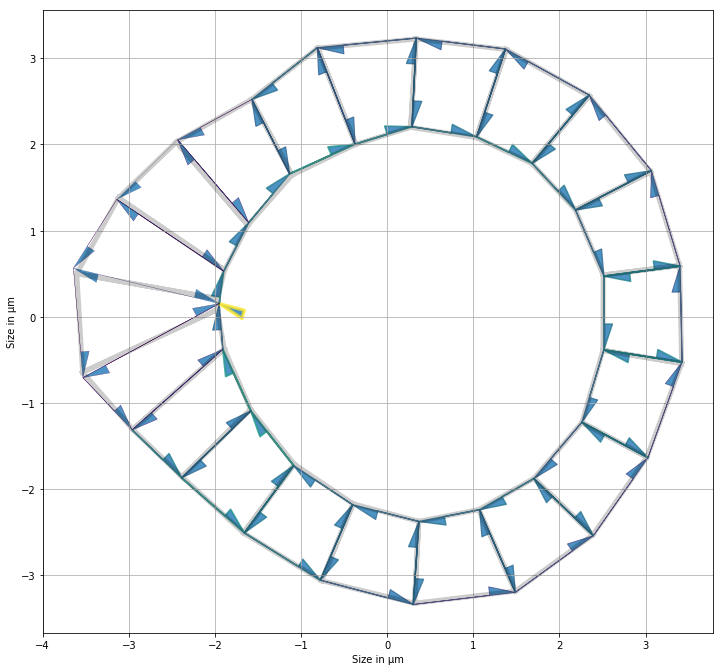

In [233]:
opt_mat_2_cst_organo = to_opt_organo.copy()
opt_mat_2_cst_organo.edge_df.line_tension = prepare_tensions(opt_mat_2_cst_organo, res_2_cst_areas.x[:organo3.Nf*3])
opt_mat_2_cst_organo.face_df.prefered_area = res_2_cst_areas.x[4*organo3.Nf:5*organo3.Nf]
opt_mat_2_cst_organo.settings['prefered_lumen_vol'] = opt_mat_2_cst_organo.settings['lumen_volume'] + res_2_cst_areas.x[-1]
Solver.find_energy_min(opt_mat_2_cst_organo, geom, model)
print_tensions(opt_mat_2_cst_organo, organo3)
print('Distance from th organo to exp organo : ' +
      str(np.sum(np.linalg.norm(_distance(organo3, opt_mat_2_cst_organo), axis=1))))
print('Distance from th tensions to exp tensions : ' +
      str(np.sum(np.linalg.norm(organo3.edge_df.line_tension[:3*organo3.Nf] -
                                opt_mat_2_cst_organo.edge_df.line_tension[:3*organo3.Nf]))))

In [222]:
opt_mat_2_cst_organo.edge_df.line_tension[9]


0.06378887330902122

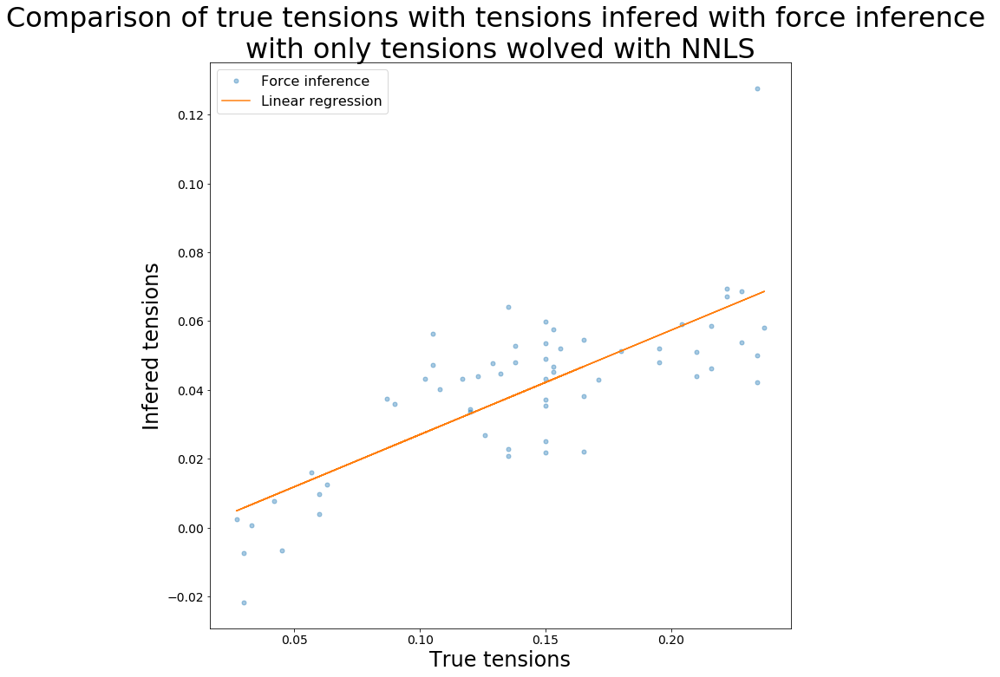

R value : 0.7695370613362816 
Standard error : 0.012816718668101206


In [218]:
rendering_results(organo3, organo3.edge_df.line_tension[:3*organo3.Nf],
                  res_2_cst_areas.x[:3*organo3.Nf],
                  'Comparison of true tensions with tensions infered with force inference \n' +
                  'with only tensions wolved with NNLS',
                  'True tensions', 'Infered tensions', ('Force inference', 'Linear regression'))

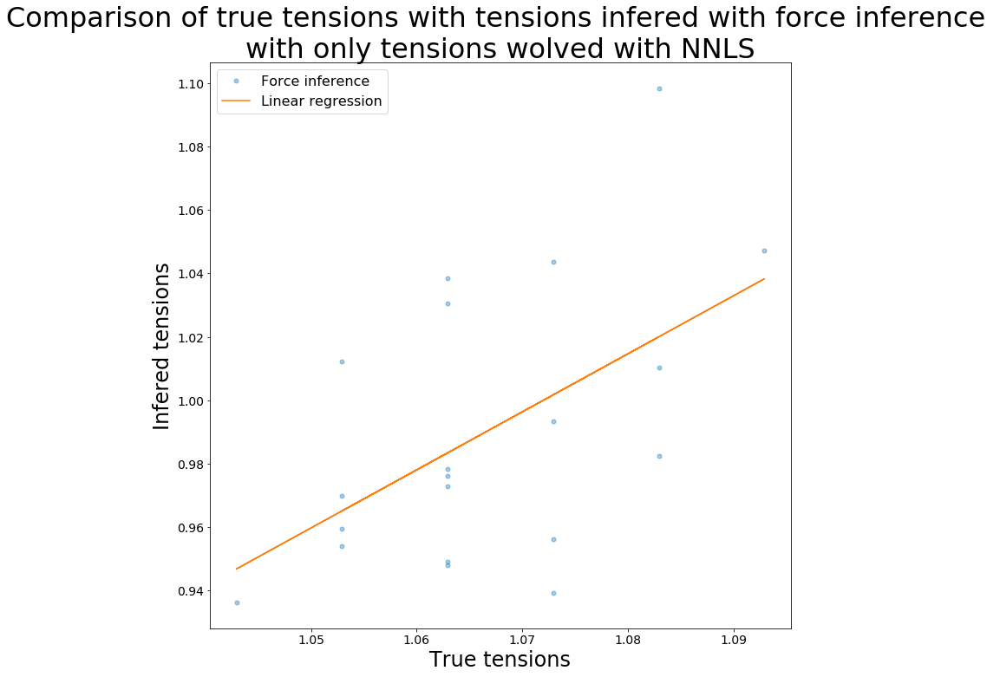

R value : 0.5318108858269545 
Standard error : 0.01800112267943851


In [211]:
rendering_results(organo3, organo3.face_df.eval('prefered_area'),
                  res_2_cst_areas.x[4*organo3.Nf:-1],
                  'Comparison of true tensions with tensions infered with force inference \n' +
                  'with only tensions wolved with NNLS',
                  'True tensions', 'Infered tensions', ('Force inference', 'Linear regression'))

In [196]:
initial_constante = ((params_in_sym_mesh[1:].sum()+params_in_sym_mesh[-1])/3 /
                     (organo3.face_df.area.mean() + params_in_sym_mesh[0])**1.5)
res = adjust_cste(organo3, initial_constante, polar_coefs, org3_lum_vol, **nm_opt)

dist:  7.76843590274555
dist:  7.8919072962073695
dist:  7.736586365739582


KeyboardInterrupt: 

In [106]:
res

 final_simplex: (array([[-0.02198679],
       [-0.02199106]]), array([4.6459769 , 4.64599059]))
           fun: 4.645976901502009
       message: 'Optimization terminated successfully.'
          nfev: 40
           nit: 19
        status: 0
       success: True
             x: array([-0.02198679])

In [111]:
fun_res2 = []
sttpt = 4*((params_in_sym_mesh[1:].sum()+params_in_sym_mesh[-1])/3 /
           (organo3.face_df.area.mean() + params_in_sym_mesh[0])**1.5)
x_points = np.linspace(sttpt-0.05, sttpt+0.05, 101)
org3_lum_vol = organo3.settings['lumen_volume']
for x_point in x_points:
    print(org3_lum_vol)
    th_organo = organo3.copy()
    tmp_eptm = organo3.copy()
    matrix = _coef_matrix(th_organo, sup_param='areas')
    constant = _right_side(th_organo, matrix)
    avg_cste = np.full(th_organo.Nf, 4*x_point)
    avg_cste = np.multiply(np.array(avg_cste), polar_coefs)
    for i in range(th_organo.Nf):
        i_cell_line = np.zeros(4*th_organo.Nf+1)
        index = np.squeeze(np.argwhere(th_organo.edge_df.face.values == i)[:-1])
        i_cell_line[index] = 1
        matrix = np.vstack((matrix, i_cell_line))
    constant = np.concatenate((constant, avg_cste))
    tmp_mat, residuals = nnls(matrix, constant)
    tmp_eptm.edge_df.loc[:, 'line_tension'] = prepare_tensions(tmp_eptm,
                                                               tmp_mat[:3*th_organo.Nf])
    tmp_eptm.face_df.loc[:, 'prefered_area'] = tmp_eptm.face_df.area.copy() + tmp_mat[3*th_organo.Nf:
                                                                                      4*th_organo.Nf]
    tmp_eptm.settings['lumen_prefered_vol'] = org3_lum_vol + tmp_mat[-1]
    Solver.find_energy_min(tmp_eptm, geom, model)
    print(np.sum(np.linalg.norm(_distance(th_organo, tmp_eptm), axis=1)))
    fun_res2.append(np.sum(np.linalg.norm(_distance(th_organo, tmp_eptm), axis=1)))

31.268216246242368
5.218287799946972
31.268216246242368
5.296272424622508
31.268216246242368
4.859528336544939
31.268216246242368
4.893394959764329
31.268216246242368
4.711743530271294
31.268216246242368
4.784752640415532
31.268216246242368
4.763804395370351
31.268216246242368
4.7798957858873425
31.268216246242368
4.826150824166829
31.268216246242368
4.903529900291534
31.268216246242368
4.953899044950106
31.268216246242368
4.997303034909639
31.268216246242368


KeyboardInterrupt: 

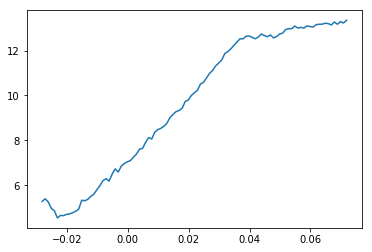

In [101]:
import matplotlib.pyplot as plt
plt.plot(x_points, fun_res2)

[-0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409, -0.08794716926188409]
[-0.15658154 -0.15909373 -0.17346461 -0.17221764 -0.16829056 -0.17293088
 -0.18733718 -0.22560115 -0.27698661 -0.28753976 -0.27427822 -0.24385583
 -0.20102386 -0.19552123 -0.19379864 -0.18604602 -0.1843375  -0.17506707
 -0.16431697 -0.1603858 ]
Apical tensions:  [0.03191277 0.02824555 0.03099001 0.03820137 0.03590613 0.03693041
 0.03562346 0.0289253  0.01729143 0.01624057 0.0227521  0.03453956
 0.04536372 0.03254782 0.04252175 0.0333072  0.03721422 0.03620506
 0.03505788 0.02944833] 
Basal tensions:  [0.04592252 0.04372693 0.03970679 0.03836453 0.036761

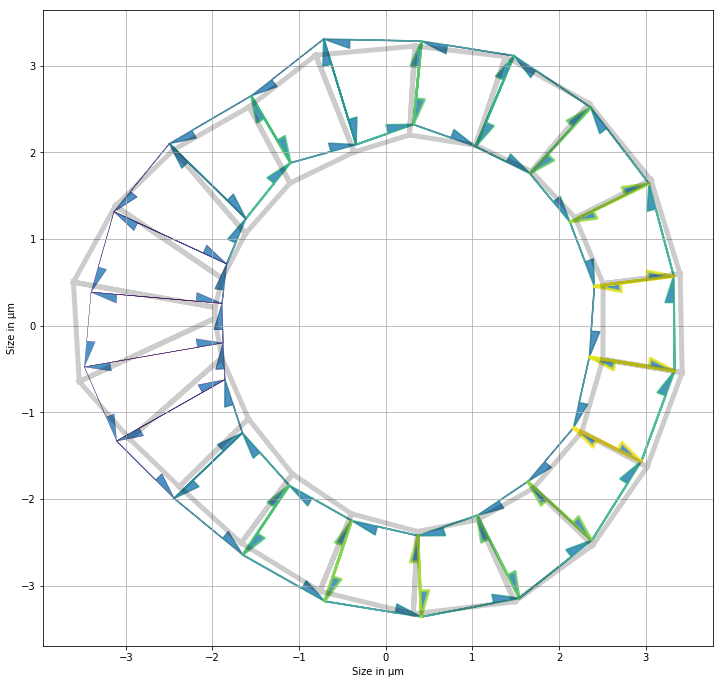

In [109]:
matrix = _coef_matrix(organo3, sup_param='areas')
constant = _right_side(organo3, matrix)
avg_cste = [4*res.x[0]]*organo3.Nf
print(avg_cste)
avg_cste = np.multiply(np.array(avg_cste), polar_coefs)
print(avg_cste)
for i in range(organo3.Nf):
    i_cell_line = np.zeros(4*organo3.Nf+1)
    index = np.squeeze(np.argwhere(organo3.edge_df.face.values == i)[:-1])
    i_cell_line[index] = 1
    matrix = np.vstack((matrix, i_cell_line))
constant = np.concatenate((constant, avg_cste))
mat_eq_cst, residuals = nnls(matrix, constant)
organo3_eq_cst = organo3.copy()
organo3_eq_cst.edge_df.loc[:, 'line_tension'] = prepare_tensions(organo3_eq_cst,
                                                                 mat_eq_cst[:3*organo3.Nf])
organo3_eq_cst.face_df.loc[:, 'prefered_area'] = organo3_eq_cst.face_df.area + mat_eq_cst[3*organo3.Nf:
                                                                                          4*organo3.Nf]
organo3_eq_cst.settings['lumen_prefered_vol'] = organo3_eq_cst.settings['lumen_volume'] + mat_eq_cst[-1]
Solver.find_energy_min(organo3_eq_cst, geom, model)
print_tensions(organo3_eq_cst, organo3)
print('Apical tensions: ', mat_eq_cst[organo3.apical_edges],
      '\nBasal tensions: ', mat_eq_cst[organo3.basal_edges],
      '\nLateral tensions: ', mat_eq_cst[organo3.lateral_edges[:organo3.Nf]],
      '\nArea elasticity: ', mat_eq_cst[organo3.Nf*3:-1],
      '\nLumen area elasticity: ', mat_eq_cst[-1],
      '\nDistance to solution: ', np.linalg.norm(real_data-mat_eq_cst),
      '\nDistance from th org to exp org: ', np.sum(np.linalg.norm(_distance(organo3_eq_cst, organo3), axis=1)),
      '\nNNLS residuals: ', residuals)

In [121]:
from scipy.optimize import minimize, minimize_scalar, least_squares
def _cst_vec_opt_obj(cste, th_organo, polar_coefs, th_lum_vol):
    #print('cste:', cste)
    #print('th organo pos:', th_organo.vert_df.x.head())
    #print('polar_coefs:', polar_coefs[:4])
    tmp_eptm = th_organo.copy()
    matrix = _coef_matrix(th_organo, sup_param='areas')
    constant = _right_side(th_organo, matrix)
    avg_cste = 4*cste
    avg_cste = np.multiply(np.array(avg_cste), polar_coefs)
    for i in range(th_organo.Nf):
        i_cell_line = np.zeros(4*th_organo.Nf+1)
        index = np.squeeze(np.argwhere(th_organo.edge_df.face.values == i)[:-1])
        i_cell_line[index] = 1
        matrix = np.vstack((matrix, i_cell_line))
    constant = np.concatenate((constant, avg_cste))
    tmp_mat, residuals = nnls(matrix, constant)
    tmp_eptm.edge_df.loc[:, 'line_tension'] = prepare_tensions(tmp_eptm,
                                                               tmp_mat[:3*th_organo.Nf])
    tmp_eptm.face_df.loc[:, 'prefered_area'] = th_organo.face_df.area + tmp_mat[3*th_organo.Nf:
                                                                                4*th_organo.Nf]
    tmp_eptm.settings['lumen_prefered_vol'] = th_lum_vol + tmp_mat[-1]
    Solver.find_energy_min(tmp_eptm, geom, model)
    print('dist: ', np.sum(np.linalg.norm(_distance(th_organo, tmp_eptm), axis=1)))
    return np.sum(np.linalg.norm(_distance(th_organo, tmp_eptm), axis=1))


def adjust_cste_vec(organo, init_cste, polar_coefs, th_lum_vol,
                    lb=0.0, ub=10.0,
                    start_ss=1.0, end_ss=1e-3,
                    geom=geom, model=model,
                    verbose=0, **min_opt):
    tmp_th_organo = organo.copy()
    cste_res = minimize(_cst_vec_opt_obj,
                        init_cste,
                        args=(tmp_th_organo, polar_coefs, th_lum_vol),
                        **min_opt)
    return cste_res

In [122]:
initial_constante = ((params_in_sym_mesh[1:].sum()+params_in_sym_mesh[-1])/3 /
                     (organo3.face_df.area.mean() + params_in_sym_mesh[0])**1.5)
initial_constante = np.full(organo3.Nf, initial_constante)
res = adjust_cste_vec(organo3, initial_constante, polar_coefs, org3_lum_vol, **nm_opt)

dist:  7.76843590274555
dist:  7.823414192024717
dist:  7.745659870302507
dist:  7.767784228403485
dist:  7.867847022247844
dist:  7.7593740670721205
dist:  7.720037120251705
dist:  7.7996654830998855
dist:  7.808407525474764
dist:  7.803612556001504
dist:  7.9386664690238735
dist:  7.924637784121622
dist:  7.844377493123432
dist:  7.77914650709158
dist:  7.9250541715298795
dist:  7.698663604269261
dist:  7.721099921439287
dist:  7.841628054857317
dist:  7.7523141919676
dist:  7.757697347277883
dist:  7.748173332870582
dist:  7.809184554402885
dist:  7.7822403386000385
dist:  7.780542935065439
dist:  7.7388729115764825
dist:  7.748694400230494
dist:  7.816853133477133
dist:  7.832839281189889
dist:  7.750666080370369
dist:  7.743554156329006
dist:  7.871522596488795
dist:  7.958581407887504
dist:  7.702468069253807
dist:  7.78173971684107
dist:  7.76179160142132
dist:  7.873557314927459
dist:  7.764835440662457
dist:  7.748862087708986
dist:  7.779676922313081
dist:  7.765403721108542


dist:  7.684537372931402
dist:  7.684518794858742
dist:  7.684196489633534
dist:  7.684244034661156
dist:  7.684265457877567
dist:  7.684453743345355
dist:  7.684476951622033
dist:  7.684574941033737
dist:  7.684322363303183
dist:  7.684388806209352
dist:  7.684139002916109
dist:  7.684390356260954
dist:  7.684561945429333
dist:  7.684290485936152
dist:  7.68410083473203
dist:  7.684051024483987
dist:  7.684224363649273
dist:  7.684193998758561
dist:  7.684282834807388
dist:  7.684053128596877
dist:  7.683958920863986
dist:  7.683808093754214
dist:  7.684040727430756
dist:  7.683959665186529
dist:  7.684135309771692
dist:  7.684197208958745
dist:  7.683875690525087
dist:  7.684220865096866
dist:  7.684001371624853
dist:  7.684007403492808
dist:  7.683758206843063
dist:  7.6835782057277004
dist:  7.683667164214744
dist:  7.68410712335412
dist:  7.684128643195779
dist:  7.683618491795334
dist:  7.683678716411987
dist:  7.683871335706199
dist:  7.683725972665083
dist:  7.683736786930209
d

dist:  7.644720798478643
dist:  7.642596274695674
dist:  7.644022724196356
dist:  7.642318330769354
dist:  7.641580512340946
dist:  7.640938288090572
dist:  7.636880534636685
dist:  7.640147584532897
dist:  7.643768235112198
dist:  7.640004375752543
dist:  7.642296504698706
dist:  7.639900334191053
dist:  7.6383978473994
dist:  7.637798203228705
dist:  7.636849794338676
dist:  7.632574570808204
dist:  7.636080839807951
dist:  7.635005428923871
dist:  7.635510460336705
dist:  7.817972555292879
dist:  7.641881867127601
dist:  7.635308718481351
dist:  7.6339110178483764
dist:  7.634782262517921
dist:  7.637507823372619
dist:  7.632483329161443
dist:  7.627893067411796
dist:  7.632314469004684
dist:  7.6323756952790776
dist:  7.633219568309197
dist:  7.631234598519701
dist:  7.629469606057736
dist:  7.628412792504939
dist:  7.62813236859079
dist:  7.627001206063046
dist:  7.621225527576932
dist:  7.625587979653767
dist:  7.625316430584666
dist:  7.625695455861674
dist:  7.630609835642688
d

dist:  7.510379474615165
dist:  7.508857789577372
dist:  7.509146271792016
dist:  7.509166408049772
dist:  7.509388648517606
dist:  7.695301944076298
dist:  7.513662505168006
dist:  7.654601378002749
dist:  7.513119239750983
dist:  7.69463803533067
dist:  7.513342835826111
dist:  7.507789155458571
dist:  7.508099957547803
dist:  7.548944005681438
dist:  7.511475588887206
dist:  7.509652984001004
dist:  7.50781337490998
dist:  7.50650253136204
dist:  7.506176068476666
dist:  7.506685401800589
dist:  7.505666827193301
dist:  7.507094377058074
dist:  7.504050413718561
dist:  7.500158706281443
dist:  7.503882692524739
dist:  7.50274536785912
dist:  7.6910955929182645
dist:  7.509264524778706
dist:  7.694068250705891
dist:  7.509088112068609
dist:  7.503382668901786
dist:  7.6510500796233885
dist:  7.507857946561962
dist:  7.545217239190709
dist:  7.507472663000943
dist:  7.504468553750041
dist:  7.502970507623623
dist:  7.504743588133117
dist:  7.502273048582615
dist:  7.501479200706562
di

dist:  7.402823942310335
dist:  7.401944047136664
dist:  7.401875260050623
dist:  7.401233374854517
dist:  7.399618392554801
dist:  7.457806840131068
dist:  7.416839985735722
dist:  7.452684781094309
dist:  7.416184960145675
dist:  7.399303585837687
dist:  7.398747631647341
dist:  7.396315042247398
dist:  7.455337415628891
dist:  7.451845798547
dist:  7.412026109552327
dist:  7.396593958281219
dist:  7.460112099013221
dist:  7.411176237279755
dist:  7.454866228408836
dist:  7.4110256858116195
dist:  7.394929543443826
dist:  7.439014001714856
dist:  7.393871098276604
dist:  7.43713775435559
dist:  7.391665799240139
dist:  7.4519428852544385
dist:  7.446192478956263
dist:  7.406999476354093
dist:  7.392234556431568
dist:  7.456754734059345
dist:  7.406276996156234
dist:  7.452085050997567
dist:  7.40575672872769
dist:  7.390249834053945
dist:  7.439324019179542
dist:  7.3899256529474
dist:  7.456528489686744
dist:  7.390765607981825
dist:  7.453373566446505
dist:  7.401929946776322
dist:

dist:  7.329501099317936
dist:  7.331174139613403
dist:  7.330923979743727
dist:  7.3309087296750395
dist:  7.332015916547481
dist:  7.330593382629815
dist:  7.330974119668861
dist:  7.330046812969939
dist:  7.329686109927395
dist:  7.329566968882412
dist:  7.32953414035073
dist:  7.329311580543754
dist:  7.327964153819414
dist:  7.3291664283453715
dist:  7.328189243621208
dist:  7.329440465331357
dist:  7.328520457526528
dist:  7.327939158159886
dist:  7.325991118419788
dist:  7.327498054509435
dist:  7.327349001528352
dist:  7.327815494433518
dist:  7.326557257585941
dist:  7.326344198158984
dist:  7.326290333208305
dist:  7.326612541832513
dist:  7.325831487115568
dist:  7.324043560853771
dist:  7.325658881912462
dist:  7.3250931355221525
dist:  7.325313965913929
dist:  7.324755247657718
dist:  7.324960494135342
dist:  7.324256129592619
dist:  7.323801680802294
dist:  7.354654972171305
dist:  7.323884074585826
dist:  7.323613303784711
dist:  7.3488748621321625
dist:  7.3234599668187

dist:  7.317442058175884
dist:  7.317290059643471
dist:  7.317502158925495
dist:  7.317271073437042
dist:  7.317213130832226
dist:  7.437301083705445
dist:  7.317307689591855
dist:  7.3172397999137
dist:  7.317441717959446
dist:  7.317250977304568
dist:  7.317407907991493
dist:  7.317267226425419
dist:  7.434769788523184
dist:  7.31729522530247
dist:  7.31719439978918
dist:  7.4405023018213585
dist:  7.317288450914717
dist:  7.433460765064991
dist:  7.317278735523452
dist:  7.441032397843772
dist:  7.317273583961497
dist:  7.317565120808212
dist:  7.317216113630245
dist:  7.317347741813689
dist:  7.317234793386967
dist:  7.317296438272283
dist:  7.317103864023836
dist:  7.44193102465619
dist:  7.317292043226719
dist:  7.437765648463628
dist:  7.3172403613905495
dist:  7.317343194934534
dist:  7.3172120958597455
dist:  7.317300429739772
dist:  7.317212995256372
dist:  7.317190884356396
dist:  7.443472647728317
dist:  7.3172343928947825
dist:  7.317201326074677
dist:  7.438126056159662
d

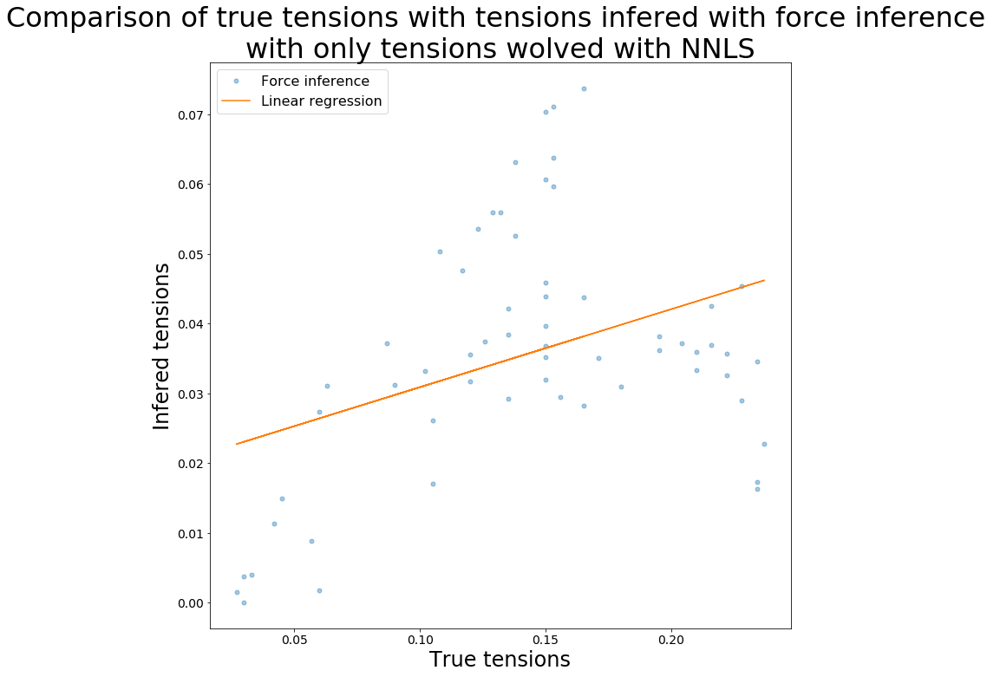

R value : 0.3799859902646536 
Standard error : 0.013850142387396527


In [110]:
rendering_results(organo3, organo3.edge_df.line_tension[:3*organo3.Nf],
                  organo3_eq_cst.edge_df.line_tension[:3*organo3.Nf],
                  'Comparison of true tensions with tensions infered with force inference \n' +
                  'with only tensions wolved with NNLS',
                  'True tensions', 'Infered tensions', ('Force inference', 'Linear regression'))

On utilise le résultat de l'inférence de forces comme point initial pour lancer la minimisation de la distance

In [34]:
iprint_file = "../../assets/dist_at_each_f_ev/11_03_eq_t_per_cell_areas_opt.txt"
to_opt_organo = organo3.copy()
init_point_area_and_tensions_opt = np.concatenate((prepare_tensions(to_opt_organo, mat_eq_cst[:3*organo3.Nf]),
                                                   to_opt_organo.face_df.area + mat_eq_cst[3*organo3.Nf:-1],
                                                   [to_opt_organo.settings['lumen_volume'] + mat_eq_cst[-1]]))
res_2_cst_areas = adjust_parameters(to_opt_organo,
                                    init_point_area_and_tensions_opt,
                                    {'dic':{'apical' : False, 'basal': False}, 'weight':0},
                                    energy_min_opt=energy_opt,
                                    **lm_opt)

7.789122840922073 [0.22073539 0.21393268 0.21338396 0.16688329 0.06571747 0.08687089
 0.24499146 0.35100211 0.40025486 0.27392531 0.1716366  0.2911632
 0.31831377 0.29178964 0.12830658 0.0928249  0.07763812 0.13449715
 0.20028108 0.21203756 0.09329621 0.12963542 0.15194763 0.17563481
 0.19495031 0.27716489 0.34567285 0.30321745 0.09026354 0.09747601
 0.10059208 0.07715672 0.22702022 0.26967757 0.31652474 0.16364074
 0.17031666 0.1690181  0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.789122840270124 [0.22073539 0.21393268 0.21338396 0.16688329 0.06571748 0.08687089
 0.24499146 0.35100211 0.40025486 0.27392531 0.1716366  0.2911632
 0.31831377 0.29178964 0.12830658 0.0928249  0.07763812 0.13449715
 0.20028108 0.21203756 0.09329621 0.12963542 0.15194763 0.17563481
 0.19495031 0.27716489 0.34567285 0.30321745 0.09026354 0.09747601
 0.10059208 0.07715673 0.22702022 0.26967757 0.31652474 0.16364074
 0.17031666 0.1690181  0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.789122765443235 [0.22073539 0.21393268 0.21338396 0.16688329 0.06571747 0.08687089
 0.24499146 0.3510021  0.40025486 0.2739253  0.17163659 0.2911632
 0.31831376 0.29178963 0.12830658 0.0928249  0.07763812 0.13449715
 0.20028108 0.21203756 0.09329621 0.12963542 0.15194763 0.17563481
 0.19495031 0.27716489 0.34567285 0.30321744 0.09026354 0.097476
 0.10059208 0.07715672 0.22702022 0.26967757 0.31652474 0.16364074
 0.17031666 0.1690181  0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.     

7.789122845915311 [0.22073539 0.21393268 0.21338396 0.16688329 0.06571747 0.08687089
 0.24499146 0.35100211 0.40025486 0.27392531 0.1716366  0.2911632
 0.31831377 0.29178964 0.12830658 0.0928249  0.07763812 0.13449715
 0.20028109 0.21203756 0.09329621 0.12963542 0.15194763 0.17563481
 0.19495031 0.27716489 0.34567285 0.30321745 0.09026354 0.09747601
 0.10059208 0.07715672 0.22702022 0.26967757 0.31652474 0.16364074
 0.17031666 0.1690181  0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.789122842207984 [0.22073539 0.21393268 0.21338396 0.16688329 0.06571747 0.08687089
 0.24499146 0.35100211 0.40025486 0.27392531 0.1716366  0.2911632
 0.31831377 0.29178964 0.12830658 0.0928249  0.07763812 0.13449715
 0.20028108 0.21203756 0.09329621 0.12963542 0.15194764 0.17563481
 0.19495031 0.27716489 0.34567285 0.30321745 0.09026354 0.09747601
 0.10059208 0.07715673 0.22702022 0.26967757 0.31652474 0.16364074
 0.17031666 0.1690181  0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.78912283680526 [0.22073539 0.21393268 0.21338396 0.16688329 0.06571747 0.08687089
 0.24499146 0.35100211 0.40025486 0.27392531 0.1716366  0.2911632
 0.31831377 0.29178964 0.12830658 0.0928249  0.07763812 0.13449715
 0.20028108 0.21203756 0.09329621 0.12963542 0.15194763 0.17563481
 0.19495031 0.27716489 0.34567285 0.30321745 0.09026354 0.09747601
 0.10059208 0.07715672 0.22702022 0.26967757 0.31652474 0.16364074
 0.17031666 0.1690181  0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

7.789122844404222 [0.22073539 0.21393268 0.21338396 0.16688329 0.06571747 0.08687089
 0.24499146 0.35100211 0.40025487 0.27392531 0.1716366  0.2911632
 0.31831377 0.29178963 0.12830658 0.0928249  0.07763812 0.13449715
 0.20028108 0.21203756 0.09329621 0.12963542 0.15194763 0.17563481
 0.19495031 0.27716489 0.34567285 0.30321745 0.09026354 0.09747601
 0.10059208 0.07715672 0.22702022 0.26967757 0.31652473 0.16364074
 0.17031666 0.1690181  0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.789122845202121 [0.2207354  0.21393268 0.21338396 0.16688329 0.06571747 0.08687089
 0.24499146 0.35100211 0.40025486 0.27392531 0.1716366  0.2911632
 0.31831377 0.29178964 0.12830658 0.0928249  0.07763812 0.13449715
 0.20028108 0.21203756 0.09329621 0.12963542 0.15194763 0.17563481
 0.19495031 0.27716489 0.34567285 0.30321745 0.09026354 0.09747601
 0.10059208 0.07715673 0.22702022 0.26967757 0.31652474 0.16364074
 0.17031666 0.1690181  0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.789122844944942 [0.22073539 0.21393268 0.21338396 0.16688329 0.06571748 0.0868709
 0.24499146 0.35100211 0.40025486 0.27392531 0.1716366  0.2911632
 0.31831377 0.29178964 0.12830658 0.0928249  0.07763812 0.13449715
 0.20028109 0.21203756 0.09329621 0.12963542 0.15194763 0.17563481
 0.19495031 0.27716488 0.34567285 0.30321745 0.09026354 0.09747601
 0.10059208 0.07715672 0.22702022 0.26967757 0.31652474 0.16364074
 0.17031666 0.1690181  0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

7.78912286673509 [0.22073539 0.21393268 0.21338396 0.16688329 0.06571747 0.08687089
 0.24499146 0.35100211 0.40025487 0.27392531 0.1716366  0.29116321
 0.31831377 0.29178964 0.12830658 0.0928249  0.07763812 0.13449715
 0.20028109 0.21203756 0.09329621 0.12963542 0.15194763 0.17563481
 0.19495031 0.27716489 0.34567285 0.30321745 0.09026354 0.09747601
 0.10059208 0.07715672 0.22702022 0.26967757 0.31652474 0.16364074
 0.17031666 0.1690181  0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.789122843638466 [0.22073539 0.21393268 0.21338396 0.16688329 0.06571747 0.08687089
 0.24499146 0.35100211 0.40025487 0.27392531 0.1716366  0.2911632
 0.31831377 0.29178964 0.12830658 0.0928249  0.07763812 0.13449715
 0.20028109 0.21203756 0.09329621 0.12963542 0.15194763 0.17563481
 0.19495031 0.27716489 0.34567285 0.30321745 0.09026354 0.09747601
 0.10059208 0.07715672 0.22702022 0.26967757 0.31652474 0.16364074
 0.17031666 0.16901811 0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.789122840922073 [0.22073539 0.21393268 0.21338396 0.16688329 0.06571747 0.08687089
 0.24499146 0.35100211 0.40025486 0.27392531 0.1716366  0.2911632
 0.31831377 0.29178964 0.12830658 0.0928249  0.07763812 0.13449715
 0.20028108 0.21203756 0.09329621 0.12963542 0.15194763 0.17563481
 0.19495031 0.27716489 0.34567285 0.30321745 0.09026354 0.09747601
 0.10059208 0.07715672 0.22702022 0.26967757 0.31652474 0.16364074
 0.17031666 0.1690181  0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.789122840922073 [0.22073539 0.21393268 0.21338396 0.16688329 0.06571747 0.08687089
 0.24499146 0.35100211 0.40025486 0.27392531 0.1716366  0.2911632
 0.31831377 0.29178964 0.12830658 0.0928249  0.07763812 0.13449715
 0.20028108 0.21203756 0.09329621 0.12963542 0.15194763 0.17563481
 0.19495031 0.27716489 0.34567285 0.30321745 0.09026354 0.09747601
 0.10059208 0.07715672 0.22702022 0.26967757 0.31652474 0.16364074
 0.17031666 0.1690181  0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.789122840922073 [0.22073539 0.21393268 0.21338396 0.16688329 0.06571747 0.08687089
 0.24499146 0.35100211 0.40025486 0.27392531 0.1716366  0.2911632
 0.31831377 0.29178964 0.12830658 0.0928249  0.07763812 0.13449715
 0.20028108 0.21203756 0.09329621 0.12963542 0.15194763 0.17563481
 0.19495031 0.27716489 0.34567285 0.30321745 0.09026354 0.09747601
 0.10059208 0.07715672 0.22702022 0.26967757 0.31652474 0.16364074
 0.17031666 0.1690181  0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.789122775329293 [0.22073539 0.21393268 0.21338396 0.16688329 0.06571747 0.08687089
 0.24499146 0.35100211 0.40025486 0.27392531 0.1716366  0.2911632
 0.31831376 0.29178963 0.12830658 0.0928249  0.07763812 0.13449715
 0.20028108 0.21203756 0.09329621 0.12963542 0.15194763 0.17563481
 0.19495031 0.27716489 0.34567285 0.30321745 0.09026354 0.097476
 0.10059208 0.07715673 0.22702022 0.26967757 0.31652473 0.16364074
 0.17031666 0.1690181  0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.     

7.789122693902227 [0.22073539 0.21393268 0.21338397 0.16688328 0.06571746 0.0868709
 0.24499146 0.35100207 0.40025482 0.27392529 0.1716365  0.29116321
 0.31831374 0.29178964 0.1283066  0.09282491 0.07763813 0.13449715
 0.20028108 0.21203756 0.09329622 0.12963541 0.15194763 0.17563482
 0.19495034 0.2771649  0.34567284 0.30321742 0.09026355 0.09747601
 0.10059213 0.07715671 0.22702019 0.26967755 0.31652475 0.16364074
 0.17031668 0.16901809 0.15113014 0.12860071 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.789122170562854 [0.22073537 0.21393265 0.21338395 0.16688328 0.06571748 0.08687088
 0.24499143 0.35100204 0.4002548  0.2739253  0.17163658 0.29116319
 0.31831371 0.29178958 0.12830657 0.09282489 0.07763813 0.13449713
 0.20028107 0.21203754 0.09329622 0.1296354  0.15194761 0.1756348
 0.19495032 0.2771649  0.34567283 0.30321741 0.09026357 0.09747597
 0.10059205 0.07715675 0.22702021 0.26967752 0.3165247  0.16364074
 0.17031665 0.16901809 0.15113014 0.1286007  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.789122556855241 [0.22073539 0.21393267 0.21338396 0.16688329 0.06571748 0.08687089
 0.24499145 0.35100208 0.40025484 0.2739253  0.1716366  0.2911632
 0.31831375 0.29178961 0.12830658 0.0928249  0.07763812 0.13449714
 0.20028108 0.21203755 0.09329621 0.12963541 0.15194762 0.1756348
 0.19495031 0.27716489 0.34567284 0.30321743 0.09026355 0.09747599
 0.10059207 0.07715674 0.22702022 0.26967755 0.31652472 0.16364074
 0.17031665 0.1690181  0.15113014 0.1286007  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

2.762153912225747 [0.04033955 0.04294743 0.03418847 0.05955955 0.08146448 0.12709367
 0.11283018 0.04757488 0.09315528 0.12623885 0.11673745 0.12594674
 0.01457412 0.08401989 0.04301054 0.11499671 0.020557   0.0523984
 0.0514449  0.03150625 0.01714721 0.0213721  0.06160543 0.08212889
 0.02142061 0.03232791 0.12894515 0.15075947 0.04442122 0.07586254
 0.05485391 0.18737357 0.1096679  0.03698851 0.17921152 0.01153651
 0.03695753 0.03767533 0.0194159  0.03189837 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

2.7621538733550692 [0.04033955 0.04294743 0.03418847 0.05955955 0.08146448 0.12709367
 0.11283018 0.04757488 0.09315528 0.12623884 0.11673745 0.12594674
 0.01457412 0.08401989 0.04301054 0.11499671 0.020557   0.0523984
 0.0514449  0.03150625 0.01714721 0.0213721  0.06160543 0.08212889
 0.02142061 0.03232791 0.12894515 0.15075947 0.04442121 0.07586252
 0.05485391 0.18737357 0.1096679  0.03698851 0.17921152 0.01153651
 0.03695753 0.03767533 0.0194159  0.03189837 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

2.762153921151981 [0.04033955 0.04294743 0.03418847 0.05955955 0.08146448 0.12709367
 0.11283018 0.04757488 0.09315528 0.12623885 0.11673745 0.12594674
 0.01457412 0.08401989 0.04301055 0.11499671 0.020557   0.0523984
 0.0514449  0.03150625 0.01714721 0.0213721  0.06160543 0.08212889
 0.02142061 0.03232791 0.12894515 0.15075947 0.04442122 0.07586254
 0.05485391 0.18737357 0.1096679  0.03698851 0.17921152 0.0115365
 0.03695753 0.03767533 0.0194159  0.03189837 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

2.762153914501543 [0.04033955 0.04294743 0.03418847 0.05955955 0.08146448 0.12709367
 0.11283018 0.04757488 0.09315528 0.12623885 0.11673745 0.12594674
 0.01457412 0.08401989 0.04301054 0.11499671 0.020557   0.0523984
 0.0514449  0.03150625 0.01714721 0.0213721  0.06160543 0.08212889
 0.02142061 0.03232791 0.12894515 0.15075947 0.04442122 0.07586254
 0.05485391 0.18737357 0.1096679  0.03698851 0.17921152 0.01153651
 0.03695753 0.03767533 0.0194159  0.03189837 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

2.7621539031769116 [0.04033955 0.04294743 0.03418847 0.05955955 0.08146448 0.12709367
 0.11283018 0.04757488 0.09315528 0.12623885 0.11673745 0.12594674
 0.01457412 0.08401989 0.04301054 0.11499671 0.020557   0.0523984
 0.0514449  0.03150625 0.01714721 0.0213721  0.06160543 0.08212889
 0.02142061 0.03232791 0.12894515 0.15075947 0.04442122 0.07586254
 0.05485391 0.18737357 0.1096679  0.03698851 0.17921152 0.01153651
 0.03695753 0.03767533 0.0194159  0.03189837 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

2.7621539064532294 [0.04033955 0.04294743 0.03418847 0.05955955 0.08146448 0.12709367
 0.11283018 0.04757488 0.09315528 0.12623885 0.11673745 0.12594674
 0.01457412 0.08401989 0.04301054 0.11499671 0.020557   0.0523984
 0.0514449  0.03150625 0.01714721 0.0213721  0.06160543 0.08212889
 0.02142061 0.03232791 0.12894515 0.15075947 0.04442122 0.07586254
 0.05485391 0.18737357 0.1096679  0.03698851 0.17921152 0.01153651
 0.03695753 0.03767533 0.0194159  0.03189837 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

2.7621539110370135 [0.04033955 0.04294743 0.03418847 0.05955955 0.08146448 0.12709367
 0.11283018 0.04757488 0.09315528 0.12623885 0.11673745 0.12594674
 0.01457412 0.08401989 0.04301054 0.11499671 0.020557   0.0523984
 0.0514449  0.03150625 0.01714721 0.0213721  0.06160543 0.08212889
 0.02142061 0.03232791 0.12894515 0.15075947 0.04442122 0.07586254
 0.05485391 0.18737357 0.1096679  0.03698851 0.17921152 0.01153651
 0.03695753 0.03767533 0.0194159  0.03189836 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

2.762153929619223 [0.04033955 0.04294743 0.03418847 0.05955955 0.08146448 0.12709367
 0.11283018 0.04757488 0.09315528 0.12623885 0.11673745 0.12594674
 0.01457412 0.08401989 0.04301054 0.11499671 0.020557   0.0523984
 0.0514449  0.03150625 0.01714721 0.0213721  0.06160543 0.0821289
 0.02142061 0.03232791 0.12894515 0.15075947 0.04442122 0.07586254
 0.05485391 0.18737357 0.1096679  0.03698851 0.17921152 0.01153651
 0.03695753 0.03767533 0.0194159  0.03189837 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

2.7621539100615564 [0.04033955 0.04294743 0.03418847 0.05955955 0.08146448 0.12709367
 0.11283018 0.04757488 0.09315528 0.12623885 0.11673745 0.12594674
 0.01457412 0.08401989 0.04301054 0.11499671 0.020557   0.0523984
 0.0514449  0.03150625 0.01714721 0.0213721  0.06160543 0.08212889
 0.02142061 0.03232791 0.12894515 0.15075947 0.04442122 0.07586254
 0.05485391 0.18737357 0.1096679  0.03698851 0.17921152 0.01153651
 0.03695753 0.03767533 0.0194159  0.03189837 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

2.762153912648067 [0.04033955 0.04294743 0.03418847 0.05955955 0.08146448 0.12709367
 0.11283018 0.04757488 0.09315528 0.12623885 0.11673745 0.12594674
 0.01457412 0.08401989 0.04301054 0.11499671 0.020557   0.0523984
 0.0514449  0.03150625 0.01714721 0.0213721  0.06160543 0.08212889
 0.02142061 0.03232791 0.12894515 0.15075947 0.04442122 0.07586254
 0.05485391 0.18737357 0.1096679  0.03698851 0.17921152 0.0115365
 0.03695753 0.03767533 0.0194159  0.03189837 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

2.7621539108060444 [0.04033955 0.04294743 0.03418847 0.05955955 0.08146448 0.12709367
 0.11283018 0.04757488 0.09315528 0.12623885 0.11673745 0.12594674
 0.01457412 0.08401989 0.04301054 0.11499671 0.020557   0.0523984
 0.0514449  0.03150625 0.01714721 0.0213721  0.06160543 0.08212889
 0.02142061 0.03232791 0.12894515 0.15075947 0.04442122 0.07586254
 0.05485391 0.18737357 0.1096679  0.03698851 0.17921152 0.01153651
 0.03695753 0.03767533 0.0194159  0.03189837 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

2.7621539108060444 [0.04033955 0.04294743 0.03418847 0.05955955 0.08146448 0.12709367
 0.11283018 0.04757488 0.09315528 0.12623885 0.11673745 0.12594674
 0.01457412 0.08401989 0.04301054 0.11499671 0.020557   0.0523984
 0.0514449  0.03150625 0.01714721 0.0213721  0.06160543 0.08212889
 0.02142061 0.03232791 0.12894515 0.15075947 0.04442122 0.07586254
 0.05485391 0.18737357 0.1096679  0.03698851 0.17921152 0.01153651
 0.03695753 0.03767533 0.0194159  0.03189837 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

2.7621539108060444 [0.04033955 0.04294743 0.03418847 0.05955955 0.08146448 0.12709367
 0.11283018 0.04757488 0.09315528 0.12623885 0.11673745 0.12594674
 0.01457412 0.08401989 0.04301054 0.11499671 0.020557   0.0523984
 0.0514449  0.03150625 0.01714721 0.0213721  0.06160543 0.08212889
 0.02142061 0.03232791 0.12894515 0.15075947 0.04442122 0.07586254
 0.05485391 0.18737357 0.1096679  0.03698851 0.17921152 0.01153651
 0.03695753 0.03767533 0.0194159  0.03189837 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

2.7621538896499063 [0.04033955 0.04294743 0.03418847 0.05955955 0.08146448 0.12709367
 0.11283018 0.04757488 0.09315528 0.12623885 0.11673745 0.12594674
 0.01457412 0.08401989 0.04301054 0.11499671 0.020557   0.0523984
 0.0514449  0.03150624 0.01714721 0.02137209 0.06160543 0.08212889
 0.02142061 0.03232791 0.12894515 0.15075947 0.04442122 0.07586254
 0.05485391 0.18737357 0.1096679  0.03698851 0.17921152 0.01153651
 0.03695753 0.03767533 0.0194159  0.03189836 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

2.7621540189064184 [0.04033956 0.04294744 0.03418847 0.05955955 0.08146448 0.12709368
 0.11283018 0.04757489 0.09315528 0.12623887 0.11673747 0.12594675
 0.01457411 0.0840199  0.04301054 0.11499672 0.02055701 0.0523984
 0.05144491 0.03150625 0.01714721 0.0213721  0.06160543 0.08212889
 0.0214206  0.0323279  0.12894515 0.15075948 0.04442123 0.07586254
 0.0548539  0.18737357 0.10966789 0.03698852 0.17921153 0.01153649
 0.03695753 0.03767533 0.0194159  0.03189836 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

2.7621540458234692 [0.04033956 0.04294744 0.03418847 0.05955955 0.08146448 0.12709368
 0.11283018 0.04757489 0.09315529 0.12623888 0.11673747 0.12594675
 0.01457411 0.0840199  0.04301054 0.11499673 0.02055701 0.0523984
 0.05144491 0.03150625 0.01714721 0.0213721  0.06160543 0.08212889
 0.0214206  0.0323279  0.12894516 0.15075948 0.04442123 0.07586254
 0.0548539  0.18737357 0.10966788 0.03698853 0.17921153 0.01153648
 0.03695753 0.03767533 0.0194159  0.03189836 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

2.762153900689962 [0.04033955 0.04294743 0.03418847 0.05955955 0.08146448 0.12709367
 0.11283018 0.04757488 0.09315528 0.12623885 0.11673745 0.12594674
 0.01457412 0.08401989 0.04301054 0.11499671 0.020557   0.0523984
 0.0514449  0.03150625 0.0171472  0.0213721  0.06160543 0.08212889
 0.02142061 0.03232791 0.12894515 0.15075947 0.04442122 0.07586254
 0.05485391 0.18737357 0.1096679  0.03698851 0.17921152 0.01153651
 0.03695753 0.03767533 0.0194159  0.03189837 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

1.9284576749872702 [0.02365172 0.06146777 0.02027361 0.01608254 0.02715593 0.04999413
 0.04226229 0.04761271 0.10138328 0.05648526 0.04129222 0.03406526
 0.07838078 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953269 0.05710573 0.08163963 0.03461695 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111299 0.14463987 0.04245597
 0.04583498 0.0363457  0.14233481 0.04325879 0.03172877 0.03392691
 0.05205945 0.05526587 0.01667062 0.04016698 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

1.9284576665788107 [0.02365173 0.06146777 0.02027361 0.01608254 0.02715593 0.04999413
 0.04226229 0.04761271 0.10138327 0.05648525 0.04129222 0.03406526
 0.07838078 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953269 0.05710573 0.08163963 0.03461696 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111298 0.14463986 0.04245597
 0.04583498 0.0363457  0.14233481 0.04325879 0.03172877 0.03392691
 0.05205945 0.05526587 0.01667062 0.04016698 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

1.9284576799434245 [0.02365172 0.06146777 0.02027361 0.01608254 0.02715593 0.04999413
 0.04226229 0.04761271 0.10138328 0.05648526 0.04129222 0.03406526
 0.07838078 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953269 0.05710573 0.08163963 0.03461696 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111299 0.14463987 0.04245597
 0.04583498 0.0363457  0.14233481 0.04325879 0.03172878 0.03392691
 0.05205945 0.05526587 0.01667062 0.04016698 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

1.9284576850843593 [0.02365172 0.06146777 0.02027361 0.01608254 0.02715593 0.04999413
 0.04226229 0.04761271 0.10138328 0.05648526 0.04129222 0.03406526
 0.07838078 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953269 0.05710573 0.08163963 0.03461696 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111299 0.14463987 0.04245597
 0.04583498 0.0363457  0.14233481 0.04325879 0.03172877 0.03392691
 0.05205945 0.05526587 0.01667062 0.04016698 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

1.9284576861720257 [0.02365172 0.06146777 0.02027361 0.01608254 0.02715593 0.04999413
 0.04226229 0.04761271 0.10138328 0.05648526 0.04129222 0.03406526
 0.07838078 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953269 0.05710573 0.08163963 0.03461696 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111299 0.14463987 0.04245597
 0.04583498 0.0363457  0.14233481 0.04325879 0.03172877 0.03392691
 0.05205945 0.05526587 0.01667062 0.04016698 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

1.9284576918632106 [0.02365172 0.06146777 0.02027361 0.01608254 0.02715593 0.04999413
 0.04226229 0.04761271 0.10138328 0.05648526 0.04129222 0.03406526
 0.07838079 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953269 0.05710573 0.08163963 0.03461696 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111299 0.14463987 0.04245597
 0.04583498 0.03634569 0.14233482 0.04325879 0.03172877 0.03392691
 0.05205945 0.05526587 0.01667062 0.04016698 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

1.9284576830514202 [0.02365172 0.06146777 0.02027361 0.01608254 0.02715593 0.04999413
 0.04226229 0.04761271 0.10138328 0.05648526 0.04129222 0.03406526
 0.07838078 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953269 0.05710573 0.08163963 0.03461696 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111299 0.14463987 0.04245597
 0.04583498 0.0363457  0.14233481 0.04325879 0.03172877 0.03392691
 0.05205945 0.05526587 0.01667062 0.04016697 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

1.928457680288345 [0.02365172 0.06146777 0.02027361 0.01608254 0.02715594 0.04999412
 0.04226229 0.04761271 0.10138328 0.05648526 0.04129222 0.03406526
 0.07838078 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953269 0.05710573 0.08163963 0.03461696 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111299 0.14463987 0.04245597
 0.04583498 0.0363457  0.14233481 0.04325879 0.03172877 0.03392691
 0.05205945 0.05526587 0.01667062 0.04016698 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

1.9284576805556077 [0.02365172 0.06146777 0.02027361 0.01608254 0.02715593 0.04999413
 0.04226229 0.04761271 0.10138328 0.05648526 0.04129222 0.03406526
 0.07838078 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953269 0.05710573 0.08163963 0.03461696 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111299 0.14463987 0.04245597
 0.04583498 0.03634569 0.14233482 0.04325879 0.03172877 0.03392691
 0.05205945 0.05526587 0.01667062 0.04016698 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

1.928457681100217 [0.02365172 0.06146777 0.02027361 0.01608254 0.02715593 0.04999413
 0.04226229 0.04761271 0.10138328 0.05648526 0.04129222 0.03406526
 0.07838078 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953269 0.05710573 0.08163963 0.03461696 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111299 0.14463987 0.04245597
 0.04583498 0.0363457  0.14233481 0.04325879 0.03172877 0.03392691
 0.05205945 0.05526587 0.01667062 0.04016698 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

1.9284576831954512 [0.02365172 0.06146777 0.02027361 0.01608254 0.02715593 0.04999413
 0.04226229 0.04761271 0.10138328 0.05648526 0.04129222 0.03406526
 0.07838078 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953269 0.05710573 0.08163963 0.03461696 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111299 0.14463987 0.04245597
 0.04583498 0.0363457  0.14233481 0.04325879 0.03172877 0.03392691
 0.05205945 0.05526587 0.01667062 0.04016698 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

1.9284576831954512 [0.02365172 0.06146777 0.02027361 0.01608254 0.02715593 0.04999413
 0.04226229 0.04761271 0.10138328 0.05648526 0.04129222 0.03406526
 0.07838078 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953269 0.05710573 0.08163963 0.03461696 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111299 0.14463987 0.04245597
 0.04583498 0.0363457  0.14233481 0.04325879 0.03172877 0.03392691
 0.05205945 0.05526587 0.01667062 0.04016698 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

1.9284576831954512 [0.02365172 0.06146777 0.02027361 0.01608254 0.02715593 0.04999413
 0.04226229 0.04761271 0.10138328 0.05648526 0.04129222 0.03406526
 0.07838078 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953269 0.05710573 0.08163963 0.03461696 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111299 0.14463987 0.04245597
 0.04583498 0.0363457  0.14233481 0.04325879 0.03172877 0.03392691
 0.05205945 0.05526587 0.01667062 0.04016698 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

1.9284576841773018 [0.02365172 0.06146777 0.02027361 0.01608254 0.02715593 0.04999413
 0.04226229 0.04761271 0.10138328 0.05648526 0.04129222 0.03406526
 0.07838078 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953269 0.05710573 0.08163963 0.03461696 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111299 0.14463987 0.04245597
 0.04583498 0.0363457  0.14233481 0.04325879 0.03172877 0.03392691
 0.05205946 0.05526587 0.01667062 0.04016698 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

1.928457690193317 [0.02365173 0.06146777 0.02027361 0.01608254 0.02715593 0.04999413
 0.04226229 0.04761271 0.10138328 0.05648526 0.04129222 0.03406526
 0.07838078 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953269 0.05710573 0.08163963 0.03461696 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111299 0.14463987 0.04245597
 0.04583498 0.0363457  0.14233481 0.04325879 0.03172877 0.03392691
 0.05205946 0.05526587 0.01667062 0.04016698 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

1.9284577587956926 [0.02365171 0.06146777 0.02027361 0.01608254 0.02715594 0.04999413
 0.0422623  0.04761271 0.10138329 0.05648527 0.04129223 0.03406527
 0.07838079 0.03440983 0.01380792 0.06875253 0.02025216 0.0171603
 0.04953269 0.05710574 0.08163965 0.03461695 0.0097624  0.01295787
 0.04088673 0.04020561 0.03145814 0.13111298 0.14463987 0.04245595
 0.04583498 0.0363457  0.14233482 0.04325879 0.03172878 0.03392691
 0.05205946 0.05526587 0.01667062 0.04016697 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

1.9284576930048676 [0.02365172 0.06146777 0.02027361 0.01608254 0.02715593 0.04999413
 0.04226229 0.04761271 0.10138328 0.05648526 0.04129222 0.03406526
 0.07838078 0.03440982 0.01380792 0.06875253 0.02025215 0.0171603
 0.04953268 0.05710573 0.08163963 0.03461696 0.00976239 0.01295786
 0.04088673 0.04020561 0.03145815 0.13111299 0.14463987 0.04245596
 0.04583498 0.0363457  0.14233482 0.04325879 0.03172877 0.03392691
 0.05205945 0.05526587 0.01667061 0.04016698 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.8116890971791124 [0.01315112 0.0230551  0.00117583 0.01538585 0.00396045 0.02462089
 0.02613399 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620418 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768995
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.8116890973482372 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613398 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620418 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768995
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.8116890912277991 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613399 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620418 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768995
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.8116890937861173 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613399 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620418 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768995
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.8116890933668048 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613398 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620418 0.02350287 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768995
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.8116890901160483 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613399 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620418 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768995
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.8116890925875956 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613399 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620418 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768995
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.8116890953897657 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613398 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984526
 0.01647363 0.01620418 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768995
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.811689092857352 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613399 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620418 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768995
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.8116890923472561 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613398 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472038 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620418 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768994
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.8116890936126682 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613399 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620418 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768995
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.8116890936126682 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613399 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620418 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768995
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.8116890936126682 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613399 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620418 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768995
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.8116890936126682 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613399 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620418 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768995
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.8116890940153421 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613398 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620417 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768995
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.8116891098061048 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613399 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620418 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642444 0.03274243 0.01193268 0.02768995
 0.011336   0.02706494 0.00367083 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.8116890895718203 [0.01315112 0.02305509 0.00117583 0.01538585 0.00396045 0.02462089
 0.02613399 0.03294083 0.01796368 0.02879842 0.02920464 0.0103252
 0.02730585 0.02502064 0.01457982 0.03472037 0.00429266 0.01746156
 0.02213054 0.00835893 0.01613063 0.0185112  0.0049571  0.00984527
 0.01647363 0.01620418 0.02350288 0.05094584 0.03633769 0.03043829
 0.02424717 0.01394209 0.04642443 0.03274243 0.01193268 0.02768995
 0.011336   0.02706495 0.00367082 0.00870553 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.696397794416891 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140206 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522907 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6963977986686875 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140206 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522907 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6963977876701204 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140205 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522907 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6963977940750555 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140206 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522908 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.696397793664925 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140205 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522907 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6963977913936876 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140206 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522907 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6963977945655727 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140205 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522907 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6963977888454622 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140205 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522907 0.00917013 0.01307444 0.01834371 0.00833664 0.01086363
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6963977984236407 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140205 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522907 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6963977944425702 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140206 0.02668868 0.0120807  0.02881666 0.01321494 0.01666968
 0.01522907 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6963977940833577 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140205 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522907 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6963977940833577 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140205 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522907 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6963977940833577 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140205 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522907 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6963977940833577 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140205 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522907 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6963978007350016 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140206 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522907 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6963978081928637 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140205 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522907 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959874
 0.01349132 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.01366179 0.01760182 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6963977987390864 [0.01227784 0.01805497 0.00924524 0.01294151 0.00797541 0.02073438
 0.02832225 0.02982603 0.00838565 0.02538568 0.02204017 0.01372692
 0.01140206 0.02668868 0.0120807  0.02881665 0.01321494 0.01666968
 0.01522908 0.00917013 0.01307444 0.01834371 0.00833664 0.01086362
 0.01474552 0.01593943 0.01789983 0.03068571 0.01620009 0.01959873
 0.01349131 0.02070317 0.03358768 0.02942891 0.01387809 0.02376173
 0.0136618  0.01760181 0.00953576 0.01287183 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.652676098027174 [0.02104479 0.02496492 0.00202886 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499863 0.0146667  0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6526761001001409 [0.02104478 0.02496492 0.00202886 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499863 0.0146667  0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6526760946507916 [0.02104478 0.02496492 0.00202886 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499863 0.0146667  0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.652676100255685 [0.02104478 0.02496492 0.00202886 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499863 0.0146667  0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6526760977033843 [0.02104478 0.02496492 0.00202886 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499863 0.0146667  0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.652676099431062 [0.02104478 0.02496492 0.00202886 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499863 0.01466669 0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6526760981780563 [0.02104478 0.02496492 0.00202886 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499863 0.0146667  0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.652676107934528 [0.02104478 0.02496492 0.00202887 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144973
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499863 0.0146667  0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6526760997656903 [0.02104478 0.02496492 0.00202886 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499863 0.0146667  0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6526761000728656 [0.02104478 0.02496492 0.00202886 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499863 0.0146667  0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6526760979815261 [0.02104478 0.02496492 0.00202886 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499863 0.0146667  0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6526760979815261 [0.02104478 0.02496492 0.00202886 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499863 0.0146667  0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6526760979815261 [0.02104478 0.02496492 0.00202886 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499863 0.0146667  0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6526760979815261 [0.02104478 0.02496492 0.00202886 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499863 0.0146667  0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6526761052902172 [0.02104478 0.02496492 0.00202886 0.01047868 0.01002123 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364824 0.01656264 0.01442717 0.01650482
 0.01499863 0.0146667  0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6526761120004194 [0.02104478 0.02496492 0.00202886 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174572 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.0155518  0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499864 0.0146667  0.02527165 0.02236594 0.0178681  0.02186113
 0.01376958 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6526761038607396 [0.02104478 0.02496492 0.00202886 0.01047868 0.01002122 0.02248725
 0.02947276 0.02271612 0.01473731 0.02174571 0.02955884 0.00932061
 0.00491843 0.02394672 0.0088032  0.02210821 0.01555179 0.01009766
 0.02011636 0.00934374 0.01543575 0.01463936 0.00990083 0.01144972
 0.01584106 0.015787   0.01364823 0.01656264 0.01442717 0.01650482
 0.01499863 0.0146667  0.02527165 0.02236594 0.01786811 0.02186113
 0.01376959 0.01470018 0.00951867 0.01999575 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.6385233386094563 [0.01561122 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.0277313  0.02043633 0.01137625
 0.00548833 0.02288038 0.00810439 0.02205317 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472544 0.01583009 0.01086016 0.01040631
 0.01155365 0.01512281 0.02816558 0.02400993 0.01848833 0.0202621
 0.01451127 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6385233394154498 [0.01561122 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.0277313  0.02043633 0.01137626
 0.00548833 0.02288038 0.00810439 0.02205317 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472544 0.01583009 0.01086016 0.01040631
 0.01155365 0.01512281 0.02816558 0.02400993 0.01848833 0.0202621
 0.01451127 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6385233254257294 [0.01561122 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.02773129 0.02043633 0.01137625
 0.00548832 0.02288038 0.00810439 0.02205317 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472543 0.01583009 0.01086016 0.01040631
 0.01155365 0.0151228  0.02816558 0.02400993 0.01848833 0.0202621
 0.01451127 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6385233401880139 [0.01561122 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.0277313  0.02043633 0.01137626
 0.00548833 0.02288038 0.00810439 0.02205317 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472544 0.01583009 0.01086016 0.01040631
 0.01155365 0.01512281 0.02816558 0.02400993 0.01848833 0.0202621
 0.01451127 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6385233379808142 [0.01561122 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.0277313  0.02043633 0.01137625
 0.00548833 0.02288038 0.00810439 0.02205317 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472544 0.01583009 0.01086016 0.01040631
 0.01155365 0.01512281 0.02816558 0.02400993 0.01848833 0.0202621
 0.01451127 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.638523341044094 [0.01561122 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.0277313  0.02043633 0.01137626
 0.00548833 0.02288038 0.00810439 0.02205317 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472544 0.01583009 0.01086016 0.0104063
 0.01155365 0.01512281 0.02816558 0.02400993 0.01848833 0.0202621
 0.01451127 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.6385233404923747 [0.01561122 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.0277313  0.02043633 0.01137626
 0.00548833 0.02288038 0.00810439 0.02205317 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472544 0.01583009 0.01086016 0.01040631
 0.01155365 0.01512281 0.02816558 0.02400993 0.01848833 0.0202621
 0.01451127 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6385233450364314 [0.01561121 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.0277313  0.02043633 0.01137626
 0.00548833 0.02288038 0.00810439 0.02205317 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640725 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472544 0.01583009 0.01086016 0.01040631
 0.01155365 0.01512281 0.02816558 0.02400993 0.01848833 0.0202621
 0.01451127 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6385233398114256 [0.01561122 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.02773129 0.02043633 0.01137625
 0.00548833 0.02288038 0.00810439 0.02205317 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472543 0.01583009 0.01086016 0.01040631
 0.01155365 0.01512281 0.02816558 0.02400993 0.01848833 0.0202621
 0.01451127 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.638523338902749 [0.01561122 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.0277313  0.02043633 0.01137626
 0.00548832 0.02288038 0.00810439 0.02205317 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472543 0.01583009 0.01086016 0.01040631
 0.01155365 0.01512281 0.02816558 0.02400992 0.01848833 0.0202621
 0.01451127 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.6385233448853622 [0.01561122 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.0277313  0.02043633 0.01137626
 0.00548833 0.02288038 0.00810439 0.02205317 0.0132808  0.01288308
 0.01539313 0.01464881 0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472544 0.01583009 0.01086016 0.01040631
 0.01155365 0.01512281 0.02816558 0.02400993 0.01848833 0.0202621
 0.01451127 0.01151102 0.01166625 0.01909065 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6385233386094563 [0.01561122 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.0277313  0.02043633 0.01137625
 0.00548833 0.02288038 0.00810439 0.02205317 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472544 0.01583009 0.01086016 0.01040631
 0.01155365 0.01512281 0.02816558 0.02400993 0.01848833 0.0202621
 0.01451127 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6385233386094563 [0.01561122 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.0277313  0.02043633 0.01137625
 0.00548833 0.02288038 0.00810439 0.02205317 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472544 0.01583009 0.01086016 0.01040631
 0.01155365 0.01512281 0.02816558 0.02400993 0.01848833 0.0202621
 0.01451127 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6385233386094563 [0.01561122 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.0277313  0.02043633 0.01137625
 0.00548833 0.02288038 0.00810439 0.02205317 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472544 0.01583009 0.01086016 0.01040631
 0.01155365 0.01512281 0.02816558 0.02400993 0.01848833 0.0202621
 0.01451127 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6385233474753811 [0.01561122 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.0277313  0.02043633 0.01137626
 0.00548833 0.02288038 0.00810439 0.02205317 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472544 0.01583009 0.01086016 0.01040631
 0.01155365 0.01512281 0.02816558 0.02400993 0.01848833 0.0202621
 0.01451127 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6385232139830678 [0.01561121 0.01951977 0.00608459 0.01352249 0.01091488 0.0227905
 0.02874055 0.0227333  0.01843796 0.02773129 0.02043632 0.01137625
 0.00548833 0.02288037 0.00810439 0.02205316 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472543 0.01583009 0.01086016 0.01040631
 0.01155366 0.01512281 0.02816558 0.02400992 0.01848833 0.0202621
 0.01451126 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.6385233239707226 [0.01561122 0.01951977 0.0060846  0.01352249 0.01091488 0.02279051
 0.02874056 0.02273331 0.01843797 0.02773129 0.02043633 0.01137625
 0.00548833 0.02288038 0.00810439 0.02205316 0.0132808  0.01288308
 0.01539313 0.0146488  0.01011841 0.01640724 0.01212253 0.00901094
 0.01556949 0.01645988 0.01472543 0.01583009 0.01086016 0.01040631
 0.01155365 0.01512281 0.02816558 0.02400993 0.01848833 0.02026211
 0.01451126 0.01151102 0.01166624 0.01909064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5985678709948514 [0.01489288 0.01712456 0.00247851 0.01239129 0.01078531 0.02142607
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.02180229 0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344983 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5985678718823861 [0.01489288 0.01712456 0.00247851 0.01239129 0.01078531 0.02142606
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.02180229 0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344983 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5985678601548077 [0.01489288 0.01712456 0.00247851 0.01239129 0.01078531 0.02142607
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.02180229 0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344983 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5985678724224944 [0.01489288 0.01712456 0.00247851 0.01239129 0.01078531 0.02142607
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.02180229 0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344983 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5985678705257578 [0.01489288 0.01712456 0.00247851 0.01239129 0.01078531 0.02142607
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.02180229 0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344983 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5985678702433135 [0.01489288 0.01712456 0.00247851 0.01239129 0.01078531 0.02142607
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.02180229 0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344983 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5985678723648054 [0.01489288 0.01712456 0.00247851 0.01239129 0.01078531 0.02142607
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.02180229 0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344984 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5985678724493287 [0.01489288 0.01712456 0.00247851 0.01239129 0.01078531 0.02142607
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.02180229 0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344983 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5985678684960443 [0.01489288 0.01712456 0.00247851 0.01239128 0.01078531 0.02142606
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.02180229 0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344983 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5985678682244624 [0.01489288 0.01712456 0.00247851 0.01239128 0.01078531 0.02142606
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.0218023  0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254916 0.01780811 0.02028865
 0.01344983 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5985678698227996 [0.01489289 0.01712456 0.00247851 0.01239128 0.01078531 0.02142606
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.02180229 0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344983 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5985678709948514 [0.01489288 0.01712456 0.00247851 0.01239129 0.01078531 0.02142607
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.02180229 0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344983 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5985678709948514 [0.01489288 0.01712456 0.00247851 0.01239129 0.01078531 0.02142607
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.02180229 0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344983 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5985678709948514 [0.01489288 0.01712456 0.00247851 0.01239129 0.01078531 0.02142607
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.02180229 0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344983 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.598567880349865 [0.01489288 0.01712456 0.00247851 0.01239129 0.0107853  0.02142607
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.02180229 0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344983 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5985679394380101 [0.01489289 0.01712456 0.00247851 0.01239129 0.01078531 0.02142607
 0.02636497 0.02140742 0.01594423 0.02487804 0.02229899 0.00703637
 0.00408878 0.0218023  0.00819615 0.0204708  0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091144 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344984 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5985678815390015 [0.01489288 0.01712456 0.00247851 0.01239129 0.01078531 0.02142607
 0.02636497 0.02140742 0.01594423 0.02487803 0.02229899 0.00703637
 0.00408878 0.02180229 0.00819615 0.02047079 0.0121428  0.01094951
 0.01699917 0.01179551 0.0100322  0.0132072  0.00972018 0.01070099
 0.01562912 0.0163003  0.01375575 0.01664963 0.01113709 0.01022624
 0.01091143 0.01701794 0.02608912 0.02254917 0.01780811 0.02028865
 0.01344983 0.01201412 0.01005647 0.01755072 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5863646079847934 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098318 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569359
 0.00459835 0.02131442 0.0075067  0.02030468 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262196 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983359 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003827 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5863646086596247 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098318 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569359
 0.00459835 0.02131442 0.0075067  0.02030468 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262197 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983359 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003827 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.586364597684986 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098318 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569358
 0.00459835 0.02131442 0.0075067  0.02030468 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262196 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578101 0.02539219 0.01983359 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003827 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5863646090820032 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098318 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569359
 0.00459835 0.02131442 0.0075067  0.02030468 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262196 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983359 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003827 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5863646076125545 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098317 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569359
 0.00459835 0.02131442 0.0075067  0.02030468 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262196 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983359 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003827 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5863646080870556 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098318 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569359
 0.00459835 0.02131442 0.0075067  0.02030468 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262196 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983359 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003827 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.586364609360734 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098318 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569359
 0.00459835 0.02131442 0.0075067  0.02030467 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262196 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983359 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003827 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5863646114123306 [0.01426239 0.01688902 0.00454446 0.01370549 0.01098318 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569359
 0.00459835 0.02131442 0.0075067  0.02030468 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262196 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983359 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003827 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5863646066532306 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098318 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569359
 0.00459835 0.02131442 0.0075067  0.02030467 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262196 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983359 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003827 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5863646068639797 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098318 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569359
 0.00459835 0.02131442 0.0075067  0.02030468 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262196 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983358 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003827 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5863646094272718 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098318 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569359
 0.00459835 0.02131442 0.0075067  0.02030468 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262196 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983359 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003828 0.01767012 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5863646079847934 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098318 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569359
 0.00459835 0.02131442 0.0075067  0.02030468 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262196 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983359 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003827 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5863646079847934 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098318 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569359
 0.00459835 0.02131442 0.0075067  0.02030468 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262196 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983359 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003827 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5863646079847934 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098318 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569359
 0.00459835 0.02131442 0.0075067  0.02030468 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262196 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983359 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003827 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5863646195836858 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098317 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569359
 0.00459835 0.02131442 0.0075067  0.02030468 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879884
 0.01516592 0.0151675  0.01262197 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983359 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003827 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5863646347473017 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098318 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569358
 0.00459835 0.02131442 0.0075067  0.02030468 0.01092026 0.01038466
 0.01679568 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262197 0.01203026 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983359 0.01925466 0.01890342
 0.01242521 0.00981332 0.01003828 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5863646129516653 [0.0142624  0.01688902 0.00454446 0.01370549 0.01098318 0.02211378
 0.02669705 0.0199832  0.01901885 0.0250314  0.02090987 0.00569359
 0.00459835 0.02131442 0.0075067  0.02030467 0.01092026 0.01038466
 0.01679567 0.01420617 0.00890565 0.01403427 0.01119932 0.00879883
 0.01516591 0.0151675  0.01262196 0.01203025 0.01317461 0.00931461
 0.01097672 0.01578102 0.02539219 0.01983359 0.01925466 0.01890343
 0.01242521 0.00981332 0.01003827 0.01767011 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5786701504274777 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.00391511 0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196564 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5786701518690243 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.00391511 0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196564 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.578670140216242 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.0039151  0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196564 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.5786701510263725 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.00391511 0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196564 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5786701499196087 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.00391511 0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196564 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5786701483416528 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.00391511 0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196564 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.578670151593895 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.00391511 0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196564 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.5786701431724324 [0.01545261 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.00391511 0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196564 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5786701488005782 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.00391511 0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507685 0.01555462 0.00943382
 0.01196565 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5786701479291 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.00391511 0.01969673 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196564 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.     

0.5786701447456215 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.00391511 0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196564 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5786701504274777 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.00391511 0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196564 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5786701504274777 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.00391511 0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196564 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5786701504274777 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.00391511 0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196564 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5786701628698834 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.00391511 0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.01076819 0.01005799
 0.01611671 0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196564 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5786701742990943 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.01991279 0.00495912
 0.00391511 0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196565 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5786701550724574 [0.01545262 0.01737528 0.00320563 0.0135936  0.01202987 0.02090944
 0.02443269 0.0195015  0.0169527  0.01997065 0.0199128  0.00495912
 0.00391511 0.01969672 0.00823842 0.02026812 0.01087514 0.0093175
 0.01910092 0.01356373 0.00992622 0.01254562 0.0107682  0.01005798
 0.0161167  0.01556977 0.01231085 0.01507686 0.01555462 0.00943382
 0.01196564 0.01686853 0.02367495 0.01892874 0.01820353 0.01864592
 0.01125791 0.00981043 0.00944068 0.01924161 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.6090657724581212 [0.01613358 0.01716459 0.00845454 0.01661388 0.01403154 0.02259249
 0.02525883 0.01943475 0.02511918 0.0270813  0.01749142 0.00743566
 0.00465267 0.01958879 0.00846394 0.01971275 0.00984413 0.01148225
 0.01566586 0.01892835 0.01230687 0.01616618 0.01439074 0.00840434
 0.01501706 0.01465196 0.01132931 0.01060674 0.01463764 0.0084733
 0.00916903 0.01452749 0.02502633 0.01891939 0.01869633 0.0183669
 0.01153641 0.00839571 0.01265118 0.02064236 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.5631774275850342 [0.01410613 0.01561233 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402826 0.01917686 0.01750555 0.02224727 0.01897336 0.00456916
 0.00423452 0.01934979 0.00789752 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454748 0.00865649 0.01256368 0.010886   0.00936212
 0.01567273 0.01491582 0.01159336 0.01287504 0.01363148 0.00819967
 0.01064217 0.01660745 0.02350985 0.01843655 0.01838242 0.01835313
 0.01119385 0.00907691 0.00961967 0.01888507 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5631774302012038 [0.01410613 0.01561233 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402826 0.01917686 0.01750555 0.02224727 0.01897336 0.00456916
 0.00423451 0.01934979 0.00789752 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454748 0.00865649 0.01256368 0.010886   0.00936212
 0.01567273 0.01491582 0.01159336 0.01287504 0.01363148 0.00819967
 0.01064217 0.01660745 0.02350984 0.01843655 0.01838242 0.01835313
 0.01119385 0.00907691 0.00961967 0.01888507 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5631774280540311 [0.01410613 0.01561233 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402826 0.01917686 0.01750555 0.02224727 0.01897336 0.00456916
 0.00423452 0.01934979 0.00789752 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454748 0.00865649 0.01256368 0.010886   0.00936212
 0.01567273 0.01491582 0.01159336 0.01287504 0.01363148 0.00819967
 0.01064217 0.01660745 0.02350985 0.01843655 0.01838242 0.01835312
 0.01119385 0.00907691 0.00961967 0.01888507 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5631774282226911 [0.01410613 0.01561233 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402826 0.01917686 0.01750555 0.02224727 0.01897336 0.00456916
 0.00423452 0.01934979 0.00789752 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454748 0.00865649 0.01256368 0.010886   0.00936212
 0.01567273 0.01491582 0.01159336 0.01287504 0.01363148 0.00819967
 0.01064217 0.01660745 0.02350984 0.01843655 0.01838242 0.01835313
 0.01119385 0.00907691 0.00961967 0.01888507 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.563177430305841 [0.01410613 0.01561233 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402826 0.01917686 0.01750555 0.02224727 0.01897336 0.00456916
 0.00423452 0.01934979 0.00789752 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454748 0.00865649 0.01256368 0.010886   0.00936212
 0.01567273 0.01491582 0.01159336 0.01287504 0.01363149 0.00819967
 0.01064217 0.01660745 0.02350984 0.01843655 0.01838242 0.01835313
 0.01119385 0.00907691 0.00961967 0.01888507 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5631774280660566 [0.01410613 0.01561233 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402826 0.01917686 0.01750555 0.02224727 0.01897336 0.00456916
 0.00423452 0.01934979 0.00789752 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454748 0.00865649 0.01256368 0.010886   0.00936212
 0.01567273 0.01491582 0.01159336 0.01287504 0.01363148 0.00819967
 0.01064217 0.01660745 0.02350984 0.01843655 0.01838242 0.01835313
 0.01119385 0.00907691 0.00961967 0.01888507 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5631774269914764 [0.01410614 0.01561234 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402826 0.01917686 0.01750555 0.02224727 0.01897336 0.00456916
 0.00423452 0.01934979 0.00789752 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454747 0.00865649 0.01256368 0.010886   0.00936212
 0.01567273 0.01491582 0.01159336 0.01287504 0.01363148 0.00819967
 0.01064217 0.01660745 0.02350984 0.01843655 0.01838242 0.01835312
 0.01119385 0.00907691 0.00961967 0.01888507 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5631774252229325 [0.01410613 0.01561233 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402827 0.01917686 0.01750555 0.02224727 0.01897336 0.00456916
 0.00423452 0.01934979 0.00789752 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454748 0.00865649 0.01256368 0.010886   0.00936212
 0.01567273 0.01491582 0.01159335 0.01287504 0.01363149 0.00819967
 0.01064217 0.01660745 0.02350984 0.01843655 0.01838242 0.01835312
 0.01119385 0.00907691 0.00961967 0.01888507 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.563177430565655 [0.01410613 0.01561233 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402826 0.01917686 0.01750555 0.02224727 0.01897336 0.00456916
 0.00423452 0.01934978 0.00789752 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454748 0.00865649 0.01256368 0.010886   0.00936212
 0.01567273 0.01491582 0.01159336 0.01287504 0.01363148 0.00819967
 0.01064217 0.01660745 0.02350984 0.01843655 0.01838242 0.01835313
 0.01119385 0.00907691 0.00961967 0.01888507 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5631774280074917 [0.01410613 0.01561233 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402826 0.01917686 0.01750555 0.02224727 0.01897336 0.00456916
 0.00423452 0.01934979 0.00789752 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454748 0.00865649 0.01256368 0.010886   0.00936212
 0.01567273 0.01491582 0.01159336 0.01287504 0.01363148 0.00819967
 0.01064217 0.01660745 0.02350984 0.01843655 0.01838242 0.01835313
 0.01119385 0.00907691 0.00961967 0.01888506 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5631774278686444 [0.01410613 0.01561233 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402826 0.01917686 0.01750555 0.02224727 0.01897336 0.00456916
 0.00423452 0.01934979 0.00789752 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454748 0.00865649 0.01256368 0.010886   0.00936212
 0.01567273 0.01491582 0.01159336 0.01287504 0.01363148 0.00819967
 0.01064217 0.01660745 0.02350984 0.01843655 0.01838242 0.01835313
 0.01119385 0.00907691 0.00961967 0.01888507 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5631774278686444 [0.01410613 0.01561233 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402826 0.01917686 0.01750555 0.02224727 0.01897336 0.00456916
 0.00423452 0.01934979 0.00789752 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454748 0.00865649 0.01256368 0.010886   0.00936212
 0.01567273 0.01491582 0.01159336 0.01287504 0.01363148 0.00819967
 0.01064217 0.01660745 0.02350984 0.01843655 0.01838242 0.01835313
 0.01119385 0.00907691 0.00961967 0.01888507 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5631774278686444 [0.01410613 0.01561233 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402826 0.01917686 0.01750555 0.02224727 0.01897336 0.00456916
 0.00423452 0.01934979 0.00789752 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454748 0.00865649 0.01256368 0.010886   0.00936212
 0.01567273 0.01491582 0.01159336 0.01287504 0.01363148 0.00819967
 0.01064217 0.01660745 0.02350984 0.01843655 0.01838242 0.01835313
 0.01119385 0.00907691 0.00961967 0.01888507 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5631774322673249 [0.01410613 0.01561233 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402826 0.01917686 0.01750555 0.02224727 0.01897336 0.00456916
 0.00423452 0.01934979 0.00789752 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454748 0.00865649 0.01256368 0.01088599 0.00936212
 0.01567273 0.01491582 0.01159336 0.01287504 0.01363148 0.00819967
 0.01064217 0.01660745 0.02350984 0.01843655 0.01838242 0.01835313
 0.01119385 0.00907691 0.00961967 0.01888507 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5631774237988025 [0.01410613 0.01561233 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402826 0.01917686 0.01750555 0.02224726 0.01897336 0.00456916
 0.00423452 0.01934979 0.00789752 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454748 0.00865649 0.01256368 0.010886   0.00936212
 0.01567273 0.01491582 0.01159336 0.01287505 0.01363148 0.00819967
 0.01064217 0.01660745 0.02350984 0.01843655 0.01838242 0.01835312
 0.01119385 0.00907691 0.00961967 0.01888507 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5631774394044151 [0.01410613 0.01561233 0.00331326 0.01427249 0.01214431 0.02098039
 0.02402826 0.01917686 0.01750555 0.02224727 0.01897336 0.00456916
 0.00423452 0.01934979 0.00789751 0.01968885 0.01025514 0.00988062
 0.0173307  0.01454748 0.00865649 0.01256368 0.010886   0.00936212
 0.01567273 0.01491582 0.01159336 0.01287504 0.01363148 0.00819967
 0.01064217 0.01660745 0.02350985 0.01843655 0.01838242 0.01835313
 0.01119385 0.00907691 0.00961967 0.01888507 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5631776096365847 [0.01410614 0.01561233 0.00331325 0.0142725  0.01214432 0.0209804
 0.02402827 0.01917687 0.01750553 0.02224726 0.01897335 0.00456915
 0.00423452 0.0193498  0.00789753 0.01968886 0.01025515 0.00988064
 0.01733071 0.01454748 0.00865649 0.01256368 0.010886   0.00936213
 0.01567274 0.01491582 0.01159337 0.01287505 0.01363149 0.00819968
 0.01064218 0.01660745 0.02350984 0.01843656 0.01838243 0.01835313
 0.01119385 0.00907692 0.00961967 0.01888506 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5555516626960593 [0.01399628 0.01489029 0.00319665 0.01436129 0.01259514 0.02100847
 0.02367083 0.01877005 0.01774232 0.02256558 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979039
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964286
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788812 0.01855101 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5555516655627248 [0.01399628 0.01489029 0.00319665 0.01436129 0.01259514 0.02100847
 0.02367083 0.01877005 0.01774232 0.02256558 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979039
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964287
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788812 0.01855101 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5555516631267223 [0.01399628 0.01489029 0.00319665 0.01436129 0.01259514 0.02100847
 0.02367083 0.01877005 0.01774232 0.02256558 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979038
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964287
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788812 0.01855101 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5555516633465274 [0.01399628 0.01489029 0.00319665 0.01436129 0.01259514 0.02100847
 0.02367083 0.01877005 0.01774232 0.02256558 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979039
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964286
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788812 0.01855101 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5555516646182658 [0.01399628 0.01489029 0.00319665 0.01436129 0.01259514 0.02100847
 0.02367083 0.01877005 0.01774232 0.02256558 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979039
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964287
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788812 0.01855101 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.555551663116941 [0.01399628 0.01489029 0.00319665 0.01436129 0.01259514 0.02100847
 0.02367083 0.01877005 0.01774232 0.02256558 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979039
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964287
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788812 0.01855101 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5555516613088319 [0.01399629 0.01489029 0.00319665 0.01436129 0.01259514 0.02100847
 0.02367083 0.01877005 0.01774232 0.02256558 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979039
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964287
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788812 0.01855101 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.555551660875293 [0.01399628 0.01489029 0.00319665 0.01436129 0.01259514 0.02100847
 0.02367083 0.01877004 0.01774232 0.02256558 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979039
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964287
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788812 0.01855101 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5555516658348707 [0.01399628 0.01489029 0.00319665 0.01436129 0.01259514 0.02100847
 0.02367083 0.01877005 0.01774232 0.02256558 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979039
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964287
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788813 0.01855101 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5555516629321067 [0.01399628 0.01489029 0.00319665 0.01436129 0.01259514 0.02100847
 0.02367083 0.01877005 0.01774232 0.02256558 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979038
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964287
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788812 0.01855101 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5555516630009584 [0.01399628 0.01489029 0.00319665 0.01436129 0.01259514 0.02100847
 0.02367083 0.01877005 0.01774232 0.02256558 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979039
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964287
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788812 0.01855101 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5555516630009584 [0.01399628 0.01489029 0.00319665 0.01436129 0.01259514 0.02100847
 0.02367083 0.01877005 0.01774232 0.02256558 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979039
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964287
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788812 0.01855101 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5555516630009584 [0.01399628 0.01489029 0.00319665 0.01436129 0.01259514 0.02100847
 0.02367083 0.01877005 0.01774232 0.02256558 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979039
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964287
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788812 0.01855101 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5555516671635354 [0.01399628 0.01489029 0.00319666 0.01436128 0.01259514 0.02100847
 0.02367083 0.01877005 0.01774232 0.02256558 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979039
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964287
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788812 0.01855101 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5555516588280622 [0.01399628 0.01489029 0.00319665 0.01436129 0.01259514 0.02100847
 0.02367083 0.01877005 0.01774232 0.02256557 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979039
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964287
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788812 0.01855101 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5555516743540052 [0.01399628 0.01489029 0.00319665 0.01436129 0.01259514 0.02100847
 0.02367083 0.01877005 0.01774232 0.02256558 0.01855944 0.00418922
 0.004435   0.01897325 0.00777464 0.01915216 0.0098234  0.00979039
 0.01710569 0.01495406 0.00852334 0.01223954 0.01091159 0.00964287
 0.01538293 0.01443426 0.0108971  0.01234369 0.0126332  0.00819337
 0.01035938 0.01623607 0.02315938 0.01788813 0.01855102 0.01813766
 0.01097494 0.00887548 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5555518429958932 [0.01399629 0.01489029 0.00319664 0.0143613  0.01259515 0.02100848
 0.02367084 0.01877005 0.01774231 0.02256557 0.01855943 0.00418921
 0.00443501 0.01897327 0.00777466 0.01915217 0.00982341 0.0097904
 0.0171057  0.01495407 0.00852334 0.01223954 0.01091159 0.00964288
 0.01538293 0.01443427 0.01089711 0.0123437  0.01263321 0.00819337
 0.01035939 0.01623607 0.02315938 0.01788813 0.01855102 0.01813767
 0.01097495 0.00887549 0.00972013 0.01889344 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5438670923181034 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670946610042 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790896 0.0036116
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5438670926356572 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.543867092789039 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5438670949209266 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837323
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670925699446 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670922730642 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670899000908 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670951993396 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439804 0.01816796 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.01704891 0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670930274181 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670924817575 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670924817575 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670924817575 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670967571624 [0.01406393 0.01429595 0.00299652 0.01455299 0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.01086079 0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670863758402 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088026 0.01790896 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846736 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285636 0.01239885 0.00837323
 0.01068521 0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438671041221164 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792148 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.01704891 0.01836712 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438672630744761 [0.01406393 0.01429594 0.0029965  0.01455301 0.01300401 0.0206905
 0.02282939 0.01805119 0.01668508 0.02088026 0.01790895 0.00361158
 0.00439804 0.01816798 0.0079215  0.01878778 0.0094841  0.00946383
 0.01739725 0.01488466 0.00846736 0.01139096 0.0108608  0.0099341
 0.01531827 0.01399698 0.01029951 0.01285636 0.01239886 0.00837323
 0.01068521 0.01604544 0.02234712 0.01704891 0.01836712 0.01771746
 0.01045841 0.00865774 0.00958737 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.5438717560683929 [0.01407924 0.01428094 0.00299894 0.01455304 0.01300453 0.02069092
 0.02282963 0.01805142 0.01668451 0.02087995 0.0179087  0.0036114
 0.00439831 0.01816849 0.00792204 0.01878823 0.00948454 0.00946439
 0.01739695 0.01489136 0.00847278 0.0113832  0.01085687 0.00993398
 0.01531837 0.01399718 0.01029982 0.01285665 0.01239908 0.00837333
 0.01068545 0.01604557 0.02234722 0.0170492  0.01836747 0.01771779
 0.01045858 0.00865777 0.0095869  0.01897699 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5438670973151041 [0.0140643  0.01429598 0.00299056 0.014536   0.01300819 0.02069647
 0.02282973 0.01805165 0.0166847  0.0208801  0.01790884 0.00361145
 0.00439828 0.0181686  0.00792209 0.01878835 0.00948458 0.0094643
 0.01739763 0.01488489 0.00846723 0.01139042 0.01086752 0.00993349
 0.01532797 0.01398797 0.01029923 0.01285662 0.01239906 0.00837331
 0.01068538 0.01604558 0.02234731 0.01704929 0.01836753 0.01771787
 0.01045865 0.00865797 0.00958742 0.01898057 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5438750693891702 [0.01406463 0.0142967  0.00299664 0.01455365 0.01300472 0.02068972
 0.02281087 0.01806802 0.01668606 0.0208821  0.01791    0.00361191
 0.00439812 0.01816913 0.00792237 0.01878898 0.00948474 0.00946442
 0.01739797 0.01488552 0.00846777 0.01139143 0.01086129 0.00993475
 0.01531922 0.01399715 0.01029742 0.01285433 0.01239273 0.00837296
 0.01068412 0.01604523 0.02234773 0.01704985 0.01836789 0.01771833
 0.01045901 0.00865827 0.009588   0.01898136 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438804391741014 [0.01406377 0.01429566 0.00299626 0.01455295 0.0130039  0.02069031
 0.02282899 0.01805048 0.01668483 0.02086552 0.0179269  0.00361523
 0.00439748 0.01816822 0.00792149 0.01878762 0.00948409 0.00946382
 0.01739715 0.01488443 0.00846719 0.01139075 0.01086062 0.009934
 0.01531814 0.01399681 0.01029934 0.01285448 0.01239962 0.00839015
 0.0106903  0.01603907 0.02234487 0.01704832 0.01836697 0.01771732
 0.01045831 0.00865765 0.00958717 0.01898025 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.5438719366375622 [0.01406407 0.01429586 0.00299605 0.01455336 0.0130045  0.02069105
 0.02282977 0.01805151 0.01668451 0.02087974 0.01790768 0.00360802
 0.00441559 0.01816498 0.00792225 0.01878825 0.00948451 0.00946423
 0.01739752 0.01488475 0.00846727 0.01139083 0.01086077 0.00993443
 0.01531858 0.01399726 0.01029984 0.01285655 0.01239909 0.00837252
 0.01068332 0.0160442  0.02233926 0.01705778 0.01836035 0.01771714
 0.01045868 0.00865797 0.00958739 0.01898049 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438583445835606 [0.01406424 0.01429612 0.00299626 0.01455345 0.01300461 0.0206912
 0.02282997 0.01805166 0.01668498 0.02088031 0.01790903 0.00361152
 0.00439843 0.01816872 0.00792395 0.01879106 0.00946796 0.00946166
 0.01739738 0.01488492 0.00846743 0.01139102 0.01086092 0.00993451
 0.01531868 0.01399741 0.01029996 0.01285663 0.01239907 0.00837325
 0.01068521 0.01604556 0.02234749 0.01704889 0.01836103 0.01772415
 0.01045225 0.0086583  0.00958829 0.01898088 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5438758700093339 [0.01405914 0.01429673 0.00299633 0.01455357 0.01300479 0.02069142
 0.02283018 0.01805182 0.01668511 0.0208804  0.01790914 0.00361159
 0.00439825 0.0181689  0.0079223  0.01878879 0.00948467 0.00946948
 0.01740924 0.01486724 0.00847462 0.01139137 0.01086093 0.00993466
 0.01531882 0.01399757 0.01030012 0.0128567  0.01239912 0.00837323
 0.01068517 0.01604558 0.02234757 0.0170496  0.01836773 0.017718
 0.01045794 0.0086498  0.00959529 0.01897294 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.5438455113894043 [0.01406942 0.01428967 0.00299438 0.01455823 0.01300556 0.020692
 0.02283087 0.01805228 0.01668625 0.02088119 0.01790986 0.00361191
 0.00439801 0.01816925 0.00792239 0.01878916 0.00948474 0.00946443
 0.0173982  0.01488608 0.00846478 0.01136964 0.01083847 0.00993123
 0.01531846 0.01399795 0.01030042 0.01285666 0.01239911 0.00837305
 0.01068468 0.01604554 0.022348   0.01705005 0.01836796 0.01771846
 0.01045913 0.00865836 0.0095882  0.01898147 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.5438593443883976 [0.01406399 0.01429589 0.00299569 0.01455291 0.01300555 0.02067881
 0.02283402 0.01805197 0.01668467 0.02088009 0.01790881 0.00361148
 0.0043982  0.01816827 0.00792182 0.01878803 0.00948436 0.00946408
 0.0173974  0.0148847  0.00846726 0.0113908  0.01086131 0.00993459
 0.01533482 0.0139788  0.01029634 0.01285643 0.01239878 0.00837329
 0.01068534 0.01604551 0.02234717 0.01704908 0.01836732 0.01771765
 0.01045851 0.00865784 0.00958733 0.01898043 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438564385419788 [0.01406411 0.01429608 0.00299648 0.0145532  0.01300423 0.02069058
 0.02282851 0.01805999 0.01668689 0.0208819  0.01790972 0.00361181
 0.00439802 0.01816831 0.00792173 0.01878806 0.0094843  0.00946403
 0.01739746 0.01488489 0.00846742 0.01139105 0.01086088 0.00993428
 0.01531844 0.01399732 0.01030041 0.01284723 0.01238096 0.00837393
 0.01068372 0.01604482 0.02234705 0.01704909 0.0183673  0.01771766
 0.01045856 0.00865787 0.00958749 0.01898069 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438589375569153 [0.01406426 0.01429636 0.0029967  0.01455326 0.01300437 0.02069099
 0.0228299  0.01805155 0.01668544 0.02088089 0.0179272  0.00359725
 0.00439747 0.01816915 0.00792182 0.01878825 0.0094843  0.00946402
 0.01739755 0.01488508 0.0084676  0.01139125 0.01086107 0.00993435
 0.01531858 0.01399735 0.0102998  0.01285637 0.01239898 0.00837295
 0.01067927 0.01603149 0.02234518 0.0170485  0.01836727 0.01771777
 0.01045866 0.00865795 0.0095877  0.018981   0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.54387416241536 [0.01406392 0.01429572 0.00299616 0.01455315 0.01300415 0.02069059
 0.02282936 0.01805119 0.01668453 0.02087981 0.01790826 0.00360991
 0.00440456 0.01816914 0.00791722 0.01878875 0.00948421 0.00946402
 0.01739734 0.01488461 0.0084672  0.01139078 0.01086066 0.00993419
 0.01531831 0.01399698 0.0102996  0.01285649 0.01239898 0.00837312
 0.0106849  0.01604534 0.02234837 0.01706531 0.01835647 0.01771695
 0.01045856 0.0086578  0.00958724 0.01898032 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.5438689405057833 [0.01406408 0.01429606 0.00299634 0.0145533  0.0130044  0.02069096
 0.02282977 0.0180515  0.01668501 0.02088029 0.01790901 0.00361156
 0.00439819 0.01816847 0.00792229 0.0187918  0.0094713  0.00946689
 0.01739693 0.01488449 0.00846748 0.01139101 0.01086088 0.00993437
 0.01531854 0.01399726 0.0102998  0.01285654 0.01239899 0.00837324
 0.01068522 0.01604553 0.02234734 0.01704919 0.01836703 0.01771583
 0.01043821 0.00867809 0.00959059 0.01898117 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438822757870834 [0.01407102 0.01429267 0.0029967  0.01455358 0.01300469 0.02069133
 0.02283016 0.01805178 0.01668535 0.02088055 0.01790926 0.00361166
 0.00439815 0.01816878 0.00792214 0.0187886  0.00948467 0.00946468
 0.01740293 0.01487484 0.0084908  0.01139512 0.0108608  0.00993447
 0.01531877 0.01399754 0.01030005 0.01285662 0.01239906 0.0083732
 0.01068508 0.01604554 0.02234756 0.01704954 0.01836765 0.01771804
 0.01045868 0.00865745 0.00958413 0.01895865 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5438592621605567 [0.01406579 0.01428022 0.00297403 0.01453335 0.01300392 0.02069011
 0.02282967 0.01805127 0.01668695 0.02088147 0.01791006 0.0036122
 0.00439744 0.01816758 0.00792081 0.01878757 0.00948349 0.00946322
 0.01739711 0.0148845  0.00846882 0.01140199 0.01086985 0.00995769
 0.01532014 0.01399753 0.01029937 0.01285589 0.01239848 0.00837287
 0.01068434 0.0160452  0.0223474  0.01704893 0.01836683 0.01771728
 0.01045843 0.00865771 0.009588   0.01898177 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.54386644789645 [0.01406335 0.01429571 0.00299734 0.01455281 0.0130065  0.02072048
 0.0228081  0.01804889 0.0166856  0.02088021 0.01790896 0.00361175
 0.00439764 0.01816667 0.00792031 0.01878651 0.00948315 0.00946292
 0.01739641 0.01488402 0.00846732 0.0113909  0.0108603  0.00993296
 0.01532163 0.0139752  0.01032227 0.01285623 0.01239914 0.00837311
 0.01068508 0.0160452  0.02234661 0.01704801 0.01836623 0.01771652
 0.01045785 0.00865722 0.00958709 0.01898024 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.5438776086257076 [0.01406512 0.01429818 0.00299837 0.01455339 0.01300482 0.0206921
 0.02283383 0.01806076 0.0166547  0.02087031 0.01790509 0.00361114
 0.00439765 0.01816871 0.00792167 0.01878902 0.0094841  0.00946378
 0.01739793 0.01488632 0.00846877 0.01139258 0.0108622  0.00993468
 0.01531925 0.01399816 0.010301   0.01287733 0.01237897 0.0083721
 0.01069159 0.01604873 0.02234938 0.01705034 0.01836774 0.01771835
 0.0104592  0.00865836 0.009589   0.01898288 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

0.5438476445989453 [0.01406305 0.01429522 0.00299651 0.01455207 0.01300277 0.02068912
 0.02282825 0.01805049 0.0166854  0.02088053 0.01791417 0.00358584
 0.00440915 0.0181618  0.00792004 0.01878637 0.00948317 0.00946289
 0.01739622 0.0148835  0.00846704 0.0113905  0.01086038 0.00993316
 0.01531743 0.01399598 0.01029842 0.01285661 0.0123979  0.00838194
 0.0107023  0.01600933 0.02237076 0.01705423 0.01836712 0.01771657
 0.0104577  0.0086571  0.00958677 0.0189798  0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438819481541849 [0.01406372 0.01429625 0.00299742 0.01455235 0.01300318 0.02068966
 0.02282889 0.01805069 0.01668615 0.02088088 0.01790967 0.00361276
 0.0043946  0.01816407 0.00795814 0.01878769 0.0094841  0.00946315
 0.01739675 0.01488453 0.00846764 0.01139129 0.01086096 0.00993351
 0.01531782 0.01399658 0.01029892 0.01285583 0.01239842 0.00837315
 0.01068509 0.01604529 0.0223461  0.01705928 0.01832966 0.01773505
 0.01045721 0.00865725 0.00958743 0.01898082 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438596579099155 [0.01406366 0.01429572 0.00299707 0.01455213 0.01300287 0.02068923
 0.02282839 0.01805033 0.01668548 0.02088036 0.01790901 0.00361175
 0.0043976  0.01816663 0.00792004 0.0187857  0.00946526 0.00949612
 0.0174058  0.01488454 0.0084669  0.01139092 0.01086064 0.00993329
 0.01531754 0.01399623 0.01029864 0.01285579 0.01239838 0.00837312
 0.01068503 0.01604519 0.02234659 0.01704802 0.01836653 0.0177187
 0.01048086 0.00864051 0.00957052 0.01897858 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5438670924817575 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670924817575 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670924817575 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670924817575 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670924817575 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670924817575 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438670924817575 [0.01406393 0.01429595 0.00299651 0.014553   0.013004   0.02069049
 0.02282939 0.01805118 0.01668509 0.02088027 0.01790897 0.00361159
 0.00439803 0.01816797 0.00792149 0.01878777 0.00948409 0.00946382
 0.01739724 0.01488466 0.00846737 0.01139096 0.0108608  0.00993409
 0.01531827 0.01399698 0.0102995  0.01285635 0.01239885 0.00837322
 0.0106852  0.01604544 0.02234712 0.0170489  0.01836711 0.01771745
 0.01045841 0.00865774 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.54386945927424 [0.01406399 0.01429428 0.00299576 0.01455315 0.01300396 0.02069055
 0.02282942 0.01805123 0.01668501 0.02088018 0.01790887 0.00361152
 0.00439807 0.01816804 0.00792157 0.01878784 0.00948417 0.00946391
 0.01739733 0.01488453 0.00846775 0.0113923  0.01086211 0.00993461
 0.01531848 0.01399702 0.01029956 0.01285641 0.01239891 0.00837326
 0.01068528 0.01604546 0.02234711 0.01704894 0.01836717 0.0177175
 0.01045844 0.00865777 0.00958737 0.01898064 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

0.5438698152162802 [0.01406397 0.01429593 0.00299656 0.01455329 0.01300448 0.02068852
 0.02282941 0.01805111 0.01668504 0.02088019 0.01790888 0.00361153
 0.00439807 0.01816805 0.00792157 0.01878785 0.00948418 0.00946392
 0.01739732 0.01488471 0.00846735 0.01139096 0.01086066 0.00993405
 0.01531847 0.01399935 0.01030006 0.01285645 0.01239896 0.00837326
 0.01068527 0.01604547 0.02234713 0.01704896 0.01836718 0.01771751
 0.01045845 0.00865777 0.00958738 0.01898055 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438757416887676 [0.01406397 0.01429594 0.00299643 0.01455309 0.01300413 0.02069069
 0.02282987 0.01805205 0.01668594 0.02087986 0.01790881 0.00361152
 0.00439812 0.01816809 0.00792163 0.01878791 0.0094842  0.00946392
 0.01739731 0.0148847  0.00846735 0.01139094 0.01086081 0.00993418
 0.01531834 0.013997   0.01029953 0.01285849 0.01240125 0.00837327
 0.01068553 0.01604561 0.02234723 0.01704902 0.01836722 0.01771755
 0.01045847 0.0086578  0.0095874  0.01898056 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438752669916346 [0.01406388 0.01429587 0.0029964  0.014553   0.01300403 0.02069054
 0.02282944 0.01805126 0.01668513 0.02088081 0.01791085 0.00361061
 0.00439839 0.01816782 0.00792156 0.01878783 0.00948412 0.00946383
 0.0173972  0.01488456 0.00846733 0.01139088 0.01086078 0.00993409
 0.01531828 0.01399697 0.01029948 0.01285646 0.01239875 0.00837412
 0.01068732 0.01604772 0.02234809 0.01704918 0.01836722 0.0177175
 0.01045841 0.00865775 0.00958735 0.01898048 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

0.5438716844439233 [0.01406398 0.01429595 0.00299644 0.01455309 0.01300413 0.02069063
 0.0228295  0.01805129 0.01668505 0.02088025 0.01790898 0.00361173
 0.00439778 0.01816772 0.00792114 0.01878803 0.00948424 0.00946394
 0.01739733 0.01488471 0.00846736 0.01139095 0.01086081 0.00993418
 0.01531835 0.01399706 0.0102996  0.01285642 0.01239891 0.00837327
 0.0106853  0.01604548 0.02234696 0.01704998 0.01836915 0.01771782
 0.01045842 0.00865779 0.0095874  0.01898057 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438688669900356 [0.01406398 0.01429594 0.00299646 0.01455308 0.01300408 0.02069057
 0.02282945 0.01805124 0.01668504 0.02088021 0.0179089  0.00361154
 0.00439807 0.01816805 0.00792153 0.01878791 0.0094821  0.00946432
 0.01739757 0.0148848  0.00846734 0.01139095 0.0108608  0.00993415
 0.01531831 0.01399703 0.01029957 0.01285641 0.01239891 0.00837325
 0.01068526 0.01604546 0.02234713 0.01704898 0.01836728 0.01771784
 0.01046077 0.00865734 0.00958686 0.01898038 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0. 

0.5438671651229101 [0.01406548 0.01429596 0.00299642 0.01455309 0.01300407 0.02069055
 0.02282942 0.01805123 0.01668501 0.02088018 0.01790887 0.00361151
 0.00439807 0.01816804 0.00792157 0.01878784 0.00948417 0.00946377
 0.01739748 0.01488259 0.0084652  0.01139051 0.01086091 0.00993415
 0.0153183  0.01399701 0.01029957 0.01285642 0.01239892 0.00837327
 0.01068528 0.01604546 0.02234711 0.01704895 0.01836717 0.0177175
 0.01045846 0.00865797 0.00958785 0.01898182 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

Distance from th organo to exp organo : 0.4408533788414536
Distance from th tensions to exp tensions : 0.869709766244532


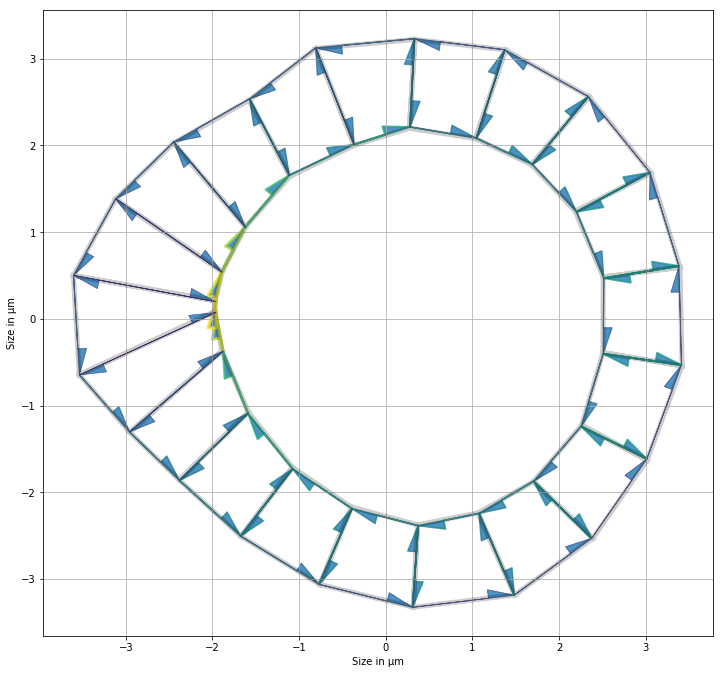

In [35]:
opt_mat_2_cst_organo = to_opt_organo.copy()
opt_mat_2_cst_organo.edge_df.line_tension = prepare_tensions(opt_mat_2_cst_organo, res_2_cst_areas.x[:organo3.Nf*3])
opt_mat_2_cst_organo.face_df.prefered_area = opt_mat_2_cst_organo.face_df.area + res_2_cst_areas.x[3*organo3.Nf:4*organo3.Nf]
opt_mat_2_cst_organo.settings['prefered_lumen_vol'] = opt_mat_2_cst_organo.settings['lumen_volume'] + res_2_cst_areas.x[-1]
Solver.find_energy_min(opt_mat_2_cst_organo, geom, model)
print_tensions(opt_mat_2_cst_organo, organo3)
print('Distance from th organo to exp organo : ' +
      str(np.sum(np.linalg.norm(_distance(organo3, opt_mat_2_cst_organo), axis=1))))
print('Distance from th tensions to exp tensions : ' +
      str(np.sum(np.linalg.norm(organo3.edge_df.line_tension[:3*organo3.Nf] -
                                opt_mat_2_cst_organo.edge_df.line_tension[:3*organo3.Nf]))))

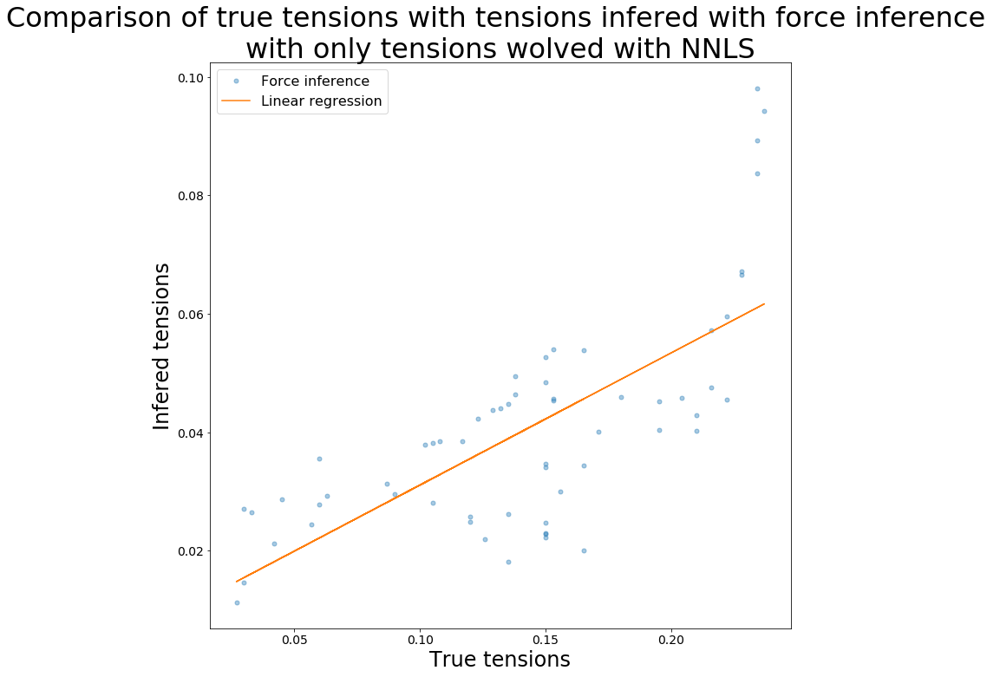

R value : 0.7162711253835958 
Standard error : 0.011066087475412066


In [36]:
rendering_results(organo3, organo3.edge_df.line_tension[:3*organo3.Nf],
                  res_2_cst_areas.x[:3*organo3.Nf],
                  'Comparison of true tensions with tensions infered with force inference \n' +
                  'with only tensions wolved with NNLS',
                  'True tensions', 'Infered tensions', ('Force inference', 'Linear regression'))

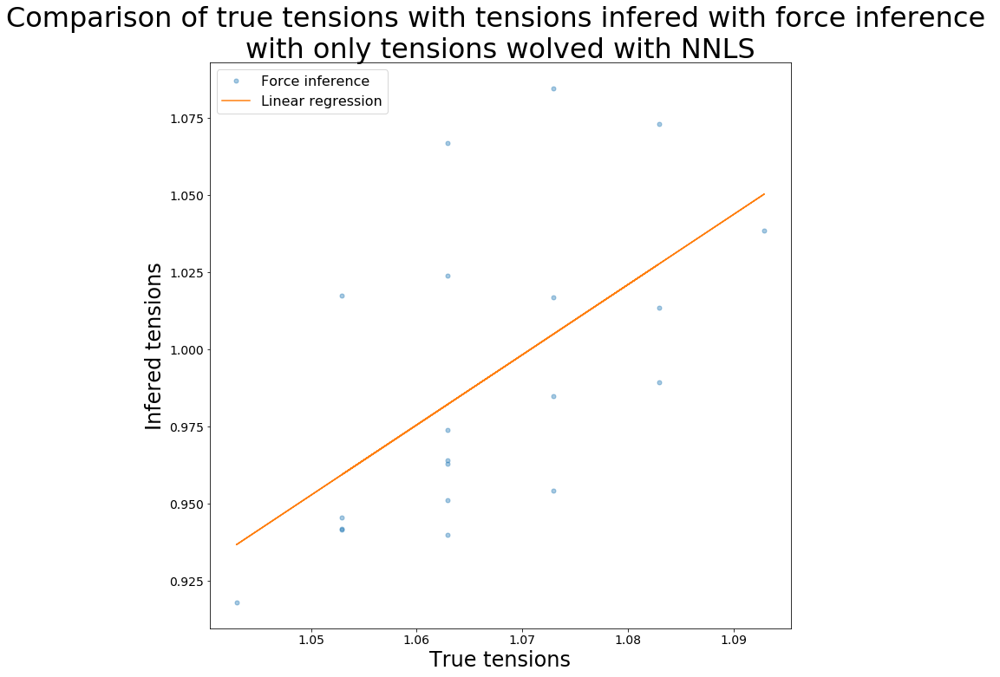

R value : 0.5852237591707217 
Standard error : 0.019450033612942064


In [37]:
rendering_results(organo3, organo3.face_df.eval('prefered_area'),
                  res_2_cst_areas.x[4*organo3.Nf:-1],
                  'Comparison of true tensions with tensions infered with force inference \n' +
                  'with only tensions wolved with NNLS',
                  'True tensions', 'Infered tensions', ('Force inference', 'Linear regression'))

pb quadradique avec eq cst + regularisation

In [241]:
organo3.edge_df[organo3.edge_df.face==0]

,trgt,nz,length,face,srce,dx,dy,sx,sy,tx,...,fy,segment,prev,sub_area,ux,uy,uz,line_tension,is_active,opposite
edge,,,,,,,,,,,,,,,,,,,,,
0,1,0.383687,0.873412,0,0,-0.244649,-0.838449,2.505490,-0.389034,2.260841,...,-0.947523,apical,40,0.191844,-0.280107,-0.959969,0.0,0.150,1,-1
20,20,0.509722,1.160082,0,21,0.403389,1.087690,3.015430,-1.630634,3.418819,...,-0.947523,basal,60,0.254861,0.347724,0.937597,0.0,0.150,1,-1
40,0,0.464734,0.926207,0,20,-0.913329,0.153911,3.418819,-0.542944,2.505490,...,-0.947523,lateral,20,0.232367,-0.986097,0.166173,0.0,0.150,1,79
60,21,0.428675,0.855532,0,1,0.754589,-0.403151,2.260841,-1.227482,3.015430,...,-0.947523,lateral,0,0.214338,0.882011,-0.471229,0.0,0.165,1,41


[0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355, 0.021858713913633355]
[0.03763327 0.03782979 0.03789601 0.03636524 0.03289357 0.02907979
 0.0270553  0.02794562 0.03116428 0.03357848 0.03271495 0.03004973
 0.02755103 0.02812813 0.03078287 0.03331212 0.03587238 0.0374012
 0.03776087 0.03765372]
Apical tensions:  [0.05725525 0.05429355 0.05955931 0.06187019 0.0577044  0.06009399
 0.06138585 0.06668442 0.07335287 0.08068815 0.07814648 0.07357038
 0.06789223 0.06172021 0.06739976 0.06127251 0.06487823 0.06098453
 0.05910433 0.05526028] 
Basal tensions:  [0.03038154 0.02838154 0.02830579 0.02561758 0.02269288 0.02300053
 0.0209

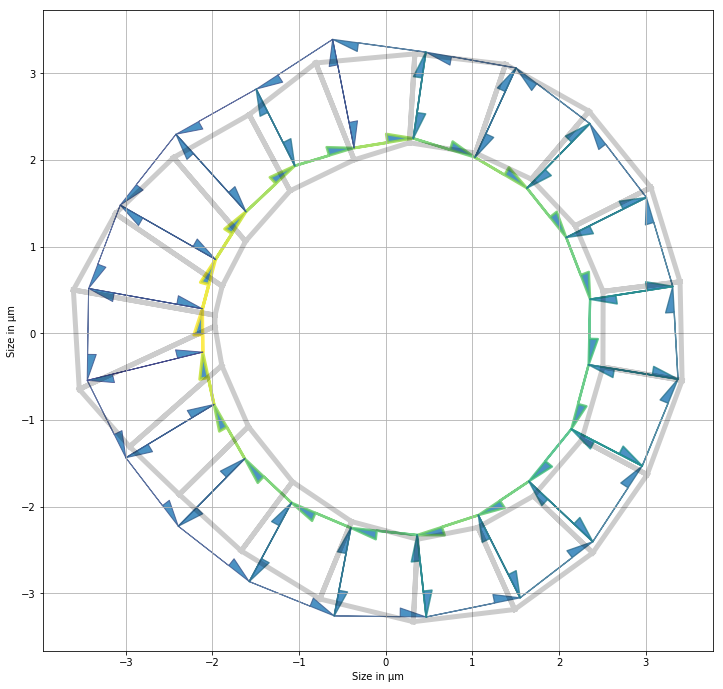

In [244]:
MULT = 1.1
matrix = _coef_matrix(organo3, sup_param='areas')
constant = _right_side(organo3, matrix)
matrix = _coef_matrix(organo3, sup_param='areas')
constant = _right_side(organo3, matrix)
avg_cste = [4*((params_in_sym_mesh[1:].sum()+params_in_sym_mesh[-1])/3 /
               (organo3.face_df.area.mean() + params_in_sym_mesh[0])**1.5)]*organo3.Nf
print(avg_cste)
avg_cste = np.multiply(np.array(avg_cste), bar_dist)
print(avg_cste)
for i in range(organo3.Nf):
    i_cell_line = np.zeros(4*organo3.Nf+1)
    index = np.squeeze(np.argwhere(organo3.edge_df.face.values == i)[:-1])
    i_cell_line[index] = 1
    matrix = np.vstack((matrix, i_cell_line))
constant = np.concatenate((constant, avg_cste))
def obj(var, matrix, constant):
    return np.linalg.norm(np.dot(matrix, var) - constant)**2
def make_cst_ub(edges, mult):
    return lambda x: -(x[edges[0]] - x[edges[1]]*mult)
def make_cst_lb(edges, mult):
    return lambda x: -(x[edges[1]]/mult - x[edges[0]])
cst = {}
organo3.get_extra_indices()
start_point = infer_forces(organo3, "NNLS", sup_param="areas")
for edge in organo3.apical_edges:
    couple = (edge, (edge+1)%(organo3.apical_edges.shape[0]))
    cst[(couple, 'ub')] = {'type': 'ineq',
                           'fun': make_cst_ub(couple, MULT)}
    cst[(couple, 'lb')] = {'type': 'ineq',
                           'fun': make_cst_lb(couple, MULT)}
    lat_couple = (edge, (edge+organo3.Nf*2))
    cst[(couple, 'ub')] = {'type': 'ineq',
                           'fun': make_cst_ub(couple, MULT)}
    cst[(couple, 'lb')] = {'type': 'ineq',
                           'fun': make_cst_lb(couple, MULT)}
bounds = np.concatenate((np.tile((0, 1e6), organo3.sgle_edges.shape[0]),
                         np.tile((-1e6, 1e6), organo3.Nf+1)))
bounds = np.reshape(bounds, (int(bounds.shape[0]/2), 2))
res = optimize.minimize(obj, np.ones(organo3.sgle_edges.shape[0]+organo3.Nf+1),
                        args=(matrix, constant),
                        method='SLSQP',
                        bounds=[[1e-6, 1e6]]*60+[[-1e6,1e6]]*21,
                        constraints=cst.values())

organo3_eq_cst = organo3.copy()
organo3_eq_cst.edge_df.loc[:, 'line_tension'] = prepare_tensions(organo3_eq_cst,
                                                                 res.x[:3*organo3.Nf])
organo3_eq_cst.face_df.loc[:, 'prefered_area'] = organo3_eq_cst.face_df.area + res.x[3*organo3.Nf:
                                                                                     4*organo3.Nf]
organo3_eq_cst.settings['lumen_prefered_vol'] = organo3_eq_cst.settings['lumen_volume'] + res.x[-1]
Solver.find_energy_min(organo3_eq_cst, geom, model)
print_tensions(organo3_eq_cst, organo3)
print('Apical tensions: ', res.x[organo3.apical_edges],
      '\nBasal tensions: ', res.x[organo3.basal_edges],
      '\nLateral tensions: ', res.x[organo3.lateral_edges[:organo3.Nf]],
      '\nArea elasticity: ', res.x[organo3.Nf*3:-1],
      '\nLumen area elasticity: ', res.x[-1],
      '\nDistance to solution: ', np.linalg.norm(real_data-res.x),
      '\nDistance from th org to exp org: ', np.sum(np.linalg.norm(_distance(organo3_eq_cst, organo3), axis=1)),
      '\nNNLS residuals: ', residuals)

In [245]:
iprint_file = "../../assets/dist_at_each_f_ev/11_03_eq_t_per_cell_areas_opt.txt"
to_opt_organo = organo3.copy()
init_point_area_and_tensions_opt = np.concatenate((prepare_tensions(to_opt_organo, res.x[:3*organo3.Nf]),
                                                   to_opt_organo.face_df.area + res.x[3*organo3.Nf:-1],
                                                   [to_opt_organo.settings['lumen_volume'] + res.x[-1]]))
res_2_cst_areas = adjust_parameters(to_opt_organo,
                                    init_point_area_and_tensions_opt,
                                    {'dic':{'apical' : False, 'basal': False}, 'weight':0},
                                    energy_min_opt=energy_opt,
                                    **lm_opt)

7.629483447067228 [0.16220893 0.1662876  0.17245697 0.13787488 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603315 0.33177179 0.16557187 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460252 0.36434528 0.36866202 0.13324377 0.13455629
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297643 0.12779898
 0.12677619 0.13982501 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.62948344889525 [0.16220893 0.1662876  0.17245697 0.13787487 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603315 0.33177179 0.16557187 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460251 0.36434528 0.36866202 0.13324377 0.13455629
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297644 0.12779898
 0.12677619 0.13982501 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

7.629483421829253 [0.16220893 0.1662876  0.17245697 0.13787488 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603314 0.33177178 0.16557187 0.3179351
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460252 0.36434528 0.36866202 0.13324377 0.13455628
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297644 0.12779898
 0.12677619 0.13982501 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

7.629483446571708 [0.16220893 0.1662876  0.17245697 0.13787488 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603315 0.33177179 0.16557187 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460252 0.36434528 0.36866202 0.13324377 0.13455629
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297643 0.12779898
 0.12677619 0.13982502 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.629483452403602 [0.16220893 0.1662876  0.17245697 0.13787488 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603315 0.33177179 0.16557187 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.12512211 0.14495211
 0.15546394 0.25460252 0.36434528 0.36866202 0.13324377 0.13455629
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297643 0.12779898
 0.12677619 0.13982501 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.629483445306271 [0.16220893 0.1662876  0.17245697 0.13787488 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603315 0.33177179 0.16557187 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460251 0.36434528 0.36866202 0.13324377 0.13455629
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297643 0.12779898
 0.12677619 0.13982501 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.629483443771602 [0.16220893 0.1662876  0.17245697 0.13787488 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603315 0.33177179 0.16557187 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460252 0.36434528 0.36866202 0.13324377 0.13455629
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297643 0.12779898
 0.12677619 0.13982501 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.629483453344027 [0.16220893 0.1662876  0.17245697 0.13787488 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603315 0.33177179 0.16557187 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460252 0.36434528 0.36866202 0.13324377 0.13455629
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297643 0.12779898
 0.12677619 0.13982501 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.629483451448379 [0.16220893 0.1662876  0.17245697 0.13787488 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603315 0.33177179 0.16557187 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460251 0.36434528 0.36866202 0.13324377 0.13455629
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297643 0.12779898
 0.12677619 0.13982501 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.629483440939794 [0.16220893 0.1662876  0.17245697 0.13787488 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603315 0.33177179 0.16557187 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460251 0.36434528 0.36866202 0.13324377 0.13455628
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297643 0.12779898
 0.12677619 0.13982501 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.62948343650812 [0.16220893 0.1662876  0.17245697 0.13787488 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603315 0.33177179 0.16557187 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460251 0.36434528 0.36866202 0.13324377 0.13455629
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297643 0.12779898
 0.12677619 0.13982502 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

7.629483447067228 [0.16220893 0.1662876  0.17245697 0.13787488 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603315 0.33177179 0.16557187 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460252 0.36434528 0.36866202 0.13324377 0.13455629
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297643 0.12779898
 0.12677619 0.13982501 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.629483447067228 [0.16220893 0.1662876  0.17245697 0.13787488 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603315 0.33177179 0.16557187 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460252 0.36434528 0.36866202 0.13324377 0.13455629
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297643 0.12779898
 0.12677619 0.13982501 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.629483447067228 [0.16220893 0.1662876  0.17245697 0.13787488 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603315 0.33177179 0.16557187 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460252 0.36434528 0.36866202 0.13324377 0.13455629
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297643 0.12779898
 0.12677619 0.13982501 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.6294833939354465 [0.16220893 0.1662876  0.17245697 0.13787487 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603314 0.33177179 0.16557188 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460251 0.36434528 0.36866202 0.13324377 0.13455629
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297643 0.12779898
 0.12677619 0.13982501 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.  

7.629483267184847 [0.16220893 0.1662876  0.17245697 0.13787487 0.04638532 0.07407659
 0.24358244 0.37201463 0.45603313 0.33177179 0.16557188 0.3179351
 0.33901192 0.29377887 0.13703709 0.06971929 0.0488578  0.1111415
 0.16641047 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460251 0.36434527 0.36866202 0.13324377 0.13455628
 0.17275671 0.11330462 0.2701719  0.30507749 0.33297643 0.12779897
 0.12677619 0.13982501 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

7.629483541181999 [0.16220893 0.16628761 0.17245697 0.13787488 0.04638532 0.0740766
 0.24358245 0.37201465 0.45603315 0.33177179 0.16557187 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.11114151
 0.16641048 0.17084618 0.04586283 0.11125935 0.12512211 0.14495211
 0.15546394 0.25460252 0.36434528 0.36866202 0.13324378 0.13455629
 0.17275673 0.11330462 0.27017191 0.30507751 0.33297644 0.12779898
 0.12677619 0.13982502 0.1237524  0.09597099 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.   

7.629483321723528 [0.16220893 0.1662876  0.17245697 0.13787487 0.04638532 0.0740766
 0.24358245 0.37201464 0.45603314 0.33177179 0.16557188 0.31793511
 0.33901193 0.29377887 0.1370371  0.06971929 0.0488578  0.1111415
 0.16641048 0.17084618 0.04586283 0.11125935 0.1251221  0.14495211
 0.15546394 0.25460251 0.36434528 0.36866202 0.13324377 0.13455628
 0.17275672 0.11330462 0.27017191 0.3050775  0.33297643 0.12779897
 0.12677619 0.13982501 0.1237524  0.09597098 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.    

5.3915392910525535 [1.14559454e-01 4.34618530e-02 7.85110696e-02 1.21590202e-01
 1.32559544e-01 7.55325370e-02 6.97633765e-02 1.08224575e-01
 1.05431006e-01 3.55988853e-01 3.81644881e-01 1.93212784e-01
 3.39720401e-02 6.57219061e-02 8.49427543e-02 1.78163823e-01
 1.01376945e-01 1.36822947e-01 2.44352429e-01 1.87316622e-02
 1.46859006e-01 5.86859899e-02 2.57906486e-02 6.26037016e-02
 3.30312917e-02 1.51908163e-01 1.33914409e-01 1.17602477e-01
 1.33615058e-01 1.63420866e-01 6.67267816e-01 7.28222243e-02
 5.75267322e-02 1.24132146e-01 9.55532242e-02 7.46111257e-02
 1.80529106e-01 1.82343134e-01 4.19927096e-02 1.46639654e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

5.391584876374522 [1.14560381e-01 4.34630316e-02 7.85113534e-02 1.21591522e-01
 1.32561114e-01 7.55337994e-02 6.97639479e-02 1.08223961e-01
 1.05433035e-01 3.55989742e-01 3.81645131e-01 1.93216248e-01
 3.39719522e-02 6.57224590e-02 8.49438713e-02 1.78164934e-01
 1.01378487e-01 1.36824634e-01 2.44352493e-01 1.87330811e-02
 1.46860403e-01 5.86866888e-02 2.57896616e-02 6.26048315e-02
 3.30321290e-02 1.51909485e-01 1.33915683e-01 1.17603346e-01
 1.33614860e-01 1.63423455e-01 6.67274133e-01 7.28251716e-02
 5.75268635e-02 1.24133037e-01 9.55540669e-02 7.46126869e-02
 1.80531037e-01 1.82344495e-01 4.19928041e-02 1.46639696e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.39175597358505 [1.14563938e-01 4.34674770e-02 7.85124259e-02 1.21596447e-01
 1.32567014e-01 7.55385165e-02 6.97660993e-02 1.08221722e-01
 1.05440634e-01 3.55993125e-01 3.81646146e-01 1.93229240e-01
 3.39715559e-02 6.57245241e-02 8.49479960e-02 1.78169121e-01
 1.01384299e-01 1.36830983e-01 2.44352804e-01 1.87382975e-02
 1.46865638e-01 5.86893340e-02 2.57859679e-02 6.26090510e-02
 3.30352285e-02 1.51914433e-01 1.33920457e-01 1.17606629e-01
 1.33614164e-01 1.63433155e-01 6.67297777e-01 7.28361120e-02
 5.75274004e-02 1.24136404e-01 9.55572457e-02 7.46185088e-02
 1.80538217e-01 1.82349585e-01 4.19931961e-02 1.46639936e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0000

5.391517414974104 [1.14559003e-01 4.34612830e-02 7.85109345e-02 1.21589567e-01
 1.32558789e-01 7.55319316e-02 6.97631013e-02 1.08224867e-01
 1.05430031e-01 3.55988423e-01 3.81644756e-01 1.93211121e-01
 3.39720852e-02 6.57216441e-02 8.49422255e-02 1.78163288e-01
 1.01376206e-01 1.36822138e-01 2.44352394e-01 1.87309865e-02
 1.46858335e-01 5.86856508e-02 2.57911233e-02 6.26031590e-02
 3.30308894e-02 1.51907528e-01 1.33913797e-01 1.17602057e-01
 1.33615151e-01 1.63419625e-01 6.67264788e-01 7.28208162e-02
 5.75266691e-02 1.24131720e-01 9.55528228e-02 7.46103799e-02
 1.80528185e-01 1.82342484e-01 4.19926630e-02 1.46639629e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.391483941774629 [1.14558321e-01 4.34604175e-02 7.85107269e-02 1.21588598e-01
 1.32557636e-01 7.55310044e-02 6.97626797e-02 1.08225320e-01
 1.05428541e-01 3.55987770e-01 3.81644572e-01 1.93208579e-01
 3.39721510e-02 6.57212357e-02 8.49414031e-02 1.78162472e-01
 1.01375072e-01 1.36820901e-01 2.44352347e-01 1.87299463e-02
 1.46857313e-01 5.86851383e-02 2.57918494e-02 6.26023292e-02
 3.30302745e-02 1.51906558e-01 1.33912862e-01 1.17601417e-01
 1.33615297e-01 1.63417725e-01 6.67260152e-01 7.28186535e-02
 5.75265711e-02 1.24131063e-01 9.55521999e-02 7.46092330e-02
 1.80526768e-01 1.82341485e-01 4.19925937e-02 1.46639598e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.391533510806169 [1.14559337e-01 4.34617016e-02 7.85110348e-02 1.21590030e-01
 1.32559345e-01 7.55323765e-02 6.97633042e-02 1.08224656e-01
 1.05430748e-01 3.55988741e-01 3.81644851e-01 1.93212345e-01
 3.39720491e-02 6.57218360e-02 8.49426110e-02 1.78163683e-01
 1.01376751e-01 1.36822735e-01 2.44352423e-01 1.87314788e-02
 1.46858829e-01 5.86858993e-02 2.57907749e-02 6.26035561e-02
 3.30311822e-02 1.51907994e-01 1.33914247e-01 1.17602367e-01
 1.33615085e-01 1.63420538e-01 6.67267016e-01 7.28218488e-02
 5.75267171e-02 1.24132034e-01 9.55531179e-02 7.46109272e-02
 1.80528860e-01 1.82342962e-01 4.19926986e-02 1.46639651e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.391554159402772 [1.14559760e-01 4.34622374e-02 7.85111636e-02 1.21590629e-01
 1.32560056e-01 7.55329479e-02 6.97635647e-02 1.08224378e-01
 1.05431667e-01 3.55989146e-01 3.81644967e-01 1.93213913e-01
 3.39720072e-02 6.57220859e-02 8.49431145e-02 1.78164186e-01
 1.01377450e-01 1.36823499e-01 2.44352454e-01 1.87321181e-02
 1.46859461e-01 5.86862178e-02 2.57903279e-02 6.26040678e-02
 3.30315600e-02 1.51908592e-01 1.33914823e-01 1.17602763e-01
 1.33614997e-01 1.63421709e-01 6.67269874e-01 7.28231795e-02
 5.75267775e-02 1.24132438e-01 9.55535001e-02 7.46116329e-02
 1.80529732e-01 1.82343577e-01 4.19927427e-02 1.46639673e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.39156602496739 [1.14559992e-01 4.34625425e-02 7.85112354e-02 1.21590977e-01
 1.32560464e-01 7.55332802e-02 6.97637149e-02 1.08224206e-01
 1.05432199e-01 3.55989370e-01 3.81645021e-01 1.93214817e-01
 3.39719939e-02 6.57222312e-02 8.49434147e-02 1.78164473e-01
 1.01377847e-01 1.36823935e-01 2.44352460e-01 1.87325031e-02
 1.46859826e-01 5.86863978e-02 2.57900689e-02 6.26043660e-02
 3.30317856e-02 1.51908937e-01 1.33915156e-01 1.17602989e-01
 1.33614937e-01 1.63422385e-01 6.67271526e-01 7.28239619e-02
 5.75268060e-02 1.24132666e-01 9.55537170e-02 7.46120444e-02
 1.80530243e-01 1.82343934e-01 4.19927621e-02 1.46639672e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0000

5.391547444548082 [1.14559627e-01 4.34620645e-02 7.85111226e-02 1.21590433e-01
 1.32559826e-01 7.55327607e-02 6.97634789e-02 1.08224474e-01
 1.05431367e-01 3.55989017e-01 3.81644934e-01 1.93213403e-01
 3.39720170e-02 6.57220034e-02 8.49429451e-02 1.78164022e-01
 1.01377224e-01 1.36823252e-01 2.44352448e-01 1.87319039e-02
 1.46859256e-01 5.86861157e-02 2.57904742e-02 6.26039005e-02
 3.30314349e-02 1.51908398e-01 1.33914636e-01 1.17602634e-01
 1.33615029e-01 1.63421328e-01 6.67268943e-01 7.28227409e-02
 5.75267601e-02 1.24132308e-01 9.55533750e-02 7.46114000e-02
 1.80529445e-01 1.82343376e-01 4.19927306e-02 1.46639670e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.391559551545703 [1.14559870e-01 4.34623768e-02 7.85111970e-02 1.21590786e-01
 1.32560242e-01 7.55330975e-02 6.97636319e-02 1.08224305e-01
 1.05431908e-01 3.55989250e-01 3.81644996e-01 1.93214323e-01
 3.39719975e-02 6.57221515e-02 8.49432473e-02 1.78164318e-01
 1.01377632e-01 1.36823698e-01 2.44352460e-01 1.87322866e-02
 1.46859627e-01 5.86863005e-02 2.57902110e-02 6.26042021e-02
 3.30316603e-02 1.51908749e-01 1.33914975e-01 1.17602865e-01
 1.33614972e-01 1.63422016e-01 6.67270622e-01 7.28235294e-02
 5.75267927e-02 1.24132544e-01 9.55535995e-02 7.46118181e-02
 1.80529961e-01 1.82343738e-01 4.19927527e-02 1.46639676e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.391507946279739 [1.14558840e-01 4.34610449e-02 7.85108844e-02 1.21589277e-01
 1.32558468e-01 7.55316597e-02 6.97629778e-02 1.08225030e-01
 1.05429602e-01 3.55988258e-01 3.81644736e-01 1.93210396e-01
 3.39720754e-02 6.57215227e-02 8.49419612e-02 1.78163064e-01
 1.01375897e-01 1.36821798e-01 2.44352411e-01 1.87306446e-02
 1.46858044e-01 5.86855105e-02 2.57913401e-02 6.26029164e-02
 3.30306922e-02 1.51907252e-01 1.33913531e-01 1.17601878e-01
 1.33615216e-01 1.63419082e-01 6.67263454e-01 7.28201589e-02
 5.75266575e-02 1.24131545e-01 9.55526504e-02 7.46100394e-02
 1.80527757e-01 1.82342195e-01 4.19926587e-02 1.46639654e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.391464077804232 [1.14557923e-01 4.34599039e-02 7.85106044e-02 1.21588020e-01
 1.32556954e-01 7.55304570e-02 6.97624285e-02 1.08225593e-01
 1.05427655e-01 3.55987388e-01 3.81644469e-01 1.93207068e-01
 3.39721850e-02 6.57209949e-02 8.49409103e-02 1.78161989e-01
 1.01374403e-01 1.36820167e-01 2.44352325e-01 1.87293173e-02
 1.46856702e-01 5.86848333e-02 2.57922822e-02 6.26018361e-02
 3.30299052e-02 1.51905983e-01 1.33912310e-01 1.17601033e-01
 1.33615387e-01 1.63416595e-01 6.67257398e-01 7.28173607e-02
 5.75265174e-02 1.24130678e-01 9.55518337e-02 7.46085490e-02
 1.80525922e-01 1.82340891e-01 4.19925539e-02 1.46639586e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.39157843774374 [1.14560311e-01 4.34628790e-02 7.85113235e-02 1.21591310e-01
 1.32560899e-01 7.55336022e-02 6.97638626e-02 1.08224111e-01
 1.05432737e-01 3.55989656e-01 3.81645161e-01 1.93215744e-01
 3.39719116e-02 6.57223731e-02 8.49436593e-02 1.78164791e-01
 1.01378292e-01 1.36824415e-01 2.44352542e-01 1.87327919e-02
 1.46860202e-01 5.86866043e-02 2.57898115e-02 6.26046515e-02
 3.30319718e-02 1.51909293e-01 1.33915499e-01 1.17603230e-01
 1.33614933e-01 1.63423063e-01 6.67273181e-01 7.28246627e-02
 5.75268775e-02 1.24132934e-01 9.55539612e-02 7.46124383e-02
 1.80530715e-01 1.82344292e-01 4.19928204e-02 1.46639757e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0000

5.391458236483655 [1.14557795e-01 4.34597512e-02 7.85105665e-02 1.21587855e-01
 1.32556751e-01 7.55302942e-02 6.97623566e-02 1.08225664e-01
 1.05427396e-01 3.55987267e-01 3.81644427e-01 1.93206629e-01
 3.39722055e-02 6.57209225e-02 8.49407777e-02 1.78161844e-01
 1.01374199e-01 1.36819948e-01 2.44352308e-01 1.87291508e-02
 1.46856524e-01 5.86847411e-02 2.57924051e-02 6.26016930e-02
 3.30298048e-02 1.51905815e-01 1.33912145e-01 1.17600926e-01
 1.33615408e-01 1.63416268e-01 6.67256599e-01 7.28169989e-02
 5.75264943e-02 1.24130556e-01 9.55517172e-02 7.46083571e-02
 1.80525682e-01 1.82340718e-01 4.19925375e-02 1.46639570e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.391564632303313 [1.14560008e-01 4.34625166e-02 7.85112330e-02 1.21590916e-01
 1.32560420e-01 7.55332262e-02 6.97636921e-02 1.08224276e-01
 1.05432124e-01 3.55989372e-01 3.81645062e-01 1.93214702e-01
 3.39719529e-02 6.57222071e-02 8.49433398e-02 1.78164449e-01
 1.01377817e-01 1.36823898e-01 2.44352509e-01 1.87323906e-02
 1.46859780e-01 5.86863847e-02 2.57901082e-02 6.26043156e-02
 3.30317309e-02 1.51908894e-01 1.33915114e-01 1.17602966e-01
 1.33614978e-01 1.63422299e-01 6.67271295e-01 7.28238021e-02
 5.75268285e-02 1.24132656e-01 9.55537005e-02 7.46119726e-02
 1.80530146e-01 1.82343882e-01 4.19927770e-02 1.46639726e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.391546460459032 [1.14559602e-01 4.34620377e-02 7.85111156e-02 1.21590407e-01
 1.32559791e-01 7.55327349e-02 6.97634670e-02 1.08224481e-01
 1.05431324e-01 3.55988994e-01 3.81644923e-01 1.93213328e-01
 3.39720236e-02 6.57219928e-02 8.49429275e-02 1.78163998e-01
 1.01377189e-01 1.36823214e-01 2.44352441e-01 1.87318809e-02
 1.46859226e-01 5.86860992e-02 2.57904947e-02 6.26038776e-02
 3.30314200e-02 1.51908370e-01 1.33914609e-01 1.17602615e-01
 1.33615029e-01 1.63421273e-01 6.67268809e-01 7.28226844e-02
 5.75267546e-02 1.24132287e-01 9.55533573e-02 7.46113701e-02
 1.80529408e-01 1.82343348e-01 4.19927259e-02 1.46639663e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.391546460459032 [1.14559602e-01 4.34620377e-02 7.85111156e-02 1.21590407e-01
 1.32559791e-01 7.55327349e-02 6.97634670e-02 1.08224481e-01
 1.05431324e-01 3.55988994e-01 3.81644923e-01 1.93213328e-01
 3.39720236e-02 6.57219928e-02 8.49429275e-02 1.78163998e-01
 1.01377189e-01 1.36823214e-01 2.44352441e-01 1.87318809e-02
 1.46859226e-01 5.86860992e-02 2.57904947e-02 6.26038776e-02
 3.30314200e-02 1.51908370e-01 1.33914609e-01 1.17602615e-01
 1.33615029e-01 1.63421273e-01 6.67268809e-01 7.28226844e-02
 5.75267546e-02 1.24132287e-01 9.55533573e-02 7.46113701e-02
 1.80529408e-01 1.82343348e-01 4.19927259e-02 1.46639663e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.391546460459032 [1.14559602e-01 4.34620377e-02 7.85111156e-02 1.21590407e-01
 1.32559791e-01 7.55327349e-02 6.97634670e-02 1.08224481e-01
 1.05431324e-01 3.55988994e-01 3.81644923e-01 1.93213328e-01
 3.39720236e-02 6.57219928e-02 8.49429275e-02 1.78163998e-01
 1.01377189e-01 1.36823214e-01 2.44352441e-01 1.87318809e-02
 1.46859226e-01 5.86860992e-02 2.57904947e-02 6.26038776e-02
 3.30314200e-02 1.51908370e-01 1.33914609e-01 1.17602615e-01
 1.33615029e-01 1.63421273e-01 6.67268809e-01 7.28226844e-02
 5.75267546e-02 1.24132287e-01 9.55533573e-02 7.46113701e-02
 1.80529408e-01 1.82343348e-01 4.19927259e-02 1.46639663e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.391546460459032 [1.14559602e-01 4.34620377e-02 7.85111156e-02 1.21590407e-01
 1.32559791e-01 7.55327349e-02 6.97634670e-02 1.08224481e-01
 1.05431324e-01 3.55988994e-01 3.81644923e-01 1.93213328e-01
 3.39720236e-02 6.57219928e-02 8.49429275e-02 1.78163998e-01
 1.01377189e-01 1.36823214e-01 2.44352441e-01 1.87318809e-02
 1.46859226e-01 5.86860992e-02 2.57904947e-02 6.26038776e-02
 3.30314200e-02 1.51908370e-01 1.33914609e-01 1.17602615e-01
 1.33615029e-01 1.63421273e-01 6.67268809e-01 7.28226844e-02
 5.75267546e-02 1.24132287e-01 9.55533573e-02 7.46113701e-02
 1.80529408e-01 1.82343348e-01 4.19927259e-02 1.46639663e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.391546460459032 [1.14559602e-01 4.34620377e-02 7.85111156e-02 1.21590407e-01
 1.32559791e-01 7.55327349e-02 6.97634670e-02 1.08224481e-01
 1.05431324e-01 3.55988994e-01 3.81644923e-01 1.93213328e-01
 3.39720236e-02 6.57219928e-02 8.49429275e-02 1.78163998e-01
 1.01377189e-01 1.36823214e-01 2.44352441e-01 1.87318809e-02
 1.46859226e-01 5.86860992e-02 2.57904947e-02 6.26038776e-02
 3.30314200e-02 1.51908370e-01 1.33914609e-01 1.17602615e-01
 1.33615029e-01 1.63421273e-01 6.67268809e-01 7.28226844e-02
 5.75267546e-02 1.24132287e-01 9.55533573e-02 7.46113701e-02
 1.80529408e-01 1.82343348e-01 4.19927259e-02 1.46639663e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.954191262303045 [1.21854389e-01 5.47550478e-02 8.11684450e-02 1.36070595e-01
 1.47595542e-01 9.01192864e-02 8.00938534e-02 1.01435503e-01
 1.23599310e-01 3.74226685e-01 3.92957664e-01 2.32002702e-01
 4.01116846e-02 7.39107104e-02 1.02926863e-01 1.87189615e-01
 1.16129074e-01 1.55710623e-01 2.50987984e-01 3.22409494e-02
 1.62053979e-01 6.32720207e-02 2.25207585e-02 7.77691359e-02
 4.43053746e-02 1.66813221e-01 1.48807939e-01 1.28543819e-01
 1.37760299e-01 1.87684942e-01 7.48100212e-01 1.01956067e-01
 5.89504326e-02 1.32758704e-01 1.04817438e-01 9.24505463e-02
 2.06850486e-01 1.98296668e-01 5.15472059e-02 1.47720320e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.952595613969851 [1.21829566e-01 5.47248414e-02 8.11627976e-02 1.36037973e-01
 1.47558602e-01 9.00836449e-02 8.00646349e-02 1.01439846e-01
 1.23565065e-01 3.74140067e-01 3.92903055e-01 2.31915718e-01
 4.00868574e-02 7.38874908e-02 1.02876180e-01 1.87171060e-01
 1.16091390e-01 1.55655219e-01 2.50956285e-01 3.22202323e-02
 1.62010042e-01 6.32637139e-02 2.25149476e-02 7.77300499e-02
 4.42768102e-02 1.66772422e-01 1.48766999e-01 1.28507749e-01
 1.37728007e-01 1.87621971e-01 7.47885185e-01 1.01894384e-01
 5.89408896e-02 1.32733618e-01 1.04796937e-01 9.24060889e-02
 2.06778160e-01 1.98251757e-01 5.15091943e-02 1.47710997e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.382645717981077 [1.14377241e-01 4.32304921e-02 7.84550691e-02 1.21331204e-01
 1.32251228e-01 7.52859584e-02 6.96522651e-02 1.08345566e-01
 1.05032420e-01 3.55819127e-01 3.81597508e-01 1.92536047e-01
 3.39904811e-02 6.56141386e-02 8.47256569e-02 1.77945144e-01
 1.01075697e-01 1.36493467e-01 2.44342063e-01 1.84526743e-02
 1.46586074e-01 5.85490750e-02 2.59866637e-02 6.23829143e-02
 3.28682107e-02 1.51650190e-01 1.33665683e-01 1.17432837e-01
 1.33656160e-01 1.62915593e-01 6.66034877e-01 7.22449496e-02
 5.75021628e-02 1.23958515e-01 9.53881208e-02 7.43053226e-02
 1.80153470e-01 1.82077391e-01 4.19769209e-02 1.46631973e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.453378557871536 [1.15754119e-01 4.50432777e-02 7.89108451e-02 1.23414088e-01
 1.34682376e-01 7.72585415e-02 7.05595130e-02 1.07207979e-01
 1.08302967e-01 3.57074750e-01 3.81760711e-01 1.98049674e-01
 3.38427623e-02 6.64388002e-02 8.64450792e-02 1.79678009e-01
 1.03468264e-01 1.39044338e-01 2.44443443e-01 2.06854032e-02
 1.48727963e-01 5.97216658e-02 2.44725033e-02 6.41319446e-02
 3.42172855e-02 1.53711733e-01 1.35649437e-01 1.18763662e-01
 1.33236612e-01 1.66968880e-01 6.75857256e-01 7.69239028e-02
 5.77319647e-02 1.25376084e-01 9.67090043e-02 7.67178325e-02
 1.83189694e-01 1.84174156e-01 4.22238600e-02 1.46683008e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

5.391604683168389 [1.14560755e-01 4.34635392e-02 7.85114701e-02 1.21592106e-01
 1.32561794e-01 7.55343599e-02 6.97642057e-02 1.08223657e-01
 1.05433929e-01 3.55990109e-01 3.81645209e-01 1.93217763e-01
 3.39719340e-02 6.57227015e-02 8.49443817e-02 1.78165409e-01
 1.01379147e-01 1.36825356e-01 2.44352488e-01 1.87337362e-02
 1.46861010e-01 5.86869842e-02 2.57892254e-02 6.26053324e-02
 3.30325115e-02 1.51910059e-01 1.33916239e-01 1.17603729e-01
 1.33614751e-01 1.63424591e-01 6.67276898e-01 7.28264947e-02
 5.75269079e-02 1.24133414e-01 9.55544266e-02 7.46133773e-02
 1.80531897e-01 1.82345089e-01 4.19928398e-02 1.46639688e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.7093751115808775 [5.42977817e-02 1.55412399e-02 4.81559910e-02 9.42837662e-02
 1.21643714e-01 2.66306213e-02 8.10794598e-03 1.49295357e-01
 9.35115419e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264698e-02 1.25599705e-01 1.25424450e-01
 4.15919599e-02 8.83872517e-02 1.03416349e-01 4.02240910e-02
 6.48383023e-02 8.87851314e-03 2.10111731e-02 8.16640606e-02
 7.46186784e-02 7.31296975e-02 8.51358041e-02 1.29299631e-01
 4.54307242e-02 6.94317762e-02 3.11414300e-01 1.71413560e-01
 7.33668893e-02 2.03765807e-01 9.57594600e-02 4.37033531e-02
 1.10637257e-01 8.78910285e-02 5.23355990e-02 4.54666631e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093751008466844 [5.42977796e-02 1.55412413e-02 4.81559904e-02 9.42837656e-02
 1.21643713e-01 2.66306203e-02 8.10794535e-03 1.49295357e-01
 9.35115419e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264698e-02 1.25599705e-01 1.25424450e-01
 4.15919599e-02 8.83872517e-02 1.03416350e-01 4.02240915e-02
 6.48383034e-02 8.87851290e-03 2.10111710e-02 8.16640587e-02
 7.46186774e-02 7.31296965e-02 8.51358044e-02 1.29299631e-01
 4.54307242e-02 6.94317762e-02 3.11414300e-01 1.71413560e-01
 7.33668893e-02 2.03765807e-01 9.57594600e-02 4.37033531e-02
 1.10637257e-01 8.78910285e-02 5.23355994e-02 4.54666609e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093751438241367 [5.42977797e-02 1.55412418e-02 4.81559905e-02 9.42837671e-02
 1.21643715e-01 2.66306207e-02 8.10794662e-03 1.49295359e-01
 9.35115367e-02 1.57598425e-01 2.34680538e-01 1.40364123e-01
 1.49045917e-01 1.98264704e-02 1.25599706e-01 1.25424451e-01
 4.15919613e-02 8.83872525e-02 1.03416351e-01 4.02240915e-02
 6.48383043e-02 8.87851272e-03 2.10111710e-02 8.16640615e-02
 7.46186792e-02 7.31296986e-02 8.51358059e-02 1.29299631e-01
 4.54307294e-02 6.94317735e-02 3.11414304e-01 1.71413563e-01
 7.33668899e-02 2.03765808e-01 9.57594605e-02 4.37033541e-02
 1.10637259e-01 8.78910298e-02 5.23355995e-02 4.54666613e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.709375104313954 [5.42977795e-02 1.55412413e-02 4.81559905e-02 9.42837665e-02
 1.21643714e-01 2.66306213e-02 8.10794599e-03 1.49295357e-01
 9.35115419e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045918e-01 1.98264673e-02 1.25599704e-01 1.25424450e-01
 4.15919599e-02 8.83872516e-02 1.03416350e-01 4.02240915e-02
 6.48383034e-02 8.87851282e-03 2.10111710e-02 8.16640605e-02
 7.46186783e-02 7.31296975e-02 8.51358042e-02 1.29299631e-01
 4.54307242e-02 6.94317763e-02 3.11414300e-01 1.71413561e-01
 7.33668868e-02 2.03765809e-01 9.57594594e-02 4.37033525e-02
 1.10637257e-01 8.78910286e-02 5.23355993e-02 4.54666609e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.7093750985418055 [5.42977795e-02 1.55412413e-02 4.81559905e-02 9.42837664e-02
 1.21643714e-01 2.66306213e-02 8.10794599e-03 1.49295357e-01
 9.35115418e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264698e-02 1.25599705e-01 1.25424449e-01
 4.15919591e-02 8.83872502e-02 1.03416349e-01 4.02240911e-02
 6.48383035e-02 8.87851282e-03 2.10111709e-02 8.16640604e-02
 7.46186783e-02 7.31296975e-02 8.51358041e-02 1.29299631e-01
 4.54307241e-02 6.94317761e-02 3.11414300e-01 1.71413560e-01
 7.33668893e-02 2.03765807e-01 9.57594595e-02 4.37033532e-02
 1.10637256e-01 8.78910274e-02 5.23355988e-02 4.54666608e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.709375108086407 [5.42977796e-02 1.55412415e-02 4.81559906e-02 9.42837665e-02
 1.21643714e-01 2.66306213e-02 8.10794602e-03 1.49295357e-01
 9.35115418e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264699e-02 1.25599705e-01 1.25424450e-01
 4.15919600e-02 8.83872517e-02 1.03416350e-01 4.02240915e-02
 6.48383035e-02 8.87851257e-03 2.10111710e-02 8.16640604e-02
 7.46186784e-02 7.31296976e-02 8.51358042e-02 1.29299631e-01
 4.54307242e-02 6.94317762e-02 3.11414300e-01 1.71413560e-01
 7.33668894e-02 2.03765807e-01 9.57594600e-02 4.37033531e-02
 1.10637257e-01 8.78910286e-02 5.23355993e-02 4.54666610e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.7093751084891435 [5.42977797e-02 1.55412414e-02 4.81559903e-02 9.42837665e-02
 1.21643713e-01 2.66306201e-02 8.10794556e-03 1.49295357e-01
 9.35115422e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264698e-02 1.25599705e-01 1.25424450e-01
 4.15919599e-02 8.83872517e-02 1.03416350e-01 4.02240915e-02
 6.48383035e-02 8.87851292e-03 2.10111711e-02 8.16640601e-02
 7.46186790e-02 7.31296980e-02 8.51358032e-02 1.29299631e-01
 4.54307244e-02 6.94317763e-02 3.11414300e-01 1.71413560e-01
 7.33668895e-02 2.03765807e-01 9.57594602e-02 4.37033531e-02
 1.10637257e-01 8.78910286e-02 5.23355994e-02 4.54666610e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.709375100492626 [5.42977796e-02 1.55412413e-02 4.81559905e-02 9.42837664e-02
 1.21643714e-01 2.66306214e-02 8.10794603e-03 1.49295356e-01
 9.35115420e-02 1.57598421e-01 2.34680532e-01 1.40364122e-01
 1.49045916e-01 1.98264698e-02 1.25599704e-01 1.25424450e-01
 4.15919597e-02 8.83872516e-02 1.03416350e-01 4.02240913e-02
 6.48383033e-02 8.87851282e-03 2.10111710e-02 8.16640602e-02
 7.46186783e-02 7.31296974e-02 8.51358040e-02 1.29299630e-01
 4.54307234e-02 6.94317765e-02 3.11414299e-01 1.71413560e-01
 7.33668892e-02 2.03765807e-01 9.57594599e-02 4.37033530e-02
 1.10637257e-01 8.78910283e-02 5.23355994e-02 4.54666609e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.7093751078280643 [5.42977796e-02 1.55412414e-02 4.81559905e-02 9.42837664e-02
 1.21643714e-01 2.66306213e-02 8.10794602e-03 1.49295357e-01
 9.35115418e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264699e-02 1.25599705e-01 1.25424450e-01
 4.15919600e-02 8.83872517e-02 1.03416350e-01 4.02240914e-02
 6.48383035e-02 8.87851280e-03 2.10111710e-02 8.16640604e-02
 7.46186784e-02 7.31296976e-02 8.51358042e-02 1.29299631e-01
 4.54307242e-02 6.94317762e-02 3.11414300e-01 1.71413560e-01
 7.33668895e-02 2.03765807e-01 9.57594600e-02 4.37033531e-02
 1.10637257e-01 8.78910286e-02 5.23355993e-02 4.54666610e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093751223458313 [5.42977795e-02 1.55412413e-02 4.81559906e-02 9.42837666e-02
 1.21643714e-01 2.66306214e-02 8.10794601e-03 1.49295357e-01
 9.35115420e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264699e-02 1.25599705e-01 1.25424451e-01
 4.15919626e-02 8.83872522e-02 1.03416350e-01 4.02240917e-02
 6.48383036e-02 8.87851282e-03 2.10111710e-02 8.16640606e-02
 7.46186784e-02 7.31296975e-02 8.51358042e-02 1.29299631e-01
 4.54307242e-02 6.94317762e-02 3.11414300e-01 1.71413560e-01
 7.33668895e-02 2.03765807e-01 9.57594598e-02 4.37033544e-02
 1.10637259e-01 8.78910301e-02 5.23356008e-02 4.54666609e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093751205547116 [5.42977766e-02 1.55412462e-02 4.81559915e-02 9.42837657e-02
 1.21643714e-01 2.66306210e-02 8.10794604e-03 1.49295357e-01
 9.35115420e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264700e-02 1.25599705e-01 1.25424450e-01
 4.15919603e-02 8.83872511e-02 1.03416351e-01 4.02240889e-02
 6.48383125e-02 8.87851865e-03 2.10111718e-02 8.16640606e-02
 7.46186787e-02 7.31296979e-02 8.51358044e-02 1.29299631e-01
 4.54307244e-02 6.94317764e-02 3.11414300e-01 1.71413560e-01
 7.33668898e-02 2.03765807e-01 9.57594600e-02 4.37033529e-02
 1.10637257e-01 8.78910286e-02 5.23355998e-02 4.54666540e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093751254739216 [5.42977797e-02 1.55412415e-02 4.81559910e-02 9.42837690e-02
 1.21643721e-01 2.66306207e-02 8.10794572e-03 1.49295358e-01
 9.35115415e-02 1.57598421e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264700e-02 1.25599705e-01 1.25424450e-01
 4.15919602e-02 8.83872515e-02 1.03416349e-01 4.02240908e-02
 6.48383039e-02 8.87851225e-03 2.10111715e-02 8.16640671e-02
 7.46186867e-02 7.31296934e-02 8.51358053e-02 1.29299630e-01
 4.54307242e-02 6.94317762e-02 3.11414299e-01 1.71413560e-01
 7.33668897e-02 2.03765807e-01 9.57594596e-02 4.37033529e-02
 1.10637257e-01 8.78910289e-02 5.23355991e-02 4.54666613e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093750902903575 [5.42977796e-02 1.55412413e-02 4.81559904e-02 9.42837661e-02
 1.21643714e-01 2.66306212e-02 8.10794519e-03 1.49295355e-01
 9.35115440e-02 1.57598421e-01 2.34680532e-01 1.40364122e-01
 1.49045915e-01 1.98264697e-02 1.25599704e-01 1.25424450e-01
 4.15919595e-02 8.83872514e-02 1.03416349e-01 4.02240912e-02
 6.48383033e-02 8.87851279e-03 2.10111711e-02 8.16640599e-02
 7.46186781e-02 7.31296971e-02 8.51358026e-02 1.29299633e-01
 4.54307228e-02 6.94317723e-02 3.11414299e-01 1.71413559e-01
 7.33668892e-02 2.03765806e-01 9.57594597e-02 4.37033528e-02
 1.10637257e-01 8.78910282e-02 5.23355992e-02 4.54666609e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093751187211463 [5.42977795e-02 1.55412414e-02 4.81559903e-02 9.42837662e-02
 1.21643714e-01 2.66306212e-02 8.10794596e-03 1.49295356e-01
 9.35115417e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045920e-01 1.98264732e-02 1.25599705e-01 1.25424450e-01
 4.15919598e-02 8.83872515e-02 1.03416349e-01 4.02240911e-02
 6.48383036e-02 8.87851272e-03 2.10111712e-02 8.16640600e-02
 7.46186784e-02 7.31296977e-02 8.51358040e-02 1.29299630e-01
 4.54307243e-02 6.94317758e-02 3.11414299e-01 1.71413559e-01
 7.33668964e-02 2.03765810e-01 9.57594594e-02 4.37033535e-02
 1.10637257e-01 8.78910286e-02 5.23355991e-02 4.54666611e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093750997856523 [5.42977797e-02 1.55412417e-02 4.81559903e-02 9.42837663e-02
 1.21643714e-01 2.66306210e-02 8.10794607e-03 1.49295357e-01
 9.35115417e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264698e-02 1.25599704e-01 1.25424448e-01
 4.15919520e-02 8.83872541e-02 1.03416351e-01 4.02240907e-02
 6.48383038e-02 8.87851275e-03 2.10111713e-02 8.16640602e-02
 7.46186787e-02 7.31296979e-02 8.51358044e-02 1.29299631e-01
 4.54307242e-02 6.94317763e-02 3.11414300e-01 1.71413560e-01
 7.33668895e-02 2.03765806e-01 9.57594611e-02 4.37033511e-02
 1.10637263e-01 8.78910248e-02 5.23355983e-02 4.54666611e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093751077249517 [5.42977796e-02 1.55412414e-02 4.81559905e-02 9.42837664e-02
 1.21643714e-01 2.66306213e-02 8.10794602e-03 1.49295357e-01
 9.35115418e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264699e-02 1.25599705e-01 1.25424450e-01
 4.15919600e-02 8.83872517e-02 1.03416350e-01 4.02240914e-02
 6.48383035e-02 8.87851280e-03 2.10111710e-02 8.16640604e-02
 7.46186784e-02 7.31296976e-02 8.51358042e-02 1.29299631e-01
 4.54307242e-02 6.94317762e-02 3.11414300e-01 1.71413560e-01
 7.33668894e-02 2.03765807e-01 9.57594600e-02 4.37033531e-02
 1.10637257e-01 8.78910286e-02 5.23355993e-02 4.54666610e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093751077249517 [5.42977796e-02 1.55412414e-02 4.81559905e-02 9.42837664e-02
 1.21643714e-01 2.66306213e-02 8.10794602e-03 1.49295357e-01
 9.35115418e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264699e-02 1.25599705e-01 1.25424450e-01
 4.15919600e-02 8.83872517e-02 1.03416350e-01 4.02240914e-02
 6.48383035e-02 8.87851280e-03 2.10111710e-02 8.16640604e-02
 7.46186784e-02 7.31296976e-02 8.51358042e-02 1.29299631e-01
 4.54307242e-02 6.94317762e-02 3.11414300e-01 1.71413560e-01
 7.33668894e-02 2.03765807e-01 9.57594600e-02 4.37033531e-02
 1.10637257e-01 8.78910286e-02 5.23355993e-02 4.54666610e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093751077249517 [5.42977796e-02 1.55412414e-02 4.81559905e-02 9.42837664e-02
 1.21643714e-01 2.66306213e-02 8.10794602e-03 1.49295357e-01
 9.35115418e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264699e-02 1.25599705e-01 1.25424450e-01
 4.15919600e-02 8.83872517e-02 1.03416350e-01 4.02240914e-02
 6.48383035e-02 8.87851280e-03 2.10111710e-02 8.16640604e-02
 7.46186784e-02 7.31296976e-02 8.51358042e-02 1.29299631e-01
 4.54307242e-02 6.94317762e-02 3.11414300e-01 1.71413560e-01
 7.33668894e-02 2.03765807e-01 9.57594600e-02 4.37033531e-02
 1.10637257e-01 8.78910286e-02 5.23355993e-02 4.54666610e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093751077249517 [5.42977796e-02 1.55412414e-02 4.81559905e-02 9.42837664e-02
 1.21643714e-01 2.66306213e-02 8.10794602e-03 1.49295357e-01
 9.35115418e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264699e-02 1.25599705e-01 1.25424450e-01
 4.15919600e-02 8.83872517e-02 1.03416350e-01 4.02240914e-02
 6.48383035e-02 8.87851280e-03 2.10111710e-02 8.16640604e-02
 7.46186784e-02 7.31296976e-02 8.51358042e-02 1.29299631e-01
 4.54307242e-02 6.94317762e-02 3.11414300e-01 1.71413560e-01
 7.33668894e-02 2.03765807e-01 9.57594600e-02 4.37033531e-02
 1.10637257e-01 8.78910286e-02 5.23355993e-02 4.54666610e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093751077249517 [5.42977796e-02 1.55412414e-02 4.81559905e-02 9.42837664e-02
 1.21643714e-01 2.66306213e-02 8.10794602e-03 1.49295357e-01
 9.35115418e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264699e-02 1.25599705e-01 1.25424450e-01
 4.15919600e-02 8.83872517e-02 1.03416350e-01 4.02240914e-02
 6.48383035e-02 8.87851280e-03 2.10111710e-02 8.16640604e-02
 7.46186784e-02 7.31296976e-02 8.51358042e-02 1.29299631e-01
 4.54307242e-02 6.94317762e-02 3.11414300e-01 1.71413560e-01
 7.33668894e-02 2.03765807e-01 9.57594600e-02 4.37033531e-02
 1.10637257e-01 8.78910286e-02 5.23355993e-02 4.54666610e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.709375083072519 [5.42977761e-02 1.55412464e-02 4.81559907e-02 9.42837658e-02
 1.21643715e-01 2.66306221e-02 8.10794674e-03 1.49295354e-01
 9.35115386e-02 1.57598420e-01 2.34680532e-01 1.40364120e-01
 1.49045914e-01 1.98264696e-02 1.25599703e-01 1.25424450e-01
 4.15919582e-02 8.83872531e-02 1.03416350e-01 4.02240928e-02
 6.48383003e-02 8.87851850e-03 2.10111694e-02 8.16640593e-02
 7.46186776e-02 7.31296966e-02 8.51358034e-02 1.29299631e-01
 4.54307219e-02 6.94317757e-02 3.11414298e-01 1.71413558e-01
 7.33668877e-02 2.03765805e-01 9.57594590e-02 4.37033541e-02
 1.10637256e-01 8.78910279e-02 5.23356023e-02 4.54666582e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.709375107265603 [5.42977796e-02 1.55412413e-02 4.81559909e-02 9.42837683e-02
 1.21643716e-01 2.66306233e-02 8.10794708e-03 1.49295357e-01
 9.35115406e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264699e-02 1.25599704e-01 1.25424450e-01
 4.15919601e-02 8.83872520e-02 1.03416350e-01 4.02240913e-02
 6.48383035e-02 8.87851238e-03 2.10111703e-02 8.16640629e-02
 7.46186743e-02 7.31296947e-02 8.51358054e-02 1.29299630e-01
 4.54307231e-02 6.94317762e-02 3.11414300e-01 1.71413560e-01
 7.33668892e-02 2.03765807e-01 9.57594597e-02 4.37033534e-02
 1.10637257e-01 8.78910288e-02 5.23355996e-02 4.54666609e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

3.7093752457902873 [5.42977777e-02 1.55412381e-02 4.81559887e-02 9.42837647e-02
 1.21643708e-01 2.66306164e-02 8.10794068e-03 1.49295372e-01
 9.35115644e-02 1.57598428e-01 2.34680537e-01 1.40364134e-01
 1.49045930e-01 1.98264715e-02 1.25599717e-01 1.25424453e-01
 4.15919708e-02 8.83872414e-02 1.03416340e-01 4.02240951e-02
 6.48383057e-02 8.87851292e-03 2.10111749e-02 8.16640673e-02
 7.46186813e-02 7.31297014e-02 8.51358067e-02 1.29299627e-01
 4.54307393e-02 6.94317711e-02 3.11414306e-01 1.71413570e-01
 7.33668995e-02 2.03765822e-01 9.57594665e-02 4.37033460e-02
 1.10637264e-01 8.78910315e-02 5.23355941e-02 4.54666651e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093750379326957 [5.42977806e-02 1.55412423e-02 4.81559913e-02 9.42837671e-02
 1.21643717e-01 2.66306236e-02 8.10794754e-03 1.49295351e-01
 9.35115343e-02 1.57598418e-01 2.34680530e-01 1.40364117e-01
 1.49045908e-01 1.98264724e-02 1.25599700e-01 1.25424449e-01
 4.15919547e-02 8.83872553e-02 1.03416353e-01 4.02240902e-02
 6.48383019e-02 8.87851293e-03 2.10111694e-02 8.16640573e-02
 7.46186766e-02 7.31296951e-02 8.51358021e-02 1.29299632e-01
 4.54307190e-02 6.94317742e-02 3.11414295e-01 1.71413556e-01
 7.33668785e-02 2.03765806e-01 9.57594571e-02 4.37033572e-02
 1.10637253e-01 8.78910264e-02 5.23356017e-02 4.54666590e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093751145108316 [5.42977799e-02 1.55412417e-02 4.81559905e-02 9.42837666e-02
 1.21643714e-01 2.66306212e-02 8.10794625e-03 1.49295357e-01
 9.35115413e-02 1.57598422e-01 2.34680533e-01 1.40364122e-01
 1.49045916e-01 1.98264696e-02 1.25599704e-01 1.25424454e-01
 4.15919639e-02 8.83872574e-02 1.03416353e-01 4.02240911e-02
 6.48383034e-02 8.87851293e-03 2.10111710e-02 8.16640602e-02
 7.46186784e-02 7.31296976e-02 8.51358042e-02 1.29299631e-01
 4.54307237e-02 6.94317765e-02 3.11414300e-01 1.71413560e-01
 7.33668891e-02 2.03765806e-01 9.57594623e-02 4.37033513e-02
 1.10637253e-01 8.78910245e-02 5.23355985e-02 4.54666608e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

3.7093750173977513 [5.42977818e-02 1.55412368e-02 4.81560038e-02 9.42837793e-02
 1.21643744e-01 2.66306405e-02 8.10795159e-03 1.49295320e-01
 9.35115207e-02 1.57598429e-01 2.34680540e-01 1.40364120e-01
 1.49045913e-01 1.98264608e-02 1.25599686e-01 1.25424465e-01
 4.15919334e-02 8.83872747e-02 1.03416379e-01 4.02241034e-02
 6.48382900e-02 8.87851620e-03 2.10111547e-02 8.16640578e-02
 7.46186638e-02 7.31296792e-02 8.51357931e-02 1.29299644e-01
 4.54306995e-02 6.94317731e-02 3.11414306e-01 1.71413546e-01
 7.33668665e-02 2.03765790e-01 9.57594590e-02 4.37033714e-02
 1.10637238e-01 8.78910184e-02 5.23356217e-02 4.54666417e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

2.2537096649241337 [4.07671206e-02 1.64711172e-02 3.68206359e-02 5.59346371e-02
 8.59676614e-02 3.85362258e-02 4.33412034e-02 6.73441879e-02
 4.83715422e-02 6.47888832e-02 1.16545959e-01 5.52455210e-02
 6.69759131e-02 4.65392914e-02 5.01893123e-02 7.39797017e-02
 1.10350619e-02 8.86162032e-02 9.01253459e-02 3.46592465e-02
 5.56960828e-02 2.71446629e-02 4.32417137e-02 2.74107643e-02
 6.15989795e-02 5.18377412e-02 4.58452003e-02 4.55294413e-02
 3.89173763e-02 4.92629397e-02 1.46219578e-01 7.25554946e-02
 4.09000616e-02 9.00128455e-02 3.56719058e-02 4.60858400e-02
 5.67165145e-02 6.48135425e-02 5.19999486e-02 3.44384207e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

2.253709662630206 [4.07671197e-02 1.64711183e-02 3.68206354e-02 5.59346368e-02
 8.59676602e-02 3.85362255e-02 4.33412034e-02 6.73441879e-02
 4.83715423e-02 6.47888832e-02 1.16545959e-01 5.52455210e-02
 6.69759131e-02 4.65392914e-02 5.01893123e-02 7.39797018e-02
 1.10350619e-02 8.86162033e-02 9.01253462e-02 3.46592461e-02
 5.56960828e-02 2.71446632e-02 4.32417139e-02 2.74107639e-02
 6.15989791e-02 5.18377406e-02 4.58452008e-02 4.55294413e-02
 3.89173764e-02 4.92629398e-02 1.46219578e-01 7.25554946e-02
 4.09000617e-02 9.00128455e-02 3.56719057e-02 4.60858401e-02
 5.67165145e-02 6.48135426e-02 5.19999488e-02 3.44384205e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

2.253709680474283 [4.07671198e-02 1.64711182e-02 3.68206355e-02 5.59346376e-02
 8.59676621e-02 3.85362256e-02 4.33412034e-02 6.73441891e-02
 4.83715399e-02 6.47888835e-02 1.16545961e-01 5.52455215e-02
 6.69759138e-02 4.65392917e-02 5.01893131e-02 7.39797022e-02
 1.10350612e-02 8.86162037e-02 9.01253467e-02 3.46592460e-02
 5.56960832e-02 2.71446633e-02 4.32417141e-02 2.74107648e-02
 6.15989800e-02 5.18377416e-02 4.58452010e-02 4.55294410e-02
 3.89173771e-02 4.92629387e-02 1.46219580e-01 7.25554959e-02
 4.09000622e-02 9.00128467e-02 3.56719064e-02 4.60858405e-02
 5.67165151e-02 6.48135431e-02 5.19999490e-02 3.44384205e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

2.2537096618976773 [4.07671197e-02 1.64711183e-02 3.68206354e-02 5.59346372e-02
 8.59676614e-02 3.85362258e-02 4.33412034e-02 6.73441879e-02
 4.83715422e-02 6.47888833e-02 1.16545959e-01 5.52455211e-02
 6.69759125e-02 4.65392894e-02 5.01893118e-02 7.39797018e-02
 1.10350618e-02 8.86162033e-02 9.01253461e-02 3.46592461e-02
 5.56960828e-02 2.71446632e-02 4.32417137e-02 2.74107644e-02
 6.15989796e-02 5.18377412e-02 4.58452004e-02 4.55294413e-02
 3.89173764e-02 4.92629397e-02 1.46219578e-01 7.25554943e-02
 4.09000613e-02 9.00128463e-02 3.56719049e-02 4.60858400e-02
 5.67165146e-02 6.48135426e-02 5.19999487e-02 3.44384204e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

2.2537096641132313 [4.07671197e-02 1.64711183e-02 3.68206354e-02 5.59346372e-02
 8.59676615e-02 3.85362259e-02 4.33412034e-02 6.73441879e-02
 4.83715422e-02 6.47888832e-02 1.16545959e-01 5.52455210e-02
 6.69759131e-02 4.65392914e-02 5.01893123e-02 7.39797015e-02
 1.10350618e-02 8.86162020e-02 9.01253457e-02 3.46592461e-02
 5.56960828e-02 2.71446632e-02 4.32417138e-02 2.74107643e-02
 6.15989796e-02 5.18377412e-02 4.58452004e-02 4.55294413e-02
 3.89173763e-02 4.92629397e-02 1.46219578e-01 7.25554946e-02
 4.09000617e-02 9.00128455e-02 3.56719057e-02 4.60858407e-02
 5.67165145e-02 6.48135419e-02 5.19999495e-02 3.44384205e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

2.2537096641245715 [4.07671196e-02 1.64711183e-02 3.68206354e-02 5.59346371e-02
 8.59676614e-02 3.85362258e-02 4.33412033e-02 6.73441879e-02
 4.83715422e-02 6.47888832e-02 1.16545959e-01 5.52455210e-02
 6.69759130e-02 4.65392914e-02 5.01893123e-02 7.39797017e-02
 1.10350618e-02 8.86162032e-02 9.01253460e-02 3.46592461e-02
 5.56960827e-02 2.71446631e-02 4.32417137e-02 2.74107643e-02
 6.15989796e-02 5.18377412e-02 4.58452004e-02 4.55294413e-02
 3.89173763e-02 4.92629397e-02 1.46219578e-01 7.25554946e-02
 4.09000617e-02 9.00128455e-02 3.56719057e-02 4.60858401e-02
 5.67165145e-02 6.48135426e-02 5.19999487e-02 3.44384204e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

2.2537096658335396 [4.07671196e-02 1.64711184e-02 3.68206353e-02 5.59346370e-02
 8.59676613e-02 3.85362251e-02 4.33412037e-02 6.73441878e-02
 4.83715422e-02 6.47888832e-02 1.16545959e-01 5.52455210e-02
 6.69759131e-02 4.65392914e-02 5.01893123e-02 7.39797017e-02
 1.10350618e-02 8.86162032e-02 9.01253460e-02 3.46592460e-02
 5.56960827e-02 2.71446631e-02 4.32417137e-02 2.74107645e-02
 6.15989811e-02 5.18377421e-02 4.58452002e-02 4.55294413e-02
 3.89173763e-02 4.92629397e-02 1.46219578e-01 7.25554946e-02
 4.09000616e-02 9.00128454e-02 3.56719058e-02 4.60858400e-02
 5.67165145e-02 6.48135425e-02 5.19999486e-02 3.44384204e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

2.2537096634160068 [4.07671196e-02 1.64711183e-02 3.68206354e-02 5.59346371e-02
 8.59676613e-02 3.85362258e-02 4.33412033e-02 6.73441878e-02
 4.83715422e-02 6.47888832e-02 1.16545959e-01 5.52455209e-02
 6.69759130e-02 4.65392913e-02 5.01893123e-02 7.39797017e-02
 1.10350618e-02 8.86162032e-02 9.01253460e-02 3.46592460e-02
 5.56960828e-02 2.71446632e-02 4.32417137e-02 2.74107643e-02
 6.15989796e-02 5.18377412e-02 4.58452003e-02 4.55294412e-02
 3.89173762e-02 4.92629399e-02 1.46219578e-01 7.25554945e-02
 4.09000617e-02 9.00128454e-02 3.56719057e-02 4.60858400e-02
 5.67165145e-02 6.48135426e-02 5.19999487e-02 3.44384204e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

2.253709664279892 [4.07671196e-02 1.64711183e-02 3.68206354e-02 5.59346371e-02
 8.59676614e-02 3.85362258e-02 4.33412033e-02 6.73441879e-02
 4.83715422e-02 6.47888832e-02 1.16545959e-01 5.52455210e-02
 6.69759130e-02 4.65392914e-02 5.01893123e-02 7.39797017e-02
 1.10350618e-02 8.86162032e-02 9.01253460e-02 3.46592460e-02
 5.56960828e-02 2.71446632e-02 4.32417137e-02 2.74107643e-02
 6.15989796e-02 5.18377412e-02 4.58452004e-02 4.55294413e-02
 3.89173763e-02 4.92629397e-02 1.46219578e-01 7.25554946e-02
 4.09000617e-02 9.00128455e-02 3.56719057e-02 4.60858401e-02
 5.67165145e-02 6.48135426e-02 5.19999487e-02 3.44384204e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

2.2537096642019 [4.07671197e-02 1.64711184e-02 3.68206354e-02 5.59346371e-02
 8.59676614e-02 3.85362258e-02 4.33412034e-02 6.73441879e-02
 4.83715422e-02 6.47888832e-02 1.16545959e-01 5.52455210e-02
 6.69759131e-02 4.65392914e-02 5.01893124e-02 7.39797020e-02
 1.10350608e-02 8.86162030e-02 9.01253460e-02 3.46592460e-02
 5.56960827e-02 2.71446631e-02 4.32417136e-02 2.74107644e-02
 6.15989795e-02 5.18377411e-02 4.58452003e-02 4.55294413e-02
 3.89173763e-02 4.92629397e-02 1.46219578e-01 7.25554946e-02
 4.09000616e-02 9.00128455e-02 3.56719057e-02 4.60858405e-02
 5.67165135e-02 6.48135438e-02 5.19999491e-02 3.44384204e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000

2.2537096617445935 [4.07671227e-02 1.64711177e-02 3.68206358e-02 5.59346369e-02
 8.59676612e-02 3.85362256e-02 4.33412031e-02 6.73441880e-02
 4.83715421e-02 6.47888830e-02 1.16545959e-01 5.52455208e-02
 6.69759129e-02 4.65392912e-02 5.01893123e-02 7.39797015e-02
 1.10350617e-02 8.86162029e-02 9.01253463e-02 3.46592425e-02
 5.56960851e-02 2.71446612e-02 4.32417139e-02 2.74107644e-02
 6.15989796e-02 5.18377413e-02 4.58452004e-02 4.55294413e-02
 3.89173763e-02 4.92629397e-02 1.46219578e-01 7.25554946e-02
 4.09000617e-02 9.00128455e-02 3.56719056e-02 4.60858400e-02
 5.67165146e-02 6.48135426e-02 5.19999489e-02 3.44384195e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

2.2537096648055868 [4.07671195e-02 1.64711181e-02 3.68206354e-02 5.59346387e-02
 8.59676653e-02 3.85362233e-02 4.33412035e-02 6.73441881e-02
 4.83715420e-02 6.47888830e-02 1.16545959e-01 5.52455208e-02
 6.69759129e-02 4.65392912e-02 5.01893123e-02 7.39797015e-02
 1.10350616e-02 8.86162029e-02 9.01253457e-02 3.46592459e-02
 5.56960827e-02 2.71446631e-02 4.32417133e-02 2.74107660e-02
 6.15989818e-02 5.18377376e-02 4.58452006e-02 4.55294413e-02
 3.89173763e-02 4.92629397e-02 1.46219578e-01 7.25554946e-02
 4.09000616e-02 9.00128454e-02 3.56719057e-02 4.60858400e-02
 5.67165146e-02 6.48135426e-02 5.19999486e-02 3.44384204e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

2.253709664498694 [4.07671196e-02 1.64711183e-02 3.68206353e-02 5.59346370e-02
 8.59676611e-02 3.85362258e-02 4.33412031e-02 6.73441882e-02
 4.83715444e-02 6.47888832e-02 1.16545958e-01 5.52455208e-02
 6.69759128e-02 4.65392912e-02 5.01893121e-02 7.39797015e-02
 1.10350619e-02 8.86162030e-02 9.01253458e-02 3.46592460e-02
 5.56960827e-02 2.71446631e-02 4.32417136e-02 2.74107642e-02
 6.15989795e-02 5.18377411e-02 4.58451999e-02 4.55294426e-02
 3.89173792e-02 4.92629386e-02 1.46219578e-01 7.25554941e-02
 4.09000615e-02 9.00128452e-02 3.56719055e-02 4.60858400e-02
 5.67165144e-02 6.48135425e-02 5.19999487e-02 3.44384204e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

2.253709666213848 [4.07671196e-02 1.64711183e-02 3.68206353e-02 5.59346370e-02
 8.59676611e-02 3.85362258e-02 4.33412033e-02 6.73441877e-02
 4.83715420e-02 6.47888825e-02 1.16545959e-01 5.52455202e-02
 6.69759159e-02 4.65392909e-02 5.01893124e-02 7.39797015e-02
 1.10350619e-02 8.86162030e-02 9.01253458e-02 3.46592460e-02
 5.56960826e-02 2.71446631e-02 4.32417136e-02 2.74107643e-02
 6.15989794e-02 5.18377410e-02 4.58452002e-02 4.55294412e-02
 3.89173761e-02 4.92629397e-02 1.46219578e-01 7.25554953e-02
 4.09000656e-02 9.00128456e-02 3.56719058e-02 4.60858400e-02
 5.67165144e-02 6.48135424e-02 5.19999486e-02 3.44384203e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

2.253709666655238 [4.07671195e-02 1.64711181e-02 3.68206352e-02 5.59346370e-02
 8.59676612e-02 3.85362256e-02 4.33412031e-02 6.73441881e-02
 4.83715421e-02 6.47888832e-02 1.16545959e-01 5.52455208e-02
 6.69759128e-02 4.65392911e-02 5.01893122e-02 7.39797010e-02
 1.10350678e-02 8.86162031e-02 9.01253462e-02 3.46592459e-02
 5.56960829e-02 2.71446634e-02 4.32417138e-02 2.74107642e-02
 6.15989797e-02 5.18377414e-02 4.58452005e-02 4.55294412e-02
 3.89173765e-02 4.92629398e-02 1.46219578e-01 7.25554945e-02
 4.09000618e-02 9.00128455e-02 3.56719056e-02 4.60858376e-02
 5.67165185e-02 6.48135395e-02 5.19999484e-02 3.44384204e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

2.253709664293478 [4.07671196e-02 1.64711183e-02 3.68206354e-02 5.59346371e-02
 8.59676614e-02 3.85362258e-02 4.33412033e-02 6.73441879e-02
 4.83715422e-02 6.47888832e-02 1.16545959e-01 5.52455210e-02
 6.69759130e-02 4.65392914e-02 5.01893123e-02 7.39797017e-02
 1.10350618e-02 8.86162032e-02 9.01253460e-02 3.46592460e-02
 5.56960828e-02 2.71446632e-02 4.32417137e-02 2.74107643e-02
 6.15989796e-02 5.18377412e-02 4.58452004e-02 4.55294413e-02
 3.89173763e-02 4.92629397e-02 1.46219578e-01 7.25554946e-02
 4.09000617e-02 9.00128455e-02 3.56719057e-02 4.60858401e-02
 5.67165145e-02 6.48135426e-02 5.19999487e-02 3.44384204e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

2.253709664293478 [4.07671196e-02 1.64711183e-02 3.68206354e-02 5.59346371e-02
 8.59676614e-02 3.85362258e-02 4.33412033e-02 6.73441879e-02
 4.83715422e-02 6.47888832e-02 1.16545959e-01 5.52455210e-02
 6.69759130e-02 4.65392914e-02 5.01893123e-02 7.39797017e-02
 1.10350618e-02 8.86162032e-02 9.01253460e-02 3.46592460e-02
 5.56960828e-02 2.71446632e-02 4.32417137e-02 2.74107643e-02
 6.15989796e-02 5.18377412e-02 4.58452004e-02 4.55294413e-02
 3.89173763e-02 4.92629397e-02 1.46219578e-01 7.25554946e-02
 4.09000617e-02 9.00128455e-02 3.56719057e-02 4.60858401e-02
 5.67165145e-02 6.48135426e-02 5.19999487e-02 3.44384204e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

2.253709664293478 [4.07671196e-02 1.64711183e-02 3.68206354e-02 5.59346371e-02
 8.59676614e-02 3.85362258e-02 4.33412033e-02 6.73441879e-02
 4.83715422e-02 6.47888832e-02 1.16545959e-01 5.52455210e-02
 6.69759130e-02 4.65392914e-02 5.01893123e-02 7.39797017e-02
 1.10350618e-02 8.86162032e-02 9.01253460e-02 3.46592460e-02
 5.56960828e-02 2.71446632e-02 4.32417137e-02 2.74107643e-02
 6.15989796e-02 5.18377412e-02 4.58452004e-02 4.55294413e-02
 3.89173763e-02 4.92629397e-02 1.46219578e-01 7.25554946e-02
 4.09000617e-02 9.00128455e-02 3.56719057e-02 4.60858401e-02
 5.67165145e-02 6.48135426e-02 5.19999487e-02 3.44384204e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

2.253709664293478 [4.07671196e-02 1.64711183e-02 3.68206354e-02 5.59346371e-02
 8.59676614e-02 3.85362258e-02 4.33412033e-02 6.73441879e-02
 4.83715422e-02 6.47888832e-02 1.16545959e-01 5.52455210e-02
 6.69759130e-02 4.65392914e-02 5.01893123e-02 7.39797017e-02
 1.10350618e-02 8.86162032e-02 9.01253460e-02 3.46592460e-02
 5.56960828e-02 2.71446632e-02 4.32417137e-02 2.74107643e-02
 6.15989796e-02 5.18377412e-02 4.58452004e-02 4.55294413e-02
 3.89173763e-02 4.92629397e-02 1.46219578e-01 7.25554946e-02
 4.09000617e-02 9.00128455e-02 3.56719057e-02 4.60858401e-02
 5.67165145e-02 6.48135426e-02 5.19999487e-02 3.44384204e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

2.253709664293478 [4.07671196e-02 1.64711183e-02 3.68206354e-02 5.59346371e-02
 8.59676614e-02 3.85362258e-02 4.33412033e-02 6.73441879e-02
 4.83715422e-02 6.47888832e-02 1.16545959e-01 5.52455210e-02
 6.69759130e-02 4.65392914e-02 5.01893123e-02 7.39797017e-02
 1.10350618e-02 8.86162032e-02 9.01253460e-02 3.46592460e-02
 5.56960828e-02 2.71446632e-02 4.32417137e-02 2.74107643e-02
 6.15989796e-02 5.18377412e-02 4.58452004e-02 4.55294413e-02
 3.89173763e-02 4.92629397e-02 1.46219578e-01 7.25554946e-02
 4.09000617e-02 9.00128455e-02 3.56719057e-02 4.60858401e-02
 5.67165145e-02 6.48135426e-02 5.19999487e-02 3.44384204e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

2.253709675664856 [4.07671151e-02 1.64711178e-02 3.68206359e-02 5.59346370e-02
 8.59676621e-02 3.85362259e-02 4.33412035e-02 6.73441882e-02
 4.83715427e-02 6.47888841e-02 1.16545959e-01 5.52455213e-02
 6.69759134e-02 4.65392917e-02 5.01893124e-02 7.39797022e-02
 1.10350618e-02 8.86162039e-02 9.01253463e-02 3.46592468e-02
 5.56960849e-02 2.71446616e-02 4.32417153e-02 2.74107650e-02
 6.15989802e-02 5.18377415e-02 4.58452008e-02 4.55294411e-02
 3.89173769e-02 4.92629400e-02 1.46219579e-01 7.25554948e-02
 4.09000622e-02 9.00128463e-02 3.56719056e-02 4.60858404e-02
 5.67165148e-02 6.48135430e-02 5.19999497e-02 3.44384214e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

2.253709662176394 [4.07671198e-02 1.64711185e-02 3.68206357e-02 5.59346381e-02
 8.59676630e-02 3.85362235e-02 4.33412048e-02 6.73441886e-02
 4.83715424e-02 6.47888841e-02 1.16545959e-01 5.52455213e-02
 6.69759135e-02 4.65392917e-02 5.01893126e-02 7.39797021e-02
 1.10350617e-02 8.86162035e-02 9.01253463e-02 3.46592462e-02
 5.56960829e-02 2.71446631e-02 4.32417132e-02 2.74107642e-02
 6.15989737e-02 5.18377361e-02 4.58452006e-02 4.55294413e-02
 3.89173763e-02 4.92629395e-02 1.46219579e-01 7.25554948e-02
 4.09000618e-02 9.00128459e-02 3.56719060e-02 4.60858403e-02
 5.67165147e-02 6.48135428e-02 5.19999489e-02 3.44384205e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

2.2537095158400917 [4.07671185e-02 1.64711216e-02 3.68206343e-02 5.59346336e-02
 8.59676561e-02 3.85362264e-02 4.33412041e-02 6.73441807e-02
 4.83715399e-02 6.47888745e-02 1.16545955e-01 5.52455189e-02
 6.69759108e-02 4.65392904e-02 5.01893096e-02 7.39796988e-02
 1.10350645e-02 8.86161978e-02 9.01253392e-02 3.46592462e-02
 5.56960765e-02 2.71446583e-02 4.32417079e-02 2.74107651e-02
 6.15989719e-02 5.18377354e-02 4.58451939e-02 4.55294436e-02
 3.89173675e-02 4.92629335e-02 1.46219573e-01 7.25554918e-02
 4.09000552e-02 9.00128357e-02 3.56719071e-02 4.60858357e-02
 5.67165093e-02 6.48135362e-02 5.19999417e-02 3.44384155e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

2.253709702381936 [4.07671203e-02 1.64711175e-02 3.68206359e-02 5.59346382e-02
 8.59676632e-02 3.85362261e-02 4.33412035e-02 6.73441892e-02
 4.83715433e-02 6.47888853e-02 1.16545959e-01 5.52455211e-02
 6.69759123e-02 4.65392914e-02 5.01893135e-02 7.39797024e-02
 1.10350618e-02 8.86162051e-02 9.01253483e-02 3.46592464e-02
 5.56960846e-02 2.71446645e-02 4.32417155e-02 2.74107639e-02
 6.15989818e-02 5.18377425e-02 4.58452018e-02 4.55294407e-02
 3.89173779e-02 4.92629406e-02 1.46219579e-01 7.25554961e-02
 4.09000592e-02 9.00128498e-02 3.56719060e-02 4.60858417e-02
 5.67165155e-02 6.48135441e-02 5.19999511e-02 3.44384219e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

2.2537096598198834 [4.07671198e-02 1.64711184e-02 3.68206355e-02 5.59346373e-02
 8.59676617e-02 3.85362259e-02 4.33412035e-02 6.73441881e-02
 4.83715425e-02 6.47888838e-02 1.16545959e-01 5.52455212e-02
 6.69759133e-02 4.65392915e-02 5.01893121e-02 7.39797036e-02
 1.10350582e-02 8.86162042e-02 9.01253477e-02 3.46592463e-02
 5.56960829e-02 2.71446632e-02 4.32417139e-02 2.74107645e-02
 6.15989797e-02 5.18377414e-02 4.58452005e-02 4.55294414e-02
 3.89173764e-02 4.92629396e-02 1.46219579e-01 7.25554948e-02
 4.09000618e-02 9.00128457e-02 3.56719063e-02 4.60858381e-02
 5.67165133e-02 6.48135369e-02 5.19999467e-02 3.44384196e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

2.2537099685224113 [4.07671324e-02 1.64711318e-02 3.68206465e-02 5.59346482e-02
 8.59676803e-02 3.85362404e-02 4.33412212e-02 6.73441792e-02
 4.83715562e-02 6.47889065e-02 1.16545969e-01 5.52455382e-02
 6.69759324e-02 4.65393094e-02 5.01893130e-02 7.39797208e-02
 1.10350728e-02 8.86162204e-02 9.01253620e-02 3.46592589e-02
 5.56960824e-02 2.71446556e-02 4.32417149e-02 2.74107754e-02
 6.15989781e-02 5.18377355e-02 4.58451959e-02 4.55294464e-02
 3.89173750e-02 4.92629421e-02 1.46219595e-01 7.25555025e-02
 4.09000598e-02 9.00128514e-02 3.56719187e-02 4.60858428e-02
 5.67165105e-02 6.48135400e-02 5.19999522e-02 3.44384149e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280243953661245 [3.50384891e-02 1.55250068e-02 3.53194730e-02 4.68106623e-02
 7.05730564e-02 4.68509213e-02 3.86824639e-02 4.21902755e-02
 3.57245154e-02 4.89148051e-02 8.72325247e-02 4.58025875e-02
 5.00158288e-02 3.72834647e-02 2.93668693e-02 6.20674384e-02
 2.71516348e-02 8.31852535e-02 8.14381440e-02 3.37657714e-02
 5.20960272e-02 3.26230727e-02 4.20310021e-02 1.23289270e-02
 6.47735057e-02 5.47592351e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969913e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802502e-03 4.52092688e-02
 5.35414301e-02 6.27620924e-02 6.14293268e-02 4.32418052e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280243934885573 [3.50384887e-02 1.55250067e-02 3.53194721e-02 4.68106619e-02
 7.05730563e-02 4.68509207e-02 3.86824635e-02 4.21902753e-02
 3.57245154e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158288e-02 3.72834647e-02 2.93668693e-02 6.20674384e-02
 2.71516349e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230730e-02 4.20310020e-02 1.23289274e-02
 6.47735062e-02 5.47592351e-02 4.01907777e-02 2.93589254e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802500e-03 4.52092688e-02
 5.35414301e-02 6.27620924e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.928024347522874 [3.50384874e-02 1.55250071e-02 3.53194716e-02 4.68106602e-02
 7.05730536e-02 4.68509222e-02 3.86824632e-02 4.21902734e-02
 3.57245127e-02 4.89148035e-02 8.72325214e-02 4.58025862e-02
 5.00158272e-02 3.72834636e-02 2.93668671e-02 6.20674366e-02
 2.71516366e-02 8.31852523e-02 8.14381418e-02 3.37657710e-02
 5.20960260e-02 3.26230734e-02 4.20310013e-02 1.23289262e-02
 6.47735055e-02 5.47592359e-02 4.01907772e-02 2.93589246e-02
 2.92960167e-02 5.09969898e-02 9.74418056e-02 4.58219709e-02
 3.68792119e-02 6.88258842e-02 9.26802231e-03 4.52092689e-02
 5.35414301e-02 6.27620924e-02 6.14293274e-02 4.32418062e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.9280243934516532 [3.50384887e-02 1.55250067e-02 3.53194721e-02 4.68106619e-02
 7.05730564e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245154e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158288e-02 3.72834650e-02 2.93668684e-02 6.20674385e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230730e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592351e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792125e-02 6.88258863e-02 9.26802541e-03 4.52092688e-02
 5.35414302e-02 6.27620924e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280243929376193 [3.50384886e-02 1.55250067e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158288e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516351e-02 8.31852540e-02 8.14381425e-02 3.37657713e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960195e-02 5.09969912e-02 9.74418099e-02 4.58219759e-02
 3.68792123e-02 6.88258868e-02 9.26802496e-03 4.52092688e-02
 5.35414304e-02 6.27620924e-02 6.14293263e-02 4.32418059e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.928024393385446 [3.50384887e-02 1.55250065e-02 3.53194720e-02 4.68106619e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230732e-02 4.20310018e-02 1.23289273e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.9280243924460172 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730564e-02 4.68509210e-02 3.86824636e-02 4.21902753e-02
 3.57245154e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735059e-02 5.47592346e-02 4.01907774e-02 2.93589254e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802498e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280244055536966 [3.50384890e-02 1.55250065e-02 3.53194722e-02 4.68106624e-02
 7.05730572e-02 4.68509209e-02 3.86824640e-02 4.21902761e-02
 3.57245162e-02 4.89148055e-02 8.72325257e-02 4.58025878e-02
 5.00158293e-02 3.72834651e-02 2.93668701e-02 6.20674389e-02
 2.71516342e-02 8.31852538e-02 8.14381446e-02 3.37657716e-02
 5.20960275e-02 3.26230729e-02 4.20310021e-02 1.23289278e-02
 6.47735057e-02 5.47592348e-02 4.01907780e-02 2.93589254e-02
 2.92960207e-02 5.09969913e-02 9.74418112e-02 4.58219780e-02
 3.68792124e-02 6.88258877e-02 9.26802590e-03 4.52092687e-02
 5.35414301e-02 6.27620924e-02 6.14293265e-02 4.32418049e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280243940584694 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106619e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158288e-02 3.72834644e-02 2.93668698e-02 6.20674384e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792124e-02 6.88258874e-02 9.26802432e-03 4.52092687e-02
 5.35414302e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280243947280655 [3.50384887e-02 1.55250067e-02 3.53194721e-02 4.68106619e-02
 7.05730564e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245154e-02 4.89148051e-02 8.72325248e-02 4.58025875e-02
 5.00158288e-02 3.72834647e-02 2.93668694e-02 6.20674384e-02
 2.71516350e-02 8.31852529e-02 8.14381442e-02 3.37657714e-02
 5.20960272e-02 3.26230730e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592351e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969913e-02 9.74418100e-02 4.58219761e-02
 3.68792123e-02 6.88258869e-02 9.26802502e-03 4.52092688e-02
 5.35414301e-02 6.27620919e-02 6.14293280e-02 4.32418054e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.928024395436638 [3.50384862e-02 1.55250104e-02 3.53194698e-02 4.68106619e-02
 7.05730562e-02 4.68509211e-02 3.86824637e-02 4.21902756e-02
 3.57245153e-02 4.89148050e-02 8.72325248e-02 4.58025874e-02
 5.00158286e-02 3.72834646e-02 2.93668694e-02 6.20674382e-02
 2.71516347e-02 8.31852534e-02 8.14381438e-02 3.37657716e-02
 5.20960270e-02 3.26230766e-02 4.20310015e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907779e-02 2.93589252e-02
 2.92960197e-02 5.09969912e-02 9.74418100e-02 4.58219761e-02
 3.68792124e-02 6.88258869e-02 9.26802494e-03 4.52092688e-02
 5.35414302e-02 6.27620925e-02 6.14293268e-02 4.32418055e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.9280243963285695 [3.50384886e-02 1.55250065e-02 3.53194720e-02 4.68106618e-02
 7.05730562e-02 4.68509261e-02 3.86824622e-02 4.21902756e-02
 3.57245154e-02 4.89148051e-02 8.72325249e-02 4.58025874e-02
 5.00158287e-02 3.72834646e-02 2.93668694e-02 6.20674382e-02
 2.71516346e-02 8.31852533e-02 8.14381438e-02 3.37657713e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735033e-02 5.47592388e-02 4.01907763e-02 2.93589251e-02
 2.92960198e-02 5.09969913e-02 9.74418101e-02 4.58219763e-02
 3.68792123e-02 6.88258870e-02 9.26802503e-03 4.52092687e-02
 5.35414301e-02 6.27620924e-02 6.14293267e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.928024405388369 [3.50384889e-02 1.55250065e-02 3.53194722e-02 4.68106622e-02
 7.05730570e-02 4.68509211e-02 3.86824639e-02 4.21902761e-02
 3.57245160e-02 4.89148054e-02 8.72325258e-02 4.58025878e-02
 5.00158291e-02 3.72834650e-02 2.93668698e-02 6.20674387e-02
 2.71516344e-02 8.31852538e-02 8.14381444e-02 3.37657715e-02
 5.20960275e-02 3.26230730e-02 4.20310021e-02 1.23289277e-02
 6.47735058e-02 5.47592350e-02 4.01907779e-02 2.93589255e-02
 2.92960200e-02 5.09969912e-02 9.74418118e-02 4.58219772e-02
 3.68792124e-02 6.88258875e-02 9.26802557e-03 4.52092688e-02
 5.35414302e-02 6.27620925e-02 6.14293267e-02 4.32418051e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.9280243986806382 [3.50384885e-02 1.55250065e-02 3.53194720e-02 4.68106618e-02
 7.05730562e-02 4.68509212e-02 3.86824637e-02 4.21902756e-02
 3.57245152e-02 4.89148049e-02 8.72325247e-02 4.58025872e-02
 5.00158283e-02 3.72834680e-02 2.93668708e-02 6.20674381e-02
 2.71516348e-02 8.31852534e-02 8.14381438e-02 3.37657713e-02
 5.20960272e-02 3.26230732e-02 4.20310020e-02 1.23289273e-02
 6.47735058e-02 5.47592353e-02 4.01907779e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418098e-02 4.58219760e-02
 3.68792112e-02 6.88258881e-02 9.26802646e-03 4.52092689e-02
 5.35414302e-02 6.27620926e-02 6.14293269e-02 4.32418054e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280243973357256 [3.50384886e-02 1.55250065e-02 3.53194720e-02 4.68106618e-02
 7.05730563e-02 4.68509211e-02 3.86824637e-02 4.21902757e-02
 3.57245153e-02 4.89148051e-02 8.72325248e-02 4.58025874e-02
 5.00158286e-02 3.72834646e-02 2.93668694e-02 6.20674383e-02
 2.71516330e-02 8.31852579e-02 8.14381446e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907779e-02 2.93589252e-02
 2.92960198e-02 5.09969913e-02 9.74418101e-02 4.58219762e-02
 3.68792124e-02 6.88258870e-02 9.26802498e-03 4.52092686e-02
 5.35414292e-02 6.27620962e-02 6.14293243e-02 4.32418054e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.928024393667342 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024393667342 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024393667342 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024393667342 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024393667342 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.9280243760661109 [3.50384894e-02 1.55250011e-02 3.53194659e-02 4.68106621e-02
 7.05730560e-02 4.68509223e-02 3.86824640e-02 4.21902754e-02
 3.57245148e-02 4.89148042e-02 8.72325236e-02 4.58025876e-02
 5.00158287e-02 3.72834648e-02 2.93668689e-02 6.20674385e-02
 2.71516359e-02 8.31852542e-02 8.14381443e-02 3.37657712e-02
 5.20960278e-02 3.26230667e-02 4.20310014e-02 1.23289280e-02
 6.47735063e-02 5.47592358e-02 4.01907776e-02 2.93589255e-02
 2.92960184e-02 5.09969909e-02 9.74418091e-02 4.58219743e-02
 3.68792122e-02 6.88258865e-02 9.26802440e-03 4.52092692e-02
 5.35414305e-02 6.27620929e-02 6.14293277e-02 4.32418057e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280243792675604 [3.50384887e-02 1.55250071e-02 3.53194724e-02 4.68106621e-02
 7.05730574e-02 4.68509189e-02 3.86824600e-02 4.21902752e-02
 3.57245146e-02 4.89148043e-02 8.72325237e-02 4.58025877e-02
 5.00158288e-02 3.72834649e-02 2.93668689e-02 6.20674386e-02
 2.71516359e-02 8.31852543e-02 8.14381443e-02 3.37657717e-02
 5.20960271e-02 3.26230731e-02 4.20310020e-02 1.23289271e-02
 6.47735051e-02 5.47592334e-02 4.01907733e-02 2.93589250e-02
 2.92960181e-02 5.09969909e-02 9.74418093e-02 4.58219744e-02
 3.68792121e-02 6.88258865e-02 9.26802455e-03 4.52092691e-02
 5.35414304e-02 6.27620928e-02 6.14293275e-02 4.32418057e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.928024423024339 [3.50384881e-02 1.55250063e-02 3.53194728e-02 4.68106622e-02
 7.05730563e-02 4.68509237e-02 3.86824635e-02 4.21902780e-02
 3.57245139e-02 4.89147985e-02 8.72325196e-02 4.58025890e-02
 5.00158286e-02 3.72834642e-02 2.93668683e-02 6.20674387e-02
 2.71516373e-02 8.31852564e-02 8.14381457e-02 3.37657716e-02
 5.20960286e-02 3.26230749e-02 4.20310035e-02 1.23289268e-02
 6.47735094e-02 5.47592389e-02 4.01907787e-02 2.93589272e-02
 2.92960156e-02 5.09969970e-02 9.74418153e-02 4.58219680e-02
 3.68792135e-02 6.88258880e-02 9.26802242e-03 4.52092716e-02
 5.35414329e-02 6.27620957e-02 6.14293314e-02 4.32418086e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024395362946 [3.50384888e-02 1.55250071e-02 3.53194724e-02 4.68106620e-02
 7.05730565e-02 4.68509222e-02 3.86824642e-02 4.21902754e-02
 3.57245151e-02 4.89148046e-02 8.72325242e-02 4.58025874e-02
 5.00158291e-02 3.72834588e-02 2.93668749e-02 6.20674386e-02
 2.71516357e-02 8.31852543e-02 8.14381443e-02 3.37657718e-02
 5.20960270e-02 3.26230729e-02 4.20310019e-02 1.23289274e-02
 6.47735060e-02 5.47592354e-02 4.01907774e-02 2.93589256e-02
 2.92960186e-02 5.09969912e-02 9.74418097e-02 4.58219752e-02
 3.68792119e-02 6.88258798e-02 9.26803119e-03 4.52092695e-02
 5.35414298e-02 6.27620926e-02 6.14293273e-02 4.32418055e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.9280243814213163 [3.50384887e-02 1.55250070e-02 3.53194724e-02 4.68106619e-02
 7.05730563e-02 4.68509222e-02 3.86824640e-02 4.21902755e-02
 3.57245148e-02 4.89148042e-02 8.72325238e-02 4.58025877e-02
 5.00158287e-02 3.72834648e-02 2.93668689e-02 6.20674385e-02
 2.71516370e-02 8.31852478e-02 8.14381469e-02 3.37657725e-02
 5.20960268e-02 3.26230733e-02 4.20310021e-02 1.23289272e-02
 6.47735063e-02 5.47592358e-02 4.01907776e-02 2.93589255e-02
 2.92960185e-02 5.09969909e-02 9.74418092e-02 4.58219744e-02
 3.68792123e-02 6.88258866e-02 9.26802441e-03 4.52092688e-02
 5.35414305e-02 6.27620900e-02 6.14293201e-02 4.32418052e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

2.858882381030715 [3.75179928e-02 1.96559123e-02 3.59370883e-02 6.81087416e-02
 9.17032486e-02 1.42805216e-02 2.92211578e-02 9.43944248e-02
 7.04532105e-02 1.04196821e-01 1.67469450e-01 9.07691567e-02
 9.01991298e-02 6.04145566e-02 8.29127316e-02 8.40021896e-02
 2.95054726e-02 8.22987614e-02 9.21918407e-02 2.65631593e-02
 6.04059381e-02 2.89950155e-02 4.38082383e-02 4.94519119e-02
 6.12629147e-02 6.87850798e-02 6.01059044e-02 5.73260619e-02
 9.70995133e-02 7.29941474e-02 1.60959945e-01 1.47669983e-01
 4.11976505e-02 1.35635209e-01 6.35349782e-02 6.17934275e-02
 7.94004941e-02 8.06780117e-02 3.94156009e-02 2.84223418e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.9280337613781173 [3.50438425e-02 1.55178190e-02 3.53224342e-02 4.68107366e-02
 7.05734248e-02 4.68511080e-02 3.86827641e-02 4.21900888e-02
 3.57247695e-02 4.89149719e-02 8.72327524e-02 4.58027886e-02
 5.00161618e-02 3.72837608e-02 2.93669462e-02 6.20677504e-02
 2.71517680e-02 8.31855083e-02 8.14381208e-02 3.37686092e-02
 5.20969861e-02 3.26222101e-02 4.20317057e-02 1.23289726e-02
 6.47733922e-02 5.47590193e-02 4.01906534e-02 2.93589711e-02
 2.92961531e-02 5.09972164e-02 9.74422098e-02 4.58223226e-02
 3.68791247e-02 6.88259478e-02 9.26830610e-03 4.52091551e-02
 5.35412766e-02 6.27619403e-02 6.14290296e-02 4.32431503e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280316570602658 [3.50383097e-02 1.55275208e-02 3.53105112e-02 4.68173551e-02
 7.05754017e-02 4.68509821e-02 3.86826764e-02 4.21900891e-02
 3.57245476e-02 4.89147751e-02 8.72324626e-02 4.58027109e-02
 5.00159968e-02 3.72836266e-02 2.93668027e-02 6.20676099e-02
 2.71518944e-02 8.31854516e-02 8.14382695e-02 3.37659555e-02
 5.20958424e-02 3.26266570e-02 4.20271362e-02 1.23328865e-02
 6.47740234e-02 5.47592612e-02 4.01906967e-02 2.93589737e-02
 2.92958747e-02 5.09969733e-02 9.74417608e-02 4.58218256e-02
 3.68791555e-02 6.88258213e-02 9.26804636e-03 4.52092682e-02
 5.35413988e-02 6.27620633e-02 6.14293556e-02 4.32417951e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280095079228472 [3.50385865e-02 1.55252755e-02 3.53194930e-02 4.68087900e-02
 7.05656043e-02 4.68490151e-02 3.86836187e-02 4.21898907e-02
 3.57245494e-02 4.89148477e-02 8.72324190e-02 4.58026486e-02
 5.00159609e-02 3.72836209e-02 2.93667446e-02 6.20675525e-02
 2.71519374e-02 8.31853431e-02 8.14381386e-02 3.37659148e-02
 5.20958161e-02 3.26229014e-02 4.20309485e-02 1.23299107e-02
 6.47702183e-02 5.47562230e-02 4.01929647e-02 2.93590614e-02
 2.92957656e-02 5.09967837e-02 9.74415118e-02 4.58217085e-02
 3.68790338e-02 6.88256332e-02 9.26807780e-03 4.52091327e-02
 5.35412574e-02 6.27618964e-02 6.14291731e-02 4.32416460e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280256427670248 [3.50387436e-02 1.55251537e-02 3.53196129e-02 4.68108811e-02
 7.05733644e-02 4.68520168e-02 3.86786907e-02 4.21905661e-02
 3.57265344e-02 4.89146600e-02 8.72332959e-02 4.58027856e-02
 5.00161812e-02 3.72837545e-02 2.93670697e-02 6.20677712e-02
 2.71516288e-02 8.31854756e-02 8.14384322e-02 3.37659546e-02
 5.20960337e-02 3.26228865e-02 4.20309567e-02 1.23290956e-02
 6.47734784e-02 5.47607639e-02 4.01882278e-02 2.93544292e-02
 2.92983301e-02 5.09974697e-02 9.74421472e-02 4.58226564e-02
 3.68791582e-02 6.88260653e-02 9.26842373e-03 4.52091425e-02
 5.35412875e-02 6.27619409e-02 6.14291241e-02 4.32415601e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280864985867363 [3.50405323e-02 1.55243692e-02 3.53203920e-02 4.68134929e-02
 7.05776631e-02 4.68495802e-02 3.86838115e-02 4.21926653e-02
 3.57172285e-02 4.89118221e-02 8.72431547e-02 4.58045049e-02
 5.00189255e-02 3.72854176e-02 2.93706314e-02 6.20704110e-02
 2.71489124e-02 8.31873413e-02 8.14417953e-02 3.37666195e-02
 5.20979670e-02 3.26224687e-02 4.20320183e-02 1.23310025e-02
 6.47738139e-02 5.47580450e-02 4.01920948e-02 2.93576670e-02
 2.92991924e-02 5.09970913e-02 9.74495037e-02 4.58320145e-02
 3.68802643e-02 6.88303251e-02 9.27255068e-03 4.52090136e-02
 5.35414361e-02 6.27622131e-02 6.14283399e-02 4.32403134e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.928093853754975 [3.50407915e-02 1.55242758e-02 3.53203952e-02 4.68137246e-02
 7.05781250e-02 4.68491827e-02 3.86837303e-02 4.21934686e-02
 3.57291749e-02 4.89217538e-02 8.72331134e-02 4.57960431e-02
 5.00201646e-02 3.72856823e-02 2.93709007e-02 6.20706137e-02
 2.71484031e-02 8.31872551e-02 8.14419910e-02 3.37666679e-02
 5.20980445e-02 3.26222665e-02 4.20320038e-02 1.23312436e-02
 6.47734929e-02 5.47574920e-02 4.01918036e-02 2.93595635e-02
 2.93028209e-02 5.10003195e-02 9.74485814e-02 4.58252517e-02
 3.68826455e-02 6.88306069e-02 9.27306440e-03 4.52087016e-02
 5.35410858e-02 6.27618279e-02 6.14278359e-02 4.32398523e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928018964972676 [3.50389459e-02 1.55251960e-02 3.53196615e-02 4.68110747e-02
 7.05738248e-02 4.68508621e-02 3.86829005e-02 4.21902321e-02
 3.57252324e-02 4.89158340e-02 8.72330606e-02 4.58041118e-02
 5.00126582e-02 3.72746217e-02 2.93649090e-02 6.20681553e-02
 2.71514111e-02 8.31855179e-02 8.14386056e-02 3.37660490e-02
 5.20960227e-02 3.26226624e-02 4.20308791e-02 1.23292683e-02
 6.47731532e-02 5.47586450e-02 4.01906421e-02 2.93589912e-02
 2.92968075e-02 5.09974107e-02 9.74431572e-02 4.58228373e-02
 3.68785957e-02 6.88297191e-02 9.26577430e-03 4.52088443e-02
 5.35411070e-02 6.27616988e-02 6.14287700e-02 4.32412228e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.92804460652812 [3.50385056e-02 1.55251580e-02 3.53195881e-02 4.68106737e-02
 7.05730552e-02 4.68513009e-02 3.86825888e-02 4.21901653e-02
 3.57243515e-02 4.89145603e-02 8.72321989e-02 4.58027399e-02
 5.00158977e-02 3.72855682e-02 2.93759390e-02 6.20655965e-02
 2.71529130e-02 8.31854061e-02 8.14382509e-02 3.37658848e-02
 5.20960238e-02 3.26231348e-02 4.20310331e-02 1.23288555e-02
 6.47737257e-02 5.47594842e-02 4.01907516e-02 2.93590166e-02
 2.92956328e-02 5.09968312e-02 9.74414562e-02 4.58213446e-02
 3.68793524e-02 6.88290530e-02 9.26756240e-03 4.52118566e-02
 5.35450866e-02 6.27624838e-02 6.14296686e-02 4.32420184e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0000

1.92801859084403 [3.50386241e-02 1.55252288e-02 3.53195821e-02 4.68107262e-02
 7.05732017e-02 4.68511616e-02 3.86826888e-02 4.21900091e-02
 3.57245884e-02 4.89148494e-02 8.72325097e-02 4.58026964e-02
 5.00160121e-02 3.72836787e-02 2.93669367e-02 6.20674090e-02
 2.71505943e-02 8.31778294e-02 8.14368849e-02 3.37658556e-02
 5.20959344e-02 3.26229299e-02 4.20308963e-02 1.23289490e-02
 6.47734008e-02 5.47591088e-02 4.01906292e-02 2.93589489e-02
 2.92958863e-02 5.09969354e-02 9.74417411e-02 4.58218846e-02
 3.68790996e-02 6.88258053e-02 9.26807018e-03 4.52124808e-02
 5.35413862e-02 6.27591134e-02 6.14327421e-02 4.32416891e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.0000

1.9280284073881544 [3.50375483e-02 1.55251044e-02 3.53196511e-02 4.68108048e-02
 7.05733354e-02 4.68511451e-02 3.86827385e-02 4.21900745e-02
 3.57246924e-02 4.89149106e-02 8.72326512e-02 4.58027705e-02
 5.00161171e-02 3.72837209e-02 2.93668919e-02 6.20677091e-02
 2.71516922e-02 8.31874901e-02 8.14436015e-02 3.37574990e-02
 5.20995394e-02 3.26227002e-02 4.20309323e-02 1.23290063e-02
 6.47734225e-02 5.47590791e-02 4.01906517e-02 2.93589754e-02
 2.92960428e-02 5.09971262e-02 9.74420458e-02 4.58221368e-02
 3.68791280e-02 6.88258933e-02 9.26822288e-03 4.52092121e-02
 5.35412985e-02 6.27638410e-02 6.14301271e-02 4.32389851e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280094938384922 [3.50342409e-02 1.55247630e-02 3.53215372e-02 4.68107467e-02
 7.05730992e-02 4.68510893e-02 3.86826046e-02 4.21900375e-02
 3.57245236e-02 4.89148178e-02 8.72324581e-02 4.58026343e-02
 5.00159213e-02 3.72835701e-02 2.93667852e-02 6.20675161e-02
 2.71518269e-02 8.31853239e-02 8.14381623e-02 3.37676191e-02
 5.20874046e-02 3.26189017e-02 4.20306125e-02 1.23288105e-02
 6.47734113e-02 5.47591528e-02 4.01906693e-02 2.93589194e-02
 2.92958727e-02 5.09968586e-02 9.74416096e-02 4.58218017e-02
 3.68791274e-02 6.88257479e-02 9.26803122e-03 4.52092027e-02
 5.35413437e-02 6.27619979e-02 6.14292017e-02 4.32416472e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280240521277674 [3.50386442e-02 1.55269598e-02 3.53218594e-02 4.68056005e-02
 7.05744209e-02 4.68509913e-02 3.86826668e-02 4.21901290e-02
 3.57247288e-02 4.89149860e-02 8.72327505e-02 4.58027102e-02
 5.00160620e-02 3.72836684e-02 2.93669476e-02 6.20676364e-02
 2.71516616e-02 8.31853497e-02 8.14382723e-02 3.37659123e-02
 5.20959317e-02 3.26241078e-02 4.20388551e-02 1.23175018e-02
 6.47728459e-02 5.47591155e-02 4.01906996e-02 2.93589294e-02
 2.92961864e-02 5.09971484e-02 9.74421164e-02 4.58223190e-02
 3.68791466e-02 6.88259346e-02 9.26826025e-03 4.52091436e-02
 5.35412851e-02 6.27619297e-02 6.14291334e-02 4.32416120e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280424520277404 [3.50387079e-02 1.55250991e-02 3.53194712e-02 4.68101934e-02
 7.05736061e-02 4.68483585e-02 3.86839840e-02 4.21901621e-02
 3.57248868e-02 4.89151189e-02 8.72329676e-02 4.58027433e-02
 5.00161336e-02 3.72837084e-02 2.93670735e-02 6.20676907e-02
 2.71515064e-02 8.31853448e-02 8.14383402e-02 3.37658978e-02
 5.20960208e-02 3.26228862e-02 4.20310880e-02 1.23300336e-02
 6.47823165e-02 5.47637031e-02 4.01910931e-02 2.93590306e-02
 2.92964318e-02 5.09973555e-02 9.74424832e-02 4.58227056e-02
 3.68791580e-02 6.88260662e-02 9.26842933e-03 4.52090939e-02
 5.35412398e-02 6.27618797e-02 6.14290368e-02 4.32415139e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280435923194237 [3.50385109e-02 1.55250407e-02 3.53195576e-02 4.68107207e-02
 7.05730400e-02 4.68526933e-02 3.86795074e-02 4.21918154e-02
 3.57263829e-02 4.89143140e-02 8.72327424e-02 4.58026861e-02
 5.00158975e-02 3.72835047e-02 2.93668431e-02 6.20675421e-02
 2.71518243e-02 8.31854904e-02 8.14383125e-02 3.37658360e-02
 5.20961256e-02 3.26231725e-02 4.20311022e-02 1.23289186e-02
 6.47738641e-02 5.47596353e-02 4.01935065e-02 2.93694289e-02
 2.92970464e-02 5.09971237e-02 9.74415384e-02 4.58218074e-02
 3.68793086e-02 6.88259675e-02 9.26791487e-03 4.52094498e-02
 5.35416158e-02 6.27623101e-02 6.14296052e-02 4.32419966e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9279444348331487 [3.50363271e-02 1.55258137e-02 3.53186341e-02 4.68077042e-02
 7.05681957e-02 4.68528047e-02 3.86815904e-02 4.21854209e-02
 3.57238054e-02 4.89151030e-02 8.72231209e-02 4.58007254e-02
 5.00128916e-02 3.72814472e-02 2.93627118e-02 6.20644147e-02
 2.71549911e-02 8.31834341e-02 8.14344776e-02 3.37649942e-02
 5.20940343e-02 3.26238387e-02 4.20300192e-02 1.23266481e-02
 6.47735319e-02 5.47608969e-02 4.01900532e-02 2.93566593e-02
 2.92880270e-02 5.09995862e-02 9.74306127e-02 4.58113233e-02
 3.68784762e-02 6.88211404e-02 9.26295045e-03 4.52098211e-02
 5.35416992e-02 6.27622837e-02 6.14308428e-02 4.32437173e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.927951174679673 [3.50359622e-02 1.55257828e-02 3.53186288e-02 4.68074137e-02
 7.05676010e-02 4.68533466e-02 3.86811870e-02 4.21867235e-02
 3.57190264e-02 4.89073081e-02 8.72289328e-02 4.58027009e-02
 5.00135824e-02 3.72811274e-02 2.93620580e-02 6.20640890e-02
 2.71557002e-02 8.31836508e-02 8.14343290e-02 3.37649037e-02
 5.20941092e-02 3.26243032e-02 4.20302260e-02 1.23262836e-02
 6.47742134e-02 5.47617846e-02 4.01899384e-02 2.93580870e-02
 2.92889238e-02 5.09906367e-02 9.74363356e-02 4.58181635e-02
 3.68796309e-02 6.88207361e-02 9.26185643e-03 4.52104117e-02
 5.35422720e-02 6.27629344e-02 6.14318331e-02 4.32445507e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.9280157815731973 [3.50387653e-02 1.55250394e-02 3.53195294e-02 4.68109204e-02
 7.05735453e-02 4.68506786e-02 3.86826722e-02 4.21903278e-02
 3.57250588e-02 4.89156415e-02 8.72330273e-02 4.58040685e-02
 5.00166464e-02 3.72845022e-02 2.93648553e-02 6.20679729e-02
 2.71512703e-02 8.31852858e-02 8.14383828e-02 3.37658840e-02
 5.20960368e-02 3.26227851e-02 4.20309144e-02 1.23291842e-02
 6.47731795e-02 5.47587466e-02 4.01907195e-02 2.93589275e-02
 2.92967354e-02 5.09973293e-02 9.74428696e-02 4.58225667e-02
 3.68767285e-02 6.88164156e-02 9.26668627e-03 4.52088965e-02
 5.35411747e-02 6.27617648e-02 6.14288190e-02 4.32413353e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.928016076594435 [3.50386084e-02 1.55251137e-02 3.53195091e-02 4.68107260e-02
 7.05732060e-02 4.68509185e-02 3.86826024e-02 4.21901240e-02
 3.57246900e-02 4.89150096e-02 8.72327229e-02 4.58026654e-02
 5.00159975e-02 3.72847877e-02 2.93618502e-02 6.20634840e-02
 2.71529855e-02 8.31851621e-02 8.14381739e-02 3.37658513e-02
 5.20959437e-02 3.26229170e-02 4.20309032e-02 1.23289957e-02
 6.47733094e-02 5.47590001e-02 4.01906815e-02 2.93589055e-02
 2.92961529e-02 5.09970656e-02 9.74420129e-02 4.58222674e-02
 3.68791880e-02 6.88270974e-02 9.27223977e-03 4.52000101e-02
 5.35425152e-02 6.27620996e-02 6.14291031e-02 4.32415880e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928026289340462 [3.50385585e-02 1.55251313e-02 3.53195360e-02 4.68106961e-02
 7.05731328e-02 4.68510745e-02 3.86825958e-02 4.21901190e-02
 3.57245452e-02 4.89148100e-02 8.72325026e-02 4.58026659e-02
 5.00159446e-02 3.72835887e-02 2.93669739e-02 6.20681348e-02
 2.71489743e-02 8.31856348e-02 8.14379335e-02 3.37657927e-02
 5.20959831e-02 3.26230092e-02 4.20309547e-02 1.23289311e-02
 6.47734735e-02 5.47591946e-02 4.01907121e-02 2.93589377e-02
 2.92959408e-02 5.09969499e-02 9.74417375e-02 4.58218775e-02
 3.68791744e-02 6.88258556e-02 9.26798662e-03 4.52107482e-02
 5.35369122e-02 6.27671496e-02 6.14306640e-02 4.32418597e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.9280218898100645 [3.50383254e-02 1.55250873e-02 3.53195364e-02 4.68106869e-02
 7.05731249e-02 4.68510423e-02 3.86825927e-02 4.21900981e-02
 3.57245623e-02 4.89148565e-02 8.72325277e-02 4.58026387e-02
 5.00159320e-02 3.72835713e-02 2.93668348e-02 6.20675266e-02
 2.71517994e-02 8.31869268e-02 8.14337959e-02 3.37666072e-02
 5.20975120e-02 3.26229383e-02 4.20309287e-02 1.23289371e-02
 6.47734128e-02 5.47591391e-02 4.01906896e-02 2.93589268e-02
 2.92959536e-02 5.09969380e-02 9.74417502e-02 4.58219404e-02
 3.68791399e-02 6.88258047e-02 9.26808139e-03 4.52092176e-02
 5.35413739e-02 6.27619055e-02 6.14213996e-02 4.32479349e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280239124820768 [3.50493249e-02 1.55230895e-02 3.53202326e-02 4.68103966e-02
 7.05727065e-02 4.68503040e-02 3.86819760e-02 4.21907428e-02
 3.57244199e-02 4.89148155e-02 8.72326634e-02 4.58023145e-02
 5.00154341e-02 3.72830582e-02 2.93670027e-02 6.20670068e-02
 2.71510177e-02 8.31846787e-02 8.14388275e-02 3.37559429e-02
 5.21054431e-02 3.26170160e-02 4.20316643e-02 1.23289236e-02
 6.47736199e-02 5.47594246e-02 4.01911365e-02 2.93587804e-02
 2.92964445e-02 5.09970048e-02 9.74418397e-02 4.58222686e-02
 3.68794818e-02 6.88261291e-02 9.26783474e-03 4.52093744e-02
 5.35416345e-02 6.27622472e-02 6.14297927e-02 4.32380050e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280255555771257 [3.50392771e-02 1.55154766e-02 3.53308848e-02 4.68017321e-02
 7.05730492e-02 4.68501827e-02 3.86819632e-02 4.21907006e-02
 3.57244525e-02 4.89149243e-02 8.72327415e-02 4.58022876e-02
 5.00154323e-02 3.72830481e-02 2.93670282e-02 6.20669704e-02
 2.71509375e-02 8.31846901e-02 8.14377736e-02 3.37652364e-02
 5.20965763e-02 3.26131251e-02 4.20430997e-02 1.23359861e-02
 6.47737559e-02 5.47592627e-02 4.01910962e-02 2.93587542e-02
 2.92964840e-02 5.09969805e-02 9.74418505e-02 4.58223652e-02
 3.68794341e-02 6.88260893e-02 9.26791361e-03 4.52092846e-02
 5.35415485e-02 6.27621931e-02 6.14292396e-02 4.32418352e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280361834603865 [3.50382498e-02 1.55244409e-02 3.53193480e-02 4.68154313e-02
 7.05879778e-02 4.68441293e-02 3.86825513e-02 4.21908351e-02
 3.57245848e-02 4.89150087e-02 8.72329285e-02 4.58023530e-02
 5.00155351e-02 3.72831185e-02 2.93671469e-02 6.20670723e-02
 2.71508346e-02 8.31847560e-02 8.14378943e-02 3.37654029e-02
 5.20962696e-02 3.26232383e-02 4.20310105e-02 1.23262712e-02
 6.47828862e-02 5.47500518e-02 4.01914517e-02 2.93587459e-02
 2.92967054e-02 5.09972260e-02 9.74422541e-02 4.58227316e-02
 3.68794676e-02 6.88262523e-02 9.26805835e-03 4.52092777e-02
 5.35415427e-02 6.27621922e-02 6.14292090e-02 4.32418500e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280450466170012 [3.50380807e-02 1.55245289e-02 3.53191726e-02 4.68104275e-02
 7.05729300e-02 4.68443064e-02 3.87012360e-02 4.21956870e-02
 3.57230628e-02 4.89147371e-02 8.72321572e-02 4.58022609e-02
 5.00152942e-02 3.72829607e-02 2.93668162e-02 6.20668979e-02
 2.71512060e-02 8.31847995e-02 8.14377591e-02 3.37653682e-02
 5.20962683e-02 3.26235289e-02 4.20312647e-02 1.23287265e-02
 6.47737350e-02 5.47549075e-02 4.02077506e-02 2.93553875e-02
 2.92953232e-02 5.09966985e-02 9.74414633e-02 4.58217174e-02
 3.68795410e-02 6.88260141e-02 9.26751136e-03 4.52095239e-02
 5.35417827e-02 6.27624649e-02 6.14296270e-02 4.32422293e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.928040394484484 [3.50369105e-02 1.55247653e-02 3.53188521e-02 4.68089806e-02
 7.05700916e-02 4.68516124e-02 3.86803477e-02 4.21953385e-02
 3.57427093e-02 4.89163074e-02 8.72252089e-02 4.58015072e-02
 5.00135713e-02 3.72818126e-02 2.93646311e-02 6.20653987e-02
 2.71531007e-02 8.31842665e-02 8.14362161e-02 3.37649654e-02
 5.20956482e-02 3.26243543e-02 4.20311564e-02 1.23275218e-02
 6.47745066e-02 5.47611594e-02 4.01896988e-02 2.93676646e-02
 2.93172145e-02 5.09927718e-02 9.74386193e-02 4.58148497e-02
 3.68793678e-02 6.88239194e-02 9.26449994e-03 4.52103257e-02
 5.35424358e-02 6.27631835e-02 6.14312062e-02 4.32438045e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.9280946318696042 [3.50400007e-02 1.55241658e-02 3.53201239e-02 4.68130962e-02
 7.05768732e-02 4.68494198e-02 3.86831023e-02 4.21943113e-02
 3.57287481e-02 4.89224069e-02 8.72405120e-02 4.58059605e-02
 5.00161540e-02 3.72848255e-02 2.93706743e-02 6.20699070e-02
 2.71488408e-02 8.31869928e-02 8.14412612e-02 3.37662698e-02
 5.20979060e-02 3.26226778e-02 4.20319922e-02 1.23307803e-02
 6.47740050e-02 5.47586344e-02 4.01918804e-02 2.93605331e-02
 2.92991155e-02 5.10110521e-02 9.74366757e-02 4.58225689e-02
 3.68777090e-02 6.88300872e-02 9.27222942e-03 4.52092831e-02
 5.35419097e-02 6.27626784e-02 6.14286254e-02 4.32407500e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280395710900537 [3.50374484e-02 1.55246278e-02 3.53190127e-02 4.68096839e-02
 7.05712704e-02 4.68510618e-02 3.86815487e-02 4.21901973e-02
 3.57229064e-02 4.89122748e-02 8.72318142e-02 4.57972454e-02
 5.00324170e-02 3.72802973e-02 2.93666152e-02 6.20660682e-02
 2.71521669e-02 8.31845883e-02 8.14370100e-02 3.37651491e-02
 5.20959883e-02 3.26239700e-02 4.20312316e-02 1.23281324e-02
 6.47742349e-02 5.47605527e-02 4.01911223e-02 2.93587273e-02
 2.92943086e-02 5.09961507e-02 9.74386004e-02 4.58209662e-02
 3.68999521e-02 6.88266863e-02 9.26683515e-03 4.52100243e-02
 5.35422242e-02 6.27629514e-02 6.14305130e-02 4.32431031e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.927976164188546 [3.50383890e-02 1.55245499e-02 3.53190905e-02 4.68105708e-02
 7.05729680e-02 4.68497878e-02 3.86820799e-02 4.21905331e-02
 3.57249621e-02 4.89155313e-02 8.72334696e-02 4.58021602e-02
 5.00156390e-02 3.72753714e-02 2.93632383e-02 6.20600311e-02
 2.71506653e-02 8.31843960e-02 8.14377180e-02 3.37654006e-02
 5.20960444e-02 3.26229541e-02 4.20309295e-02 1.23290906e-02
 6.47728776e-02 5.47585732e-02 4.01909330e-02 2.93586043e-02
 2.92971747e-02 5.09973261e-02 9.74426283e-02 4.58236799e-02
 3.68790091e-02 6.88160982e-02 9.25297741e-03 4.52092426e-02
 5.35403916e-02 6.27615227e-02 6.14284185e-02 4.32412442e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928035922185307 [3.50382879e-02 1.55244611e-02 3.53191072e-02 4.68105573e-02
 7.05728811e-02 4.68499054e-02 3.86819906e-02 4.21907594e-02
 3.57247739e-02 4.89152988e-02 8.72332241e-02 4.58022836e-02
 5.00155542e-02 3.72830782e-02 2.93669754e-02 6.20651489e-02
 2.71703974e-02 8.31845063e-02 8.14381014e-02 3.37653687e-02
 5.20961947e-02 3.26231508e-02 4.20310838e-02 1.23290277e-02
 6.47732183e-02 5.47589464e-02 4.01910767e-02 2.93587010e-02
 2.92969983e-02 5.09973285e-02 9.74425457e-02 4.58232724e-02
 3.68793699e-02 6.88261751e-02 9.26837895e-03 4.52001119e-02
 5.35549979e-02 6.27528130e-02 6.14284831e-02 4.32414951e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024196843686 [3.50384262e-02 1.55244998e-02 3.53191506e-02 4.68105860e-02
 7.05729401e-02 4.68499957e-02 3.86820716e-02 4.21906732e-02
 3.57248021e-02 4.89153195e-02 8.72332166e-02 4.58023222e-02
 5.00156228e-02 3.72832114e-02 2.93672756e-02 6.20671039e-02
 2.71511284e-02 8.31763487e-02 8.14493325e-02 3.37665463e-02
 5.20966267e-02 3.26230026e-02 4.20310424e-02 1.23290401e-02
 6.47731797e-02 5.47588976e-02 4.01910186e-02 2.93587168e-02
 2.92969493e-02 5.09973214e-02 9.74425446e-02 4.58232591e-02
 3.68793261e-02 6.88262268e-02 9.26837572e-03 4.52089453e-02
 5.35413948e-02 6.27575921e-02 6.14385840e-02 4.32316873e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024393667342 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024393667342 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024393667342 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024393667342 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024393667342 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024393667342 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024393667342 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024393667342 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024393667342 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.928024393667342 [3.50384886e-02 1.55250066e-02 3.53194721e-02 4.68106618e-02
 7.05730563e-02 4.68509213e-02 3.86824638e-02 4.21902755e-02
 3.57245153e-02 4.89148050e-02 8.72325247e-02 4.58025875e-02
 5.00158287e-02 3.72834647e-02 2.93668693e-02 6.20674383e-02
 2.71516348e-02 8.31852535e-02 8.14381439e-02 3.37657714e-02
 5.20960272e-02 3.26230731e-02 4.20310020e-02 1.23289274e-02
 6.47735057e-02 5.47592352e-02 4.01907778e-02 2.93589252e-02
 2.92960196e-02 5.09969912e-02 9.74418100e-02 4.58219760e-02
 3.68792123e-02 6.88258869e-02 9.26802497e-03 4.52092688e-02
 5.35414301e-02 6.27620925e-02 6.14293268e-02 4.32418053e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.9280210830969635 [3.50358082e-02 1.55249915e-02 3.53198819e-02 4.68105226e-02
 7.05730766e-02 4.68512691e-02 3.86825711e-02 4.21901834e-02
 3.57243567e-02 4.89145905e-02 8.72321963e-02 4.58026481e-02
 5.00158443e-02 3.72835207e-02 2.93667221e-02 6.20675374e-02
 2.71520135e-02 8.31855211e-02 8.14380771e-02 3.37662545e-02
 5.20962569e-02 3.26216718e-02 4.20312312e-02 1.23290039e-02
 6.47736190e-02 5.47593471e-02 4.01906273e-02 2.93590460e-02
 2.92955635e-02 5.09968857e-02 9.74415700e-02 4.58214636e-02
 3.68791012e-02 6.88257079e-02 9.26792733e-03 4.52093507e-02
 5.35414635e-02 6.27621609e-02 6.14295101e-02 4.32420962e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280225033585106 [3.50383525e-02 1.55253946e-02 3.53206434e-02 4.68079482e-02
 7.05733457e-02 4.68511854e-02 3.86825590e-02 4.21902127e-02
 3.57243549e-02 4.89145724e-02 8.72321998e-02 4.58026487e-02
 5.00158368e-02 3.72835105e-02 2.93667250e-02 6.20675315e-02
 2.71519994e-02 8.31855070e-02 8.14382627e-02 3.37658961e-02
 5.20959772e-02 3.26229626e-02 4.20279918e-02 1.23312777e-02
 6.47738912e-02 5.47592607e-02 4.01906612e-02 2.93590409e-02
 2.92955915e-02 5.09968930e-02 9.74415718e-02 4.58214661e-02
 3.68791334e-02 6.88257382e-02 9.26790117e-03 4.52093784e-02
 5.35414948e-02 6.27621873e-02 6.14295664e-02 4.32419395e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280168356125642 [3.50384711e-02 1.55251642e-02 3.53196644e-02 4.68108127e-02
 7.05732053e-02 4.68496841e-02 3.86829509e-02 4.21903183e-02
 3.57241830e-02 4.89143116e-02 8.72319451e-02 4.58026616e-02
 5.00157706e-02 3.72834678e-02 2.93665977e-02 6.20675124e-02
 2.71521793e-02 8.31856110e-02 8.14382921e-02 3.37658928e-02
 5.20960546e-02 3.26232197e-02 4.20309490e-02 1.23284686e-02
 6.47705645e-02 5.47566057e-02 4.01907467e-02 2.93589856e-02
 2.92953744e-02 5.09967731e-02 9.74412713e-02 4.58210213e-02
 3.68792188e-02 6.88257166e-02 9.26764513e-03 4.52095586e-02
 5.35416658e-02 6.27623885e-02 6.14298547e-02 4.32421644e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.928019543300762 [3.50385648e-02 1.55252338e-02 3.53195866e-02 4.68106790e-02
 7.05731189e-02 4.68515211e-02 3.86809803e-02 4.21918284e-02
 3.57240450e-02 4.89149041e-02 8.72321667e-02 4.58026890e-02
 5.00159410e-02 3.72835860e-02 2.93667424e-02 6.20675702e-02
 2.71519911e-02 8.31854536e-02 8.14382156e-02 3.37659201e-02
 5.20958441e-02 3.26228809e-02 4.20308435e-02 1.23289241e-02
 6.47732588e-02 5.47592044e-02 4.01882137e-02 2.93580903e-02
 2.92951690e-02 5.09968595e-02 9.74417929e-02 4.58215357e-02
 3.68790105e-02 6.88256445e-02 9.26807516e-03 4.52092172e-02
 5.35413188e-02 6.27619784e-02 6.14293276e-02 4.32417238e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.9280234496928144 [3.50388949e-02 1.55252382e-02 3.53194596e-02 4.68108511e-02
 7.05735665e-02 4.68504083e-02 3.86826122e-02 4.21902992e-02
 3.57260299e-02 4.89176030e-02 8.72325327e-02 4.58025157e-02
 5.00160084e-02 3.72839040e-02 2.93673578e-02 6.20677406e-02
 2.71510353e-02 8.31848571e-02 8.14380751e-02 3.37659211e-02
 5.20955975e-02 3.26222664e-02 4.20304739e-02 1.23293004e-02
 6.47723740e-02 5.47579041e-02 4.01899765e-02 2.93594494e-02
 2.92946649e-02 5.09970341e-02 9.74440770e-02 4.58237488e-02
 3.68783708e-02 6.88258436e-02 9.26925130e-03 4.52083541e-02
 5.35404726e-02 6.27609962e-02 6.14278982e-02 4.32405930e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280207578948205 [3.50389985e-02 1.55253104e-02 3.53194079e-02 4.68108632e-02
 7.05736514e-02 4.68500821e-02 3.86827789e-02 4.21899073e-02
 3.57255961e-02 4.89155796e-02 8.72357741e-02 4.58025680e-02
 5.00156665e-02 3.72839764e-02 2.93676950e-02 6.20677661e-02
 2.71506671e-02 8.31845072e-02 8.14379006e-02 3.37659059e-02
 5.20954549e-02 3.26220578e-02 4.20303018e-02 1.23294081e-02
 6.47719165e-02 5.47574441e-02 4.01900746e-02 2.93589101e-02
 2.92968282e-02 5.09984150e-02 9.74437877e-02 4.58222618e-02
 3.68776452e-02 6.88258313e-02 9.26976321e-03 4.52079857e-02
 5.35401399e-02 6.27606160e-02 6.14272728e-02 4.32401486e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280173823252948 [3.50383876e-02 1.55252196e-02 3.53195734e-02 4.68105096e-02
 7.05727756e-02 4.68514631e-02 3.86824852e-02 4.21900134e-02
 3.57240413e-02 4.89140370e-02 8.72317583e-02 4.58022054e-02
 5.00149967e-02 3.72829210e-02 2.93667479e-02 6.20672510e-02
 2.71523091e-02 8.31854596e-02 8.14380787e-02 3.37658547e-02
 5.20958837e-02 3.26231757e-02 4.20309695e-02 1.23287197e-02
 6.47737339e-02 5.47595572e-02 4.01905931e-02 2.93590033e-02
 2.92950482e-02 5.09966493e-02 9.74408441e-02 4.58208169e-02
 3.68772628e-02 6.88260746e-02 9.26790008e-03 4.52094992e-02
 5.35415302e-02 6.27622599e-02 6.14297612e-02 4.32421189e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280211047983629 [3.50385111e-02 1.55251533e-02 3.53195999e-02 4.68106788e-02
 7.05730608e-02 4.68512983e-02 3.86825563e-02 4.21902103e-02
 3.57243233e-02 4.89144972e-02 8.72321407e-02 4.58026259e-02
 5.00158087e-02 3.72834540e-02 2.93646366e-02 6.20655168e-02
 2.71523911e-02 8.31855588e-02 8.14382797e-02 3.37658886e-02
 5.20959963e-02 3.26230941e-02 4.20310068e-02 1.23288720e-02
 6.47736994e-02 5.47594284e-02 4.01906673e-02 2.93590436e-02
 2.92955502e-02 5.09968770e-02 9.74415092e-02 4.58213895e-02
 3.68790595e-02 6.88252229e-02 9.26915417e-03 4.52098563e-02
 5.35409503e-02 6.27620533e-02 6.14296167e-02 4.32419753e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.9280187258563635 [3.50385032e-02 1.55251446e-02 3.53196070e-02 4.68106800e-02
 7.05730538e-02 4.68513216e-02 3.86825465e-02 4.21902379e-02
 3.57242987e-02 4.89144581e-02 8.72321069e-02 4.58026602e-02
 5.00158144e-02 3.72834844e-02 2.93665822e-02 6.20679462e-02
 2.71503168e-02 8.31857495e-02 8.14386664e-02 3.37659059e-02
 5.20960247e-02 3.26231326e-02 4.20310364e-02 1.23288608e-02
 6.47737575e-02 5.47594898e-02 4.01906926e-02 2.93590516e-02
 2.92955261e-02 5.09968663e-02 9.74414759e-02 4.58213017e-02
 3.68791777e-02 6.88257285e-02 9.26785313e-03 4.52088046e-02
 5.35405400e-02 6.27594371e-02 6.14291226e-02 4.32418696e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

1.928020083713486 [3.50387907e-02 1.55251171e-02 3.53196336e-02 4.68106939e-02
 7.05730874e-02 4.68513090e-02 3.86825706e-02 4.21902212e-02
 3.57243394e-02 4.89145043e-02 8.72321713e-02 4.58026845e-02
 5.00158541e-02 3.72835226e-02 2.93666996e-02 6.20675576e-02
 2.71519518e-02 8.31859923e-02 8.14354098e-02 3.37664640e-02
 5.20958183e-02 3.26229941e-02 4.20310347e-02 1.23288775e-02
 6.47737295e-02 5.47594504e-02 4.01906835e-02 2.93590473e-02
 2.92955705e-02 5.09968941e-02 9.74415323e-02 4.58213659e-02
 3.68791733e-02 6.88257648e-02 9.26784434e-03 4.52094297e-02
 5.35414968e-02 6.27623237e-02 6.14297907e-02 4.32387950e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.000

1.9280437550357752 [3.50422903e-02 1.55319535e-02 3.53244541e-02 4.68129906e-02
 7.05773868e-02 4.68622648e-02 3.86887478e-02 4.21850065e-02
 3.57236382e-02 4.89113906e-02 8.72268401e-02 4.58066101e-02
 5.00197034e-02 3.72885432e-02 2.93635666e-02 6.20736300e-02
 2.71634017e-02 8.31941600e-02 8.14435239e-02 3.37714307e-02
 5.20924878e-02 3.26186842e-02 4.20282444e-02 1.23294419e-02
 6.47738855e-02 5.47582440e-02 4.01839395e-02 2.93623335e-02
 2.92841926e-02 5.09954809e-02 9.74384273e-02 4.58112651e-02
 3.68741847e-02 6.88207380e-02 9.26936917e-03 4.52091886e-02
 5.35391923e-02 6.27605094e-02 6.14319208e-02 4.32406000e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00

Distance from th organo to exp organo : 3.6003641872923913
Distance from th tensions to exp tensions : 0.774787311333159


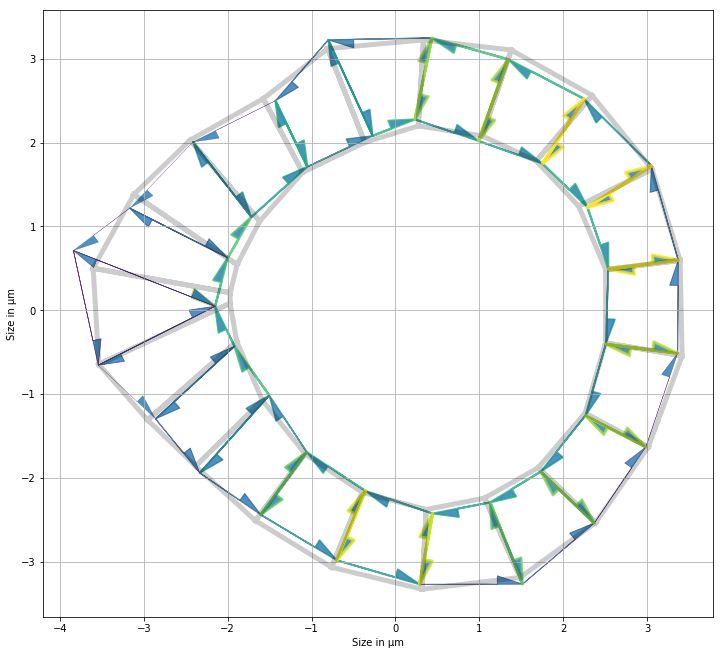

In [246]:
opt_mat_2_cst_organo = to_opt_organo.copy()
opt_mat_2_cst_organo.edge_df.line_tension = prepare_tensions(opt_mat_2_cst_organo, res_2_cst_areas.x[:organo3.Nf*3])
opt_mat_2_cst_organo.face_df.prefered_area = res_2_cst_areas.x[4*organo3.Nf:5*organo3.Nf]
opt_mat_2_cst_organo.settings['prefered_lumen_vol'] = opt_mat_2_cst_organo.settings['lumen_volume'] + res_2_cst_areas.x[-1]
Solver.find_energy_min(opt_mat_2_cst_organo, geom, model)
print_tensions(opt_mat_2_cst_organo, organo3)
print('Distance from th organo to exp organo : ' +
      str(np.sum(np.linalg.norm(_distance(organo3, opt_mat_2_cst_organo), axis=1))))
print('Distance from th tensions to exp tensions : ' +
      str(np.sum(np.linalg.norm(organo3.edge_df.line_tension[:3*organo3.Nf] -
                                opt_mat_2_cst_organo.edge_df.line_tension[:3*organo3.Nf]))))

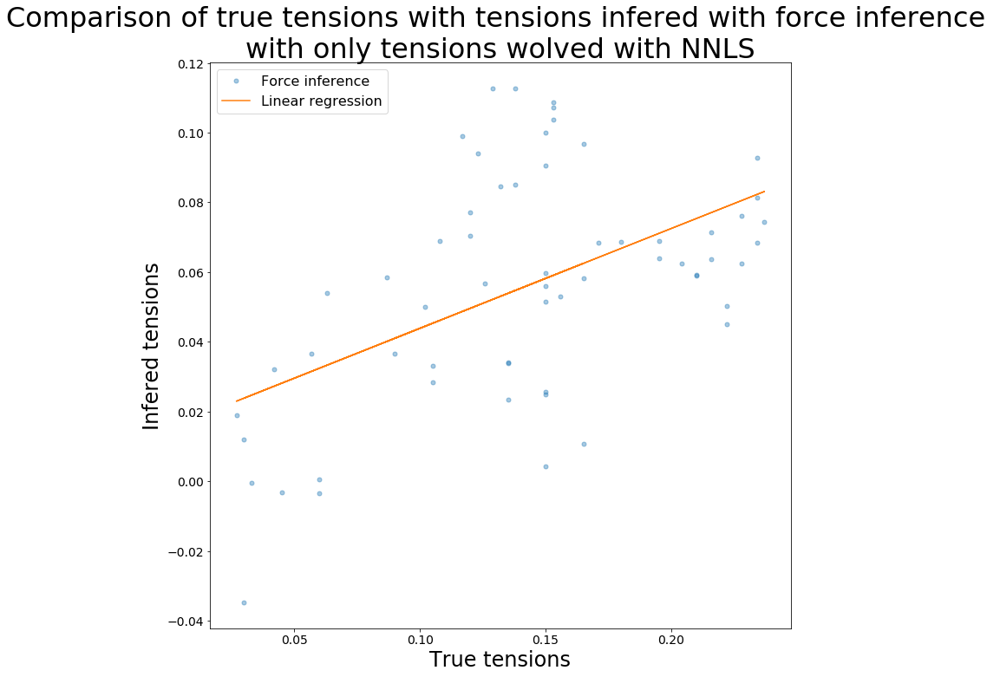

R value : 0.511671238462438 
Standard error : 0.02446348550706336


In [247]:
rendering_results(organo3, organo3.edge_df.line_tension[:3*organo3.Nf],
                  res_2_cst_areas.x[:3*organo3.Nf],
                  'Comparison of true tensions with tensions infered with force inference \n' +
                  'with only tensions wolved with NNLS',
                  'True tensions', 'Infered tensions', ('Force inference', 'Linear regression'))